# DKLGPR MLP Implementation - using Reptile (Model Agnostic Meta Learning)


### Dataset
- Multiple Experiments : 13 experiments trained using Meta Learning

- Data Source: 
`!wget https://www.dropbox.com/s/nicyvttpihzh1cd/Plasmonic_sets_7222021_fixed.npy`

13th included from original DKL model that was implemented
`!wget https://www.dropbox.com/s/nicyvttpihzh1cd/Plasmonic_sets_7222021_fixed.npy` 

### Library Imports

Install Atomai library (if haven't yet)

`!pip install -q --upgrade git+https://github.com/pycroscopy/atomai`

In [10]:
# %%
#@title Library imports
import numpy as np
import matplotlib.pyplot as plt
import glob
import json
from scipy import ndimage, signal, interpolate
import operator
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import gpytorch 
import torch
import atomai as aoi
from sklearn.model_selection import train_test_split

from copy import deepcopy
import copy
from numpy.random import RandomState

from skimage import draw
from skimage.transform import resize
from skimage import color
from skimage.draw import ellipse as circle

import scipy

import os

# from IPython.display import Video
from IPython.core.display import Video
import imageio

# To stop warning logs during movie creation
import imageio.core.util

import torch.nn as nn
from tqdm import tqdm
from typing import Callable

import sys
import logging
logging.basicConfig(format='Date-Time : %(asctime)s : Line No. : %(lineno)d - %(message)s', level = logging.INFO)


In [11]:
torch.cuda.device_count()
device = torch.device("cuda")

In [12]:
! sudo chmod 666 /var/run/docker.sock
!docker stop "neo4jdkl"
!docker rm "neo4jdkl"
!docker run --name neo4jdkl -p7687:7687 -p7474:7474 \
-d -v $HOME/neo4j/data:/data -v $HOME/neo4j/logs:/logs \
-v $HOME/neo4j/import:/var/lib/neo4j/import -v $HOME/neo4j/plugins:/plugins \
--env NEO4J_AUTH=neo4j/test1234 neo4j:latest

neo4jdkl
neo4jdkl
15ad116718e42f1953942b2d306ffe3206194ff902343af3212a92aaf5411991


In [13]:
!cmf init local --path /Intersect/ --git-remote-url https://github.com/gayathri-saranathan/Intersect/ \
--cmf-server-url http://127.0.0.1:80 --neo4j-user neo4j --neo4j-password test1234 \
--neo4j-uri bolt://localhost:7687

Starting cmf init.
Setting 'local-storage' as a default remote.
cmf init complete.


In [14]:
!sudo neo4j stop
!sudo neo4j start

Neo4j is not running.
Directories in use:
home:         /var/lib/neo4j
config:       /etc/neo4j
logs:         /var/log/neo4j
plugins:      /var/lib/neo4j/plugins
import:       /var/lib/neo4j/import
data:         /var/lib/neo4j/data
certificates: /var/lib/neo4j/certificates
licenses:     /var/lib/neo4j/licenses
run:          /var/lib/neo4j/run
Starting Neo4j.
Started neo4j (pid:1733506). It is available at http://127.0.0.1:7474
There may be a short delay until the server is ready.


In [15]:
from cmflib.cmf import Cmf
from ml_metadata.proto import metadata_store_pb2 as mlpb 

graph = True 
#metawriter = Cmf(filename="mlmd", pipeline_name="aifcmf-env")
!rm -rf aldkl_reptile
cmf = Cmf(
    filename="aldkl_reptile",
    pipeline_name="ALDKL_Reptile",
    graph = graph
)

Date-Time : 2023-10-31 23:20:58,117 : Line No. : 103 - MetadataStore with DB connection initialized


*** Note: CMF will check out a new branch in git to commit the metadata files ***
*** The checked out branch is aldkl_reptile. ***


## Clear GPU memory

In [16]:
# Memory dump if (GPU) memory usage is high

import gc
def clear_cache():
    dklgp_new = None
    gc.collect()
    torch.cuda.empty_cache()
    with torch.no_grad():
        torch.cuda.empty_cache()

## Data loading & preprocessing
> Dataset consists of Multiple experiments/task data from: 1 to 13

In [17]:
global loaderfile
loadedfile = np.load("Plasmonic_sets_7222021_fixed.npy", allow_pickle=True).tolist()
loadedfile['13']=np.load("Plasmonic_EELS_FITO0_edgehole_01.npy", allow_pickle=True).tolist()
print(f"The experiments available are {loadedfile.keys()}\nAnd each experiment has the {loadedfile['1'].keys()}")

The experiments available are dict_keys(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13'])
And each experiment has the dict_keys(['image', 'spectrum image', 'energy axis', 'scale'])


In [18]:
pwd

'/home/saranath/Techcon24/AE-DKL'

In [19]:
np.save("Reptile_AEDKL_CMFlogs/loadedfile.npy",loadedfile)

### Data Augmentation

1. Saving the tasks as images
2. Performing Data Augmentations in Albumentations
    - Vertical Flip
    - Horizontal Flip
    - Rotation -40 to 40 degs
    - ZoomBlur
    - Gaussian Noise with mean 0 variance 0.05

In [20]:
from PIL import Image
import matplotlib

!sudo chmod -R 777 AEDKL_CMFlogs/
for idx in loadedfile:
    img = loadedfile[idx]['image']
    matplotlib.image.imsave(f"Reptile_AEDKL_CMFlogs/Task_Images/Task_{idx}_img.jpg", img)

In [21]:
metawriter = cmf.create_context(pipeline_stage ='Task Preprocessing')
metawriter = cmf.create_execution(execution_type="Task Preparation",
                         custom_properties={"number_of_tasks":13})
metawriter = cmf.log_dataset("Plasmonic_EELS_FITO0_edgehole_01.npy","input")
metawriter = cmf.log_dataset("Plasmonic_sets_7222021_fixed.npy","input")

_ = cmf.log_dataset("Reptile_AEDKL_CMFlogs/loadedfile.npy","output",)
_ = cmf.log_dataset("Reptile_AEDKL_CMFlogs/Task_Images","output",)

⠼ Checking graphges from the workspacekspace
ERROR:  output 'Plasmonic_EELS_FITO0_edgehole_01.npy' is already tracked by SCM (e.g. Git).
    You can remove it from Git, then add to DVC.
        To stop tracking from Git:
            git rm -r --cached 'Plasmonic_EELS_FITO0_edgehole_01.npy'
            git commit -m "stop tracking Plasmonic_EELS_FITO0_edgehole_01.npy" 
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace


In [22]:
import torchvision.transforms as transforms #Transformation 
from torchvision.utils import save_image
import albumentations as A
import torchvision
import cv2

transforms = A.ReplayCompose([
    A.Rotate(limit=40,p=0.9,border_mode=cv2.BORDER_CONSTANT),
    A.GaussNoise(var_limit=0.05,mean=0,p=0.3),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.1),
    A.OneOf([
        A.Blur(blur_limit=3,p=0.5),
        A.ColorJitter(p=0.5),  
    ],p=1.0)
])

def augment_spectrum(augmentations, spectrum):
    for img in augmentations['replay']['transforms']:
        if img['__class_fullname__']=='VerticalFlip':
            if img['applied']==True:
                logging.info(f"Vertical Flip {img['applied']}")
                augmented_spectrum = np.flip(spectrum,axis=0)
        elif img['__class_fullname__']=='HorizontalFlip':
            if img['applied']==True:
                logging.info(f"Horizontal Flip {img['applied']}")
                augmented_spectrum = np.flip(spectrum,axis=1)
        elif img['__class_fullname__']=='Rotate':
            if img['applied']==True:
                logging.info(f"Angle of Rotation {img['params']['angle']}")
                augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
        elif img['__class_fullname__']=='ZoomBlur':
            if img['applied']==True:
                logging.info(f"Zoom Blue Applied")
                augmented_spectrum = np.array(spectrum)
        elif img['__class_fullname__']=='GaussNoise':
            if img['applied']==True:
                logging.info(f"GN Applied")
                augmented_spectrum = np.array(spectrum)
        else:
            augmented_spectrum = np.array(spectrum)
    return augmented_spectrum

In [23]:
clear_cache()

### Data Augmentation Visualization Example

/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:21:33,700 : Line No. : 30 - Angle of Rotation -17.906949897554814
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:21:40,437 : Line No. : 26 - Horizontal Flip True
Date-Time : 2023-10-31 23:21:40,735 : Line No. : 30 - Angle of Rotation -4.885979670468892
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params dep

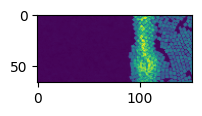

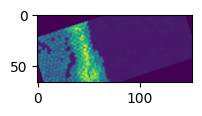

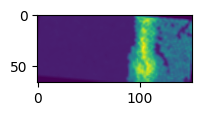

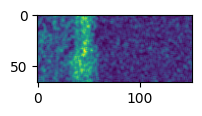

In [24]:
images_list = [loadedfile[idx]['image'] for idx in loadedfile]
image = loadedfile['2']['image']
spectrum = np.array(loadedfile['2']['spectrum image'])

image_list = [image]
spectrum_list=[spectrum]
for idx in range(3):
    augmentations = transforms(image=image)
    augmented_img = augmentations['image']
    augmented_spectr = augment_spectrum(augmentations,spectrum)
    image_list.append(augmented_img)
    spectrum_list.append(augmented_spectr)

for img in image_list:
    plt.figure(figsize=(2,2))
    plt.imshow(img)
    plt.show(block=False)

### Display HAADF and Spectrum of each experiment

In [25]:

def DisplayAverageData(task,n_task,figsize = (15,5), scalebar = 15):
  img = task['image']
  specim = task['spectrum image']
  e_ax = task['energy axis']
  imscale = task['scale']

  fig,ax = plt.subplots(1,2,figsize=figsize)

  ax[0].imshow(img)#, cmap = 'gray')

  scalebar = 15

  yy,xx = img.shape[0], img.shape[1]
  xfrac, yfrac = 0.02, 0.85
  p1,p2 = xfrac*xx, yfrac*yy
  length = scalebar/imscale

  ax[0].add_patch(patches.Rectangle((p1,p2), length, length/7, color = 'r', ec = 'k', lw = 1))
  length

  ax[0].set_title(f"HAADF for Task {n_task}", fontsize = 22, weight = 'bold');

  avg_spec = np.mean(specim,axis=(0,1))
  # plt.hist(avg_spec)
  ax[1].plot(e_ax, avg_spec)

  ax[1].set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
  ax[1].set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
  ax[1].tick_params(labelsize = 20, length = 8, width = 3)


  for axis in ['top','bottom','left','right']:
    ax[1].spines[axis].set_linewidth(3)

  ax[1].axhline(0, c='k')

  plt.setp(ax[0],xticks=[], yticks=[])

### Preparing data for ML/DL


**aoi.utils.get_coord_grid()** --> Generate square coordinate grid for every image in a stack, returns coordinates in dictionary format that can be used as input to extract subimages

**extract_patches_and_spectra** --> Extracts image patches and associated spectra corresponding to center of the parch from hyperspectral data

hdata:specim --> 3D or 4D hyperspectral data

coordinates: from get_coord_grid() function

window_size=16

avg_pool: Kernel size and stride for avg pooling in spectral dimension

@https://atomai.readthedocs.io/en/latest/_modules/atomai/utils/img.html#


torch.nn.functional : All the required functions
https://pytorch.org/docs/stable/nn.functional.html


**extract_subimages()** --> extracts subimages centered at certain atom class/type/patch
input: img data, coordinates, and windwo_size=16

In [26]:
device = torch.device('cuda:8') if torch.cuda.is_available() else 'cpu'
device

device(type='cuda', index=8)

### Sampling the Tasks/Experiments for Reptile

In [27]:
# %%
task_ind = {}
img = {}
specim = {}
e_ax = {}
imscale = {}
coordinates = {}
img_patches = {}
specs = {}
coords = {}

window_size       = 16              # select window size for geometric feature length scales
spectralavg       = 32              # average spectral channels (reduces # of channels significantly --> easier to process! usually don't need 2048 ch, a few hundred I think are sufficient)


@torch.no_grad()
def task_t(task,data_augmentation=True):
    
    task_ind[task] = deepcopy(loadedfile.get(str(task)))
    if task_ind[task]['image'].shape[0]<window_size:
        print(f"Task {task} --> Padding Triggered")
        task_ind[task]['image'] = np.resize(task_ind[task]['image'],(window_size,task_ind[task]['image'].shape[1]))
        task_ind[task]['spectrum image'] = np.resize(task_ind[task]['spectrum image'],(window_size,task_ind[task]['spectrum image'].shape[1],task_ind[task]['spectrum image'].shape[2]))
    img[task] = copy.copy(task_ind[task]['image'])
    specim[task] = copy.copy(task_ind[task]['spectrum image'])
    e_ax[task] = task_ind[task]['energy axis']
    imscale[task] = task_ind[task]['scale']
    temp_specim = deepcopy(specim[task])
    if data_augmentation == True:
        augmentations = transforms(image=img[task])
        augmented_img = augmentations['image']
        augmented_spectr = augment_spectrum(augmentations,specim[task])
        img[task] = augmented_img
        specim[task] = augmented_spectr
        task_ind[task]['image'] = augmented_img
        task_ind[task]['specim'] = augmented_spectr
        
    # DisplayAverageData(task_ind[task],n_task=task,figsize = (20,5),scalebar = 15)
    
    #Computing Patch 
    coordinates[task] = aoi.utils.get_coord_grid(img[task], step = 1, return_dict=False)
    print("specim[task]", type(specim[task]))
    print("img[task]", type(img[task]))
    print("coordinates[task]", type(coordinates[task]))

    torch.set_default_device('cpu')
    img_patches[task], specs[task], coords[task] = aoi.utils.extract_patches_and_spectra(specim[task],
                                                                     img[task],
                                                                     coordinates=coordinates[task],
                                                                     window_size=window_size,
                                                                    #  band=[0, 2], # average over these slices and use as "structural data"
                                                                     avg_pool=spectralavg)
    torch.set_default_device('cuda')
    
    full_img = np.copy(img[task])
    indices = np.copy(coords[task])
    features = np.copy(img_patches[task])
    targets = np.copy(specs[task])
    scale = np.copy(imscale[task])
    e_scale = np.copy(e_ax[task][::spectralavg])

    # Match the energy scale lengths (this only occurs from the spectral averaging in previous step)
    while e_scale.shape[0] > targets[0].shape[0]:
        e_scale = e_scale[:-1]
    
    #Preprocess the features and target
    norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
    features, targets = norm_(features), norm_(targets)
    
    # Reduce the size of spectra via average pooling (for vector-DKL, the vector size should typically be < 200)
    REDUCE = 1
    if targets.shape[1] < window_size:
        print(f"For task {task} : target size is {targets.shape}...\nResizing....")
        targets=np.resize(targets,(targets.shape[0],window_size))
    y = torch.from_numpy(targets)[:, None]
    y = torch.nn.functional.avg_pool1d(y, 1, 1).squeeze().numpy()

    # Flatten image data
    n, d1, d2 = features.shape
    X = features.reshape(n, d1*d2)

    # Transpose so that a spectrum length corresponds to a batch dimension in GP
    y = y.T
    y = np.resize(y,(46,y.shape[1]))

    e_reduced = np.copy(e_scale[::REDUCE])
    while e_reduced.shape[0] > y.shape[0]:
        e_reduced = e_reduced[:-1]
    
    X = torch.tensor(X)
    y = torch.tensor(y)
    
    e_reduced = torch.tensor(e_reduced)
    full_img = torch.tensor(full_img)
    
    
    return X,y,e_reduced,full_img,specim[task],indices

## Performing Training using DKLGP Model
This function is for training new task sampling

In [28]:
from statistics import mean
def perform_k_training_steps_train_and_test(model,X,y,e_reduced,nth_task:int,k_shots:int,batch_size:int=32,training_cycle:int=1):
    logging.info(f"Training the model with new task dataset of size {X.shape}, with Training Cycle {training_cycle} | Batch size {batch_size}")
    test_loss = torch.nn.MSELoss()
    train_size = int(0.8 * len(X))
    test_size = len(X) - train_size
    
    train_idx = torch.randperm(X.shape[0])[:train_size]
    temp_test_idx = [test_idx for test_idx in range(X.shape[0]) if test_idx not in train_idx]
    random.shuffle(temp_test_idx)
    test_idx = torch.tensor(temp_test_idx)
    
    X_train, y_train = torch.tensor(X[train_idx,:]) , torch.tensor(y[:,train_idx])
    X_test, y_test = torch.tensor(X[test_idx,:]) , torch.tensor(y[:,test_idx])
    e_reduced = torch.tensor(e_reduced.reshape(-1,1))

    logging.info(f"Train Size : {train_size} and Test Size : {test_size}")
    print(f"Train Size : {train_size} and Test Size : {test_size}")
    print(f" Number of batches: {k_shots*X_train.shape[0]/batch_size}")
    logging.info(f" Number of batches: {k_shots*X_train.shape[0]/batch_size}")
    
    mll_loss = []
    train_loss = []
    epoch = []
    for epochs in range(training_cycle,training_cycle+1,5):
        training_loss = []
        epoch.append(epochs)
        model_=deepcopy(model)
        for batches in range((k_shots*X_train.shape[0]//batch_size)):
            x_batch = X_train[batch_size*batches:(batch_size*batches)+batch_size,:]
            ground_truth = y_train[:,batch_size*batches:(batch_size*batches)+batch_size]
            model_.fit(x_batch,ground_truth,training_cycles=epochs,lr=1e-4)
            mean, var = deepcopy(model_).predict(x_batch,batch_size=len(x_batch))
            mean, var = mean.T, var.T
            predicted_spectrum = torch.mean(torch.tensor(mean[:,0:-1]), 0, True).reshape(-1,1)
            predicted_uncertainity = torch.mean(torch.tensor(var[:,0:-1]), 0, True).reshape(-1,1)
            measured_spectrum = torch.mean(torch.tensor(ground_truth.T[:,0:-1]), 0, True).reshape(-1,1)
            predicted_spectrum = torch.autograd.Variable(predicted_spectrum,requires_grad=True)
            measured_spectrum = torch.autograd.Variable(measured_spectrum,requires_grad=True)
            mse_loss = test_loss(measured_spectrum,predicted_spectrum)
            training_loss.append(mse_loss.item())
            clear_cache()
        
        
        mll_loss.append(model_.train_loss[-1])
        train_loss.append(np.mean(np.array(training_loss)))
        #training_loss = model.mse_loss
        print(mll_loss)
        print(f" Training MSE loss : {len(training_loss)} | Training MLL Loss : {len(mll_loss)} Training Epochs : {int(k_shots*X_train.shape[0]/batch_size)*training_cycle}")

        plt.figure(figsize=(20,8))
        plt.title(f"number of Epochs {epochs}")#{k_shots*X_train.shape[0]/batch_size} | number of epochs/batch {training_cycle}")
        plt.plot(epoch,mll_loss,label='MLL Loss')
        #plt.plot(range(len(training_loss)),training_loss,label='MSE Loss')
        plt.xlabel('Training Batches')
        plt.ylabel('Loss')
        plt.legend()
        plt.show(block=False)

        plt.figure(figsize=(20,8))
        plt.title(f"number of epochs {epochs}")#{k_shots*X_train.shape[0]/batch_size} | number of epochs/batch {training_cycle}")
        plt.plot(epoch,train_loss,label='MSE Loss')
        plt.xlabel('Training Epochs')
        plt.ylabel('MSE Loss')
        plt.legend()
        plt.show(block=False)

    
    #Script for Testing 
    '''
    for test_batch in range((k_shots*X_test.shape[0]//batch_size)): 
        x_test = X_test[test_batch*batch_size:(test_batch*batch_size)+batch_size,:]
        y_tes = y_test[:,test_batch*batch_size:(test_batch*batch_size)+batch_size]
        print(x_test.dtype,x_test.device)
        mean,var = deepcopy(model).predict(x_test,batch_size=len(x_test))
        mean, var = mean.T, var.T
        predicted_spectrum = torch.mean(torch.tensor(mean[:,0:-1]), 0, True).reshape(-1,1)
        predicted_uncertainity = torch.mean(torch.tensor(var[:,0:-1]), 0, True).reshape(-1,1)
        measured_spectrum = torch.mean(torch.tensor(y_tes.T[:,0:-1]), 0, True).reshape(-1,1)
        #predicted_spectrum = torch.autograd.Variable(predicted_spectrum,requires_grad=True)
        #measured_spectrum = torch.autograd.Variable(measured_spectrum,requires_grad=True)
        print(f"Test Loss : {test_loss(measured_spectrum,predicted_spectrum)} |\
        Epoch : {test_batch} | Task : {nth_task}")
        if test_batch%5==4:
            break
        plt.figure(figsize=(15,8))
        k1,k2 = 0,-1
        plt.plot(deepcopy(e_reduced[:-1]).detach().cpu().numpy(),deepcopy(measured_spectrum).detach().cpu().numpy(), linewidth=6, c = 'blue', label=f"Ground Truth | Task : {nth_task} | Test batch : {test_batch}", zorder=0)
        plt.plot(deepcopy(e_reduced[:-1]).detach().cpu().numpy(),deepcopy(predicted_spectrum).detach().cpu().numpy(), linewidth=4, c='crimson', label=f"Task Prediction | Task : {nth_task} | Test batch : {test_batch}", zorder=1)
        plt.xlabel('Energy loss (eV)', fontsize = 15, labelpad = 15, weight = 'bold')
        plt.ylabel('Intensity (a.u.)', fontsize = 15, weight = 'bold')
        plt.legend(loc='best')
    '''
    plt.show(block=False)
    
    return model_,mll_loss,train_loss

## Reptile Model :
Uses the MLP from the DKLGPR model to train on multiple experiment, to provide faster convergence.

The version of Reptile used below is batched version with 3 main loops:
1. Outer most - Epoch loop 
2. Middle Inner - Task loop for iterating across 1-11 task with data augmentation
3. Innermost loop - batch training or each individual task

> Batch Size = 32

> Number of Batches = k_shots*X.shape[0]/Batch_size # since the value of X.shape[0] (samples/patches) from each task varies, the number of batches also varies for different tasks.

> Training Epoch for every batch : 1 Training Epoch / Batch

In [29]:
# %%
def batch_training_each_task(model,nth_task,X,y,e_reduced,k_shots:int=1,batch_size:int=32,training_cycle:int=1):
    logging.info(f"Training the model with the {nth_task} dataset of size {X.shape}, with Training Cycle {training_cycle} | Batch size {batch_size}")

    
    train_size = int(0.8 * len(X))
    test_size = len(X) - train_size
    
    train_idx = torch.randperm(X.shape[0])[:train_size]
    temp_test_idx = [test_idx for test_idx in range(X.shape[0]) if test_idx not in train_idx]
    random.shuffle(temp_test_idx)
    test_idx = torch.tensor(temp_test_idx)
    
    X_train, y_train = torch.tensor(X[train_idx,:]) , torch.tensor(y[:,train_idx])
    X_test, y_test = torch.tensor(X[test_idx,:]) , torch.tensor(y[:,test_idx])
    e_reduced = torch.tensor(e_reduced.reshape(-1,1))

    logging.info(f"Train Size : {train_size} and Test Size : {test_size}")
    print(f"Train Size : {train_size} and Test Size : {test_size}")
    print(f" Number of batches: {k_shots*X_train.shape[0]/batch_size}")
    logging.info(f" Number of batches: {k_shots*X_train.shape[0]/batch_size}")
    
    
    for batches in range((k_shots*X_train.shape[0]//batch_size)):

        x_batch = X_train[batch_size*batches:(batch_size*batches)+batch_size,:]
        ground_truth = y_train[:,batch_size*batches:(batch_size*batches)+batch_size]
        model.fit(x_batch,ground_truth,training_cycles=training_cycle,lr=1e-2)
            
    for test_batch in range((k_shots*X_test.shape[0]//batch_size)): 
        x_test = X_test[test_batch*batch_size:(test_batch*batch_size)+batch_size,:]
        y_tes = y_test[:,test_batch*batch_size:(test_batch*batch_size)+batch_size]
        
        mean,var = deepcopy(model).predict(x_test,batch_size=len(x_test))
        mean, var = mean.T, var.T
        predicted_spectrum = torch.mean(torch.tensor(mean[:,0:-1]), 0).reshape(-1,1)
        predicted_uncertainity = torch.mean(torch.tensor(var[:,0:-1]), 0).reshape(-1,1)
        measured_spectrum = torch.mean(torch.tensor(y_tes.T[:,0:-1]), 0).reshape(-1,1)
        predicted_spectrum = torch.autograd.Variable(predicted_spectrum,requires_grad=False)
        measured_spectrum = torch.autograd.Variable(measured_spectrum,requires_grad=False)
        if test_batch%4==1:
            break
        # Uncomment to Enable Plotting, Commenting to lessen the file size for Git upload"
        '''
        plt.figure(figsize=(15,8))
        k1,k2 = 0,-1
        plt.plot(deepcopy(e_reduced[:-1]).detach().cpu().numpy(),deepcopy(measured_spectrum).detach().cpu().numpy(), linewidth=6, c = 'blue', label=f"Ground Truth | Task : {nth_task} | Test batch : {test_batch}", zorder=0)
        plt.plot(deepcopy(e_reduced[:-1]).detach().cpu().numpy(),deepcopy(predicted_spectrum).detach().cpu().numpy(), linewidth=4, c='crimson', label=f"Task Prediction | Task : {nth_task} | Test batch : {test_batch}", zorder=1)
        plt.xlabel('Energy loss (eV)', fontsize = 15, labelpad = 15, weight = 'bold')
        plt.ylabel('Intensity (a.u.)', fontsize = 15, weight = 'bold')
        
        plt.legend(loc='best')

    #plt.show(block=False)
    '''
    return model.gp_model.feature_extractor.state_dict()

In [39]:
# %%

def train_model(model,X_train,y_train,batch_size:int,k_shots:int,batch_count:int,training_cycle:int,num_of_batches:int):
    for batches in range((k_shots*X_train.shape[0]//batch_size)):
            x_batch = X_train[batch_size*batches:(batch_size*batches)+batch_size,:]
            ground_truth = y_train[:,batch_size*batches:(batch_size*batches)+batch_size]
            batch_count+=1
            model.fit(x_batch,ground_truth,training_cycles=training_cycle,lr=1e-2)
            if batch_count==num_of_batches:
                break
            print(f"Model training batch {batch_count}")

    return model, batch_count
    
def batch_training_each_task(model,nth_task,X,y,e_reduced,num_of_batches:int=10,k_shots:int=1,batch_size:int=32,training_cycle:int=1):
    logging.info(f"Training the model with the {nth_task} dataset of size {X.shape}, with Training Cycle {training_cycle} | Batch size {batch_size}")

    
    train_size = int(0.8 * len(X))
    test_size = len(X) - train_size
    
    train_idx = torch.randperm(X.shape[0])[:train_size]
    temp_test_idx = [test_idx for test_idx in range(X.shape[0]) if test_idx not in train_idx]
    random.shuffle(temp_test_idx)
    test_idx = torch.tensor(temp_test_idx)
    
    X_train, y_train = torch.tensor(X[train_idx,:]) , torch.tensor(y[:,train_idx])
    X_test, y_test = torch.tensor(X[test_idx,:]) , torch.tensor(y[:,test_idx])
    e_reduced = torch.tensor(e_reduced.reshape(-1,1))

    logging.info(f"Train Size : {train_size} and Test Size : {test_size}")
    print(f"Train Size : {train_size} and Test Size : {test_size}")
    print(f" Number of batches: {k_shots*X_train.shape[0]/batch_size}")
    logging.info(f" Number of batches: {k_shots*X_train.shape[0]/batch_size}")

    batch_count=0

    if num_of_batches<=(X_train.shape[0]//batch_size):
        print(f"Batch size constrain satisfied")
        model,batch_count = train_model(model,X_train,y_train,batch_size,k_shots,batch_count,training_cycle,num_of_batches)
        
    else:
        while batch_count<num_of_batches:
            model,batch_count = train_model(model,X_train,y_train,batch_size,k_shots,batch_count,training_cycle,num_of_batches)
            X,y,e_reduced,full_img,specim,indices = task_t(nth_task)
            X_train, y_train = torch.tensor(X[train_idx,:]) , torch.tensor(y[:,train_idx])
            e_reduced = torch.tensor(e_reduced.reshape(-1,1))
            print(f"Generated new task with augmentation for batch training since {batch_count}")
        
            
    for test_batch in range((k_shots*X_test.shape[0]//batch_size)): 
        x_test = X_test[test_batch*batch_size:(test_batch*batch_size)+batch_size,:]
        y_tes = y_test[:,test_batch*batch_size:(test_batch*batch_size)+batch_size]
        
        mean,var = deepcopy(model).predict(x_test,batch_size=len(x_test))
        mean, var = mean.T, var.T
        predicted_spectrum = torch.mean(torch.tensor(mean[:,0:-1]), 0).reshape(-1,1)
        predicted_uncertainity = torch.mean(torch.tensor(var[:,0:-1]), 0).reshape(-1,1)
        measured_spectrum = torch.mean(torch.tensor(y_tes.T[:,0:-1]), 0).reshape(-1,1)
        predicted_spectrum = torch.autograd.Variable(predicted_spectrum,requires_grad=False)
        measured_spectrum = torch.autograd.Variable(measured_spectrum,requires_grad=False)
        if test_batch%4==1:
            break
        # Uncomment to Enable Plotting, Commenting to lessen the file size for Git upload"
        '''
        plt.figure(figsize=(15,8))
        k1,k2 = 0,-1
        plt.plot(deepcopy(e_reduced[:-1]).detach().cpu().numpy(),deepcopy(measured_spectrum).detach().cpu().numpy(), linewidth=6, c = 'blue', label=f"Ground Truth | Task : {nth_task} | Test batch : {test_batch}", zorder=0)
        plt.plot(deepcopy(e_reduced[:-1]).detach().cpu().numpy(),deepcopy(predicted_spectrum).detach().cpu().numpy(), linewidth=4, c='crimson', label=f"Task Prediction | Task : {nth_task} | Test batch : {test_batch}", zorder=1)
        plt.xlabel('Energy loss (eV)', fontsize = 15, labelpad = 15, weight = 'bold')
        plt.ylabel('Intensity (a.u.)', fontsize = 15, weight = 'bold')
        
        plt.legend(loc='best')

    #plt.show(block=False)
    '''
    return model.gp_model.feature_extractor.state_dict(),model

In [40]:
import atomai
import random
import dklgpreg_modified as dklgpreg
import gptrain_modified

def Reptile_MLP_DA(model_fc,task_t,batch_training_each_task,k_shots=1,training_cycle=1,nb_iterations=5,epsilon:int=0.01):
    task_model_dicts={sampled_task:None for sampled_task in range(1,11)}
    datadim = 256
    embedim = 2
    print(f'Reptile Model with number of Epochs {nb_iterations}')
    torch.save(model_fc,f"Reptile_AEDKL_CMFlogs/Reptile_training/base_model_0_reptile_itr.pt")
    metawriter = cmf.create_context(pipeline_stage = f'Reptile Training')
    
    for _ in tqdm(range(1,nb_iterations)):
        logging.info('Original Model Parameters')
        logging.info(f"{list(model_fc.parameters())[-1]}")
        print('Original Model Parameters')
        print(f"{list(model_fc.parameters())[-1]}")
        sum_state_dict = deepcopy(model_fc).state_dict()
        metawriter = cmf.create_execution(execution_type = "Task Sampling",
                                          custom_properties = {"Sampling_function": task_t,
                                                               "Number_of_tasks":10,
                                                               "Augmentations": True,
                                                               "Augmentation_dunction":augment_spectrum,
                                                               "window_size":16,
                                                               "spectral_avg":32})
        
        if _%5==10:
            print(f"Step {_} currently executing ....")
        for task_idx in task_model_dicts:
            task = task_t(task_idx)
            torch.save(task,f"Reptile_AEDKL_CMFlogs/Reptile_training/task{task_idx}_reptile_{_}itr.pt")
            metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Reptile_training/task{task_idx}_reptile_{_}itr.pt","output")
        metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/loadedfile.npy","input")
        
        for task_idx in task_model_dicts:
            task = task_t(task_idx)
            torch.set_default_device('cuda')
            X,y,e_reduced,full_img,specim,indices = task
            metawriter = cmf.create_execution(execution_type = f"Individual Model training: Task {task_idx} Reptile iteration {_}",
                                             custom_properties = {"batch_training": batch_training_each_task,
                                                                  "number_of_batches":16,
                                                                  "nth_task":task_idx,
                                                                  "Learning_rate":1e-2,
                                                                  "Reptile_iteration":_,
                                                                  "training_cycle":training_cycle})
            temp_model = dklgpreg.dklGPR(datadim,embedim,hidden_dim=[1000,500,50],feature_extract=deepcopy(model_fc))
            task_model_dicts[task_idx],temp = batch_training_each_task(deepcopy(temp_model),nth_task=task_idx,\
                                                             X=X,y=y,e_reduced=e_reduced,num_of_batches=16,k_shots=1,
                                                             batch_size=16,training_cycle=training_cycle)
            torch.save(temp,f"Reptile_AEDKL_CMFlogs/Reptile_training/model_task{task_idx}_reptile_{_}itr.pt")
            metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Reptile_training/model_task{task_idx}_reptile_{_}itr.pt",event="output")
            metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Reptile_training/task{task_idx}_reptile_{_}itr.pt","input")
            metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Reptile_training/base_model_{_-1}_reptile_itr.pt",event="input",
                                      model_framework="PyTorch",model_type="BaseModel",model_name=f"Reptile_{_-1}metamodel")
            
            logging.info(f'New Model Parameters for task {task_idx}')
            logging.info(f"{list(task_model_dicts[task_idx])[-1]}")
        ## Reptile update step for batch training: 
    
        with torch.no_grad():
            metawriter = cmf.create_execution(execution_type = f"Reptile Update {_} nb_iteration",
                                             custom_properties = {"epsion":epsilon,
                                                                 "training_cycle":training_cycle,
                                                                 "base_model_param":sum_state_dict})
            for layer in sum_state_dict:
                temp_layer_sum = torch.zeros(sum_state_dict[layer].shape)
                for tasks in task_model_dicts:
                    task_model_dicts[tasks][layer] =torch.tensor(task_model_dicts[tasks][layer])
                    sum_state_dict[layer] = torch.tensor(sum_state_dict[layer])
                    temp_layer_sum += (task_model_dicts[tasks][layer]- sum_state_dict[layer])
                sum_state_dict[layer].data = temp_layer_sum
            print("Updated State dict: ",sum_state_dict['linear4.bias'])
            
            for initial_param, sum_layer in zip(model_fc.parameters(),sum_state_dict):
                initial_param.data = initial_param.data + epsilon*(1/training_cycle)*sum_state_dict[sum_layer].data

            torch.save(model_fc,f"Reptile_AEDKL_CMFlogs/Reptile_training/base_model_{_}_reptile_itr.pt")
            metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Reptile_training/base_model_{_}_reptile_itr.pt",event="output",
                                      model_framework="PyTorch",model_type="BaseModel",model_name=f"Reptile_{_}metamodel")
            for tasks in task_model_dicts:
                metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Reptile_training/model_task{tasks}_reptile_{_}itr.pt",event="input")
 
        print('Model Parameters after Reptile')
        print(f"{list(model_fc.parameters())[-1]}")

    print('Reptile Update Complete')
    return model_fc

### Reptile Execution

In [41]:
from atomai.nets import fcFeatureExtractor
datadim = 256
embedim = 2
torch.set_default_device("cuda")
hidden_dim = [1000,500,50]
model_fc_ = fcFeatureExtractor(feat_dim=256,embedim=2,**{'hidden_dim':hidden_dim},device='cuda')
model_fc_

fcFeatureExtractor(
  (linear1): Linear(in_features=256, out_features=1000, bias=True)
  (relu1): ReLU()
  (linear2): Linear(in_features=1000, out_features=500, bias=True)
  (relu2): ReLU()
  (linear3): Linear(in_features=500, out_features=50, bias=True)
  (relu3): ReLU()
  (linear4): Linear(in_features=50, out_features=2, bias=True)
)

In [42]:
reptile_mlp_dp = Reptile_MLP_DA(model_fc_,task_t,batch_training_each_task,k_shots=1,training_cycle=1,nb_iterations=4,epsilon=7.24992231665174e-05)

Reptile Model with number of Epochs 4


  0%|                                                                                               | 0/3 [00:00<?, ?it/s]Date-Time : 2023-10-31 23:29:17,916 : Line No. : 15 - Original Model Parameters
Date-Time : 2023-10-31 23:29:17,921 : Line No. : 16 - Parameter containing:
tensor([-0.0336, -0.0862], requires_grad=True)


Original Model Parameters
Parameter containing:
tensor([-0.0336, -0.0862], requires_grad=True)


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:29:18,432 : Line No. : 30 - Angle of Rotation -23.590410640918414
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠴ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:29:26,170 : Line No. : 30 - Angle of Rotation 24.70259333792862
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:29:32,894 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:29:33,31

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠼ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:29:46,485 : Line No. : 30 - Angle of Rotation -35.64482471565191
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:29:47,410 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:29:53,755 : Line No. : 30 - Angle of Rotation 30.677671207487776
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:00,615 : Line No. : 30 - Angle of Rotation -19.924036182617854
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:30:01,116 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:30:01,

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace


Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:06,311 : Line No. : 30 - Angle of Rotation 25.260425606038353
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:30:06,469 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠧ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:10,802 : Line No. : 30 - Angle of Rotation 29.73716139783241
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:30:11,106 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:30:11,11

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠧ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:17,162 : Line No. : 30 - Angle of Rotation 6.678193282198741
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:30:20,327 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠼ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:30,254 : Line No. : 30 - Angle of Rotation -9.579070975469193
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:30:31,538 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:30:31,7

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:37,796 : Line No. : 30 - Angle of Rotation -9.737914586794744
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:30:48,428 : Line No. : 30 - Angle of Rotation 1.9041054173192933
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:30:50,444 : Line No. : 16 - Training the model with the 1 dataset of size torch.Size([640, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:30:51,103 : Line No. : 31 - Train Size : 512 and Test Size : 128


Train Size : 512 and Test Size : 128
 Number of batches: 32.0


Date-Time : 2023-10-31 23:30:51,105 : Line No. : 34 -  Number of batches: 32.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 39.0202
Model training batch 1
Epoch 1/1 ... Training loss: 38.9055
Model training batch 2
Epoch 1/1 ... Training loss: 38.424
Model training batch 3
Epoch 1/1 ... Training loss: 38.2514
Model training batch 4
Epoch 1/1 ... Training loss: 38.0588
Model training batch 5
Epoch 1/1 ... Training loss: 37.891
Model training batch 6
Epoch 1/1 ... Training loss: 37.7923
Model training batch 7
Epoch 1/1 ... Training loss: 37.565
Model training batch 8
Epoch 1/1 ... Training loss: 37.4425
Model training batch 9
Epoch 1/1 ... Training loss: 37.2521
Model training batch 10
Epoch 1/1 ... Training loss: 37.0407
Model training batch 11
Epoch 1/1 ... Training loss: 36.8203
Model training batch 12
Epoch 1/1 ... Training loss: 36.597
Model training batch 13
Epoch 1/1 ... Training loss: 36.3758
Model training batch 14
Epoch 1/1 ... Training loss: 36.1608
Model training batch 15
Epoch 1/1 ... Training loss: 35.9601


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:31:13,824 : Line No. : 57 - New Model Parameters for task 1
Date-Time : 2023-10-31 23:31:13,825 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:31:26,999 : Line No. : 16 - Training the model with the 2 dataset of size torch.Size([6987, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:31:27,397 : Line No. : 31 - Train Size : 5589 and Test Size : 1398


Train Size : 5589 and Test Size : 1398
 Number of batches: 349.3125


Date-Time : 2023-10-31 23:31:27,399 : Line No. : 34 -  Number of batches: 349.3125


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.1679
Model training batch 1
Epoch 1/1 ... Training loss: 39.5137
Model training batch 2
Epoch 1/1 ... Training loss: 38.9705
Model training batch 3
Epoch 1/1 ... Training loss: 38.8176
Model training batch 4
Epoch 1/1 ... Training loss: 38.7272
Model training batch 5
Epoch 1/1 ... Training loss: 38.7405
Model training batch 6
Epoch 1/1 ... Training loss: 38.6261
Model training batch 7
Epoch 1/1 ... Training loss: 38.4331
Model training batch 8
Epoch 1/1 ... Training loss: 38.2193
Model training batch 9
Epoch 1/1 ... Training loss: 37.9977
Model training batch 10
Epoch 1/1 ... Training loss: 37.7457
Model training batch 11
Epoch 1/1 ... Training loss: 37.5053
Model training batch 12
Epoch 1/1 ... Training loss: 37.2991
Model training batch 13
Epoch 1/1 ... Training loss: 37.1111
Model training batch 14
Epoch 1/1 ... Training loss: 36.9379
Model training batch 15
Epoch 1/1 ... Training loss: 36.8018


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:31:42,371 : Line No. : 57 - New Model Parameters for task 2
Date-Time : 2023-10-31 23:31:42,373 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:31:44,494 : Line No. : 16 - Training the model with the 3 dataset of size torch.Size([2200, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:31:45,076 : Line No. : 31 - Train Size : 1760 and Test Size : 440


Train Size : 1760 and Test Size : 440
 Number of batches: 110.0


Date-Time : 2023-10-31 23:31:45,078 : Line No. : 34 -  Number of batches: 110.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.3652
Model training batch 1
Epoch 1/1 ... Training loss: 39.2868
Model training batch 2
Epoch 1/1 ... Training loss: 39.5918
Model training batch 3
Epoch 1/1 ... Training loss: 38.966
Model training batch 4
Epoch 1/1 ... Training loss: 38.7218
Model training batch 5
Epoch 1/1 ... Training loss: 38.5283
Model training batch 6
Epoch 1/1 ... Training loss: 38.3518
Model training batch 7
Epoch 1/1 ... Training loss: 38.1852
Model training batch 8
Epoch 1/1 ... Training loss: 38.0268
Model training batch 9
Epoch 1/1 ... Training loss: 37.8775
Model training batch 10
Epoch 1/1 ... Training loss: 37.7387
Model training batch 11
Epoch 1/1 ... Training loss: 37.6165
Model training batch 12
Epoch 1/1 ... Training loss: 37.3582
Model training batch 13
Epoch 1/1 ... Training loss: 37.1932
Model training batch 14
Epoch 1/1 ... Training loss: 36.9856
Model training batch 15
Epoch 1/1 ... Training loss: 36.7777


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:31:59,156 : Line No. : 57 - New Model Parameters for task 3
Date-Time : 2023-10-31 23:31:59,157 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:32:01,352 : Line No. : 16 - Training the model with the 4 dataset of size torch.Size([2492, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:32:02,976 : Line No. : 31 - Train Size : 1993 and Test Size : 499


Train Size : 1993 and Test Size : 499
 Number of batches: 124.5625


Date-Time : 2023-10-31 23:32:02,978 : Line No. : 34 -  Number of batches: 124.5625


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 37.9956
Model training batch 1
Epoch 1/1 ... Training loss: 40.3213
Model training batch 2
Epoch 1/1 ... Training loss: 38.9664
Model training batch 3
Epoch 1/1 ... Training loss: 38.7873
Model training batch 4
Epoch 1/1 ... Training loss: 38.5955
Model training batch 5
Epoch 1/1 ... Training loss: 38.3768
Model training batch 6
Epoch 1/1 ... Training loss: 38.1577
Model training batch 7
Epoch 1/1 ... Training loss: 37.9394
Model training batch 8
Epoch 1/1 ... Training loss: 37.909
Model training batch 9
Epoch 1/1 ... Training loss: 37.5045
Model training batch 10
Epoch 1/1 ... Training loss: 37.281
Model training batch 11
Epoch 1/1 ... Training loss: 37.0669
Model training batch 12
Epoch 1/1 ... Training loss: 36.8599
Model training batch 13
Epoch 1/1 ... Training loss: 36.6576
Model training batch 14
Epoch 1/1 ... Training loss: 36.4576
Model training batch 15
Epoch 1/1 ... Training loss: 36.2586


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:32:16,828 : Line No. : 57 - New Model Parameters for task 4
Date-Time : 2023-10-31 23:32:16,830 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:32:18,079 : Line No. : 16 - Training the model with the 5 dataset of size torch.Size([1080, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:32:19,782 : Line No. : 31 - Train Size : 864 and Test Size : 216


Train Size : 864 and Test Size : 216
 Number of batches: 54.0


Date-Time : 2023-10-31 23:32:19,785 : Line No. : 34 -  Number of batches: 54.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.2433
Model training batch 1
Epoch 1/1 ... Training loss: 37.7195
Model training batch 2
Epoch 1/1 ... Training loss: 37.5149
Model training batch 3
Epoch 1/1 ... Training loss: 37.3209
Model training batch 4
Epoch 1/1 ... Training loss: 37.1478
Model training batch 5
Epoch 1/1 ... Training loss: 37.0179
Model training batch 6
Epoch 1/1 ... Training loss: 36.8105
Model training batch 7
Epoch 1/1 ... Training loss: 36.5881
Model training batch 8
Epoch 1/1 ... Training loss: 36.3869
Model training batch 9
Epoch 1/1 ... Training loss: 36.1905
Model training batch 10
Epoch 1/1 ... Training loss: 35.9998
Model training batch 11
Epoch 1/1 ... Training loss: 35.8199
Model training batch 12
Epoch 1/1 ... Training loss: 35.6087
Model training batch 13
Epoch 1/1 ... Training loss: 35.409
Model training batch 14
Epoch 1/1 ... Training loss: 35.2239
Model training batch 15
Epoch 1/1 ... Training loss: 35.0269


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:32:41,546 : Line No. : 57 - New Model Parameters for task 5
Date-Time : 2023-10-31 23:32:41,547 : Line No. : 58 - linear4.bias


Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:32:41,577 : Line No. : 30 - Angle of Rotation -28.57740637028801
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:32:41,760 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:32:41,765 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:32:42,061 : Line No. : 16 - Training the model with the 6 dataset of size torch.Size([33, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:32:42,129 : Line No. : 31 - Train Size : 26 and Test Size : 7


Train Size : 26 and Test Size : 7
 Number of batches: 1.625


Date-Time : 2023-10-31 23:32:42,131 : Line No. : 34 -  Number of batches: 1.625


Epoch 1/1 ... Training loss: 38.1869
Model training batch 1
Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:32:42,314 : Line No. : 30 - Angle of Rotation 21.093096295059517
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:32:42,651 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 1
Epoch 1/1 ... Training loss: 37.9924
Model training batch 2
Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:32:42,822 : Line No. : 30 - Angle of Rotation -23.26374171500398
Date-Time : 2023-10-31 23:32:43,037 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:32:43,043 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 2
Epoch 1/1 ... Training loss: 38.1388
Model training batch 3
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:43,212 : Line No. : 30 - Angle of Rotation 3.807493511274714
Date-Time : 2023-10-31 23:32:43,576 : Line No. : 26 - Horizontal Flip True
Date-Time : 2023-10-31 23:32:43,577 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 3
Epoch 1/1 ... Training loss: 37.8694
Model training batch 4
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:43,681 : Line No. : 30 - Angle of Rotation 16.90766268610276
Date-Time : 2023-10-31 23:32:43,914 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 4
Epoch 1/1 ... Training loss: 37.6404
Model training batch 5
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:44,031 : Line No. : 30 - Angle of Rotation 18.416867860568537
Date-Time : 2023-10-31 23:32:44,231 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 5
Epoch 1/1 ... Training loss: 37.4142
Model training batch 6
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:44,408 : Line No. : 30 - Angle of Rotation 10.802943111621573
Date-Time : 2023-10-31 23:32:44,626 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 6
Epoch 1/1 ... Training loss: 37.2009
Model training batch 7
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:44,776 : Line No. : 30 - Angle of Rotation 39.89182399535308
Date-Time : 2023-10-31 23:32:44,912 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 7
Epoch 1/1 ... Training loss: 36.9915
Model training batch 8
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:45,049 : Line No. : 30 - Angle of Rotation -22.866679764582962


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 8
Epoch 1/1 ... Training loss: 36.7804
Model training batch 9
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:45,371 : Line No. : 30 - Angle of Rotation -33.54334458241919
Date-Time : 2023-10-31 23:32:45,587 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 9
Epoch 1/1 ... Training loss: 36.5683
Model training batch 10
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:45,752 : Line No. : 30 - Angle of Rotation 1.2153934488509677
Date-Time : 2023-10-31 23:32:46,162 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:32:46,167 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 10
Epoch 1/1 ... Training loss: 36.3554
Model training batch 11
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:46,366 : Line No. : 30 - Angle of Rotation 5.448021533561899
Date-Time : 2023-10-31 23:32:46,712 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 11
Epoch 1/1 ... Training loss: 36.1424
Model training batch 12
Task 6 --> Padding Triggered
specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 12
Epoch 1/1 ... Training loss: 35.9297
Model training batch 13
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:47,070 : Line No. : 30 - Angle of Rotation 16.338778362686796
Date-Time : 2023-10-31 23:32:47,345 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 13
Epoch 1/1 ... Training loss: 35.7176
Model training batch 14
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:47,523 : Line No. : 30 - Angle of Rotation -13.545019653318295


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 14
Epoch 1/1 ... Training loss: 35.5061
Model training batch 15
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:47,847 : Line No. : 30 - Angle of Rotation 36.85375663254108


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 15
Epoch 1/1 ... Training loss: 35.2956
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:32:48,157 : Line No. : 30 - Angle of Rotation -16.379224960045804
Date-Time : 2023-10-31 23:32:48,389 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 16


⠴ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:33:00,071 : Line No. : 57 - New Model Parameters for task 6
Date-Time : 2023-10-31 23:33:00,072 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:33:00,106 : Line No. : 30 - Angle of Rotation 37.97349202629108
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.i

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:33:00,863 : Line No. : 16 - Training the model with the 7 dataset of size torch.Size([484, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:33:01,464 : Line No. : 31 - Train Size : 387 and Test Size : 97


Train Size : 387 and Test Size : 97
 Number of batches: 24.1875


Date-Time : 2023-10-31 23:33:01,465 : Line No. : 34 -  Number of batches: 24.1875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.3983
Model training batch 1
Epoch 1/1 ... Training loss: 37.8096
Model training batch 2
Epoch 1/1 ... Training loss: 37.4092
Model training batch 3
Epoch 1/1 ... Training loss: 37.1339
Model training batch 4
Epoch 1/1 ... Training loss: 36.9088
Model training batch 5
Epoch 1/1 ... Training loss: 36.7231
Model training batch 6
Epoch 1/1 ... Training loss: 36.5392
Model training batch 7
Epoch 1/1 ... Training loss: 36.3518
Model training batch 8
Epoch 1/1 ... Training loss: 36.1694
Model training batch 9
Epoch 1/1 ... Training loss: 35.9891
Model training batch 10
Epoch 1/1 ... Training loss: 35.8083
Model training batch 11
Epoch 1/1 ... Training loss: 35.626
Model training batch 12
Epoch 1/1 ... Training loss: 35.4428
Model training batch 13
Epoch 1/1 ... Training loss: 35.2591
Model training batch 14
Epoch 1/1 ... Training loss: 35.0753
Model training batch 15
Epoch 1/1 ... Training loss: 34.8917


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:33:15,082 : Line No. : 57 - New Model Parameters for task 7
Date-Time : 2023-10-31 23:33:15,084 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:33:21,502 : Line No. : 16 - Training the model with the 8 dataset of size torch.Size([2460, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:33:24,032 : Line No. : 31 - Train Size : 1968 and Test Size : 492


Train Size : 1968 and Test Size : 492
 Number of batches: 123.0


Date-Time : 2023-10-31 23:33:24,035 : Line No. : 34 -  Number of batches: 123.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.0139
Model training batch 1
Epoch 1/1 ... Training loss: 39.3469
Model training batch 2
Epoch 1/1 ... Training loss: 39.7324
Model training batch 3
Epoch 1/1 ... Training loss: 39.3263
Model training batch 4
Epoch 1/1 ... Training loss: 39.1571
Model training batch 5
Epoch 1/1 ... Training loss: 39.1077
Model training batch 6
Epoch 1/1 ... Training loss: 38.9553
Model training batch 7
Epoch 1/1 ... Training loss: 38.7376
Model training batch 8
Epoch 1/1 ... Training loss: 38.4862
Model training batch 9
Epoch 1/1 ... Training loss: 38.2221
Model training batch 10
Epoch 1/1 ... Training loss: 37.9577
Model training batch 11
Epoch 1/1 ... Training loss: 37.6964
Model training batch 12
Epoch 1/1 ... Training loss: 37.4399
Model training batch 13
Epoch 1/1 ... Training loss: 37.1886
Model training batch 14
Epoch 1/1 ... Training loss: 36.9424
Model training batch 15
Epoch 1/1 ... Training loss: 36.701


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:33:37,342 : Line No. : 57 - New Model Parameters for task 8
Date-Time : 2023-10-31 23:33:37,343 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:33:39,572 : Line No. : 16 - Training the model with the 9 dataset of size torch.Size([864, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:33:40,911 : Line No. : 31 - Train Size : 691 and Test Size : 173


Train Size : 691 and Test Size : 173
 Number of batches: 43.1875


Date-Time : 2023-10-31 23:33:40,915 : Line No. : 34 -  Number of batches: 43.1875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 37.8623
Model training batch 1
Epoch 1/1 ... Training loss: 38.8035
Model training batch 2
Epoch 1/1 ... Training loss: 38.3304
Model training batch 3
Epoch 1/1 ... Training loss: 38.0784
Model training batch 4
Epoch 1/1 ... Training loss: 37.8445
Model training batch 5
Epoch 1/1 ... Training loss: 37.6183
Model training batch 6
Epoch 1/1 ... Training loss: 37.3972
Model training batch 7
Epoch 1/1 ... Training loss: 37.1798
Model training batch 8
Epoch 1/1 ... Training loss: 36.9667
Model training batch 9
Epoch 1/1 ... Training loss: 36.7586
Model training batch 10
Epoch 1/1 ... Training loss: 36.5552
Model training batch 11
Epoch 1/1 ... Training loss: 36.3573
Model training batch 12
Epoch 1/1 ... Training loss: 36.1654
Model training batch 13
Epoch 1/1 ... Training loss: 35.9796
Model training batch 14
Epoch 1/1 ... Training loss: 35.796
Model training batch 15
Epoch 1/1 ... Training loss: 35.6133


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:33:54,614 : Line No. : 57 - New Model Parameters for task 9
Date-Time : 2023-10-31 23:33:54,615 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:33:56,109 : Line No. : 16 - Training the model with the 10 dataset of size torch.Size([1058, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:33:58,047 : Line No. : 31 - Train Size : 846 and Test Size : 212


Train Size : 846 and Test Size : 212
 Number of batches: 52.875


Date-Time : 2023-10-31 23:33:58,051 : Line No. : 34 -  Number of batches: 52.875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 37.8533
Model training batch 1
Epoch 1/1 ... Training loss: 37.5411
Model training batch 2
Epoch 1/1 ... Training loss: 37.3648
Model training batch 3
Epoch 1/1 ... Training loss: 37.2546
Model training batch 4
Epoch 1/1 ... Training loss: 36.9978
Model training batch 5
Epoch 1/1 ... Training loss: 36.812
Model training batch 6
Epoch 1/1 ... Training loss: 36.6285
Model training batch 7
Epoch 1/1 ... Training loss: 36.4457
Model training batch 8
Epoch 1/1 ... Training loss: 36.2631
Model training batch 9
Epoch 1/1 ... Training loss: 36.0806
Model training batch 10
Epoch 1/1 ... Training loss: 35.8979
Model training batch 11
Epoch 1/1 ... Training loss: 35.7149
Model training batch 12
Epoch 1/1 ... Training loss: 35.5318
Model training batch 13
Epoch 1/1 ... Training loss: 35.3484
Model training batch 14
Epoch 1/1 ... Training loss: 35.1647
Model training batch 15
Epoch 1/1 ... Training loss: 34.9808


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠧ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:34:12,127 : Line No. : 57 - New Model Parameters for task 10
Date-Time : 2023-10-31 23:34:12,129 : Line No. : 58 - linear4.bias
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy const

Updated State dict:  tensor([ 0.5070, -0.5070])


⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace


Model Parameters after Reptile
Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


 33%|████████████████████████████▋                                                         | 1/3 [05:39<11:18, 339.12s/it]Date-Time : 2023-10-31 23:34:57,039 : Line No. : 15 - Original Model Parameters
Date-Time : 2023-10-31 23:34:57,050 : Line No. : 16 - Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


Original Model Parameters
Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:34:57,497 : Line No. : 30 - Angle of Rotation -31.860571866948337
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:34:58,225 : Line No. : 26 - Horizontal Flip True
Date-Time : 2023-10-31 23:34:58,229 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:35:06,406 : Line No. : 30 - Angle of Rotation 7.715038247617159
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:35:28,798 : Line No. : 30 - Angle of Rotation 25.1683308752049
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠼ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:35:37,186 : Line No. : 30 - Angle of Rotation 30.797288815810504
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:35:37,977 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:35:44,295 : Line No. : 30 - Angle of Rotation 30.980684144813864
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:35:44,944 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:35:44,9

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠼ Checking graphges from the workspacekspace


Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:35:49,753 : Line No. : 30 - Angle of Rotation 26.39030381718041
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:35:49,914 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:35:55,033 : Line No. : 30 - Angle of Rotation -14.925849373448735
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠼ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:36:00,287 : Line No. : 30 - Angle of Rotation -6.322926088819827
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠧ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:36:13,799 : Line No. : 30 - Angle of Rotation -31.055501801003935
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:36:15,174 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:36:21,117 : Line No. : 30 - Angle of Rotation -39.49502306141199
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:36:31,293 : Line No. : 30 - Angle of Rotation -20.611742857950574
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:36:33,245 : Line No. : 16 - Training the model with the 1 dataset of size torch.Size([640, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:36:33,478 : Line No. : 31 - Train Size : 512 and Test Size : 128


Train Size : 512 and Test Size : 128
 Number of batches: 32.0


Date-Time : 2023-10-31 23:36:33,483 : Line No. : 34 -  Number of batches: 32.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 39.0305
Model training batch 1
Epoch 1/1 ... Training loss: 39.8816
Model training batch 2
Epoch 1/1 ... Training loss: 39.953
Model training batch 3
Epoch 1/1 ... Training loss: 40.2664
Model training batch 4
Epoch 1/1 ... Training loss: 39.9252
Model training batch 5
Epoch 1/1 ... Training loss: 39.5786
Model training batch 6
Epoch 1/1 ... Training loss: 39.4474
Model training batch 7
Epoch 1/1 ... Training loss: 39.2316
Model training batch 8
Epoch 1/1 ... Training loss: 39.0047
Model training batch 9
Epoch 1/1 ... Training loss: 38.7816
Model training batch 10
Epoch 1/1 ... Training loss: 38.4636
Model training batch 11
Epoch 1/1 ... Training loss: 38.2181
Model training batch 12
Epoch 1/1 ... Training loss: 37.9947
Model training batch 13
Epoch 1/1 ... Training loss: 37.7848
Model training batch 14
Epoch 1/1 ... Training loss: 37.5849
Model training batch 15
Epoch 1/1 ... Training loss: 37.3912


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:36:46,744 : Line No. : 57 - New Model Parameters for task 1
Date-Time : 2023-10-31 23:36:46,746 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:36:59,643 : Line No. : 16 - Training the model with the 2 dataset of size torch.Size([6987, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:37:03,718 : Line No. : 31 - Train Size : 5589 and Test Size : 1398


Train Size : 5589 and Test Size : 1398
 Number of batches: 349.3125


Date-Time : 2023-10-31 23:37:03,722 : Line No. : 34 -  Number of batches: 349.3125


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.2326
Model training batch 1
Epoch 1/1 ... Training loss: 39.0749
Model training batch 2
Epoch 1/1 ... Training loss: 38.9795
Model training batch 3
Epoch 1/1 ... Training loss: 38.7485
Model training batch 4
Epoch 1/1 ... Training loss: 38.5291
Model training batch 5
Epoch 1/1 ... Training loss: 38.3286
Model training batch 6
Epoch 1/1 ... Training loss: 38.1347
Model training batch 7
Epoch 1/1 ... Training loss: 37.9451
Model training batch 8
Epoch 1/1 ... Training loss: 37.7598
Model training batch 9
Epoch 1/1 ... Training loss: 37.5779
Model training batch 10
Epoch 1/1 ... Training loss: 37.3994
Model training batch 11
Epoch 1/1 ... Training loss: 37.2242
Model training batch 12
Epoch 1/1 ... Training loss: 37.0523
Model training batch 13
Epoch 1/1 ... Training loss: 36.8839
Model training batch 14
Epoch 1/1 ... Training loss: 36.7194
Model training batch 15
Epoch 1/1 ... Training loss: 36.5596


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠦ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:37:21,314 : Line No. : 57 - New Model Parameters for task 2
Date-Time : 2023-10-31 23:37:21,316 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:37:23,301 : Line No. : 16 - Training the model with the 3 dataset of size torch.Size([2200, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:37:24,313 : Line No. : 31 - Train Size : 1760 and Test Size : 440


Train Size : 1760 and Test Size : 440
 Number of batches: 110.0


Date-Time : 2023-10-31 23:37:24,314 : Line No. : 34 -  Number of batches: 110.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.3225
Model training batch 1
Epoch 1/1 ... Training loss: 39.3371
Model training batch 2
Epoch 1/1 ... Training loss: 40.1699
Model training batch 3
Epoch 1/1 ... Training loss: 39.3839
Model training batch 4
Epoch 1/1 ... Training loss: 38.9504
Model training batch 5
Epoch 1/1 ... Training loss: 38.8081
Model training batch 6
Epoch 1/1 ... Training loss: 38.7777
Model training batch 7
Epoch 1/1 ... Training loss: 38.6453
Model training batch 8
Epoch 1/1 ... Training loss: 38.4799
Model training batch 9
Epoch 1/1 ... Training loss: 38.2898
Model training batch 10
Epoch 1/1 ... Training loss: 38.0834
Model training batch 11
Epoch 1/1 ... Training loss: 37.8674
Model training batch 12
Epoch 1/1 ... Training loss: 37.6459
Model training batch 13
Epoch 1/1 ... Training loss: 37.422
Model training batch 14
Epoch 1/1 ... Training loss: 37.1972
Model training batch 15
Epoch 1/1 ... Training loss: 36.9725


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:37:38,576 : Line No. : 57 - New Model Parameters for task 3
Date-Time : 2023-10-31 23:37:38,578 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:37:40,670 : Line No. : 16 - Training the model with the 4 dataset of size torch.Size([2492, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:37:41,861 : Line No. : 31 - Train Size : 1993 and Test Size : 499


Train Size : 1993 and Test Size : 499
 Number of batches: 124.5625


Date-Time : 2023-10-31 23:37:41,863 : Line No. : 34 -  Number of batches: 124.5625


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.0945
Model training batch 1
Epoch 1/1 ... Training loss: 39.2485
Model training batch 2
Epoch 1/1 ... Training loss: 38.6187
Model training batch 3
Epoch 1/1 ... Training loss: 38.4422
Model training batch 4
Epoch 1/1 ... Training loss: 38.2938
Model training batch 5
Epoch 1/1 ... Training loss: 38.1685
Model training batch 6
Epoch 1/1 ... Training loss: 38.0348
Model training batch 7
Epoch 1/1 ... Training loss: 37.837
Model training batch 8
Epoch 1/1 ... Training loss: 37.4993
Model training batch 9
Epoch 1/1 ... Training loss: 37.3685
Model training batch 10
Epoch 1/1 ... Training loss: 37.1298
Model training batch 11
Epoch 1/1 ... Training loss: 36.9069
Model training batch 12
Epoch 1/1 ... Training loss: 36.6935
Model training batch 13
Epoch 1/1 ... Training loss: 36.4862
Model training batch 14
Epoch 1/1 ... Training loss: 36.2831
Model training batch 15
Epoch 1/1 ... Training loss: 36.0827


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:37:55,757 : Line No. : 57 - New Model Parameters for task 4
Date-Time : 2023-10-31 23:37:55,758 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:37:56,774 : Line No. : 16 - Training the model with the 5 dataset of size torch.Size([1080, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:37:57,428 : Line No. : 31 - Train Size : 864 and Test Size : 216


Train Size : 864 and Test Size : 216
 Number of batches: 54.0


Date-Time : 2023-10-31 23:37:57,429 : Line No. : 34 -  Number of batches: 54.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.5095
Model training batch 1
Epoch 1/1 ... Training loss: 37.8019
Model training batch 2
Epoch 1/1 ... Training loss: 37.529
Model training batch 3
Epoch 1/1 ... Training loss: 37.3327
Model training batch 4
Epoch 1/1 ... Training loss: 37.1899
Model training batch 5
Epoch 1/1 ... Training loss: 36.9869
Model training batch 6
Epoch 1/1 ... Training loss: 36.8182
Model training batch 7
Epoch 1/1 ... Training loss: 36.6116
Model training batch 8
Epoch 1/1 ... Training loss: 36.4026
Model training batch 9
Epoch 1/1 ... Training loss: 36.194
Model training batch 10
Epoch 1/1 ... Training loss: 35.9843
Model training batch 11
Epoch 1/1 ... Training loss: 35.8219
Model training batch 12
Epoch 1/1 ... Training loss: 35.617
Model training batch 13
Epoch 1/1 ... Training loss: 35.4194
Model training batch 14
Epoch 1/1 ... Training loss: 35.2225
Model training batch 15
Epoch 1/1 ... Training loss: 35.029


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:38:11,525 : Line No. : 57 - New Model Parameters for task 5
Date-Time : 2023-10-31 23:38:11,526 : Line No. : 58 - linear4.bias


Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:38:11,555 : Line No. : 30 - Angle of Rotation 8.264600743215063
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:38:11,733 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:38:11,739 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:38:12,077 : Line No. : 16 - Training the model with the 6 dataset of size torch.Size([33, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:38:12,127 : Line No. : 31 - Train Size : 26 and Test Size : 7


Train Size : 26 and Test Size : 7
 Number of batches: 1.625


Date-Time : 2023-10-31 23:38:12,129 : Line No. : 34 -  Number of batches: 1.625


Epoch 1/1 ... Training loss: 38.1499
Model training batch 1
Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:38:12,324 : Line No. : 30 - Angle of Rotation 0.04888636373657107
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:38:12,511 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 1
Epoch 1/1 ... Training loss: 38.2717
Model training batch 2
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:12,618 : Line No. : 30 - Angle of Rotation 33.85459194030932
Date-Time : 2023-10-31 23:38:12,881 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 2
Epoch 1/1 ... Training loss: 37.9994
Model training batch 3
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:12,980 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 3
Epoch 1/1 ... Training loss: 37.7824
Model training batch 4
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:13,120 : Line No. : 30 - Angle of Rotation 37.37026010597417
Date-Time : 2023-10-31 23:38:13,418 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:38:13,422 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 4
Epoch 1/1 ... Training loss: 37.5711
Model training batch 5
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:13,537 : Line No. : 30 - Angle of Rotation 0.14179297082672804
Date-Time : 2023-10-31 23:38:13,726 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 5
Epoch 1/1 ... Training loss: 37.3644
Model training batch 6
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:13,884 : Line No. : 30 - Angle of Rotation 29.77705252585308
Date-Time : 2023-10-31 23:38:14,113 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 6
Epoch 1/1 ... Training loss: 37.1604
Model training batch 7
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:14,227 : Line No. : 30 - Angle of Rotation -21.274505843468646
Date-Time : 2023-10-31 23:38:14,397 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 7
Epoch 1/1 ... Training loss: 36.9621
Model training batch 8
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:14,568 : Line No. : 30 - Angle of Rotation -29.920583408087982
Date-Time : 2023-10-31 23:38:14,717 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 8
Epoch 1/1 ... Training loss: 36.7693
Model training batch 9
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:14,843 : Line No. : 30 - Angle of Rotation 10.474902781102074
Date-Time : 2023-10-31 23:38:15,215 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 9
Epoch 1/1 ... Training loss: 36.5817
Model training batch 10
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:15,355 : Line No. : 30 - Angle of Rotation 21.56152032145404


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 10
Epoch 1/1 ... Training loss: 36.3971
Model training batch 11
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:15,767 : Line No. : 30 - Angle of Rotation 13.347920443730956


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 11
Epoch 1/1 ... Training loss: 36.2004
Model training batch 12
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:16,271 : Line No. : 30 - Angle of Rotation 19.016843518554012


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 12
Epoch 1/1 ... Training loss: 35.984
Model training batch 13
Task 6 --> Padding Triggered
specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 13
Epoch 1/1 ... Training loss: 36.048
Model training batch 14
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:16,830 : Line No. : 30 - Angle of Rotation -14.436040355344328


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 14
Epoch 1/1 ... Training loss: 35.8241
Model training batch 15
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:17,290 : Line No. : 30 - Angle of Rotation 32.54583020055314
Date-Time : 2023-10-31 23:38:17,437 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:38:17,440 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 15
Epoch 1/1 ... Training loss: 35.5963
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:38:17,564 : Line No. : 30 - Angle of Rotation 14.530145789532298
Date-Time : 2023-10-31 23:38:17,736 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 16


⠼ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:38:30,842 : Line No. : 57 - New Model Parameters for task 6
Date-Time : 2023-10-31 23:38:30,843 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:38:30,902 : Line No. : 30 - Angle of Rotation -26.673820381810607
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:38:31,619 : Line No. : 16 - Training the model with the 7 dataset of size torch.Size([484, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:38:31,651 : Line No. : 31 - Train Size : 387 and Test Size : 97


Train Size : 387 and Test Size : 97
 Number of batches: 24.1875


Date-Time : 2023-10-31 23:38:31,653 : Line No. : 34 -  Number of batches: 24.1875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.2439
Model training batch 1
Epoch 1/1 ... Training loss: 37.8971
Model training batch 2
Epoch 1/1 ... Training loss: 37.4466
Model training batch 3
Epoch 1/1 ... Training loss: 37.217
Model training batch 4
Epoch 1/1 ... Training loss: 36.9618
Model training batch 5
Epoch 1/1 ... Training loss: 36.7802
Model training batch 6
Epoch 1/1 ... Training loss: 36.6625
Model training batch 7
Epoch 1/1 ... Training loss: 36.4761
Model training batch 8
Epoch 1/1 ... Training loss: 36.2258
Model training batch 9
Epoch 1/1 ... Training loss: 36.0526
Model training batch 10
Epoch 1/1 ... Training loss: 35.8625
Model training batch 11
Epoch 1/1 ... Training loss: 35.693
Model training batch 12
Epoch 1/1 ... Training loss: 35.5796
Model training batch 13
Epoch 1/1 ... Training loss: 35.3686
Model training batch 14
Epoch 1/1 ... Training loss: 35.1914
Model training batch 15
Epoch 1/1 ... Training loss: 34.9962


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:38:45,901 : Line No. : 57 - New Model Parameters for task 7
Date-Time : 2023-10-31 23:38:45,902 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:38:51,848 : Line No. : 16 - Training the model with the 8 dataset of size torch.Size([2460, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:38:53,204 : Line No. : 31 - Train Size : 1968 and Test Size : 492


Train Size : 1968 and Test Size : 492
 Number of batches: 123.0


Date-Time : 2023-10-31 23:38:53,208 : Line No. : 34 -  Number of batches: 123.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.0226
Model training batch 1
Epoch 1/1 ... Training loss: 40.4839
Model training batch 2
Epoch 1/1 ... Training loss: 39.1406
Model training batch 3
Epoch 1/1 ... Training loss: 38.9989
Model training batch 4
Epoch 1/1 ... Training loss: 38.9047
Model training batch 5
Epoch 1/1 ... Training loss: 38.853
Model training batch 6
Epoch 1/1 ... Training loss: 38.6031
Model training batch 7
Epoch 1/1 ... Training loss: 38.3441
Model training batch 8
Epoch 1/1 ... Training loss: 38.1005
Model training batch 9
Epoch 1/1 ... Training loss: 37.9025
Model training batch 10
Epoch 1/1 ... Training loss: 37.4298
Model training batch 11
Epoch 1/1 ... Training loss: 37.2542
Model training batch 12
Epoch 1/1 ... Training loss: 37.0597
Model training batch 13
Epoch 1/1 ... Training loss: 36.8557
Model training batch 14
Epoch 1/1 ... Training loss: 36.6941
Model training batch 15
Epoch 1/1 ... Training loss: 36.4875


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:39:07,906 : Line No. : 57 - New Model Parameters for task 8
Date-Time : 2023-10-31 23:39:07,908 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:39:09,891 : Line No. : 16 - Training the model with the 9 dataset of size torch.Size([864, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:39:10,237 : Line No. : 31 - Train Size : 691 and Test Size : 173


Train Size : 691 and Test Size : 173
 Number of batches: 43.1875


Date-Time : 2023-10-31 23:39:10,239 : Line No. : 34 -  Number of batches: 43.1875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 37.9031
Model training batch 1
Epoch 1/1 ... Training loss: 39.2954
Model training batch 2
Epoch 1/1 ... Training loss: 38.571
Model training batch 3
Epoch 1/1 ... Training loss: 38.3394
Model training batch 4
Epoch 1/1 ... Training loss: 38.137
Model training batch 5
Epoch 1/1 ... Training loss: 37.9501
Model training batch 6
Epoch 1/1 ... Training loss: 37.7751
Model training batch 7
Epoch 1/1 ... Training loss: 37.592
Model training batch 8
Epoch 1/1 ... Training loss: 37.9908
Model training batch 9
Epoch 1/1 ... Training loss: 37.1775
Model training batch 10
Epoch 1/1 ... Training loss: 36.9671
Model training batch 11
Epoch 1/1 ... Training loss: 36.7514
Model training batch 12
Epoch 1/1 ... Training loss: 36.536
Model training batch 13
Epoch 1/1 ... Training loss: 36.3218
Model training batch 14
Epoch 1/1 ... Training loss: 36.1086
Model training batch 15
Epoch 1/1 ... Training loss: 35.896


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:39:24,497 : Line No. : 57 - New Model Parameters for task 9
Date-Time : 2023-10-31 23:39:24,498 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:39:25,751 : Line No. : 16 - Training the model with the 10 dataset of size torch.Size([1058, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:39:27,347 : Line No. : 31 - Train Size : 846 and Test Size : 212


Train Size : 846 and Test Size : 212
 Number of batches: 52.875


Date-Time : 2023-10-31 23:39:27,351 : Line No. : 34 -  Number of batches: 52.875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.1536
Model training batch 1
Epoch 1/1 ... Training loss: 38.0006
Model training batch 2
Epoch 1/1 ... Training loss: 37.8023
Model training batch 3
Epoch 1/1 ... Training loss: 37.7204
Model training batch 4
Epoch 1/1 ... Training loss: 37.4332
Model training batch 5
Epoch 1/1 ... Training loss: 37.2748
Model training batch 6
Epoch 1/1 ... Training loss: 36.933
Model training batch 7
Epoch 1/1 ... Training loss: 36.7835
Model training batch 8
Epoch 1/1 ... Training loss: 36.5833
Model training batch 9
Epoch 1/1 ... Training loss: 36.3922
Model training batch 10
Epoch 1/1 ... Training loss: 36.2233
Model training batch 11
Epoch 1/1 ... Training loss: 36.2371
Model training batch 12
Epoch 1/1 ... Training loss: 35.9934
Model training batch 13
Epoch 1/1 ... Training loss: 35.5894
Model training batch 14
Epoch 1/1 ... Training loss: 35.4396
Model training batch 15
Epoch 1/1 ... Training loss: 35.2529


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:39:44,334 : Line No. : 57 - New Model Parameters for task 10
Date-Time : 2023-10-31 23:39:44,336 : Line No. : 58 - linear4.bias
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy const

Updated State dict:  tensor([ 0.5089, -0.5089])


⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace


Model Parameters after Reptile
Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


 67%|█████████████████████████████████████████████████████████▎                            | 2/3 [11:16<05:38, 338.01s/it]Date-Time : 2023-10-31 23:40:34,265 : Line No. : 15 - Original Model Parameters
Date-Time : 2023-10-31 23:40:34,277 : Line No. : 16 - Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


Original Model Parameters
Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:40:34,773 : Line No. : 30 - Angle of Rotation 30.21723027664241
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:40:35,651 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:40:42,598 : Line No. : 30 - Angle of Rotation 34.856673717723325
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:40:48,929 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:40:49,2

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:41:04,876 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠸ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:12,341 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:41:12,413 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠴ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:19,316 : Line No. : 30 - Angle of Rotation -19.999745548563457
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:41:19,853 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠴ Checking graphges from the workspacekspace


Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:25,040 : Line No. : 30 - Angle of Rotation 25.866085706493138
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:41:25,256 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:41:25,260 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠴ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:30,187 : Line No. : 30 - Angle of Rotation -18.179700229807636
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:41:30,693 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:36,315 : Line No. : 30 - Angle of Rotation 32.40126978980524
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:41:38,950 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠦ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:47,826 : Line No. : 30 - Angle of Rotation 12.180564738159148
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:41:48,917 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠼ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:41:54,693 : Line No. : 30 - Angle of Rotation 0.5412222744370325
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:41:55,324 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:41:55,3

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


⠴ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:42:05,261 : Line No. : 30 - Angle of Rotation -15.548855674169886
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:42:06,134 : Line No. : 38 

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:42:06,936 : Line No. : 16 - Training the model with the 1 dataset of size torch.Size([640, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:42:06,963 : Line No. : 31 - Train Size : 512 and Test Size : 128


Train Size : 512 and Test Size : 128
 Number of batches: 32.0


Date-Time : 2023-10-31 23:42:06,965 : Line No. : 34 -  Number of batches: 32.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.8278
Model training batch 1
Epoch 1/1 ... Training loss: 39.0279
Model training batch 2
Epoch 1/1 ... Training loss: 38.6326
Model training batch 3
Epoch 1/1 ... Training loss: 38.5556
Model training batch 4
Epoch 1/1 ... Training loss: 38.2397
Model training batch 5
Epoch 1/1 ... Training loss: 38.0824
Model training batch 6
Epoch 1/1 ... Training loss: 38.0587
Model training batch 7
Epoch 1/1 ... Training loss: 37.6902
Model training batch 8
Epoch 1/1 ... Training loss: 37.5621
Model training batch 9
Epoch 1/1 ... Training loss: 37.2196
Model training batch 10
Epoch 1/1 ... Training loss: 36.9421
Model training batch 11
Epoch 1/1 ... Training loss: 36.7337
Model training batch 12
Epoch 1/1 ... Training loss: 36.5812
Model training batch 13
Epoch 1/1 ... Training loss: 36.3602
Model training batch 14
Epoch 1/1 ... Training loss: 36.1541
Model training batch 15
Epoch 1/1 ... Training loss: 35.9484


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:42:20,005 : Line No. : 57 - New Model Parameters for task 1
Date-Time : 2023-10-31 23:42:20,006 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:42:31,522 : Line No. : 16 - Training the model with the 2 dataset of size torch.Size([6987, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:42:31,784 : Line No. : 31 - Train Size : 5589 and Test Size : 1398


Train Size : 5589 and Test Size : 1398
 Number of batches: 349.3125


Date-Time : 2023-10-31 23:42:31,786 : Line No. : 34 -  Number of batches: 349.3125


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.0972
Model training batch 1
Epoch 1/1 ... Training loss: 39.446
Model training batch 2
Epoch 1/1 ... Training loss: 39.476
Model training batch 3
Epoch 1/1 ... Training loss: 39.9278
Model training batch 4
Epoch 1/1 ... Training loss: 39.2867
Model training batch 5
Epoch 1/1 ... Training loss: 38.8353
Model training batch 6
Epoch 1/1 ... Training loss: 38.8614
Model training batch 7
Epoch 1/1 ... Training loss: 38.7274
Model training batch 8
Epoch 1/1 ... Training loss: 38.5789
Model training batch 9
Epoch 1/1 ... Training loss: 38.4123
Model training batch 10
Epoch 1/1 ... Training loss: 38.2308
Model training batch 11
Epoch 1/1 ... Training loss: 38.038
Model training batch 12
Epoch 1/1 ... Training loss: 37.8371
Model training batch 13
Epoch 1/1 ... Training loss: 37.6304
Model training batch 14
Epoch 1/1 ... Training loss: 37.4198
Model training batch 15
Epoch 1/1 ... Training loss: 37.2063


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠇ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:42:45,217 : Line No. : 57 - New Model Parameters for task 2
Date-Time : 2023-10-31 23:42:45,218 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:42:47,560 : Line No. : 16 - Training the model with the 3 dataset of size torch.Size([2200, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:42:47,649 : Line No. : 31 - Train Size : 1760 and Test Size : 440


Train Size : 1760 and Test Size : 440
 Number of batches: 110.0


Date-Time : 2023-10-31 23:42:47,651 : Line No. : 34 -  Number of batches: 110.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.2653
Model training batch 1
Epoch 1/1 ... Training loss: 40.1956
Model training batch 2
Epoch 1/1 ... Training loss: 38.9408
Model training batch 3
Epoch 1/1 ... Training loss: 38.7503
Model training batch 4
Epoch 1/1 ... Training loss: 38.562
Model training batch 5
Epoch 1/1 ... Training loss: 38.382
Model training batch 6
Epoch 1/1 ... Training loss: 38.2115
Model training batch 7
Epoch 1/1 ... Training loss: 38.0526
Model training batch 8
Epoch 1/1 ... Training loss: 37.907
Model training batch 9
Epoch 1/1 ... Training loss: 37.778
Model training batch 10
Epoch 1/1 ... Training loss: 37.6668
Model training batch 11
Epoch 1/1 ... Training loss: 37.5762
Model training batch 12
Epoch 1/1 ... Training loss: 37.4584
Model training batch 13
Epoch 1/1 ... Training loss: 37.2506
Model training batch 14
Epoch 1/1 ... Training loss: 37.0374
Model training batch 15
Epoch 1/1 ... Training loss: 36.7873


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:43:00,944 : Line No. : 57 - New Model Parameters for task 3
Date-Time : 2023-10-31 23:43:00,946 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:43:03,114 : Line No. : 16 - Training the model with the 4 dataset of size torch.Size([2492, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:43:03,269 : Line No. : 31 - Train Size : 1993 and Test Size : 499


Train Size : 1993 and Test Size : 499
 Number of batches: 124.5625


Date-Time : 2023-10-31 23:43:03,271 : Line No. : 34 -  Number of batches: 124.5625


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.0854
Model training batch 1
Epoch 1/1 ... Training loss: 40.4134
Model training batch 2
Epoch 1/1 ... Training loss: 38.3066
Model training batch 3
Epoch 1/1 ... Training loss: 38.0705
Model training batch 4
Epoch 1/1 ... Training loss: 37.8103
Model training batch 5
Epoch 1/1 ... Training loss: 37.5545
Model training batch 6
Epoch 1/1 ... Training loss: 37.2989
Model training batch 7
Epoch 1/1 ... Training loss: 37.0443
Model training batch 8
Epoch 1/1 ... Training loss: 36.8513
Model training batch 9
Epoch 1/1 ... Training loss: 36.9658
Model training batch 10
Epoch 1/1 ... Training loss: 36.8784
Model training batch 11
Epoch 1/1 ... Training loss: 36.7284
Model training batch 12
Epoch 1/1 ... Training loss: 36.06
Model training batch 13
Epoch 1/1 ... Training loss: 35.8608
Model training batch 14
Epoch 1/1 ... Training loss: 35.6951
Model training batch 15
Epoch 1/1 ... Training loss: 35.5029


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:43:20,553 : Line No. : 57 - New Model Parameters for task 4
Date-Time : 2023-10-31 23:43:20,555 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:43:21,752 : Line No. : 16 - Training the model with the 5 dataset of size torch.Size([1080, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:43:22,724 : Line No. : 31 - Train Size : 864 and Test Size : 216


Train Size : 864 and Test Size : 216
 Number of batches: 54.0


Date-Time : 2023-10-31 23:43:22,725 : Line No. : 34 -  Number of batches: 54.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.4681
Model training batch 1
Epoch 1/1 ... Training loss: 37.8316
Model training batch 2
Epoch 1/1 ... Training loss: 37.6073
Model training batch 3
Epoch 1/1 ... Training loss: 37.437
Model training batch 4
Epoch 1/1 ... Training loss: 37.2643
Model training batch 5
Epoch 1/1 ... Training loss: 37.0921
Model training batch 6
Epoch 1/1 ... Training loss: 36.9196
Model training batch 7
Epoch 1/1 ... Training loss: 36.7776
Model training batch 8
Epoch 1/1 ... Training loss: 36.6273
Model training batch 9
Epoch 1/1 ... Training loss: 36.4232
Model training batch 10
Epoch 1/1 ... Training loss: 36.2062
Model training batch 11
Epoch 1/1 ... Training loss: 35.9842
Model training batch 12
Epoch 1/1 ... Training loss: 35.762
Model training batch 13
Epoch 1/1 ... Training loss: 35.6374
Model training batch 14
Epoch 1/1 ... Training loss: 35.3115
Model training batch 15
Epoch 1/1 ... Training loss: 35.0995


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:43:40,749 : Line No. : 57 - New Model Parameters for task 5
Date-Time : 2023-10-31 23:43:40,751 : Line No. : 58 - linear4.bias


Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:43:40,796 : Line No. : 30 - Angle of Rotation -27.058423120547328
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:43:41,118 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:43:41,487 : Line No. : 16 - Training the model with the 6 dataset of size torch.Size([33, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:43:41,537 : Line No. : 31 - Train Size : 26 and Test Size : 7


Train Size : 26 and Test Size : 7
 Number of batches: 1.625


Date-Time : 2023-10-31 23:43:41,539 : Line No. : 34 -  Number of batches: 1.625


Epoch 1/1 ... Training loss: 38.0802
Model training batch 1
Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: GaussNoise could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:43:41,729 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:43:41,735 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 1
Epoch 1/1 ... Training loss: 39.7104
Model training batch 2
Task 6 --> Padding Triggered


/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:43:41,879 : Line No. : 30 - Angle of Rotation -23.654534352503127
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 2
Epoch 1/1 ... Training loss: 39.5715
Model training batch 3
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:42,110 : Line No. : 30 - Angle of Rotation -20.85006201194684
Date-Time : 2023-10-31 23:43:42,327 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:43:42,331 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 3
Epoch 1/1 ... Training loss: 38.8267
Model training batch 4
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:42,545 : Line No. : 30 - Angle of Rotation -3.7948813981633904
Date-Time : 2023-10-31 23:43:42,738 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 4
Epoch 1/1 ... Training loss: 38.3299
Model training batch 5
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:42,889 : Line No. : 30 - Angle of Rotation 37.50456617555773
Date-Time : 2023-10-31 23:43:43,080 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:43:43,083 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 5
Epoch 1/1 ... Training loss: 37.813
Model training batch 6
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:43,222 : Line No. : 30 - Angle of Rotation -0.07031580812710558


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 6
Epoch 1/1 ... Training loss: 37.5185
Model training batch 7
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:43,591 : Line No. : 30 - Angle of Rotation -12.834288774403923
Date-Time : 2023-10-31 23:43:43,883 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 7
Epoch 1/1 ... Training loss: 37.2751
Model training batch 8
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:44,033 : Line No. : 30 - Angle of Rotation 3.6306998527419054
Date-Time : 2023-10-31 23:43:44,265 : Line No. : 38 - GN Applied
Date-Time : 2023-10-31 23:43:44,269 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 8
Epoch 1/1 ... Training loss: 37.0494
Model training batch 9
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:44,471 : Line No. : 30 - Angle of Rotation -16.745196234588747


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 9
Epoch 1/1 ... Training loss: 36.8328
Model training batch 10
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:44,874 : Line No. : 30 - Angle of Rotation -9.715966935126374
Date-Time : 2023-10-31 23:43:45,140 : Line No. : 26 - Horizontal Flip True
Date-Time : 2023-10-31 23:43:45,141 : Line No. : 22 - Vertical Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 10
Epoch 1/1 ... Training loss: 36.6217
Model training batch 11
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:45,254 : Line No. : 30 - Angle of Rotation -15.971477796633799
Date-Time : 2023-10-31 23:43:45,546 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 11
Epoch 1/1 ... Training loss: 36.4136
Model training batch 12
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:45,727 : Line No. : 30 - Angle of Rotation 26.46848245491003


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 12
Epoch 1/1 ... Training loss: 36.2073
Model training batch 13
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:46,035 : Line No. : 30 - Angle of Rotation 10.356933656089382


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 13
Epoch 1/1 ... Training loss: 36.0031
Model training batch 14
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:46,450 : Line No. : 30 - Angle of Rotation 14.867388977934354
Date-Time : 2023-10-31 23:43:46,638 : Line No. : 38 - GN Applied


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 14
Epoch 1/1 ... Training loss: 35.8001
Model training batch 15
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:46,762 : Line No. : 30 - Angle of Rotation 0.7089071823130055


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 15
Epoch 1/1 ... Training loss: 35.5985
Task 6 --> Padding Triggered


Date-Time : 2023-10-31 23:43:47,303 : Line No. : 30 - Angle of Rotation -22.817392344497385
Date-Time : 2023-10-31 23:43:47,602 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Generated new task with augmentation for batch training since 16


⠴ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:43:59,354 : Line No. : 57 - New Model Parameters for task 6
Date-Time : 2023-10-31 23:43:59,356 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interface.py:113: UserWarning: Rotate could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  warn(
Date-Time : 2023-10-31 23:43:59,403 : Line No. : 30 - Angle of Rotation 13.185468512551253
/tmp/ipykernel_1728832/457421292.py:31: DeprecationWarning: Please use `rotate` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  augmented_spectrum = scipy.ndimage.interpolation.rotate(spectrum,img['params']['angle'],reshape=False)
Date-Time : 2023-10-31 23:43:59,788 : Line No. : 26 - Horizontal Flip True


specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:44:00,156 : Line No. : 16 - Training the model with the 7 dataset of size torch.Size([484, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:44:00,716 : Line No. : 31 - Train Size : 387 and Test Size : 97


Train Size : 387 and Test Size : 97
 Number of batches: 24.1875


Date-Time : 2023-10-31 23:44:00,719 : Line No. : 34 -  Number of batches: 24.1875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.5031
Model training batch 1
Epoch 1/1 ... Training loss: 38.0608
Model training batch 2
Epoch 1/1 ... Training loss: 37.7907
Model training batch 3
Epoch 1/1 ... Training loss: 37.5964
Model training batch 4
Epoch 1/1 ... Training loss: 37.4258
Model training batch 5
Epoch 1/1 ... Training loss: 37.2784
Model training batch 6
Epoch 1/1 ... Training loss: 37.7733
Model training batch 7
Epoch 1/1 ... Training loss: 36.9577
Model training batch 8
Epoch 1/1 ... Training loss: 36.9673
Model training batch 9
Epoch 1/1 ... Training loss: 36.6981
Model training batch 10
Epoch 1/1 ... Training loss: 36.5071
Model training batch 11
Epoch 1/1 ... Training loss: 36.3106
Model training batch 12
Epoch 1/1 ... Training loss: 36.1066
Model training batch 13
Epoch 1/1 ... Training loss: 35.8989
Model training batch 14
Epoch 1/1 ... Training loss: 35.6855
Model training batch 15
Epoch 1/1 ... Training loss: 35.565


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠧ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:44:22,079 : Line No. : 57 - New Model Parameters for task 7
Date-Time : 2023-10-31 23:44:22,080 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:44:27,146 : Line No. : 16 - Training the model with the 8 dataset of size torch.Size([2460, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:44:27,239 : Line No. : 31 - Train Size : 1968 and Test Size : 492


Train Size : 1968 and Test Size : 492
 Number of batches: 123.0


Date-Time : 2023-10-31 23:44:27,241 : Line No. : 34 -  Number of batches: 123.0


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.1448
Model training batch 1
Epoch 1/1 ... Training loss: 39.8272
Model training batch 2
Epoch 1/1 ... Training loss: 39.7977
Model training batch 3
Epoch 1/1 ... Training loss: 39.3746
Model training batch 4
Epoch 1/1 ... Training loss: 39.0752
Model training batch 5
Epoch 1/1 ... Training loss: 38.9194
Model training batch 6
Epoch 1/1 ... Training loss: 38.6141
Model training batch 7
Epoch 1/1 ... Training loss: 38.4168
Model training batch 8
Epoch 1/1 ... Training loss: 38.1826
Model training batch 9
Epoch 1/1 ... Training loss: 37.9837
Model training batch 10
Epoch 1/1 ... Training loss: 37.8819
Model training batch 11
Epoch 1/1 ... Training loss: 37.6138
Model training batch 12
Epoch 1/1 ... Training loss: 37.4025
Model training batch 13
Epoch 1/1 ... Training loss: 37.1977
Model training batch 14
Epoch 1/1 ... Training loss: 36.9928
Model training batch 15
Epoch 1/1 ... Training loss: 36.7877


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠦ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:44:41,374 : Line No. : 57 - New Model Parameters for task 8
Date-Time : 2023-10-31 23:44:41,375 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:44:43,393 : Line No. : 16 - Training the model with the 9 dataset of size torch.Size([864, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:44:43,459 : Line No. : 31 - Train Size : 691 and Test Size : 173


Train Size : 691 and Test Size : 173
 Number of batches: 43.1875


Date-Time : 2023-10-31 23:44:43,461 : Line No. : 34 -  Number of batches: 43.1875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 38.0732
Model training batch 1
Epoch 1/1 ... Training loss: 39.6563
Model training batch 2
Epoch 1/1 ... Training loss: 38.7678
Model training batch 3
Epoch 1/1 ... Training loss: 38.552
Model training batch 4
Epoch 1/1 ... Training loss: 38.3943
Model training batch 5
Epoch 1/1 ... Training loss: 38.3113
Model training batch 6
Epoch 1/1 ... Training loss: 38.2599
Model training batch 7
Epoch 1/1 ... Training loss: 38.1997
Model training batch 8
Epoch 1/1 ... Training loss: 37.9879
Model training batch 9
Epoch 1/1 ... Training loss: 37.7702
Model training batch 10
Epoch 1/1 ... Training loss: 37.546
Model training batch 11
Epoch 1/1 ... Training loss: 37.3187
Model training batch 12
Epoch 1/1 ... Training loss: 37.0906
Model training batch 13
Epoch 1/1 ... Training loss: 36.8634
Model training batch 14
Epoch 1/1 ... Training loss: 36.6385
Model training batch 15
Epoch 1/1 ... Training loss: 36.4191


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠴ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:44:57,416 : Line No. : 57 - New Model Parameters for task 9
Date-Time : 2023-10-31 23:44:57,417 : Line No. : 58 - linear4.bias
/home/saranath/miniconda3/envs/dkl_cmf/lib/python3.8/site-packages/albumentations/core/transforms_interf

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
dtype : torch.float64


Date-Time : 2023-10-31 23:44:58,499 : Line No. : 16 - Training the model with the 10 dataset of size torch.Size([1058, 256]), with Training Cycle 1 | Batch size 16
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 23:44:58,539 : Line No. : 31 - Train Size : 846 and Test Size : 212


Train Size : 846 and Test Size : 212
 Number of batches: 52.875


Date-Time : 2023-10-31 23:44:58,541 : Line No. : 34 -  Number of batches: 52.875


Batch size constrain satisfied
Epoch 1/1 ... Training loss: 37.9146
Model training batch 1
Epoch 1/1 ... Training loss: 37.6012
Model training batch 2
Epoch 1/1 ... Training loss: 37.4558
Model training batch 3
Epoch 1/1 ... Training loss: 37.2564
Model training batch 4
Epoch 1/1 ... Training loss: 37.0847
Model training batch 5
Epoch 1/1 ... Training loss: 36.9224
Model training batch 6
Epoch 1/1 ... Training loss: 36.8376
Model training batch 7
Epoch 1/1 ... Training loss: 36.5646
Model training batch 8
Epoch 1/1 ... Training loss: 36.3514
Model training batch 9
Epoch 1/1 ... Training loss: 36.2285
Model training batch 10
Epoch 1/1 ... Training loss: 36.0477
Model training batch 11
Epoch 1/1 ... Training loss: 35.8615
Model training batch 12
Epoch 1/1 ... Training loss: 35.671
Model training batch 13
Epoch 1/1 ... Training loss: 35.4777
Model training batch 14
Epoch 1/1 ... Training loss: 35.2831
Model training batch 15
Epoch 1/1 ... Training loss: 35.0879


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
⠦ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
Date-Time : 2023-10-31 23:45:12,306 : Line No. : 57 - New Model Parameters for task 10
Date-Time : 2023-10-31 23:45:12,308 : Line No. : 58 - linear4.bias
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy const

Updated State dict:  tensor([ 0.5114, -0.5114])


⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠧ Checking graphges from the workspacekspace


Model Parameters after Reptile
Parameter containing:
tensor([-0.0335, -0.0863], requires_grad=True)


100%|██████████████████████████████████████████████████████████████████████████████████████| 3/3 [16:45<00:00, 335.06s/it]


Reptile Update Complete


### Saving the Reptile MLP model

In [26]:
torch.save(reptile_mlp_dp,"Reptile_AEDKL_CMFlogs/Reptile_training/reptile_3itr.pt")

### Loading the Model

In [27]:
reptile_mlp = torch.load("Reptile_AEDKL_CMFlogs/Reptile_training/base_model_3_reptile_itr.pt")

In [28]:
list(reptile_mlp.parameters())[-1]
torch.set_default_device("cuda:2")

In [29]:
reptile_mlp.to(torch.float32)

fcFeatureExtractor(
  (linear1): Linear(in_features=256, out_features=1000, bias=True)
  (relu1): ReLU()
  (linear2): Linear(in_features=1000, out_features=500, bias=True)
  (relu2): ReLU()
  (linear3): Linear(in_features=500, out_features=50, bias=True)
  (relu3): ReLU()
  (linear4): Linear(in_features=50, out_features=2, bias=True)
)

## Inference

In [30]:
print('MLP Model Parameter after Reptile Training, Initiating the DKLGPR \
with trained MLP for faster convergence and generalization')

MLP Model Parameter after Reptile Training, Initiating the DKLGPR with trained MLP for faster convergence and generalization


In [31]:
clear_cache()

In [32]:
global dklgp_reptile
datadim = 256
hidden_dim = [1000,500,50]
dklgp_reptile = dklgpreg.dklGPR(indim = datadim, embedim = 2, hidden_dim = hidden_dim, feature_extract=deepcopy(reptile_mlp))

dtype : torch.float64


### Plotting Predictions:

In [33]:
#@title Other functions
def plot_DKL_prediction_preacquired_notactive(model_name, structural_img, spectral_img, X_var,y_var, e_red ,indices_,figsize = (15,8), energy_range = [0,-1]):
  print('plot DKL')
  window_size = 16
  X_var = torch.tensor(X_var)
  y_var = torch.tensor(y_var)
  k1,k2 = energy_range[0], energy_range[1]
  
  mean,var = model_name.predict(X_var,batch_size=len(X_var))
  mean, var = mean.T, var.T
  
  s1, s2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
  s3 = y_var.shape[0]

  dkl_prediction = np.full((s1*s2,s3), np.nan)
  dkl_uncertainty = np.full((s1*s2,s3), np.nan)
  measurement_og = torch.full((s1*s2,s3), torch.nan)
  
  for ii in range(indices_[:,0].shape[0]):
    
    dkl_prediction[ii] = mean[ii, :]
    dkl_uncertainty[ii] = var[ii, :]
    measurement_og[ii] = y_var.T[ii, :]

  dkl_prediction = dkl_prediction.reshape((s1,s2,s3))
  dkl_uncertainty = dkl_uncertainty.reshape((s1,s2,s3))
  measurement_og = measurement_og.reshape((s1,s2,s3))

  plt.figure(figsize=figsize)
  gs = gridspec.GridSpec(2,2)
  ax1,ax2 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
  ax3,ax4 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1])

  

  im1 = ax1.imshow(np.mean(dkl_prediction[:,:,k1:k2],axis = 2), origin = 'lower')
  im2 = ax2.imshow(np.mean(dkl_uncertainty[:,:,k1:k2], axis = 2), origin = 'lower')
  ax1.set_title('DKL prediction', fontsize = 15)
  ax2.set_title('DKL uncertainty', fontsize = 15)

  cbar1 = plt.colorbar(im1, ax=ax1)
  cbar1.ax.tick_params(labelsize = 15)
  cbar2 = plt.colorbar(im2, ax=ax2)
  cbar2.ax.tick_params(labelsize = 15)

  predicted_spectrum = np.mean(mean[:,k1:k2], axis = 0)
  measured_spectrum = torch.mean(y_var.T[:,k1:k2], axis = 0)

  ax3.plot(e_red[k1:k2].detach().cpu().numpy(),deepcopy(measured_spectrum).detach().cpu().numpy(), linewidth=6, c = 'blue', label="Ground Truth / True Task", zorder=0)
  ax3.plot(e_red[k1:k2].detach().cpu().numpy(),predicted_spectrum, linewidth=4, c='crimson', label="Task Prediction", zorder=1)

  ax4.imshow(torch.mean(measurement_og[:,:,k1:k2], axis = 2).detach().cpu().numpy(), origin = 'lower')
  ax4.set_title('Original Image')

  leg=ax3.legend(fontsize = 20)
  for line in leg.get_lines():
    line.set_linewidth(10)

  ax3.set_xlabel('Energy loss (eV)', fontsize = 15, labelpad = 15, weight = 'bold')
  ax3.set_ylabel('Intensity (a.u.)', fontsize = 15, weight = 'bold')
  ax3.tick_params(labelsize = 15, length = 8, width = 3)
  ax3.axhline(0, c='k')

  all_axes = [ax1,ax2,ax3,ax4]
  for ax in all_axes:
    for axis in ['top','bottom','left','right']:
      ax.spines[axis].set_linewidth(3)
  
  ax1.axis('off'), ax2.axis('off'), ax4.axis('off')

  return dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var

### Sampling new task for inference

In [34]:
clear_cache()

### Reptile Model

Unseen Task 3

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


Date-Time : 2023-10-31 00:34:42,613 : Line No. : 3 - Training the model with new task dataset of size torch.Size([2200, 256]), with Training Cycle 100 | Batch size 32
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 00:34:42,725 : Line No. : 17 - Train Size : 1760 and Test Size : 440


Train Size : 1760 and Test Size : 440
 Number of batches: 55.0


Date-Time : 2023-10-31 00:34:42,726 : Line No. : 20 -  Number of batches: 55.0


Epoch 1/100 ... Training loss: 36.6176
Epoch 10/100 ... Training loss: 36.5952
Epoch 20/100 ... Training loss: 36.9338
Epoch 30/100 ... Training loss: 36.8994
Epoch 40/100 ... Training loss: 36.8937
Epoch 50/100 ... Training loss: 37.0041
Epoch 60/100 ... Training loss: 37.0648
Epoch 70/100 ... Training loss: 36.9912
Epoch 80/100 ... Training loss: 37.0323
Epoch 90/100 ... Training loss: 36.9535
Epoch 100/100 ... Training loss: 37.0499


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.0413
Epoch 10/100 ... Training loss: 37.0537
Epoch 20/100 ... Training loss: 37.1458
Epoch 30/100 ... Training loss: 37.1973
Epoch 40/100 ... Training loss: 37.1318
Epoch 50/100 ... Training loss: 37.2329
Epoch 60/100 ... Training loss: 37.055
Epoch 70/100 ... Training loss: 37.1801
Epoch 80/100 ... Training loss: 36.9532
Epoch 90/100 ... Training loss: 37.2316
Epoch 100/100 ... Training loss: 36.9668


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.9774
Epoch 10/100 ... Training loss: 36.9316
Epoch 20/100 ... Training loss: 36.9895
Epoch 30/100 ... Training loss: 36.8877
Epoch 40/100 ... Training loss: 36.8984
Epoch 50/100 ... Training loss: 37.0316
Epoch 60/100 ... Training loss: 37.0292
Epoch 70/100 ... Training loss: 37.08
Epoch 80/100 ... Training loss: 37.0327
Epoch 90/100 ... Training loss: 37.1114
Epoch 100/100 ... Training loss: 37.0287


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.9365
Epoch 10/100 ... Training loss: 36.8417
Epoch 20/100 ... Training loss: 36.9463
Epoch 30/100 ... Training loss: 36.8183
Epoch 40/100 ... Training loss: 36.9661
Epoch 50/100 ... Training loss: 36.7862
Epoch 60/100 ... Training loss: 36.839
Epoch 70/100 ... Training loss: 37.0017
Epoch 80/100 ... Training loss: 36.6341
Epoch 90/100 ... Training loss: 36.7906
Epoch 100/100 ... Training loss: 36.8768


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.8872
Epoch 10/100 ... Training loss: 36.7874
Epoch 20/100 ... Training loss: 36.7342
Epoch 30/100 ... Training loss: 36.8181
Epoch 40/100 ... Training loss: 36.525
Epoch 50/100 ... Training loss: 36.5732
Epoch 60/100 ... Training loss: 36.4886
Epoch 70/100 ... Training loss: 36.6179
Epoch 80/100 ... Training loss: 36.6243
Epoch 90/100 ... Training loss: 36.7463
Epoch 100/100 ... Training loss: 36.6675


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.5097
Epoch 10/100 ... Training loss: 36.377
Epoch 20/100 ... Training loss: 36.413
Epoch 30/100 ... Training loss: 36.561
Epoch 40/100 ... Training loss: 36.4384
Epoch 50/100 ... Training loss: 36.3927
Epoch 60/100 ... Training loss: 36.5136
Epoch 70/100 ... Training loss: 36.534
Epoch 80/100 ... Training loss: 36.5534
Epoch 90/100 ... Training loss: 36.5789
Epoch 100/100 ... Training loss: 36.5805


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.5214
Epoch 10/100 ... Training loss: 36.5615
Epoch 20/100 ... Training loss: 36.4915
Epoch 30/100 ... Training loss: 36.5774
Epoch 40/100 ... Training loss: 36.3759
Epoch 50/100 ... Training loss: 36.3063
Epoch 60/100 ... Training loss: 36.3316
Epoch 70/100 ... Training loss: 36.4467
Epoch 80/100 ... Training loss: 36.4134
Epoch 90/100 ... Training loss: 36.3535
Epoch 100/100 ... Training loss: 36.2196


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.394
Epoch 10/100 ... Training loss: 36.3566
Epoch 20/100 ... Training loss: 36.3367
Epoch 30/100 ... Training loss: 36.1564
Epoch 40/100 ... Training loss: 36.2416
Epoch 50/100 ... Training loss: 36.2289
Epoch 60/100 ... Training loss: 36.2016
Epoch 70/100 ... Training loss: 36.0405
Epoch 80/100 ... Training loss: 36.2678
Epoch 90/100 ... Training loss: 36.0238
Epoch 100/100 ... Training loss: 36.1507


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.1679
Epoch 10/100 ... Training loss: 36.258
Epoch 20/100 ... Training loss: 36.2352
Epoch 30/100 ... Training loss: 36.0882
Epoch 40/100 ... Training loss: 36.0473
Epoch 50/100 ... Training loss: 35.9497
Epoch 60/100 ... Training loss: 35.9276
Epoch 70/100 ... Training loss: 36.1497
Epoch 80/100 ... Training loss: 35.9852
Epoch 90/100 ... Training loss: 35.8791
Epoch 100/100 ... Training loss: 35.9062


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.9579
Epoch 10/100 ... Training loss: 36.0302
Epoch 20/100 ... Training loss: 35.986
Epoch 30/100 ... Training loss: 35.9306
Epoch 40/100 ... Training loss: 35.901
Epoch 50/100 ... Training loss: 35.954
Epoch 60/100 ... Training loss: 35.7173
Epoch 70/100 ... Training loss: 35.8661
Epoch 80/100 ... Training loss: 35.7819
Epoch 90/100 ... Training loss: 35.6526
Epoch 100/100 ... Training loss: 35.8474


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.8375
Epoch 10/100 ... Training loss: 35.8241
Epoch 20/100 ... Training loss: 35.7487
Epoch 30/100 ... Training loss: 35.6718
Epoch 40/100 ... Training loss: 35.8991
Epoch 50/100 ... Training loss: 35.6343
Epoch 60/100 ... Training loss: 35.6809
Epoch 70/100 ... Training loss: 35.6797
Epoch 80/100 ... Training loss: 35.643
Epoch 90/100 ... Training loss: 35.6864
Epoch 100/100 ... Training loss: 35.5865


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.5789
Epoch 10/100 ... Training loss: 35.5773
Epoch 20/100 ... Training loss: 35.4373
Epoch 30/100 ... Training loss: 35.3542
Epoch 40/100 ... Training loss: 35.5536
Epoch 50/100 ... Training loss: 35.6094
Epoch 60/100 ... Training loss: 35.5719
Epoch 70/100 ... Training loss: 35.4376
Epoch 80/100 ... Training loss: 35.3888
Epoch 90/100 ... Training loss: 35.5493
Epoch 100/100 ... Training loss: 35.2809


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.3965
Epoch 10/100 ... Training loss: 35.2791
Epoch 20/100 ... Training loss: 35.3354
Epoch 30/100 ... Training loss: 35.4049
Epoch 40/100 ... Training loss: 35.3514
Epoch 50/100 ... Training loss: 35.3521
Epoch 60/100 ... Training loss: 35.2524
Epoch 70/100 ... Training loss: 35.2274
Epoch 80/100 ... Training loss: 35.2151
Epoch 90/100 ... Training loss: 35.1854
Epoch 100/100 ... Training loss: 35.165


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.1632
Epoch 10/100 ... Training loss: 35.148
Epoch 20/100 ... Training loss: 35.1348
Epoch 30/100 ... Training loss: 35.1193
Epoch 40/100 ... Training loss: 35.024
Epoch 50/100 ... Training loss: 35.174
Epoch 60/100 ... Training loss: 35.083
Epoch 70/100 ... Training loss: 35.0337
Epoch 80/100 ... Training loss: 34.9463
Epoch 90/100 ... Training loss: 34.9137
Epoch 100/100 ... Training loss: 35.029


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.0036
Epoch 10/100 ... Training loss: 34.9534
Epoch 20/100 ... Training loss: 34.9662
Epoch 30/100 ... Training loss: 34.9392
Epoch 40/100 ... Training loss: 34.9087
Epoch 50/100 ... Training loss: 35.028
Epoch 60/100 ... Training loss: 34.9154
Epoch 70/100 ... Training loss: 34.8097
Epoch 80/100 ... Training loss: 34.8531
Epoch 90/100 ... Training loss: 34.8079
Epoch 100/100 ... Training loss: 34.9049


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.5821
Epoch 10/100 ... Training loss: 34.8905
Epoch 20/100 ... Training loss: 34.6906
Epoch 30/100 ... Training loss: 34.7772
Epoch 40/100 ... Training loss: 34.7929
Epoch 50/100 ... Training loss: 34.8197
Epoch 60/100 ... Training loss: 34.6075
Epoch 70/100 ... Training loss: 34.6206
Epoch 80/100 ... Training loss: 34.655
Epoch 90/100 ... Training loss: 34.6246
Epoch 100/100 ... Training loss: 34.5883


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.5912
Epoch 10/100 ... Training loss: 34.6183
Epoch 20/100 ... Training loss: 34.7331
Epoch 30/100 ... Training loss: 34.504
Epoch 40/100 ... Training loss: 34.5078
Epoch 50/100 ... Training loss: 34.4748
Epoch 60/100 ... Training loss: 34.4515
Epoch 70/100 ... Training loss: 34.4319
Epoch 80/100 ... Training loss: 34.4168
Epoch 90/100 ... Training loss: 34.4771
Epoch 100/100 ... Training loss: 34.3713


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.3682
Epoch 10/100 ... Training loss: 34.346
Epoch 20/100 ... Training loss: 34.3284
Epoch 30/100 ... Training loss: 34.3237
Epoch 40/100 ... Training loss: 34.3062
Epoch 50/100 ... Training loss: 34.2508
Epoch 60/100 ... Training loss: 34.2183
Epoch 70/100 ... Training loss: 34.2404
Epoch 80/100 ... Training loss: 34.2205
Epoch 90/100 ... Training loss: 34.0044
Epoch 100/100 ... Training loss: 34.1844


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.1957
Epoch 10/100 ... Training loss: 34.149
Epoch 20/100 ... Training loss: 34.1657
Epoch 30/100 ... Training loss: 34.1981
Epoch 40/100 ... Training loss: 34.165
Epoch 50/100 ... Training loss: 34.1692
Epoch 60/100 ... Training loss: 33.9862
Epoch 70/100 ... Training loss: 34.0136
Epoch 80/100 ... Training loss: 34.0823
Epoch 90/100 ... Training loss: 34.04
Epoch 100/100 ... Training loss: 34.1626


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.9493
Epoch 10/100 ... Training loss: 33.9511
Epoch 20/100 ... Training loss: 33.9438
Epoch 30/100 ... Training loss: 34.1046
Epoch 40/100 ... Training loss: 33.8765
Epoch 50/100 ... Training loss: 33.884
Epoch 60/100 ... Training loss: 33.8457
Epoch 70/100 ... Training loss: 33.8548
Epoch 80/100 ... Training loss: 33.7962
Epoch 90/100 ... Training loss: 33.9193
Epoch 100/100 ... Training loss: 33.7516


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.753
Epoch 10/100 ... Training loss: 33.9693
Epoch 20/100 ... Training loss: 33.7155
Epoch 30/100 ... Training loss: 33.7045
Epoch 40/100 ... Training loss: 33.695
Epoch 50/100 ... Training loss: 33.6668
Epoch 60/100 ... Training loss: 33.6342
Epoch 70/100 ... Training loss: 33.5934
Epoch 80/100 ... Training loss: 33.6642
Epoch 90/100 ... Training loss: 33.6133
Epoch 100/100 ... Training loss: 33.5442


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.5924
Epoch 10/100 ... Training loss: 33.5674
Epoch 20/100 ... Training loss: 33.5775
Epoch 30/100 ... Training loss: 33.4264
Epoch 40/100 ... Training loss: 33.5529
Epoch 50/100 ... Training loss: 33.6686
Epoch 60/100 ... Training loss: 33.5137
Epoch 70/100 ... Training loss: 33.4249
Epoch 80/100 ... Training loss: 33.3071
Epoch 90/100 ... Training loss: 33.5132
Epoch 100/100 ... Training loss: 33.3031


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.4568
Epoch 10/100 ... Training loss: 33.3368
Epoch 20/100 ... Training loss: 33.3107
Epoch 30/100 ... Training loss: 33.2899
Epoch 40/100 ... Training loss: 33.2754
Epoch 50/100 ... Training loss: 33.284
Epoch 60/100 ... Training loss: 33.2201
Epoch 70/100 ... Training loss: 33.2099
Epoch 80/100 ... Training loss: 33.3932
Epoch 90/100 ... Training loss: 33.2041
Epoch 100/100 ... Training loss: 33.2013


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.2079
Epoch 10/100 ... Training loss: 33.1468
Epoch 20/100 ... Training loss: 33.1125
Epoch 30/100 ... Training loss: 33.0422
Epoch 40/100 ... Training loss: 33.1296
Epoch 50/100 ... Training loss: 33.1732
Epoch 60/100 ... Training loss: 33.0137
Epoch 70/100 ... Training loss: 33.0803
Epoch 80/100 ... Training loss: 33.1027
Epoch 90/100 ... Training loss: 32.9459
Epoch 100/100 ... Training loss: 32.9182


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.9187
Epoch 10/100 ... Training loss: 33.0531
Epoch 20/100 ... Training loss: 32.8838
Epoch 30/100 ... Training loss: 32.8733
Epoch 40/100 ... Training loss: 33.0272
Epoch 50/100 ... Training loss: 32.8191
Epoch 60/100 ... Training loss: 33.0271
Epoch 70/100 ... Training loss: 32.8245
Epoch 80/100 ... Training loss: 32.7541
Epoch 90/100 ... Training loss: 32.699
Epoch 100/100 ... Training loss: 32.6981


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.6935
Epoch 10/100 ... Training loss: 32.6271
Epoch 20/100 ... Training loss: 32.6496
Epoch 30/100 ... Training loss: 32.6678
Epoch 40/100 ... Training loss: 32.7439
Epoch 50/100 ... Training loss: 32.7117
Epoch 60/100 ... Training loss: 32.6491
Epoch 70/100 ... Training loss: 32.5565
Epoch 80/100 ... Training loss: 32.5858
Epoch 90/100 ... Training loss: 32.6416
Epoch 100/100 ... Training loss: 32.4785


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.4664
Epoch 10/100 ... Training loss: 32.5729
Epoch 20/100 ... Training loss: 32.322
Epoch 30/100 ... Training loss: 32.4142
Epoch 40/100 ... Training loss: 32.5625
Epoch 50/100 ... Training loss: 32.4431
Epoch 60/100 ... Training loss: 32.3826
Epoch 70/100 ... Training loss: 32.3325
Epoch 80/100 ... Training loss: 32.3005
Epoch 90/100 ... Training loss: 32.3168
Epoch 100/100 ... Training loss: 32.388


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.2656
Epoch 10/100 ... Training loss: 32.5557
Epoch 20/100 ... Training loss: 32.263
Epoch 30/100 ... Training loss: 32.2282
Epoch 40/100 ... Training loss: 32.1083
Epoch 50/100 ... Training loss: 32.3717
Epoch 60/100 ... Training loss: 32.1074
Epoch 70/100 ... Training loss: 32.095
Epoch 80/100 ... Training loss: 32.1216
Epoch 90/100 ... Training loss: 31.9777
Epoch 100/100 ... Training loss: 32.1311


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.3453
Epoch 10/100 ... Training loss: 32.1031
Epoch 20/100 ... Training loss: 32.0965
Epoch 30/100 ... Training loss: 32.1858
Epoch 40/100 ... Training loss: 32.2151
Epoch 50/100 ... Training loss: 31.9597
Epoch 60/100 ... Training loss: 31.9692
Epoch 70/100 ... Training loss: 31.8786
Epoch 80/100 ... Training loss: 31.8567
Epoch 90/100 ... Training loss: 32.0994
Epoch 100/100 ... Training loss: 31.9461


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.9729
Epoch 10/100 ... Training loss: 31.8979
Epoch 20/100 ... Training loss: 31.8832
Epoch 30/100 ... Training loss: 31.9706
Epoch 40/100 ... Training loss: 31.6565
Epoch 50/100 ... Training loss: 31.7143
Epoch 60/100 ... Training loss: 31.6294
Epoch 70/100 ... Training loss: 31.6671
Epoch 80/100 ... Training loss: 31.7692
Epoch 90/100 ... Training loss: 31.7951
Epoch 100/100 ... Training loss: 31.9461


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.8495
Epoch 10/100 ... Training loss: 31.5023
Epoch 20/100 ... Training loss: 31.6095
Epoch 30/100 ... Training loss: 31.6906
Epoch 40/100 ... Training loss: 31.6996
Epoch 50/100 ... Training loss: 31.611
Epoch 60/100 ... Training loss: 31.6333
Epoch 70/100 ... Training loss: 31.8978
Epoch 80/100 ... Training loss: 31.3289
Epoch 90/100 ... Training loss: 31.6408
Epoch 100/100 ... Training loss: 31.4843


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.4781
Epoch 10/100 ... Training loss: 31.4836
Epoch 20/100 ... Training loss: 31.4189
Epoch 30/100 ... Training loss: 31.6101
Epoch 40/100 ... Training loss: 31.3937
Epoch 50/100 ... Training loss: 31.362
Epoch 60/100 ... Training loss: 31.3091
Epoch 70/100 ... Training loss: 31.6242
Epoch 80/100 ... Training loss: 31.3632
Epoch 90/100 ... Training loss: 31.4755
Epoch 100/100 ... Training loss: 31.2471


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.4787
Epoch 10/100 ... Training loss: 31.3292
Epoch 20/100 ... Training loss: 31.1982
Epoch 30/100 ... Training loss: 31.2781
Epoch 40/100 ... Training loss: 31.2289
Epoch 50/100 ... Training loss: 31.2088
Epoch 60/100 ... Training loss: 31.1865
Epoch 70/100 ... Training loss: 31.1628
Epoch 80/100 ... Training loss: 31.1316
Epoch 90/100 ... Training loss: 31.0805
Epoch 100/100 ... Training loss: 31.1969


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.219
Epoch 10/100 ... Training loss: 31.1809
Epoch 20/100 ... Training loss: 30.9932
Epoch 30/100 ... Training loss: 31.1431
Epoch 40/100 ... Training loss: 30.9156
Epoch 50/100 ... Training loss: 30.957
Epoch 60/100 ... Training loss: 31.2248
Epoch 70/100 ... Training loss: 30.9086
Epoch 80/100 ... Training loss: 31.1599
Epoch 90/100 ... Training loss: 30.9306
Epoch 100/100 ... Training loss: 30.8891


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.321
Epoch 10/100 ... Training loss: 30.9387
Epoch 20/100 ... Training loss: 30.8865
Epoch 30/100 ... Training loss: 31.1197
Epoch 40/100 ... Training loss: 30.9232
Epoch 50/100 ... Training loss: 30.7659
Epoch 60/100 ... Training loss: 30.7435
Epoch 70/100 ... Training loss: 30.7201
Epoch 80/100 ... Training loss: 30.6671
Epoch 90/100 ... Training loss: 30.769
Epoch 100/100 ... Training loss: 30.6431


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.642
Epoch 10/100 ... Training loss: 30.8204
Epoch 20/100 ... Training loss: 30.6156
Epoch 30/100 ... Training loss: 30.5984
Epoch 40/100 ... Training loss: 30.5698
Epoch 50/100 ... Training loss: 30.5494
Epoch 60/100 ... Training loss: 30.5321
Epoch 70/100 ... Training loss: 30.4594
Epoch 80/100 ... Training loss: 30.4931
Epoch 90/100 ... Training loss: 30.4388
Epoch 100/100 ... Training loss: 30.4102


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.4374
Epoch 10/100 ... Training loss: 30.4598
Epoch 20/100 ... Training loss: 30.4994
Epoch 30/100 ... Training loss: 30.3558
Epoch 40/100 ... Training loss: 30.2221
Epoch 50/100 ... Training loss: 30.2935
Epoch 60/100 ... Training loss: 30.5255
Epoch 70/100 ... Training loss: 30.3774
Epoch 80/100 ... Training loss: 30.2867
Epoch 90/100 ... Training loss: 30.2673
Epoch 100/100 ... Training loss: 30.2451


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.2427
Epoch 10/100 ... Training loss: 30.221
Epoch 20/100 ... Training loss: 30.1965
Epoch 30/100 ... Training loss: 30.1706
Epoch 40/100 ... Training loss: 30.1419
Epoch 50/100 ... Training loss: 30.0925
Epoch 60/100 ... Training loss: 30.1593
Epoch 70/100 ... Training loss: 30.3504
Epoch 80/100 ... Training loss: 30.3999
Epoch 90/100 ... Training loss: 30.4196
Epoch 100/100 ... Training loss: 30.0952


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.3426
Epoch 10/100 ... Training loss: 30.0603
Epoch 20/100 ... Training loss: 29.9806
Epoch 30/100 ... Training loss: 30.3243
Epoch 40/100 ... Training loss: 29.8973
Epoch 50/100 ... Training loss: 30.2625
Epoch 60/100 ... Training loss: 29.934
Epoch 70/100 ... Training loss: 29.9163
Epoch 80/100 ... Training loss: 29.8922
Epoch 90/100 ... Training loss: 30.1151
Epoch 100/100 ... Training loss: 29.826


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.8809
Epoch 10/100 ... Training loss: 30.1436
Epoch 20/100 ... Training loss: 29.9494
Epoch 30/100 ... Training loss: 29.7987
Epoch 40/100 ... Training loss: 29.7425
Epoch 50/100 ... Training loss: 29.6821
Epoch 60/100 ... Training loss: 29.6047
Epoch 70/100 ... Training loss: 29.5688
Epoch 80/100 ... Training loss: 30.0519
Epoch 90/100 ... Training loss: 29.6688
Epoch 100/100 ... Training loss: 29.5698


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.5671
Epoch 10/100 ... Training loss: 29.8339
Epoch 20/100 ... Training loss: 29.6001
Epoch 30/100 ... Training loss: 29.5794
Epoch 40/100 ... Training loss: 29.6082
Epoch 50/100 ... Training loss: 29.793
Epoch 60/100 ... Training loss: 29.4712
Epoch 70/100 ... Training loss: 29.6471
Epoch 80/100 ... Training loss: 29.4652
Epoch 90/100 ... Training loss: 29.769
Epoch 100/100 ... Training loss: 29.413


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.4106
Epoch 10/100 ... Training loss: 29.3871
Epoch 20/100 ... Training loss: 29.36
Epoch 30/100 ... Training loss: 29.3325
Epoch 40/100 ... Training loss: 29.3045
Epoch 50/100 ... Training loss: 29.2757
Epoch 60/100 ... Training loss: 29.2462
Epoch 70/100 ... Training loss: 29.2159
Epoch 80/100 ... Training loss: 29.1858
Epoch 90/100 ... Training loss: 29.1611
Epoch 100/100 ... Training loss: 29.1692


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.175
Epoch 10/100 ... Training loss: 29.249
Epoch 20/100 ... Training loss: 29.3934
Epoch 30/100 ... Training loss: 29.4067
Epoch 40/100 ... Training loss: 29.2597
Epoch 50/100 ... Training loss: 29.1358
Epoch 60/100 ... Training loss: 29.0298
Epoch 70/100 ... Training loss: 28.9746
Epoch 80/100 ... Training loss: 29.3832
Epoch 90/100 ... Training loss: 29.184
Epoch 100/100 ... Training loss: 28.9522


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.0094
Epoch 10/100 ... Training loss: 28.9954
Epoch 20/100 ... Training loss: 28.9671
Epoch 30/100 ... Training loss: 28.9358
Epoch 40/100 ... Training loss: 28.8987
Epoch 50/100 ... Training loss: 28.8417
Epoch 60/100 ... Training loss: 29.174
Epoch 70/100 ... Training loss: 28.8796
Epoch 80/100 ... Training loss: 28.8486
Epoch 90/100 ... Training loss: 28.8188
Epoch 100/100 ... Training loss: 28.7863


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.7912
Epoch 10/100 ... Training loss: 28.9401
Epoch 20/100 ... Training loss: 29.0694
Epoch 30/100 ... Training loss: 28.6898
Epoch 40/100 ... Training loss: 28.8001
Epoch 50/100 ... Training loss: 29.2195
Epoch 60/100 ... Training loss: 28.9935
Epoch 70/100 ... Training loss: 28.8009
Epoch 80/100 ... Training loss: 28.6918
Epoch 90/100 ... Training loss: 28.6192
Epoch 100/100 ... Training loss: 28.9502


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.9185
Epoch 10/100 ... Training loss: 28.5682
Epoch 20/100 ... Training loss: 28.5439
Epoch 30/100 ... Training loss: 28.5195
Epoch 40/100 ... Training loss: 28.4948
Epoch 50/100 ... Training loss: 28.4698
Epoch 60/100 ... Training loss: 28.4446
Epoch 70/100 ... Training loss: 28.4192
Epoch 80/100 ... Training loss: 28.3937
Epoch 90/100 ... Training loss: 28.3675
Epoch 100/100 ... Training loss: 28.3352


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.3316
Epoch 10/100 ... Training loss: 28.2924
Epoch 20/100 ... Training loss: 28.2373
Epoch 30/100 ... Training loss: 28.3336
Epoch 40/100 ... Training loss: 28.2032
Epoch 50/100 ... Training loss: 28.4445
Epoch 60/100 ... Training loss: 28.4457
Epoch 70/100 ... Training loss: 28.2125
Epoch 80/100 ... Training loss: 28.4012
Epoch 90/100 ... Training loss: 28.623
Epoch 100/100 ... Training loss: 28.1366


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.129
Epoch 10/100 ... Training loss: 28.3142
Epoch 20/100 ... Training loss: 28.5498
Epoch 30/100 ... Training loss: 28.1191
Epoch 40/100 ... Training loss: 28.0395
Epoch 50/100 ... Training loss: 28.0672
Epoch 60/100 ... Training loss: 28.0426
Epoch 70/100 ... Training loss: 28.4217
Epoch 80/100 ... Training loss: 27.9483
Epoch 90/100 ... Training loss: 27.9163
Epoch 100/100 ... Training loss: 28.0529


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.0896
Epoch 10/100 ... Training loss: 27.9149
Epoch 20/100 ... Training loss: 27.8804
Epoch 30/100 ... Training loss: 28.1741
Epoch 40/100 ... Training loss: 27.8259
Epoch 50/100 ... Training loss: 27.7937
Epoch 60/100 ... Training loss: 28.1447
Epoch 70/100 ... Training loss: 27.8895
Epoch 80/100 ... Training loss: 27.7448
Epoch 90/100 ... Training loss: 27.7341
Epoch 100/100 ... Training loss: 27.7049


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.7311
Epoch 10/100 ... Training loss: 28.0468
Epoch 20/100 ... Training loss: 27.7243
Epoch 30/100 ... Training loss: 28.0145
Epoch 40/100 ... Training loss: 27.7013
Epoch 50/100 ... Training loss: 27.951
Epoch 60/100 ... Training loss: 27.6845
Epoch 70/100 ... Training loss: 27.7076
Epoch 80/100 ... Training loss: 27.7388
Epoch 90/100 ... Training loss: 27.8941
Epoch 100/100 ... Training loss: 27.5721


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.5489
Epoch 10/100 ... Training loss: 27.487
Epoch 20/100 ... Training loss: 27.4918
Epoch 30/100 ... Training loss: 27.8708
Epoch 40/100 ... Training loss: 27.449
Epoch 50/100 ... Training loss: 27.515
Epoch 60/100 ... Training loss: 27.6835
Epoch 70/100 ... Training loss: 27.4203
Epoch 80/100 ... Training loss: 27.4282
Epoch 90/100 ... Training loss: 27.4232
Epoch 100/100 ... Training loss: 27.3227


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.3297
Epoch 10/100 ... Training loss: 27.3308
Epoch 20/100 ... Training loss: 27.6984
Epoch 30/100 ... Training loss: 27.3154
Epoch 40/100 ... Training loss: 27.3825
Epoch 50/100 ... Training loss: 27.2117
Epoch 60/100 ... Training loss: 27.5763
Epoch 70/100 ... Training loss: 27.1824
Epoch 80/100 ... Training loss: 27.254
Epoch 90/100 ... Training loss: 27.1499
Epoch 100/100 ... Training loss: 27.1065


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.0999
Epoch 10/100 ... Training loss: 27.1112
Epoch 20/100 ... Training loss: 27.0781
Epoch 30/100 ... Training loss: 27.0702
Epoch 40/100 ... Training loss: 27.0848
Epoch 50/100 ... Training loss: 27.0681
Epoch 60/100 ... Training loss: 27.0623
Epoch 70/100 ... Training loss: 27.0582
Epoch 80/100 ... Training loss: 27.1127
Epoch 90/100 ... Training loss: 26.9235
Epoch 100/100 ... Training loss: 27.2003


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.1855
Epoch 10/100 ... Training loss: 26.898
Epoch 20/100 ... Training loss: 26.8716
Epoch 30/100 ... Training loss: 27.2626
Epoch 40/100 ... Training loss: 26.8549
Epoch 50/100 ... Training loss: 27.2867
Epoch 60/100 ... Training loss: 26.8177
Epoch 70/100 ... Training loss: 26.798
Epoch 80/100 ... Training loss: 26.777
Epoch 90/100 ... Training loss: 26.7631
Epoch 100/100 ... Training loss: 26.9243


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.8499
Epoch 10/100 ... Training loss: 26.7081
Epoch 20/100 ... Training loss: 26.848
Epoch 30/100 ... Training loss: 26.693
Epoch 40/100 ... Training loss: 26.6957
Epoch 50/100 ... Training loss: 26.6188
Epoch 60/100 ... Training loss: 26.5911
Epoch 70/100 ... Training loss: 26.5751
Epoch 80/100 ... Training loss: 26.5505
Epoch 90/100 ... Training loss: 26.6408
Epoch 100/100 ... Training loss: 26.5137


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


[26.51367833848184]
 Training MSE loss : 55 | Training MLL Loss : 1 Training Epochs : 5500


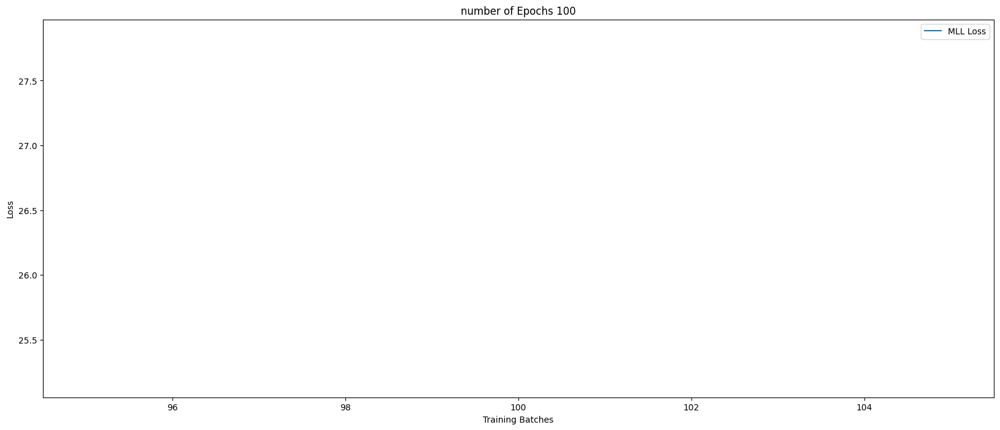

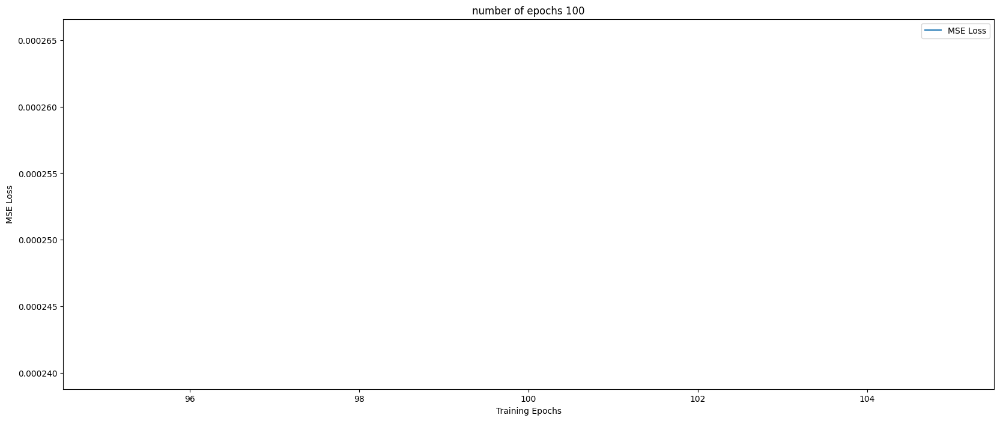

Prediction after training with new task 3 
plot DKL


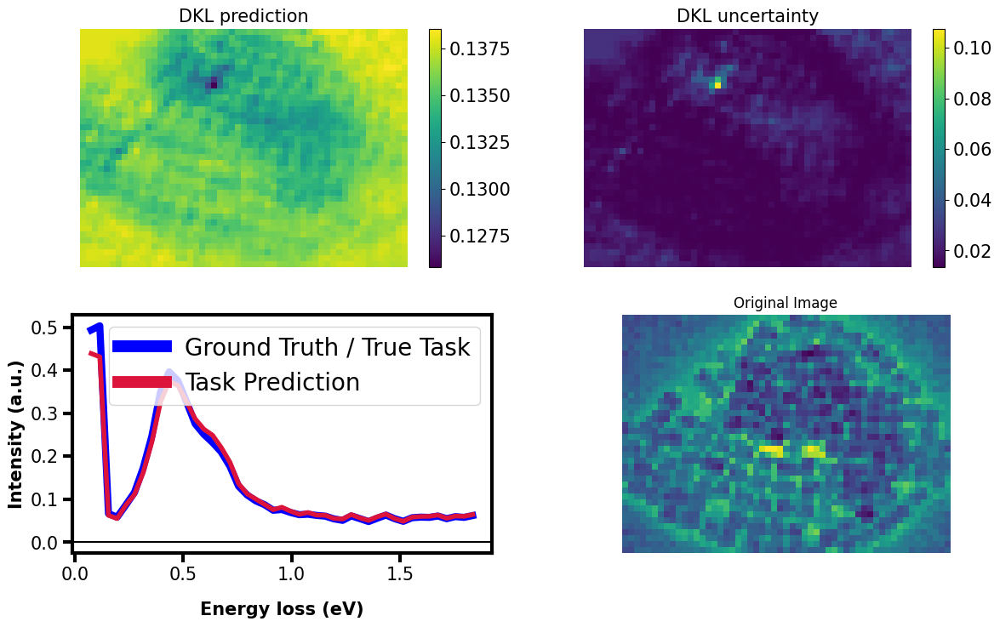

In [35]:
k1,k2 = 0,-1
with torch.no_grad():
    new_X2,new_y2,e_reduced2,new_full_img2,new_specim2,new_ind2=task_t(3,data_augmentation=False)
torch.manual_seed(42)
model,mll_loss,train_loss = perform_k_training_steps_train_and_test(deepcopy(dklgp_reptile),new_X2,new_y2,e_reduced2,nth_task=3,k_shots=1,training_cycle=100,batch_size=32)
print("Prediction after training with new task 3 ")
dkl_pred_aft2, dkl_unc_aft2, pred_spec_aft2, meas_spec_aft2, mean_aft2, var_aft2 = plot_DKL_prediction_preacquired_notactive(model_name=deepcopy(model),
                                                                                                                       structural_img=new_full_img2,
                                                                                                                       spectral_img=new_specim2, 
                                                                                                                       X_var=new_X2,y_var=new_y2,e_red=e_reduced2,
                                                                                                                       figsize = (14,8),
                                                                                                                       energy_range = [k1,k2],indices_=new_ind2)


Plotting Inference

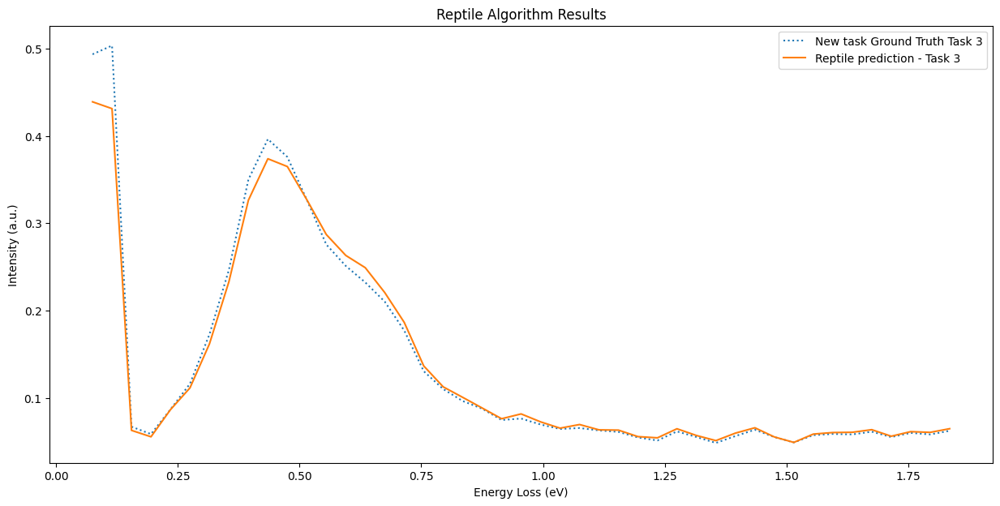

In [36]:

plt.figure(figsize=(15,7))

plt.title('Reptile Algorithm Results')
plt.xlabel('Energy Loss (eV)')
plt.ylabel('Intensity (a.u.)')

plt.plot(e_reduced2[k1:k2].detach().cpu().numpy(),meas_spec_aft2.detach().cpu().numpy(),linestyle='dotted',label='New task Ground Truth Task 3')
plt.plot(e_reduced2[k1:k2].detach().cpu().numpy(),pred_spec_aft2,label='Reptile prediction - Task 3')

plt.legend(loc='best')


Task 2

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


Date-Time : 2023-10-31 00:53:27,533 : Line No. : 3 - Training the model with new task dataset of size torch.Size([6987, 256]), with Training Cycle 100 | Batch size 32
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 00:53:27,784 : Line No. : 17 - Train Size : 5589 and Test Size : 1398


Train Size : 5589 and Test Size : 1398
 Number of batches: 174.65625


Date-Time : 2023-10-31 00:53:27,786 : Line No. : 20 -  Number of batches: 174.65625


Epoch 1/100 ... Training loss: 36.7996
Epoch 10/100 ... Training loss: 36.7861
Epoch 20/100 ... Training loss: 36.7431
Epoch 30/100 ... Training loss: 36.8857
Epoch 40/100 ... Training loss: 36.9806
Epoch 50/100 ... Training loss: 36.9738
Epoch 60/100 ... Training loss: 37.0879
Epoch 70/100 ... Training loss: 36.9345
Epoch 80/100 ... Training loss: 37.3047
Epoch 90/100 ... Training loss: 37.3694
Epoch 100/100 ... Training loss: 37.3742


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.3871
Epoch 10/100 ... Training loss: 37.197
Epoch 20/100 ... Training loss: 37.4569
Epoch 30/100 ... Training loss: 37.4054
Epoch 40/100 ... Training loss: 37.3744
Epoch 50/100 ... Training loss: 37.4404
Epoch 60/100 ... Training loss: 37.5513
Epoch 70/100 ... Training loss: 37.4568
Epoch 80/100 ... Training loss: 37.2584
Epoch 90/100 ... Training loss: 37.549
Epoch 100/100 ... Training loss: 37.4766


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.4271
Epoch 10/100 ... Training loss: 37.0767
Epoch 20/100 ... Training loss: 37.2514
Epoch 30/100 ... Training loss: 37.1975
Epoch 40/100 ... Training loss: 37.1239
Epoch 50/100 ... Training loss: 36.9243
Epoch 60/100 ... Training loss: 37.2437
Epoch 70/100 ... Training loss: 37.2578
Epoch 80/100 ... Training loss: 37.4026
Epoch 90/100 ... Training loss: 37.3725
Epoch 100/100 ... Training loss: 37.2184


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.1259
Epoch 10/100 ... Training loss: 37.0869
Epoch 20/100 ... Training loss: 36.9669
Epoch 30/100 ... Training loss: 37.1764
Epoch 40/100 ... Training loss: 37.3217
Epoch 50/100 ... Training loss: 37.3223
Epoch 60/100 ... Training loss: 37.2018
Epoch 70/100 ... Training loss: 37.2226
Epoch 80/100 ... Training loss: 37.27
Epoch 90/100 ... Training loss: 36.8067
Epoch 100/100 ... Training loss: 37.1379


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.1216
Epoch 10/100 ... Training loss: 37.0581
Epoch 20/100 ... Training loss: 36.8524
Epoch 30/100 ... Training loss: 37.1525
Epoch 40/100 ... Training loss: 37.1433
Epoch 50/100 ... Training loss: 36.8019
Epoch 60/100 ... Training loss: 36.7331
Epoch 70/100 ... Training loss: 37.1463
Epoch 80/100 ... Training loss: 37.0598
Epoch 90/100 ... Training loss: 36.6819
Epoch 100/100 ... Training loss: 36.6238


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.7613
Epoch 10/100 ... Training loss: 36.7697
Epoch 20/100 ... Training loss: 36.7726
Epoch 30/100 ... Training loss: 36.7325
Epoch 40/100 ... Training loss: 36.5616
Epoch 50/100 ... Training loss: 36.9219
Epoch 60/100 ... Training loss: 36.6491
Epoch 70/100 ... Training loss: 36.9033
Epoch 80/100 ... Training loss: 36.5763
Epoch 90/100 ... Training loss: 36.727
Epoch 100/100 ... Training loss: 36.8732


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.8405
Epoch 10/100 ... Training loss: 36.3352
Epoch 20/100 ... Training loss: 36.6011
Epoch 30/100 ... Training loss: 36.7281
Epoch 40/100 ... Training loss: 36.5861
Epoch 50/100 ... Training loss: 36.7021
Epoch 60/100 ... Training loss: 36.4061
Epoch 70/100 ... Training loss: 36.2717
Epoch 80/100 ... Training loss: 36.6323
Epoch 90/100 ... Training loss: 36.4523
Epoch 100/100 ... Training loss: 36.4395


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.6586
Epoch 10/100 ... Training loss: 36.3788
Epoch 20/100 ... Training loss: 36.1679
Epoch 30/100 ... Training loss: 36.3132
Epoch 40/100 ... Training loss: 36.4701
Epoch 50/100 ... Training loss: 36.5236
Epoch 60/100 ... Training loss: 36.0788
Epoch 70/100 ... Training loss: 36.5202
Epoch 80/100 ... Training loss: 36.5168
Epoch 90/100 ... Training loss: 36.4964
Epoch 100/100 ... Training loss: 36.5702


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.1684
Epoch 10/100 ... Training loss: 36.3546
Epoch 20/100 ... Training loss: 36.4909
Epoch 30/100 ... Training loss: 36.378
Epoch 40/100 ... Training loss: 35.6851
Epoch 50/100 ... Training loss: 35.8139
Epoch 60/100 ... Training loss: 36.0559
Epoch 70/100 ... Training loss: 35.7761
Epoch 80/100 ... Training loss: 36.1607
Epoch 90/100 ... Training loss: 35.9973
Epoch 100/100 ... Training loss: 36.2795


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.281
Epoch 10/100 ... Training loss: 35.9623
Epoch 20/100 ... Training loss: 35.9515
Epoch 30/100 ... Training loss: 35.7531
Epoch 40/100 ... Training loss: 35.9576
Epoch 50/100 ... Training loss: 35.8728
Epoch 60/100 ... Training loss: 36.1233
Epoch 70/100 ... Training loss: 35.7996
Epoch 80/100 ... Training loss: 36.0371
Epoch 90/100 ... Training loss: 36.0358
Epoch 100/100 ... Training loss: 35.9938


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.9958
Epoch 10/100 ... Training loss: 35.8421
Epoch 20/100 ... Training loss: 36.0001
Epoch 30/100 ... Training loss: 35.7508
Epoch 40/100 ... Training loss: 35.9223
Epoch 50/100 ... Training loss: 35.3209
Epoch 60/100 ... Training loss: 35.9414
Epoch 70/100 ... Training loss: 35.5763
Epoch 80/100 ... Training loss: 35.6813
Epoch 90/100 ... Training loss: 35.4806
Epoch 100/100 ... Training loss: 35.9027


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.3505
Epoch 10/100 ... Training loss: 35.4874
Epoch 20/100 ... Training loss: 35.8618
Epoch 30/100 ... Training loss: 35.4974
Epoch 40/100 ... Training loss: 35.7301
Epoch 50/100 ... Training loss: 35.7367
Epoch 60/100 ... Training loss: 35.7242
Epoch 70/100 ... Training loss: 35.5763
Epoch 80/100 ... Training loss: 35.5722
Epoch 90/100 ... Training loss: 35.6531
Epoch 100/100 ... Training loss: 35.4433


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.4364
Epoch 10/100 ... Training loss: 35.3487
Epoch 20/100 ... Training loss: 35.7827
Epoch 30/100 ... Training loss: 35.4538
Epoch 40/100 ... Training loss: 35.1592
Epoch 50/100 ... Training loss: 35.5867
Epoch 60/100 ... Training loss: 35.2746
Epoch 70/100 ... Training loss: 35.281
Epoch 80/100 ... Training loss: 35.2531
Epoch 90/100 ... Training loss: 35.1794
Epoch 100/100 ... Training loss: 35.5831


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.5887
Epoch 10/100 ... Training loss: 35.2281
Epoch 20/100 ... Training loss: 35.1755
Epoch 30/100 ... Training loss: 35.1053
Epoch 40/100 ... Training loss: 34.9542
Epoch 50/100 ... Training loss: 35.1451
Epoch 60/100 ... Training loss: 35.0363
Epoch 70/100 ... Training loss: 34.9719
Epoch 80/100 ... Training loss: 35.2159
Epoch 90/100 ... Training loss: 35.2759
Epoch 100/100 ... Training loss: 35.2751


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.0973
Epoch 10/100 ... Training loss: 34.9254
Epoch 20/100 ... Training loss: 34.7824
Epoch 30/100 ... Training loss: 34.8123
Epoch 40/100 ... Training loss: 35.1138
Epoch 50/100 ... Training loss: 34.64
Epoch 60/100 ... Training loss: 34.9
Epoch 70/100 ... Training loss: 34.6694
Epoch 80/100 ... Training loss: 35.1572
Epoch 90/100 ... Training loss: 35.2136
Epoch 100/100 ... Training loss: 34.5399


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.7593
Epoch 10/100 ... Training loss: 34.6704
Epoch 20/100 ... Training loss: 34.8613
Epoch 30/100 ... Training loss: 35.1331
Epoch 40/100 ... Training loss: 34.857
Epoch 50/100 ... Training loss: 34.8701
Epoch 60/100 ... Training loss: 34.6528
Epoch 70/100 ... Training loss: 34.6398
Epoch 80/100 ... Training loss: 34.6472
Epoch 90/100 ... Training loss: 34.7778
Epoch 100/100 ... Training loss: 34.5451


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.6423
Epoch 10/100 ... Training loss: 34.9649
Epoch 20/100 ... Training loss: 34.5937
Epoch 30/100 ... Training loss: 34.4362
Epoch 40/100 ... Training loss: 34.7837
Epoch 50/100 ... Training loss: 34.2223
Epoch 60/100 ... Training loss: 34.3667
Epoch 70/100 ... Training loss: 34.8876
Epoch 80/100 ... Training loss: 34.3506
Epoch 90/100 ... Training loss: 34.0953
Epoch 100/100 ... Training loss: 34.3639


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.3456
Epoch 10/100 ... Training loss: 34.3837
Epoch 20/100 ... Training loss: 34.421
Epoch 30/100 ... Training loss: 34.4895
Epoch 40/100 ... Training loss: 34.4409
Epoch 50/100 ... Training loss: 34.1648
Epoch 60/100 ... Training loss: 34.1121
Epoch 70/100 ... Training loss: 34.5804
Epoch 80/100 ... Training loss: 34.6881
Epoch 90/100 ... Training loss: 34.0411
Epoch 100/100 ... Training loss: 33.9427


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.9652
Epoch 10/100 ... Training loss: 34.6263
Epoch 20/100 ... Training loss: 34.0393
Epoch 30/100 ... Training loss: 34.5403
Epoch 40/100 ... Training loss: 34.1851
Epoch 50/100 ... Training loss: 33.9701
Epoch 60/100 ... Training loss: 33.9348
Epoch 70/100 ... Training loss: 33.7465
Epoch 80/100 ... Training loss: 34.0583
Epoch 90/100 ... Training loss: 34.0268
Epoch 100/100 ... Training loss: 34.1219


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.1568
Epoch 10/100 ... Training loss: 34.1783
Epoch 20/100 ... Training loss: 33.856
Epoch 30/100 ... Training loss: 34.0229
Epoch 40/100 ... Training loss: 33.9537
Epoch 50/100 ... Training loss: 34.1892
Epoch 60/100 ... Training loss: 34.1382
Epoch 70/100 ... Training loss: 33.6661
Epoch 80/100 ... Training loss: 33.7858
Epoch 90/100 ... Training loss: 33.6871
Epoch 100/100 ... Training loss: 33.7962


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.8129
Epoch 10/100 ... Training loss: 33.8015
Epoch 20/100 ... Training loss: 33.7749
Epoch 30/100 ... Training loss: 33.7363
Epoch 40/100 ... Training loss: 33.7145
Epoch 50/100 ... Training loss: 33.7364
Epoch 60/100 ... Training loss: 33.2866
Epoch 70/100 ... Training loss: 33.3445
Epoch 80/100 ... Training loss: 33.2346
Epoch 90/100 ... Training loss: 33.1889
Epoch 100/100 ... Training loss: 33.4556


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.4186
Epoch 10/100 ... Training loss: 33.2889
Epoch 20/100 ... Training loss: 33.1619
Epoch 30/100 ... Training loss: 33.5411
Epoch 40/100 ... Training loss: 33.5003
Epoch 50/100 ... Training loss: 33.4464
Epoch 60/100 ... Training loss: 33.216
Epoch 70/100 ... Training loss: 33.1383
Epoch 80/100 ... Training loss: 33.4054
Epoch 90/100 ... Training loss: 33.3479
Epoch 100/100 ... Training loss: 33.5526


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.4262
Epoch 10/100 ... Training loss: 33.3228
Epoch 20/100 ... Training loss: 33.497
Epoch 30/100 ... Training loss: 33.6855
Epoch 40/100 ... Training loss: 33.0526
Epoch 50/100 ... Training loss: 33.2249
Epoch 60/100 ... Training loss: 33.1584
Epoch 70/100 ... Training loss: 33.261
Epoch 80/100 ... Training loss: 33.3561
Epoch 90/100 ... Training loss: 33.5608
Epoch 100/100 ... Training loss: 33.0057


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.0002
Epoch 10/100 ... Training loss: 32.9535
Epoch 20/100 ... Training loss: 32.8945
Epoch 30/100 ... Training loss: 32.8001
Epoch 40/100 ... Training loss: 32.7567
Epoch 50/100 ... Training loss: 33.1433
Epoch 60/100 ... Training loss: 32.789
Epoch 70/100 ... Training loss: 33.0152
Epoch 80/100 ... Training loss: 32.7767
Epoch 90/100 ... Training loss: 32.7222
Epoch 100/100 ... Training loss: 33.1919


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.4668
Epoch 10/100 ... Training loss: 32.8798
Epoch 20/100 ... Training loss: 32.7967
Epoch 30/100 ... Training loss: 32.726
Epoch 40/100 ... Training loss: 32.7139
Epoch 50/100 ... Training loss: 32.7357
Epoch 60/100 ... Training loss: 32.5893
Epoch 70/100 ... Training loss: 32.5549
Epoch 80/100 ... Training loss: 32.5138
Epoch 90/100 ... Training loss: 32.6
Epoch 100/100 ... Training loss: 32.5298


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.5123
Epoch 10/100 ... Training loss: 32.5241
Epoch 20/100 ... Training loss: 32.4732
Epoch 30/100 ... Training loss: 32.4231
Epoch 40/100 ... Training loss: 32.3858
Epoch 50/100 ... Training loss: 32.3466
Epoch 60/100 ... Training loss: 32.3201
Epoch 70/100 ... Training loss: 32.297
Epoch 80/100 ... Training loss: 32.2764
Epoch 90/100 ... Training loss: 32.2573
Epoch 100/100 ... Training loss: 32.2393


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.2374
Epoch 10/100 ... Training loss: 32.2225
Epoch 20/100 ... Training loss: 32.9584
Epoch 30/100 ... Training loss: 32.2747
Epoch 40/100 ... Training loss: 32.2013
Epoch 50/100 ... Training loss: 32.166
Epoch 60/100 ... Training loss: 32.1478
Epoch 70/100 ... Training loss: 32.1271
Epoch 80/100 ... Training loss: 32.0986
Epoch 90/100 ... Training loss: 32.0767
Epoch 100/100 ... Training loss: 32.0599


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.0583
Epoch 10/100 ... Training loss: 32.3916
Epoch 20/100 ... Training loss: 32.371
Epoch 30/100 ... Training loss: 32.3387
Epoch 40/100 ... Training loss: 32.307
Epoch 50/100 ... Training loss: 32.4274
Epoch 60/100 ... Training loss: 32.1601
Epoch 70/100 ... Training loss: 32.7356
Epoch 80/100 ... Training loss: 32.1953
Epoch 90/100 ... Training loss: 32.0902
Epoch 100/100 ... Training loss: 32.1876


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.2001
Epoch 10/100 ... Training loss: 32.173
Epoch 20/100 ... Training loss: 31.9379
Epoch 30/100 ... Training loss: 32.113
Epoch 40/100 ... Training loss: 32.4458
Epoch 50/100 ... Training loss: 31.8133
Epoch 60/100 ... Training loss: 31.7914
Epoch 70/100 ... Training loss: 31.7693
Epoch 80/100 ... Training loss: 31.7485
Epoch 90/100 ... Training loss: 31.8872
Epoch 100/100 ... Training loss: 31.823


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.8155
Epoch 10/100 ... Training loss: 31.7357
Epoch 20/100 ... Training loss: 31.6606
Epoch 30/100 ... Training loss: 31.6604
Epoch 40/100 ... Training loss: 31.6247
Epoch 50/100 ... Training loss: 31.607
Epoch 60/100 ... Training loss: 31.5857
Epoch 70/100 ... Training loss: 31.9402
Epoch 80/100 ... Training loss: 31.9403
Epoch 90/100 ... Training loss: 31.9294
Epoch 100/100 ... Training loss: 31.9237


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.9237
Epoch 10/100 ... Training loss: 31.9321
Epoch 20/100 ... Training loss: 32.0421
Epoch 30/100 ... Training loss: 31.5635
Epoch 40/100 ... Training loss: 31.8042
Epoch 50/100 ... Training loss: 31.5916
Epoch 60/100 ... Training loss: 31.7658
Epoch 70/100 ... Training loss: 32.1385
Epoch 80/100 ... Training loss: 31.9048
Epoch 90/100 ... Training loss: 31.4054
Epoch 100/100 ... Training loss: 31.3476


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.3436
Epoch 10/100 ... Training loss: 31.3128
Epoch 20/100 ... Training loss: 31.2945
Epoch 30/100 ... Training loss: 31.2898
Epoch 40/100 ... Training loss: 31.3686
Epoch 50/100 ... Training loss: 31.2847
Epoch 60/100 ... Training loss: 31.2296
Epoch 70/100 ... Training loss: 31.208
Epoch 80/100 ... Training loss: 31.1801
Epoch 90/100 ... Training loss: 31.1581
Epoch 100/100 ... Training loss: 31.1454


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.1594
Epoch 10/100 ... Training loss: 31.2895
Epoch 20/100 ... Training loss: 31.3134
Epoch 30/100 ... Training loss: 31.1237
Epoch 40/100 ... Training loss: 31.1034
Epoch 50/100 ... Training loss: 31.0639
Epoch 60/100 ... Training loss: 31.0753
Epoch 70/100 ... Training loss: 31.0447
Epoch 80/100 ... Training loss: 31.0173
Epoch 90/100 ... Training loss: 30.9911
Epoch 100/100 ... Training loss: 30.9667


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.9644
Epoch 10/100 ... Training loss: 30.9439
Epoch 20/100 ... Training loss: 30.9223
Epoch 30/100 ... Training loss: 30.9018
Epoch 40/100 ... Training loss: 30.8822
Epoch 50/100 ... Training loss: 30.8634
Epoch 60/100 ... Training loss: 30.845
Epoch 70/100 ... Training loss: 30.8267
Epoch 80/100 ... Training loss: 30.8084
Epoch 90/100 ... Training loss: 30.79
Epoch 100/100 ... Training loss: 30.7716


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.7698
Epoch 10/100 ... Training loss: 30.7533
Epoch 20/100 ... Training loss: 30.7349
Epoch 30/100 ... Training loss: 30.7163
Epoch 40/100 ... Training loss: 30.6976
Epoch 50/100 ... Training loss: 30.679
Epoch 60/100 ... Training loss: 30.6605
Epoch 70/100 ... Training loss: 30.6426
Epoch 80/100 ... Training loss: 31.2859
Epoch 90/100 ... Training loss: 31.3752
Epoch 100/100 ... Training loss: 31.1768


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.0926
Epoch 10/100 ... Training loss: 30.8625
Epoch 20/100 ... Training loss: 30.6099
Epoch 30/100 ... Training loss: 30.5665
Epoch 40/100 ... Training loss: 30.8243
Epoch 50/100 ... Training loss: 30.5441
Epoch 60/100 ... Training loss: 30.4956
Epoch 70/100 ... Training loss: 30.4921
Epoch 80/100 ... Training loss: 30.4894
Epoch 90/100 ... Training loss: 30.4256
Epoch 100/100 ... Training loss: 30.4079


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.4059
Epoch 10/100 ... Training loss: 30.3878
Epoch 20/100 ... Training loss: 30.3684
Epoch 30/100 ... Training loss: 30.3498
Epoch 40/100 ... Training loss: 30.3319
Epoch 50/100 ... Training loss: 30.3145
Epoch 60/100 ... Training loss: 30.2984
Epoch 70/100 ... Training loss: 30.406
Epoch 80/100 ... Training loss: 30.3687
Epoch 90/100 ... Training loss: 30.3478
Epoch 100/100 ... Training loss: 30.417


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.3035
Epoch 10/100 ... Training loss: 30.2188
Epoch 20/100 ... Training loss: 30.2068
Epoch 30/100 ... Training loss: 30.47
Epoch 40/100 ... Training loss: 30.1554
Epoch 50/100 ... Training loss: 30.1316
Epoch 60/100 ... Training loss: 30.1081
Epoch 70/100 ... Training loss: 30.0885
Epoch 80/100 ... Training loss: 30.0711
Epoch 90/100 ... Training loss: 30.0637
Epoch 100/100 ... Training loss: 30.1473


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.1449
Epoch 10/100 ... Training loss: 30.1231
Epoch 20/100 ... Training loss: 30.0419
Epoch 30/100 ... Training loss: 30.0305
Epoch 40/100 ... Training loss: 29.9873
Epoch 50/100 ... Training loss: 30.0522
Epoch 60/100 ... Training loss: 29.9325
Epoch 70/100 ... Training loss: 29.9082
Epoch 80/100 ... Training loss: 29.8918
Epoch 90/100 ... Training loss: 29.8742
Epoch 100/100 ... Training loss: 29.8932


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.0296
Epoch 10/100 ... Training loss: 29.8287
Epoch 20/100 ... Training loss: 29.8098
Epoch 30/100 ... Training loss: 29.7923
Epoch 40/100 ... Training loss: 29.774
Epoch 50/100 ... Training loss: 29.7555
Epoch 60/100 ... Training loss: 29.7372
Epoch 70/100 ... Training loss: 29.719
Epoch 80/100 ... Training loss: 29.7009
Epoch 90/100 ... Training loss: 29.6827
Epoch 100/100 ... Training loss: 29.6644


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.6626
Epoch 10/100 ... Training loss: 29.6465
Epoch 20/100 ... Training loss: 29.6297
Epoch 30/100 ... Training loss: 29.6234
Epoch 40/100 ... Training loss: 29.6993
Epoch 50/100 ... Training loss: 29.6203
Epoch 60/100 ... Training loss: 29.5752
Epoch 70/100 ... Training loss: 29.5607
Epoch 80/100 ... Training loss: 29.5202
Epoch 90/100 ... Training loss: 29.6286
Epoch 100/100 ... Training loss: 29.9283


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.9824
Epoch 10/100 ... Training loss: 29.496
Epoch 20/100 ... Training loss: 29.4796
Epoch 30/100 ... Training loss: 29.4551
Epoch 40/100 ... Training loss: 29.4255
Epoch 50/100 ... Training loss: 29.3875
Epoch 60/100 ... Training loss: 29.3729
Epoch 70/100 ... Training loss: 29.3514
Epoch 80/100 ... Training loss: 29.3315
Epoch 90/100 ... Training loss: 29.3128
Epoch 100/100 ... Training loss: 29.2904


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.2881
Epoch 10/100 ... Training loss: 29.2694
Epoch 20/100 ... Training loss: 29.2504
Epoch 30/100 ... Training loss: 29.2314
Epoch 40/100 ... Training loss: 29.2127
Epoch 50/100 ... Training loss: 29.194
Epoch 60/100 ... Training loss: 29.1754
Epoch 70/100 ... Training loss: 29.1567
Epoch 80/100 ... Training loss: 29.1381
Epoch 90/100 ... Training loss: 29.1195
Epoch 100/100 ... Training loss: 29.1008


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.099
Epoch 10/100 ... Training loss: 29.0822
Epoch 20/100 ... Training loss: 29.0636
Epoch 30/100 ... Training loss: 29.0449
Epoch 40/100 ... Training loss: 29.0263
Epoch 50/100 ... Training loss: 29.0076
Epoch 60/100 ... Training loss: 28.989
Epoch 70/100 ... Training loss: 28.9703
Epoch 80/100 ... Training loss: 28.9517
Epoch 90/100 ... Training loss: 28.933
Epoch 100/100 ... Training loss: 28.9144


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.9125
Epoch 10/100 ... Training loss: 28.8958
Epoch 20/100 ... Training loss: 28.8773
Epoch 30/100 ... Training loss: 28.8587
Epoch 40/100 ... Training loss: 28.8401
Epoch 50/100 ... Training loss: 28.8217
Epoch 60/100 ... Training loss: 28.8037
Epoch 70/100 ... Training loss: 28.7872
Epoch 80/100 ... Training loss: 28.8032
Epoch 90/100 ... Training loss: 28.7568
Epoch 100/100 ... Training loss: 28.7352


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.7339
Epoch 10/100 ... Training loss: 28.7987
Epoch 20/100 ... Training loss: 28.7332
Epoch 30/100 ... Training loss: 28.709
Epoch 40/100 ... Training loss: 28.6743
Epoch 50/100 ... Training loss: 28.6614
Epoch 60/100 ... Training loss: 28.6247
Epoch 70/100 ... Training loss: 28.6029
Epoch 80/100 ... Training loss: 28.5823
Epoch 90/100 ... Training loss: 28.5622
Epoch 100/100 ... Training loss: 28.542


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.5401
Epoch 10/100 ... Training loss: 28.523
Epoch 20/100 ... Training loss: 28.5045
Epoch 30/100 ... Training loss: 28.4874
Epoch 40/100 ... Training loss: 28.4806
Epoch 50/100 ... Training loss: 28.4994
Epoch 60/100 ... Training loss: 28.4688
Epoch 70/100 ... Training loss: 28.4365
Epoch 80/100 ... Training loss: 28.4035
Epoch 90/100 ... Training loss: 28.3781
Epoch 100/100 ... Training loss: 28.3581


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.356
Epoch 10/100 ... Training loss: 28.3369
Epoch 20/100 ... Training loss: 28.3168
Epoch 30/100 ... Training loss: 28.2972
Epoch 40/100 ... Training loss: 28.2779
Epoch 50/100 ... Training loss: 28.2588
Epoch 60/100 ... Training loss: 28.2398
Epoch 70/100 ... Training loss: 28.221
Epoch 80/100 ... Training loss: 28.2021
Epoch 90/100 ... Training loss: 28.1852
Epoch 100/100 ... Training loss: 28.1799


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.1742
Epoch 10/100 ... Training loss: 28.1503
Epoch 20/100 ... Training loss: 28.3852
Epoch 30/100 ... Training loss: 28.6936
Epoch 40/100 ... Training loss: 28.3323
Epoch 50/100 ... Training loss: 28.201
Epoch 60/100 ... Training loss: 28.0756
Epoch 70/100 ... Training loss: 28.0347
Epoch 80/100 ... Training loss: 28.0179
Epoch 90/100 ... Training loss: 27.9966
Epoch 100/100 ... Training loss: 27.9765


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.9751
Epoch 10/100 ... Training loss: 27.9685
Epoch 20/100 ... Training loss: 27.949
Epoch 30/100 ... Training loss: 27.9935
Epoch 40/100 ... Training loss: 28.1701
Epoch 50/100 ... Training loss: 28.1538
Epoch 60/100 ... Training loss: 28.1689
Epoch 70/100 ... Training loss: 27.915
Epoch 80/100 ... Training loss: 27.8543
Epoch 90/100 ... Training loss: 27.812
Epoch 100/100 ... Training loss: 27.7896


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.7874
Epoch 10/100 ... Training loss: 27.7689
Epoch 20/100 ... Training loss: 27.7501
Epoch 30/100 ... Training loss: 27.732
Epoch 40/100 ... Training loss: 27.7151
Epoch 50/100 ... Training loss: 27.6987
Epoch 60/100 ... Training loss: 27.8228
Epoch 70/100 ... Training loss: 28.0539
Epoch 80/100 ... Training loss: 27.6665
Epoch 90/100 ... Training loss: 27.6432
Epoch 100/100 ... Training loss: 27.6196


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.6172
Epoch 10/100 ... Training loss: 27.5955
Epoch 20/100 ... Training loss: 27.5713
Epoch 30/100 ... Training loss: 27.5482
Epoch 40/100 ... Training loss: 27.527
Epoch 50/100 ... Training loss: 27.5075
Epoch 60/100 ... Training loss: 27.4888
Epoch 70/100 ... Training loss: 27.4695
Epoch 80/100 ... Training loss: 27.4497
Epoch 90/100 ... Training loss: 27.4297
Epoch 100/100 ... Training loss: 27.4103


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.4084
Epoch 10/100 ... Training loss: 27.3922
Epoch 20/100 ... Training loss: 27.4206
Epoch 30/100 ... Training loss: 27.413
Epoch 40/100 ... Training loss: 27.394
Epoch 50/100 ... Training loss: 27.3695
Epoch 60/100 ... Training loss: 27.3439
Epoch 70/100 ... Training loss: 27.3179
Epoch 80/100 ... Training loss: 27.2911
Epoch 90/100 ... Training loss: 27.2637
Epoch 100/100 ... Training loss: 27.2365


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.2338
Epoch 10/100 ... Training loss: 27.2103
Epoch 20/100 ... Training loss: 27.1868
Epoch 30/100 ... Training loss: 27.166
Epoch 40/100 ... Training loss: 27.1463
Epoch 50/100 ... Training loss: 27.1264
Epoch 60/100 ... Training loss: 27.1067
Epoch 70/100 ... Training loss: 27.0872
Epoch 80/100 ... Training loss: 27.0679
Epoch 90/100 ... Training loss: 27.0487
Epoch 100/100 ... Training loss: 27.0295


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.0276
Epoch 10/100 ... Training loss: 27.0107
Epoch 20/100 ... Training loss: 26.9921
Epoch 30/100 ... Training loss: 26.9762
Epoch 40/100 ... Training loss: 27.0612
Epoch 50/100 ... Training loss: 27.4936
Epoch 60/100 ... Training loss: 26.9648
Epoch 70/100 ... Training loss: 26.9405
Epoch 80/100 ... Training loss: 26.9363
Epoch 90/100 ... Training loss: 26.8702
Epoch 100/100 ... Training loss: 26.8632


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.8623
Epoch 10/100 ... Training loss: 26.8316
Epoch 20/100 ... Training loss: 26.9711
Epoch 30/100 ... Training loss: 26.8819
Epoch 40/100 ... Training loss: 26.8353
Epoch 50/100 ... Training loss: 26.8031
Epoch 60/100 ... Training loss: 26.7717
Epoch 70/100 ... Training loss: 26.7388
Epoch 80/100 ... Training loss: 26.7057
Epoch 90/100 ... Training loss: 26.6774
Epoch 100/100 ... Training loss: 26.6555


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.6535
Epoch 10/100 ... Training loss: 26.6352
Epoch 20/100 ... Training loss: 26.6145
Epoch 30/100 ... Training loss: 26.5943
Epoch 40/100 ... Training loss: 26.5743
Epoch 50/100 ... Training loss: 26.5545
Epoch 60/100 ... Training loss: 26.5349
Epoch 70/100 ... Training loss: 26.5155
Epoch 80/100 ... Training loss: 26.4963
Epoch 90/100 ... Training loss: 26.4772
Epoch 100/100 ... Training loss: 26.4602


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.4575
Epoch 10/100 ... Training loss: 26.4896
Epoch 20/100 ... Training loss: 26.4279
Epoch 30/100 ... Training loss: 26.4043
Epoch 40/100 ... Training loss: 26.384
Epoch 50/100 ... Training loss: 26.3644
Epoch 60/100 ... Training loss: 26.3449
Epoch 70/100 ... Training loss: 26.3302
Epoch 80/100 ... Training loss: 26.3134
Epoch 90/100 ... Training loss: 26.288
Epoch 100/100 ... Training loss: 26.2689


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.267
Epoch 10/100 ... Training loss: 26.2494
Epoch 20/100 ... Training loss: 26.23
Epoch 30/100 ... Training loss: 26.2109
Epoch 40/100 ... Training loss: 26.1919
Epoch 50/100 ... Training loss: 26.1728
Epoch 60/100 ... Training loss: 26.1536
Epoch 70/100 ... Training loss: 26.1345
Epoch 80/100 ... Training loss: 26.1155
Epoch 90/100 ... Training loss: 26.0964
Epoch 100/100 ... Training loss: 26.0773


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.0754
Epoch 10/100 ... Training loss: 26.0583
Epoch 20/100 ... Training loss: 26.0392
Epoch 30/100 ... Training loss: 26.0202
Epoch 40/100 ... Training loss: 26.0012
Epoch 50/100 ... Training loss: 25.9822
Epoch 60/100 ... Training loss: 25.9632
Epoch 70/100 ... Training loss: 25.9444
Epoch 80/100 ... Training loss: 25.9256
Epoch 90/100 ... Training loss: 25.9071
Epoch 100/100 ... Training loss: 25.8895


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.8878
Epoch 10/100 ... Training loss: 25.8758
Epoch 20/100 ... Training loss: 25.8514
Epoch 30/100 ... Training loss: 25.8282
Epoch 40/100 ... Training loss: 25.8087
Epoch 50/100 ... Training loss: 25.7896
Epoch 60/100 ... Training loss: 25.7706
Epoch 70/100 ... Training loss: 25.7516
Epoch 80/100 ... Training loss: 25.733
Epoch 90/100 ... Training loss: 25.7155
Epoch 100/100 ... Training loss: 25.7031


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.703
Epoch 10/100 ... Training loss: 25.6854
Epoch 20/100 ... Training loss: 25.6591
Epoch 30/100 ... Training loss: 25.6372
Epoch 40/100 ... Training loss: 25.6182
Epoch 50/100 ... Training loss: 25.6001
Epoch 60/100 ... Training loss: 25.5818
Epoch 70/100 ... Training loss: 25.5691
Epoch 80/100 ... Training loss: 25.576
Epoch 90/100 ... Training loss: 25.5249
Epoch 100/100 ... Training loss: 25.5041


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.5022
Epoch 10/100 ... Training loss: 25.4841
Epoch 20/100 ... Training loss: 25.4654
Epoch 30/100 ... Training loss: 25.4475
Epoch 40/100 ... Training loss: 25.5166
Epoch 50/100 ... Training loss: 25.8076
Epoch 60/100 ... Training loss: 25.791
Epoch 70/100 ... Training loss: 25.4605
Epoch 80/100 ... Training loss: 25.4483
Epoch 90/100 ... Training loss: 25.4302
Epoch 100/100 ... Training loss: 25.3507


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.3411
Epoch 10/100 ... Training loss: 25.3015
Epoch 20/100 ... Training loss: 25.275
Epoch 30/100 ... Training loss: 25.253
Epoch 40/100 ... Training loss: 25.2352
Epoch 50/100 ... Training loss: 25.2188
Epoch 60/100 ... Training loss: 25.1952
Epoch 70/100 ... Training loss: 25.1761
Epoch 80/100 ... Training loss: 25.1571
Epoch 90/100 ... Training loss: 25.1383
Epoch 100/100 ... Training loss: 25.1196


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.1177
Epoch 10/100 ... Training loss: 25.1018
Epoch 20/100 ... Training loss: 25.0889
Epoch 30/100 ... Training loss: 25.2708
Epoch 40/100 ... Training loss: 25.0718
Epoch 50/100 ... Training loss: 25.0627
Epoch 60/100 ... Training loss: 25.0385
Epoch 70/100 ... Training loss: 24.9931
Epoch 80/100 ... Training loss: 24.9745
Epoch 90/100 ... Training loss: 24.9476
Epoch 100/100 ... Training loss: 24.9316


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.9335
Epoch 10/100 ... Training loss: 24.9118
Epoch 20/100 ... Training loss: 24.8884
Epoch 30/100 ... Training loss: 24.8671
Epoch 40/100 ... Training loss: 24.8481
Epoch 50/100 ... Training loss: 24.8294
Epoch 60/100 ... Training loss: 24.8104
Epoch 70/100 ... Training loss: 24.792
Epoch 80/100 ... Training loss: 24.7835
Epoch 90/100 ... Training loss: 24.8397
Epoch 100/100 ... Training loss: 24.7608


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.7522
Epoch 10/100 ... Training loss: 24.7397
Epoch 20/100 ... Training loss: 24.7248
Epoch 30/100 ... Training loss: 24.7832
Epoch 40/100 ... Training loss: 24.7442
Epoch 50/100 ... Training loss: 24.7107
Epoch 60/100 ... Training loss: 24.7012
Epoch 70/100 ... Training loss: 24.6761
Epoch 80/100 ... Training loss: 24.5913
Epoch 90/100 ... Training loss: 24.8865
Epoch 100/100 ... Training loss: 24.5425


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.5394
Epoch 10/100 ... Training loss: 24.5331
Epoch 20/100 ... Training loss: 24.5649
Epoch 30/100 ... Training loss: 24.4885
Epoch 40/100 ... Training loss: 24.4643
Epoch 50/100 ... Training loss: 24.4444
Epoch 60/100 ... Training loss: 24.4254
Epoch 70/100 ... Training loss: 24.4052
Epoch 80/100 ... Training loss: 24.3869
Epoch 90/100 ... Training loss: 24.7452
Epoch 100/100 ... Training loss: 24.3482


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.346
Epoch 10/100 ... Training loss: 24.3279
Epoch 20/100 ... Training loss: 24.3076
Epoch 30/100 ... Training loss: 24.2935
Epoch 40/100 ... Training loss: 24.321
Epoch 50/100 ... Training loss: 24.2725
Epoch 60/100 ... Training loss: 24.2405
Epoch 70/100 ... Training loss: 24.2133
Epoch 80/100 ... Training loss: 24.1903
Epoch 90/100 ... Training loss: 24.1765
Epoch 100/100 ... Training loss: 24.3215


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.3975
Epoch 10/100 ... Training loss: 24.2071
Epoch 20/100 ... Training loss: 24.1451
Epoch 30/100 ... Training loss: 24.0945
Epoch 40/100 ... Training loss: 24.0818
Epoch 50/100 ... Training loss: 24.0547
Epoch 60/100 ... Training loss: 24.0995
Epoch 70/100 ... Training loss: 24.0225
Epoch 80/100 ... Training loss: 23.9991
Epoch 90/100 ... Training loss: 23.979
Epoch 100/100 ... Training loss: 23.9592


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.9571
Epoch 10/100 ... Training loss: 23.9378
Epoch 20/100 ... Training loss: 23.9206
Epoch 30/100 ... Training loss: 23.9996
Epoch 40/100 ... Training loss: 24.3462
Epoch 50/100 ... Training loss: 24.1468
Epoch 60/100 ... Training loss: 24.0412
Epoch 70/100 ... Training loss: 23.8728
Epoch 80/100 ... Training loss: 24.2535
Epoch 90/100 ... Training loss: 23.8124
Epoch 100/100 ... Training loss: 23.8196


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.829
Epoch 10/100 ... Training loss: 23.8283
Epoch 20/100 ... Training loss: 23.8391
Epoch 30/100 ... Training loss: 23.7266
Epoch 40/100 ... Training loss: 23.7104
Epoch 50/100 ... Training loss: 23.695
Epoch 60/100 ... Training loss: 23.68
Epoch 70/100 ... Training loss: 23.6499
Epoch 80/100 ... Training loss: 23.6199
Epoch 90/100 ... Training loss: 23.7845
Epoch 100/100 ... Training loss: 23.6145


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.6141
Epoch 10/100 ... Training loss: 23.6023
Epoch 20/100 ... Training loss: 23.5712
Epoch 30/100 ... Training loss: 23.5433
Epoch 40/100 ... Training loss: 23.5019
Epoch 50/100 ... Training loss: 23.5114
Epoch 60/100 ... Training loss: 23.4811
Epoch 70/100 ... Training loss: 23.4553
Epoch 80/100 ... Training loss: 23.4268
Epoch 90/100 ... Training loss: 23.3995
Epoch 100/100 ... Training loss: 23.3769


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.375
Epoch 10/100 ... Training loss: 23.359
Epoch 20/100 ... Training loss: 23.3405
Epoch 30/100 ... Training loss: 23.3209
Epoch 40/100 ... Training loss: 23.3025
Epoch 50/100 ... Training loss: 23.2879
Epoch 60/100 ... Training loss: 23.3259
Epoch 70/100 ... Training loss: 23.3274
Epoch 80/100 ... Training loss: 23.2421
Epoch 90/100 ... Training loss: 23.2337
Epoch 100/100 ... Training loss: 23.3592


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.2212
Epoch 10/100 ... Training loss: 23.1875
Epoch 20/100 ... Training loss: 23.1579
Epoch 30/100 ... Training loss: 23.1339
Epoch 40/100 ... Training loss: 23.1086
Epoch 50/100 ... Training loss: 23.145
Epoch 60/100 ... Training loss: 23.1275
Epoch 70/100 ... Training loss: 23.1035
Epoch 80/100 ... Training loss: 23.0794
Epoch 90/100 ... Training loss: 23.0558
Epoch 100/100 ... Training loss: 23.0331


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.0309
Epoch 10/100 ... Training loss: 23.011
Epoch 20/100 ... Training loss: 22.9897
Epoch 30/100 ... Training loss: 22.9427
Epoch 40/100 ... Training loss: 22.9251
Epoch 50/100 ... Training loss: 22.9049
Epoch 60/100 ... Training loss: 22.8839
Epoch 70/100 ... Training loss: 22.8622
Epoch 80/100 ... Training loss: 22.8394
Epoch 90/100 ... Training loss: 22.8155
Epoch 100/100 ... Training loss: 22.7917


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.7896
Epoch 10/100 ... Training loss: 22.9649
Epoch 20/100 ... Training loss: 22.7796
Epoch 30/100 ... Training loss: 22.7599
Epoch 40/100 ... Training loss: 22.7393
Epoch 50/100 ... Training loss: 22.7169
Epoch 60/100 ... Training loss: 22.6945
Epoch 70/100 ... Training loss: 22.6809
Epoch 80/100 ... Training loss: 22.6573
Epoch 90/100 ... Training loss: 22.6341
Epoch 100/100 ... Training loss: 22.611


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.6088
Epoch 10/100 ... Training loss: 22.5883
Epoch 20/100 ... Training loss: 22.5645
Epoch 30/100 ... Training loss: 22.5384
Epoch 40/100 ... Training loss: 22.8888
Epoch 50/100 ... Training loss: 22.5262
Epoch 60/100 ... Training loss: 22.5081
Epoch 70/100 ... Training loss: 22.4895
Epoch 80/100 ... Training loss: 22.4714
Epoch 90/100 ... Training loss: 22.4529
Epoch 100/100 ... Training loss: 22.431


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.4285
Epoch 10/100 ... Training loss: 22.4026
Epoch 20/100 ... Training loss: 22.3723
Epoch 30/100 ... Training loss: 22.3495
Epoch 40/100 ... Training loss: 22.3291
Epoch 50/100 ... Training loss: 22.3088
Epoch 60/100 ... Training loss: 22.2886
Epoch 70/100 ... Training loss: 22.2685
Epoch 80/100 ... Training loss: 22.2485
Epoch 90/100 ... Training loss: 22.2287
Epoch 100/100 ... Training loss: 22.2088


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.2068
Epoch 10/100 ... Training loss: 22.189
Epoch 20/100 ... Training loss: 22.1692
Epoch 30/100 ... Training loss: 22.1494
Epoch 40/100 ... Training loss: 22.1295
Epoch 50/100 ... Training loss: 22.1097
Epoch 60/100 ... Training loss: 22.0897
Epoch 70/100 ... Training loss: 22.0697
Epoch 80/100 ... Training loss: 22.0497
Epoch 90/100 ... Training loss: 22.0298
Epoch 100/100 ... Training loss: 22.0101


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.0082
Epoch 10/100 ... Training loss: 21.9934
Epoch 20/100 ... Training loss: 21.9841
Epoch 30/100 ... Training loss: 21.9896
Epoch 40/100 ... Training loss: 21.9487
Epoch 50/100 ... Training loss: 21.9269
Epoch 60/100 ... Training loss: 21.9066
Epoch 70/100 ... Training loss: 21.8872
Epoch 80/100 ... Training loss: 21.8704
Epoch 90/100 ... Training loss: 21.8547
Epoch 100/100 ... Training loss: 21.8232


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.8212
Epoch 10/100 ... Training loss: 21.8032
Epoch 20/100 ... Training loss: 21.7833
Epoch 30/100 ... Training loss: 21.7634
Epoch 40/100 ... Training loss: 21.7435
Epoch 50/100 ... Training loss: 21.7236
Epoch 60/100 ... Training loss: 21.7036
Epoch 70/100 ... Training loss: 21.6836
Epoch 80/100 ... Training loss: 21.6637
Epoch 90/100 ... Training loss: 21.6436
Epoch 100/100 ... Training loss: 21.6235


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.6215
Epoch 10/100 ... Training loss: 21.6034
Epoch 20/100 ... Training loss: 21.5832
Epoch 30/100 ... Training loss: 21.563
Epoch 40/100 ... Training loss: 21.5426
Epoch 50/100 ... Training loss: 21.5221
Epoch 60/100 ... Training loss: 21.5013
Epoch 70/100 ... Training loss: 21.4801
Epoch 80/100 ... Training loss: 21.4589
Epoch 90/100 ... Training loss: 21.4604
Epoch 100/100 ... Training loss: 21.4467


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.4444
Epoch 10/100 ... Training loss: 21.4247
Epoch 20/100 ... Training loss: 21.3936
Epoch 30/100 ... Training loss: 21.375
Epoch 40/100 ... Training loss: 21.354
Epoch 50/100 ... Training loss: 21.3317
Epoch 60/100 ... Training loss: 21.3066
Epoch 70/100 ... Training loss: 21.3181
Epoch 80/100 ... Training loss: 21.2729
Epoch 90/100 ... Training loss: 21.2516
Epoch 100/100 ... Training loss: 21.2279


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.2257
Epoch 10/100 ... Training loss: 21.2069
Epoch 20/100 ... Training loss: 21.1866
Epoch 30/100 ... Training loss: 21.1665
Epoch 40/100 ... Training loss: 21.1467
Epoch 50/100 ... Training loss: 21.1276
Epoch 60/100 ... Training loss: 21.1188
Epoch 70/100 ... Training loss: 21.0956
Epoch 80/100 ... Training loss: 21.0717
Epoch 90/100 ... Training loss: 21.0547
Epoch 100/100 ... Training loss: 21.1289


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.2126
Epoch 10/100 ... Training loss: 21.287
Epoch 20/100 ... Training loss: 20.9924
Epoch 30/100 ... Training loss: 20.9797
Epoch 40/100 ... Training loss: 20.9574
Epoch 50/100 ... Training loss: 20.929
Epoch 60/100 ... Training loss: 20.9177
Epoch 70/100 ... Training loss: 20.8933
Epoch 80/100 ... Training loss: 20.8704
Epoch 90/100 ... Training loss: 20.8468
Epoch 100/100 ... Training loss: 20.8221


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.8197
Epoch 10/100 ... Training loss: 20.8288
Epoch 20/100 ... Training loss: 20.7975
Epoch 30/100 ... Training loss: 20.7762
Epoch 40/100 ... Training loss: 20.7556
Epoch 50/100 ... Training loss: 20.7352
Epoch 60/100 ... Training loss: 20.715
Epoch 70/100 ... Training loss: 20.6952
Epoch 80/100 ... Training loss: 20.6815
Epoch 90/100 ... Training loss: 20.6589
Epoch 100/100 ... Training loss: 20.6351


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.6327
Epoch 10/100 ... Training loss: 20.6132
Epoch 20/100 ... Training loss: 20.6129
Epoch 30/100 ... Training loss: 20.591
Epoch 40/100 ... Training loss: 20.5602
Epoch 50/100 ... Training loss: 20.5611
Epoch 60/100 ... Training loss: 20.5225
Epoch 70/100 ... Training loss: 20.4992
Epoch 80/100 ... Training loss: 20.479
Epoch 90/100 ... Training loss: 20.5677
Epoch 100/100 ... Training loss: 20.4478


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.4458
Epoch 10/100 ... Training loss: 20.4271
Epoch 20/100 ... Training loss: 20.406
Epoch 30/100 ... Training loss: 20.385
Epoch 40/100 ... Training loss: 20.3642
Epoch 50/100 ... Training loss: 20.3431
Epoch 60/100 ... Training loss: 20.3368
Epoch 70/100 ... Training loss: 20.3128
Epoch 80/100 ... Training loss: 20.2927
Epoch 90/100 ... Training loss: 20.2683
Epoch 100/100 ... Training loss: 20.2467


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.2445
Epoch 10/100 ... Training loss: 20.2257
Epoch 20/100 ... Training loss: 20.2045
Epoch 30/100 ... Training loss: 20.1824
Epoch 40/100 ... Training loss: 20.4302
Epoch 50/100 ... Training loss: 20.1431
Epoch 60/100 ... Training loss: 20.1227
Epoch 70/100 ... Training loss: 20.1022
Epoch 80/100 ... Training loss: 20.0816
Epoch 90/100 ... Training loss: 20.0609
Epoch 100/100 ... Training loss: 20.0401


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.038
Epoch 10/100 ... Training loss: 20.0189
Epoch 20/100 ... Training loss: 19.9968
Epoch 30/100 ... Training loss: 19.9726
Epoch 40/100 ... Training loss: 19.972
Epoch 50/100 ... Training loss: 19.9463
Epoch 60/100 ... Training loss: 19.925
Epoch 70/100 ... Training loss: 19.9039
Epoch 80/100 ... Training loss: 19.8829
Epoch 90/100 ... Training loss: 19.8622
Epoch 100/100 ... Training loss: 19.844


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.8457
Epoch 10/100 ... Training loss: 19.826
Epoch 20/100 ... Training loss: 19.8085
Epoch 30/100 ... Training loss: 19.7882
Epoch 40/100 ... Training loss: 19.7676
Epoch 50/100 ... Training loss: 19.747
Epoch 60/100 ... Training loss: 19.7263
Epoch 70/100 ... Training loss: 19.7044
Epoch 80/100 ... Training loss: 19.7873
Epoch 90/100 ... Training loss: 19.6696
Epoch 100/100 ... Training loss: 19.6484


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.6463
Epoch 10/100 ... Training loss: 19.6278
Epoch 20/100 ... Training loss: 19.6074
Epoch 30/100 ... Training loss: 19.5869
Epoch 40/100 ... Training loss: 19.5662
Epoch 50/100 ... Training loss: 19.5448
Epoch 60/100 ... Training loss: 19.5229
Epoch 70/100 ... Training loss: 19.4999
Epoch 80/100 ... Training loss: 19.4748
Epoch 90/100 ... Training loss: 19.4463
Epoch 100/100 ... Training loss: 19.469


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.4626
Epoch 10/100 ... Training loss: 19.4334
Epoch 20/100 ... Training loss: 19.4113
Epoch 30/100 ... Training loss: 19.3903
Epoch 40/100 ... Training loss: 19.3696
Epoch 50/100 ... Training loss: 19.3488
Epoch 60/100 ... Training loss: 19.3277
Epoch 70/100 ... Training loss: 19.3057
Epoch 80/100 ... Training loss: 19.2789
Epoch 90/100 ... Training loss: 19.2706
Epoch 100/100 ... Training loss: 19.2492


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.2471
Epoch 10/100 ... Training loss: 19.2287
Epoch 20/100 ... Training loss: 19.2084
Epoch 30/100 ... Training loss: 19.1882
Epoch 40/100 ... Training loss: 19.1679
Epoch 50/100 ... Training loss: 19.1477
Epoch 60/100 ... Training loss: 19.1274
Epoch 70/100 ... Training loss: 19.107
Epoch 80/100 ... Training loss: 19.0866
Epoch 90/100 ... Training loss: 19.0661
Epoch 100/100 ... Training loss: 19.0455


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.0434
Epoch 10/100 ... Training loss: 19.0246
Epoch 20/100 ... Training loss: 19.0035
Epoch 30/100 ... Training loss: 18.9818
Epoch 40/100 ... Training loss: 18.959
Epoch 50/100 ... Training loss: 18.9334
Epoch 60/100 ... Training loss: 18.9748
Epoch 70/100 ... Training loss: 18.9171
Epoch 80/100 ... Training loss: 18.8947
Epoch 90/100 ... Training loss: 18.8738
Epoch 100/100 ... Training loss: 18.8533


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.8513
Epoch 10/100 ... Training loss: 18.8328
Epoch 20/100 ... Training loss: 18.8118
Epoch 30/100 ... Training loss: 18.7886
Epoch 40/100 ... Training loss: 18.7758
Epoch 50/100 ... Training loss: 18.7573
Epoch 60/100 ... Training loss: 18.7371
Epoch 70/100 ... Training loss: 18.7166
Epoch 80/100 ... Training loss: 18.696
Epoch 90/100 ... Training loss: 18.6753
Epoch 100/100 ... Training loss: 18.6545


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.6524
Epoch 10/100 ... Training loss: 18.6335
Epoch 20/100 ... Training loss: 18.6121
Epoch 30/100 ... Training loss: 18.59
Epoch 40/100 ... Training loss: 18.5648
Epoch 50/100 ... Training loss: 18.6315
Epoch 60/100 ... Training loss: 18.5385
Epoch 70/100 ... Training loss: 18.5149
Epoch 80/100 ... Training loss: 18.4935
Epoch 90/100 ... Training loss: 18.4724
Epoch 100/100 ... Training loss: 18.4512


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.449
Epoch 10/100 ... Training loss: 18.4294
Epoch 20/100 ... Training loss: 18.4061
Epoch 30/100 ... Training loss: 18.3777
Epoch 40/100 ... Training loss: 18.3861
Epoch 50/100 ... Training loss: 18.3564
Epoch 60/100 ... Training loss: 18.3352
Epoch 70/100 ... Training loss: 18.3147
Epoch 80/100 ... Training loss: 18.2943
Epoch 90/100 ... Training loss: 18.2741
Epoch 100/100 ... Training loss: 18.2538


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.2518
Epoch 10/100 ... Training loss: 18.2335
Epoch 20/100 ... Training loss: 18.2132
Epoch 30/100 ... Training loss: 18.1927
Epoch 40/100 ... Training loss: 18.172
Epoch 50/100 ... Training loss: 18.1509
Epoch 60/100 ... Training loss: 18.1289
Epoch 70/100 ... Training loss: 18.1043
Epoch 80/100 ... Training loss: 18.0819
Epoch 90/100 ... Training loss: 18.0779
Epoch 100/100 ... Training loss: 18.0549


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.0527
Epoch 10/100 ... Training loss: 18.0339
Epoch 20/100 ... Training loss: 18.0133
Epoch 30/100 ... Training loss: 17.9925
Epoch 40/100 ... Training loss: 17.9711
Epoch 50/100 ... Training loss: 17.9477
Epoch 60/100 ... Training loss: 18.0162
Epoch 70/100 ... Training loss: 17.9117
Epoch 80/100 ... Training loss: 17.8947
Epoch 90/100 ... Training loss: 17.8748
Epoch 100/100 ... Training loss: 17.8545


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.8525
Epoch 10/100 ... Training loss: 17.8342
Epoch 20/100 ... Training loss: 17.8138
Epoch 30/100 ... Training loss: 17.7933
Epoch 40/100 ... Training loss: 17.7729
Epoch 50/100 ... Training loss: 17.7524
Epoch 60/100 ... Training loss: 17.7318
Epoch 70/100 ... Training loss: 17.7111
Epoch 80/100 ... Training loss: 17.6904
Epoch 90/100 ... Training loss: 17.6695
Epoch 100/100 ... Training loss: 17.6483


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.6462
Epoch 10/100 ... Training loss: 17.6269
Epoch 20/100 ... Training loss: 17.6047
Epoch 30/100 ... Training loss: 17.5806
Epoch 40/100 ... Training loss: 17.5508
Epoch 50/100 ... Training loss: 17.5687
Epoch 60/100 ... Training loss: 17.5378
Epoch 70/100 ... Training loss: 17.5157
Epoch 80/100 ... Training loss: 17.4944
Epoch 90/100 ... Training loss: 17.4731
Epoch 100/100 ... Training loss: 17.4508


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.4484
Epoch 10/100 ... Training loss: 17.4756
Epoch 20/100 ... Training loss: 17.4143
Epoch 30/100 ... Training loss: 17.3926
Epoch 40/100 ... Training loss: 17.3713
Epoch 50/100 ... Training loss: 17.3498
Epoch 60/100 ... Training loss: 17.3276
Epoch 70/100 ... Training loss: 17.3037
Epoch 80/100 ... Training loss: 17.2732
Epoch 90/100 ... Training loss: 17.2822
Epoch 100/100 ... Training loss: 17.2559


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.2536
Epoch 10/100 ... Training loss: 17.2342
Epoch 20/100 ... Training loss: 17.213
Epoch 30/100 ... Training loss: 17.1918
Epoch 40/100 ... Training loss: 17.17
Epoch 50/100 ... Training loss: 17.1473
Epoch 60/100 ... Training loss: 17.1223
Epoch 70/100 ... Training loss: 17.0874
Epoch 80/100 ... Training loss: 17.0988
Epoch 90/100 ... Training loss: 17.0735
Epoch 100/100 ... Training loss: 17.0514


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.0493
Epoch 10/100 ... Training loss: 17.0294
Epoch 20/100 ... Training loss: 17.0069
Epoch 30/100 ... Training loss: 16.9822
Epoch 40/100 ... Training loss: 16.9445
Epoch 50/100 ... Training loss: 16.9585
Epoch 60/100 ... Training loss: 16.9349
Epoch 70/100 ... Training loss: 16.9137
Epoch 80/100 ... Training loss: 16.8926
Epoch 90/100 ... Training loss: 16.8714
Epoch 100/100 ... Training loss: 16.8497


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.8475
Epoch 10/100 ... Training loss: 16.8272
Epoch 20/100 ... Training loss: 16.8023
Epoch 30/100 ... Training loss: 16.7676
Epoch 40/100 ... Training loss: 16.784
Epoch 50/100 ... Training loss: 16.7548
Epoch 60/100 ... Training loss: 16.7308
Epoch 70/100 ... Training loss: 16.7055
Epoch 80/100 ... Training loss: 16.669
Epoch 90/100 ... Training loss: 16.6775
Epoch 100/100 ... Training loss: 16.6543


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.6521
Epoch 10/100 ... Training loss: 16.6331
Epoch 20/100 ... Training loss: 16.6122
Epoch 30/100 ... Training loss: 16.5912
Epoch 40/100 ... Training loss: 16.5698
Epoch 50/100 ... Training loss: 16.5479
Epoch 60/100 ... Training loss: 16.5246
Epoch 70/100 ... Training loss: 16.4974
Epoch 80/100 ... Training loss: 16.4508
Epoch 90/100 ... Training loss: 16.4842
Epoch 100/100 ... Training loss: 16.4522


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.4494
Epoch 10/100 ... Training loss: 16.4326
Epoch 20/100 ... Training loss: 16.4164
Epoch 30/100 ... Training loss: 16.3945
Epoch 40/100 ... Training loss: 16.3715
Epoch 50/100 ... Training loss: 16.3468
Epoch 60/100 ... Training loss: 16.3148
Epoch 70/100 ... Training loss: 16.3235
Epoch 80/100 ... Training loss: 16.2919
Epoch 90/100 ... Training loss: 16.2698
Epoch 100/100 ... Training loss: 16.2485


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.2464
Epoch 10/100 ... Training loss: 16.2274
Epoch 20/100 ... Training loss: 16.2061
Epoch 30/100 ... Training loss: 16.1844
Epoch 40/100 ... Training loss: 16.1621
Epoch 50/100 ... Training loss: 16.1378
Epoch 60/100 ... Training loss: 16.1058
Epoch 70/100 ... Training loss: 16.3404
Epoch 80/100 ... Training loss: 16.0923
Epoch 90/100 ... Training loss: 16.0685
Epoch 100/100 ... Training loss: 16.0458


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.0436
Epoch 10/100 ... Training loss: 16.0232
Epoch 20/100 ... Training loss: 16.0001
Epoch 30/100 ... Training loss: 15.9756
Epoch 40/100 ... Training loss: 15.9451
Epoch 50/100 ... Training loss: 15.9567
Epoch 60/100 ... Training loss: 15.9293
Epoch 70/100 ... Training loss: 15.9067
Epoch 80/100 ... Training loss: 15.8844
Epoch 90/100 ... Training loss: 15.8617
Epoch 100/100 ... Training loss: 15.8365


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.8336
Epoch 10/100 ... Training loss: 15.7925
Epoch 20/100 ... Training loss: 15.8048
Epoch 30/100 ... Training loss: 15.7793
Epoch 40/100 ... Training loss: 15.7542
Epoch 50/100 ... Training loss: 15.7262
Epoch 60/100 ... Training loss: 15.6859
Epoch 70/100 ... Training loss: 15.7058
Epoch 80/100 ... Training loss: 15.6788
Epoch 90/100 ... Training loss: 15.6524
Epoch 100/100 ... Training loss: 15.623


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.6198
Epoch 10/100 ... Training loss: 15.5828
Epoch 20/100 ... Training loss: 15.6547
Epoch 30/100 ... Training loss: 15.5825
Epoch 40/100 ... Training loss: 15.5546
Epoch 50/100 ... Training loss: 15.5279
Epoch 60/100 ... Training loss: 15.4962
Epoch 70/100 ... Training loss: 15.5986
Epoch 80/100 ... Training loss: 15.4864
Epoch 90/100 ... Training loss: 15.4626
Epoch 100/100 ... Training loss: 15.4402


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.438
Epoch 10/100 ... Training loss: 15.4175
Epoch 20/100 ... Training loss: 15.3941
Epoch 30/100 ... Training loss: 15.3697
Epoch 40/100 ... Training loss: 15.3422
Epoch 50/100 ... Training loss: 15.3067
Epoch 60/100 ... Training loss: 15.4893
Epoch 70/100 ... Training loss: 15.3103
Epoch 80/100 ... Training loss: 15.2812
Epoch 90/100 ... Training loss: 15.2481
Epoch 100/100 ... Training loss: 15.268


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.257
Epoch 10/100 ... Training loss: 15.2246
Epoch 20/100 ... Training loss: 15.2012
Epoch 30/100 ... Training loss: 15.1787
Epoch 40/100 ... Training loss: 15.1561
Epoch 50/100 ... Training loss: 15.1325
Epoch 60/100 ... Training loss: 15.1075
Epoch 70/100 ... Training loss: 15.08
Epoch 80/100 ... Training loss: 15.0475
Epoch 90/100 ... Training loss: 15.004
Epoch 100/100 ... Training loss: 15.1044


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.0857
Epoch 10/100 ... Training loss: 15.0277
Epoch 20/100 ... Training loss: 14.9924
Epoch 30/100 ... Training loss: 14.9481
Epoch 40/100 ... Training loss: 15.0062
Epoch 50/100 ... Training loss: 14.9505
Epoch 60/100 ... Training loss: 14.9134
Epoch 70/100 ... Training loss: 14.9028
Epoch 80/100 ... Training loss: 14.8753
Epoch 90/100 ... Training loss: 14.8524
Epoch 100/100 ... Training loss: 14.828


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.8254
Epoch 10/100 ... Training loss: 14.8002
Epoch 20/100 ... Training loss: 14.7814
Epoch 30/100 ... Training loss: 14.7632
Epoch 40/100 ... Training loss: 14.7338
Epoch 50/100 ... Training loss: 14.6881
Epoch 60/100 ... Training loss: 14.7337
Epoch 70/100 ... Training loss: 14.7075
Epoch 80/100 ... Training loss: 14.681
Epoch 90/100 ... Training loss: 14.6548
Epoch 100/100 ... Training loss: 14.6358


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.6291
Epoch 10/100 ... Training loss: 14.6256
Epoch 20/100 ... Training loss: 14.5943
Epoch 30/100 ... Training loss: 14.5695
Epoch 40/100 ... Training loss: 14.544
Epoch 50/100 ... Training loss: 14.514
Epoch 60/100 ... Training loss: 14.5857
Epoch 70/100 ... Training loss: 14.4886
Epoch 80/100 ... Training loss: 14.4624
Epoch 90/100 ... Training loss: 14.4364
Epoch 100/100 ... Training loss: 14.4077


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.4046
Epoch 10/100 ... Training loss: 14.3723
Epoch 20/100 ... Training loss: 14.3199
Epoch 30/100 ... Training loss: 14.4121
Epoch 40/100 ... Training loss: 14.3655
Epoch 50/100 ... Training loss: 14.3238
Epoch 60/100 ... Training loss: 14.3068
Epoch 70/100 ... Training loss: 14.2721
Epoch 80/100 ... Training loss: 14.2452
Epoch 90/100 ... Training loss: 14.2165
Epoch 100/100 ... Training loss: 14.1829


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.179
Epoch 10/100 ... Training loss: 14.3423
Epoch 20/100 ... Training loss: 14.1678
Epoch 30/100 ... Training loss: 14.1538
Epoch 40/100 ... Training loss: 14.1287
Epoch 50/100 ... Training loss: 14.1024
Epoch 60/100 ... Training loss: 14.075
Epoch 70/100 ... Training loss: 14.0462
Epoch 80/100 ... Training loss: 14.0131
Epoch 90/100 ... Training loss: 13.9676
Epoch 100/100 ... Training loss: 14.0417


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.0441
Epoch 10/100 ... Training loss: 14.0122
Epoch 20/100 ... Training loss: 13.9636
Epoch 30/100 ... Training loss: 13.9814
Epoch 40/100 ... Training loss: 13.9406
Epoch 50/100 ... Training loss: 13.9142
Epoch 60/100 ... Training loss: 13.8869
Epoch 70/100 ... Training loss: 13.8536
Epoch 80/100 ... Training loss: 13.882
Epoch 90/100 ... Training loss: 13.8354
Epoch 100/100 ... Training loss: 13.8071


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.8042
Epoch 10/100 ... Training loss: 13.7777
Epoch 20/100 ... Training loss: 13.743
Epoch 30/100 ... Training loss: 13.6879
Epoch 40/100 ... Training loss: 13.7383
Epoch 50/100 ... Training loss: 13.6988
Epoch 60/100 ... Training loss: 13.6678
Epoch 70/100 ... Training loss: 13.6342
Epoch 80/100 ... Training loss: 13.5944
Epoch 90/100 ... Training loss: 13.6457
Epoch 100/100 ... Training loss: 13.6187


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.6102
Epoch 10/100 ... Training loss: 13.7786
Epoch 20/100 ... Training loss: 13.5879
Epoch 30/100 ... Training loss: 13.5608
Epoch 40/100 ... Training loss: 13.5319
Epoch 50/100 ... Training loss: 13.4705
Epoch 60/100 ... Training loss: 13.5136
Epoch 70/100 ... Training loss: 13.4901
Epoch 80/100 ... Training loss: 13.4675
Epoch 90/100 ... Training loss: 13.4428
Epoch 100/100 ... Training loss: 13.4103


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.4059
Epoch 10/100 ... Training loss: 13.3311
Epoch 20/100 ... Training loss: 13.3562
Epoch 30/100 ... Training loss: 13.33
Epoch 40/100 ... Training loss: 13.2948
Epoch 50/100 ... Training loss: 13.2574
Epoch 60/100 ... Training loss: 13.2255
Epoch 70/100 ... Training loss: 13.1907
Epoch 80/100 ... Training loss: 13.1567
Epoch 90/100 ... Training loss: 13.2524
Epoch 100/100 ... Training loss: 13.1958


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.1915
Epoch 10/100 ... Training loss: 13.154
Epoch 20/100 ... Training loss: 13.1072
Epoch 30/100 ... Training loss: 13.074
Epoch 40/100 ... Training loss: 13.0566
Epoch 50/100 ... Training loss: 13.1248
Epoch 60/100 ... Training loss: 13.0522
Epoch 70/100 ... Training loss: 13.0105
Epoch 80/100 ... Training loss: 12.9628
Epoch 90/100 ... Training loss: 13.0053
Epoch 100/100 ... Training loss: 12.9679


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.9642
Epoch 10/100 ... Training loss: 12.931
Epoch 20/100 ... Training loss: 12.8966
Epoch 30/100 ... Training loss: 12.861
Epoch 40/100 ... Training loss: 12.9852
Epoch 50/100 ... Training loss: 12.8549
Epoch 60/100 ... Training loss: 12.8949
Epoch 70/100 ... Training loss: 12.853
Epoch 80/100 ... Training loss: 12.8189
Epoch 90/100 ... Training loss: 12.7692
Epoch 100/100 ... Training loss: 12.9403


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.8405
Epoch 10/100 ... Training loss: 12.7365
Epoch 20/100 ... Training loss: 12.6851
Epoch 30/100 ... Training loss: 12.7785
Epoch 40/100 ... Training loss: 12.7077
Epoch 50/100 ... Training loss: 12.6548
Epoch 60/100 ... Training loss: 12.5956
Epoch 70/100 ... Training loss: 12.6388
Epoch 80/100 ... Training loss: 12.5998
Epoch 90/100 ... Training loss: 12.5641
Epoch 100/100 ... Training loss: 12.5283


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.5248
Epoch 10/100 ... Training loss: 12.49
Epoch 20/100 ... Training loss: 12.4509
Epoch 30/100 ... Training loss: 12.5417
Epoch 40/100 ... Training loss: 12.4639
Epoch 50/100 ... Training loss: 12.4021
Epoch 60/100 ... Training loss: 12.5001
Epoch 70/100 ... Training loss: 12.4411
Epoch 80/100 ... Training loss: 12.3927
Epoch 90/100 ... Training loss: 12.6919
Epoch 100/100 ... Training loss: 12.3544


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.3855
Epoch 10/100 ... Training loss: 12.3514
Epoch 20/100 ... Training loss: 12.3144
Epoch 30/100 ... Training loss: 12.2771
Epoch 40/100 ... Training loss: 12.2408
Epoch 50/100 ... Training loss: 12.2093
Epoch 60/100 ... Training loss: 12.1753
Epoch 70/100 ... Training loss: 12.1347
Epoch 80/100 ... Training loss: 12.1355
Epoch 90/100 ... Training loss: 12.1396
Epoch 100/100 ... Training loss: 12.1199


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.1164
Epoch 10/100 ... Training loss: 12.0845
Epoch 20/100 ... Training loss: 12.0507
Epoch 30/100 ... Training loss: 12.0109
Epoch 40/100 ... Training loss: 12.1282
Epoch 50/100 ... Training loss: 12.0245
Epoch 60/100 ... Training loss: 11.9806
Epoch 70/100 ... Training loss: 11.9431
Epoch 80/100 ... Training loss: 12.1953
Epoch 90/100 ... Training loss: 11.9155
Epoch 100/100 ... Training loss: 11.925


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.9183
Epoch 10/100 ... Training loss: 11.8845
Epoch 20/100 ... Training loss: 11.8563
Epoch 30/100 ... Training loss: 11.8293
Epoch 40/100 ... Training loss: 11.8022
Epoch 50/100 ... Training loss: 11.7745
Epoch 60/100 ... Training loss: 11.744
Epoch 70/100 ... Training loss: 11.9104
Epoch 80/100 ... Training loss: 11.73
Epoch 90/100 ... Training loss: 11.6997
Epoch 100/100 ... Training loss: 11.6731


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.6705
Epoch 10/100 ... Training loss: 11.6469
Epoch 20/100 ... Training loss: 11.6198
Epoch 30/100 ... Training loss: 11.5911
Epoch 40/100 ... Training loss: 11.5952
Epoch 50/100 ... Training loss: 11.5723
Epoch 60/100 ... Training loss: 11.529
Epoch 70/100 ... Training loss: 11.538
Epoch 80/100 ... Training loss: 11.5351
Epoch 90/100 ... Training loss: 11.4744
Epoch 100/100 ... Training loss: 11.5454


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.8324
Epoch 10/100 ... Training loss: 11.4441
Epoch 20/100 ... Training loss: 11.421
Epoch 30/100 ... Training loss: 11.397
Epoch 40/100 ... Training loss: 11.3727
Epoch 50/100 ... Training loss: 11.3484
Epoch 60/100 ... Training loss: 11.3241
Epoch 70/100 ... Training loss: 11.2997
Epoch 80/100 ... Training loss: 11.2752
Epoch 90/100 ... Training loss: 11.2505
Epoch 100/100 ... Training loss: 11.2256


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.2231
Epoch 10/100 ... Training loss: 11.2006
Epoch 20/100 ... Training loss: 11.191
Epoch 30/100 ... Training loss: 11.2166
Epoch 40/100 ... Training loss: 11.1521
Epoch 50/100 ... Training loss: 11.1197
Epoch 60/100 ... Training loss: 11.216
Epoch 70/100 ... Training loss: 11.0941
Epoch 80/100 ... Training loss: 11.0641
Epoch 90/100 ... Training loss: 11.036
Epoch 100/100 ... Training loss: 11.0833


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.0522
Epoch 10/100 ... Training loss: 11.0009
Epoch 20/100 ... Training loss: 10.9721
Epoch 30/100 ... Training loss: 11.0893
Epoch 40/100 ... Training loss: 10.9424
Epoch 50/100 ... Training loss: 10.9195
Epoch 60/100 ... Training loss: 10.8966
Epoch 70/100 ... Training loss: 10.8735
Epoch 80/100 ... Training loss: 10.8503
Epoch 90/100 ... Training loss: 10.8274
Epoch 100/100 ... Training loss: 10.8048


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.8026
Epoch 10/100 ... Training loss: 10.7824
Epoch 20/100 ... Training loss: 10.7602
Epoch 30/100 ... Training loss: 10.7381
Epoch 40/100 ... Training loss: 10.716
Epoch 50/100 ... Training loss: 10.694
Epoch 60/100 ... Training loss: 10.672
Epoch 70/100 ... Training loss: 10.6501
Epoch 80/100 ... Training loss: 10.6281
Epoch 90/100 ... Training loss: 10.6063
Epoch 100/100 ... Training loss: 10.5844


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.5822
Epoch 10/100 ... Training loss: 10.5625
Epoch 20/100 ... Training loss: 10.5407
Epoch 30/100 ... Training loss: 10.519
Epoch 40/100 ... Training loss: 10.4972
Epoch 50/100 ... Training loss: 10.4755
Epoch 60/100 ... Training loss: 10.4538
Epoch 70/100 ... Training loss: 10.4321
Epoch 80/100 ... Training loss: 10.4106
Epoch 90/100 ... Training loss: 10.3893
Epoch 100/100 ... Training loss: 10.3689


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.367
Epoch 10/100 ... Training loss: 10.359
Epoch 20/100 ... Training loss: 10.396
Epoch 30/100 ... Training loss: 10.3112
Epoch 40/100 ... Training loss: 10.4508
Epoch 50/100 ... Training loss: 10.2866
Epoch 60/100 ... Training loss: 10.2555
Epoch 70/100 ... Training loss: 10.2423
Epoch 80/100 ... Training loss: 10.3104
Epoch 90/100 ... Training loss: 10.2692
Epoch 100/100 ... Training loss: 10.2111


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.3852
Epoch 10/100 ... Training loss: 10.1636
Epoch 20/100 ... Training loss: 10.1321
Epoch 30/100 ... Training loss: 10.1052
Epoch 40/100 ... Training loss: 10.0797
Epoch 50/100 ... Training loss: 10.0934
Epoch 60/100 ... Training loss: 10.0819
Epoch 70/100 ... Training loss: 10.0377
Epoch 80/100 ... Training loss: 10.0086
Epoch 90/100 ... Training loss: 9.9835
Epoch 100/100 ... Training loss: 9.959


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.9566
Epoch 10/100 ... Training loss: 9.9351
Epoch 20/100 ... Training loss: 9.9133
Epoch 30/100 ... Training loss: 9.8995
Epoch 40/100 ... Training loss: 9.878
Epoch 50/100 ... Training loss: 9.8486
Epoch 60/100 ... Training loss: 9.8248
Epoch 70/100 ... Training loss: 9.8023
Epoch 80/100 ... Training loss: 9.7917
Epoch 90/100 ... Training loss: 9.7659
Epoch 100/100 ... Training loss: 9.7418


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.7398
Epoch 10/100 ... Training loss: 9.7303
Epoch 20/100 ... Training loss: 9.8365
Epoch 30/100 ... Training loss: 10.0842
Epoch 40/100 ... Training loss: 9.6731
Epoch 50/100 ... Training loss: 9.6361
Epoch 60/100 ... Training loss: 9.984
Epoch 70/100 ... Training loss: 9.5943
Epoch 80/100 ... Training loss: 9.5721
Epoch 90/100 ... Training loss: 9.5501
Epoch 100/100 ... Training loss: 9.5281


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.5259
Epoch 10/100 ... Training loss: 9.506
Epoch 20/100 ... Training loss: 9.4841
Epoch 30/100 ... Training loss: 9.4622
Epoch 40/100 ... Training loss: 9.4403
Epoch 50/100 ... Training loss: 9.4184
Epoch 60/100 ... Training loss: 9.3967
Epoch 70/100 ... Training loss: 9.4539
Epoch 80/100 ... Training loss: 9.3595
Epoch 90/100 ... Training loss: 9.3354
Epoch 100/100 ... Training loss: 9.3128


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.3105
Epoch 10/100 ... Training loss: 9.2906
Epoch 20/100 ... Training loss: 9.2699
Epoch 30/100 ... Training loss: 9.2473
Epoch 40/100 ... Training loss: 9.2254
Epoch 50/100 ... Training loss: 9.2036
Epoch 60/100 ... Training loss: 9.182
Epoch 70/100 ... Training loss: 9.1623
Epoch 80/100 ... Training loss: 9.1528
Epoch 90/100 ... Training loss: 9.1212
Epoch 100/100 ... Training loss: 9.0983


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.096
Epoch 10/100 ... Training loss: 9.0765
Epoch 20/100 ... Training loss: 9.1084
Epoch 30/100 ... Training loss: 9.0472
Epoch 40/100 ... Training loss: 9.0146
Epoch 50/100 ... Training loss: 8.997
Epoch 60/100 ... Training loss: 8.9719
Epoch 70/100 ... Training loss: 8.9493
Epoch 80/100 ... Training loss: 8.9271
Epoch 90/100 ... Training loss: 8.9084
Epoch 100/100 ... Training loss: 8.8841


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.8819
Epoch 10/100 ... Training loss: 8.8622
Epoch 20/100 ... Training loss: 8.8406
Epoch 30/100 ... Training loss: 8.8193
Epoch 40/100 ... Training loss: 8.9171
Epoch 50/100 ... Training loss: 8.7853
Epoch 60/100 ... Training loss: 8.759
Epoch 70/100 ... Training loss: 8.7366
Epoch 80/100 ... Training loss: 8.822
Epoch 90/100 ... Training loss: 8.6953
Epoch 100/100 ... Training loss: 8.6717


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.6695
Epoch 10/100 ... Training loss: 8.6501
Epoch 20/100 ... Training loss: 8.6514
Epoch 30/100 ... Training loss: 8.6104
Epoch 40/100 ... Training loss: 8.5863
Epoch 50/100 ... Training loss: 8.5647
Epoch 60/100 ... Training loss: 8.5455
Epoch 70/100 ... Training loss: 8.527
Epoch 80/100 ... Training loss: 8.5201
Epoch 90/100 ... Training loss: 8.4834
Epoch 100/100 ... Training loss: 8.4621


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.46
Epoch 10/100 ... Training loss: 8.4393
Epoch 20/100 ... Training loss: 8.6537
Epoch 30/100 ... Training loss: 8.3968
Epoch 40/100 ... Training loss: 8.3774
Epoch 50/100 ... Training loss: 8.3548
Epoch 60/100 ... Training loss: 8.3326
Epoch 70/100 ... Training loss: 8.3107
Epoch 80/100 ... Training loss: 8.5149
Epoch 90/100 ... Training loss: 8.2689
Epoch 100/100 ... Training loss: 8.2464


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.2442
Epoch 10/100 ... Training loss: 8.2249
Epoch 20/100 ... Training loss: 8.2137
Epoch 30/100 ... Training loss: 8.1845
Epoch 40/100 ... Training loss: 8.1657
Epoch 50/100 ... Training loss: 8.1415
Epoch 60/100 ... Training loss: 8.1184
Epoch 70/100 ... Training loss: 8.0963
Epoch 80/100 ... Training loss: 8.0743
Epoch 90/100 ... Training loss: 8.0524
Epoch 100/100 ... Training loss: 8.0311


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.029
Epoch 10/100 ... Training loss: 8.2455
Epoch 20/100 ... Training loss: 7.9989
Epoch 30/100 ... Training loss: 8.0021
Epoch 40/100 ... Training loss: 7.9556
Epoch 50/100 ... Training loss: 7.9333
Epoch 60/100 ... Training loss: 7.9436
Epoch 70/100 ... Training loss: 7.891
Epoch 80/100 ... Training loss: 7.8909
Epoch 90/100 ... Training loss: 7.8486
Epoch 100/100 ... Training loss: 7.8272


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.8249
Epoch 10/100 ... Training loss: 7.8045
Epoch 20/100 ... Training loss: 7.7818
Epoch 30/100 ... Training loss: 7.7598
Epoch 40/100 ... Training loss: 7.7571
Epoch 50/100 ... Training loss: 7.7187
Epoch 60/100 ... Training loss: 7.6961
Epoch 70/100 ... Training loss: 7.6738
Epoch 80/100 ... Training loss: 7.6517
Epoch 90/100 ... Training loss: 7.6299
Epoch 100/100 ... Training loss: 7.6083


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.6062
Epoch 10/100 ... Training loss: 7.5869
Epoch 20/100 ... Training loss: 7.5661
Epoch 30/100 ... Training loss: 7.5553
Epoch 40/100 ... Training loss: 7.5263
Epoch 50/100 ... Training loss: 7.5031
Epoch 60/100 ... Training loss: 7.481
Epoch 70/100 ... Training loss: 7.4595
Epoch 80/100 ... Training loss: 7.4399
Epoch 90/100 ... Training loss: 7.6526
Epoch 100/100 ... Training loss: 7.4001


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.398
Epoch 10/100 ... Training loss: 7.3785
Epoch 20/100 ... Training loss: 7.3628
Epoch 30/100 ... Training loss: 7.3355
Epoch 40/100 ... Training loss: 7.3131
Epoch 50/100 ... Training loss: 7.4911
Epoch 60/100 ... Training loss: 7.2824
Epoch 70/100 ... Training loss: 7.2673
Epoch 80/100 ... Training loss: 7.2561
Epoch 90/100 ... Training loss: 7.2729
Epoch 100/100 ... Training loss: 7.2687


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.2199
Epoch 10/100 ... Training loss: 7.2226
Epoch 20/100 ... Training loss: 7.4638
Epoch 30/100 ... Training loss: 7.1248
Epoch 40/100 ... Training loss: 7.1018
Epoch 50/100 ... Training loss: 7.0797
Epoch 60/100 ... Training loss: 7.0575
Epoch 70/100 ... Training loss: 7.0354
Epoch 80/100 ... Training loss: 7.0134
Epoch 90/100 ... Training loss: 6.9915
Epoch 100/100 ... Training loss: 7.0144


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.9748
Epoch 10/100 ... Training loss: 6.9499
Epoch 20/100 ... Training loss: 6.9281
Epoch 30/100 ... Training loss: 6.9064
Epoch 40/100 ... Training loss: 6.8849
Epoch 50/100 ... Training loss: 6.8635
Epoch 60/100 ... Training loss: 6.8428
Epoch 70/100 ... Training loss: 6.823
Epoch 80/100 ... Training loss: 6.8039
Epoch 90/100 ... Training loss: 6.8302
Epoch 100/100 ... Training loss: 6.7774


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.774
Epoch 10/100 ... Training loss: 6.7431
Epoch 20/100 ... Training loss: 6.7209
Epoch 30/100 ... Training loss: 6.7041
Epoch 40/100 ... Training loss: 6.6931
Epoch 50/100 ... Training loss: 6.7753
Epoch 60/100 ... Training loss: 6.7211
Epoch 70/100 ... Training loss: 6.7637
Epoch 80/100 ... Training loss: 6.6871
Epoch 90/100 ... Training loss: 6.6042
Epoch 100/100 ... Training loss: 6.5708


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.5683
Epoch 10/100 ... Training loss: 6.543
Epoch 20/100 ... Training loss: 6.5149
Epoch 30/100 ... Training loss: 6.4904
Epoch 40/100 ... Training loss: 6.4666
Epoch 50/100 ... Training loss: 6.4436
Epoch 60/100 ... Training loss: 6.421
Epoch 70/100 ... Training loss: 6.3988
Epoch 80/100 ... Training loss: 6.3772
Epoch 90/100 ... Training loss: 6.3586
Epoch 100/100 ... Training loss: 6.4073


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.3787
Epoch 10/100 ... Training loss: 6.3617
Epoch 20/100 ... Training loss: 6.3257
Epoch 30/100 ... Training loss: 6.2856
Epoch 40/100 ... Training loss: 6.2624
Epoch 50/100 ... Training loss: 6.238
Epoch 60/100 ... Training loss: 6.2141
Epoch 70/100 ... Training loss: 6.1912
Epoch 80/100 ... Training loss: 6.1687
Epoch 90/100 ... Training loss: 6.1465
Epoch 100/100 ... Training loss: 6.1243


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.1221
Epoch 10/100 ... Training loss: 6.1024
Epoch 20/100 ... Training loss: 6.0808
Epoch 30/100 ... Training loss: 6.0595
Epoch 40/100 ... Training loss: 6.0386
Epoch 50/100 ... Training loss: 6.0184
Epoch 60/100 ... Training loss: 5.9987
Epoch 70/100 ... Training loss: 5.9805
Epoch 80/100 ... Training loss: 5.9636
Epoch 90/100 ... Training loss: 5.955
Epoch 100/100 ... Training loss: 5.9706


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.9748
Epoch 10/100 ... Training loss: 5.9455
Epoch 20/100 ... Training loss: 5.9328
Epoch 30/100 ... Training loss: 5.8604
Epoch 40/100 ... Training loss: 5.9086
Epoch 50/100 ... Training loss: 5.8577
Epoch 60/100 ... Training loss: 6.2728
Epoch 70/100 ... Training loss: 5.9452
Epoch 80/100 ... Training loss: 5.89
Epoch 90/100 ... Training loss: 5.827
Epoch 100/100 ... Training loss: 5.7699


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.7649
Epoch 10/100 ... Training loss: 5.7258
Epoch 20/100 ... Training loss: 5.6925
Epoch 30/100 ... Training loss: 5.6645
Epoch 40/100 ... Training loss: 5.6389
Epoch 50/100 ... Training loss: 5.6147
Epoch 60/100 ... Training loss: 5.5911
Epoch 70/100 ... Training loss: 5.5678
Epoch 80/100 ... Training loss: 5.5448
Epoch 90/100 ... Training loss: 5.5223
Epoch 100/100 ... Training loss: 5.5007


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.4986
Epoch 10/100 ... Training loss: 5.4805
Epoch 20/100 ... Training loss: 5.4634
Epoch 30/100 ... Training loss: 5.4519
Epoch 40/100 ... Training loss: 5.445
Epoch 50/100 ... Training loss: 5.447
Epoch 60/100 ... Training loss: 5.4306
Epoch 70/100 ... Training loss: 5.4443
Epoch 80/100 ... Training loss: 5.3843
Epoch 90/100 ... Training loss: 5.3394
Epoch 100/100 ... Training loss: 5.3017


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.2984
Epoch 10/100 ... Training loss: 5.2721
Epoch 20/100 ... Training loss: 5.2508
Epoch 30/100 ... Training loss: 5.2576
Epoch 40/100 ... Training loss: 5.2468
Epoch 50/100 ... Training loss: 5.2688
Epoch 60/100 ... Training loss: 5.2636
Epoch 70/100 ... Training loss: 5.2281
Epoch 80/100 ... Training loss: 5.1904
Epoch 90/100 ... Training loss: 5.1552
Epoch 100/100 ... Training loss: 5.1231


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.1201
Epoch 10/100 ... Training loss: 5.0938
Epoch 20/100 ... Training loss: 5.0664
Epoch 30/100 ... Training loss: 5.0405
Epoch 40/100 ... Training loss: 5.0155
Epoch 50/100 ... Training loss: 4.9911
Epoch 60/100 ... Training loss: 4.967
Epoch 70/100 ... Training loss: 4.9432
Epoch 80/100 ... Training loss: 4.9196
Epoch 90/100 ... Training loss: 4.8962
Epoch 100/100 ... Training loss: 4.873


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.8707
Epoch 10/100 ... Training loss: 4.8501
Epoch 20/100 ... Training loss: 4.8274
Epoch 30/100 ... Training loss: 4.8048
Epoch 40/100 ... Training loss: 4.7824
Epoch 50/100 ... Training loss: 4.7601
Epoch 60/100 ... Training loss: 4.7379
Epoch 70/100 ... Training loss: 4.7159
Epoch 80/100 ... Training loss: 4.694
Epoch 90/100 ... Training loss: 4.6722
Epoch 100/100 ... Training loss: 4.6507


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.6486
Epoch 10/100 ... Training loss: 4.6296
Epoch 20/100 ... Training loss: 4.6093
Epoch 30/100 ... Training loss: 4.592
Epoch 40/100 ... Training loss: 4.5774
Epoch 50/100 ... Training loss: 4.5726
Epoch 60/100 ... Training loss: 4.5431
Epoch 70/100 ... Training loss: 4.5134
Epoch 80/100 ... Training loss: 4.516
Epoch 90/100 ... Training loss: 4.4794
Epoch 100/100 ... Training loss: 4.4922


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.4825
Epoch 10/100 ... Training loss: 4.4418
Epoch 20/100 ... Training loss: 4.4061
Epoch 30/100 ... Training loss: 4.3822
Epoch 40/100 ... Training loss: 4.3819
Epoch 50/100 ... Training loss: 4.358
Epoch 60/100 ... Training loss: 4.409
Epoch 70/100 ... Training loss: 4.4168
Epoch 80/100 ... Training loss: 4.3724
Epoch 90/100 ... Training loss: 4.323
Epoch 100/100 ... Training loss: 4.28


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.2761
Epoch 10/100 ... Training loss: 4.2449
Epoch 20/100 ... Training loss: 4.2151
Epoch 30/100 ... Training loss: 4.188
Epoch 40/100 ... Training loss: 4.1625
Epoch 50/100 ... Training loss: 4.1381
Epoch 60/100 ... Training loss: 4.1143
Epoch 70/100 ... Training loss: 4.0908
Epoch 80/100 ... Training loss: 4.0677
Epoch 90/100 ... Training loss: 4.0449
Epoch 100/100 ... Training loss: 4.0225


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.0202
Epoch 10/100 ... Training loss: 4.0003
Epoch 20/100 ... Training loss: 3.9785
Epoch 30/100 ... Training loss: 3.9567
Epoch 40/100 ... Training loss: 3.9352
Epoch 50/100 ... Training loss: 3.914
Epoch 60/100 ... Training loss: 3.8931
Epoch 70/100 ... Training loss: 3.8728
Epoch 80/100 ... Training loss: 3.8536
Epoch 90/100 ... Training loss: 3.8367
Epoch 100/100 ... Training loss: 3.8291


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.8298
Epoch 10/100 ... Training loss: 3.8504
Epoch 20/100 ... Training loss: 3.8295
Epoch 30/100 ... Training loss: 3.7613
Epoch 40/100 ... Training loss: 3.7268
Epoch 50/100 ... Training loss: 3.7235
Epoch 60/100 ... Training loss: 3.7138
Epoch 70/100 ... Training loss: 3.6807
Epoch 80/100 ... Training loss: 3.6502
Epoch 90/100 ... Training loss: 3.6238
Epoch 100/100 ... Training loss: 3.6116


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.6151
Epoch 10/100 ... Training loss: 3.6517
Epoch 20/100 ... Training loss: 3.6251
Epoch 30/100 ... Training loss: 3.5704
Epoch 40/100 ... Training loss: 3.5354
Epoch 50/100 ... Training loss: 3.5089
Epoch 60/100 ... Training loss: 3.4842
Epoch 70/100 ... Training loss: 3.4599
Epoch 80/100 ... Training loss: 3.436
Epoch 90/100 ... Training loss: 3.4128
Epoch 100/100 ... Training loss: 3.3901


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.3878
Epoch 10/100 ... Training loss: 3.3676
Epoch 20/100 ... Training loss: 3.3453
Epoch 30/100 ... Training loss: 3.3232
Epoch 40/100 ... Training loss: 3.3012
Epoch 50/100 ... Training loss: 3.2793
Epoch 60/100 ... Training loss: 3.2577
Epoch 70/100 ... Training loss: 3.2363
Epoch 80/100 ... Training loss: 3.2153
Epoch 90/100 ... Training loss: 3.1954
Epoch 100/100 ... Training loss: 3.1765


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.1746
Epoch 10/100 ... Training loss: 3.1552
Epoch 20/100 ... Training loss: 3.1322
Epoch 30/100 ... Training loss: 3.0945
Epoch 40/100 ... Training loss: 3.0974
Epoch 50/100 ... Training loss: 3.0713
Epoch 60/100 ... Training loss: 3.0573
Epoch 70/100 ... Training loss: 3.2013
Epoch 80/100 ... Training loss: 3.1485
Epoch 90/100 ... Training loss: 3.0764
Epoch 100/100 ... Training loss: 3.0157


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.0108
Epoch 10/100 ... Training loss: 2.9748
Epoch 20/100 ... Training loss: 2.9445
Epoch 30/100 ... Training loss: 2.9177
Epoch 40/100 ... Training loss: 2.8926
Epoch 50/100 ... Training loss: 2.8686
Epoch 60/100 ... Training loss: 2.8453
Epoch 70/100 ... Training loss: 2.8223
Epoch 80/100 ... Training loss: 2.7997
Epoch 90/100 ... Training loss: 2.7772
Epoch 100/100 ... Training loss: 2.755


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 2.7527
Epoch 10/100 ... Training loss: 2.7329
Epoch 20/100 ... Training loss: 2.7109
Epoch 30/100 ... Training loss: 2.6891
Epoch 40/100 ... Training loss: 2.6674
Epoch 50/100 ... Training loss: 2.6457
Epoch 60/100 ... Training loss: 2.6241
Epoch 70/100 ... Training loss: 2.6026
Epoch 80/100 ... Training loss: 2.5812
Epoch 90/100 ... Training loss: 2.5597
Epoch 100/100 ... Training loss: 2.5383


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


[2.5383404359778945]
 Training MSE loss : 174 | Training MLL Loss : 1 Training Epochs : 17400


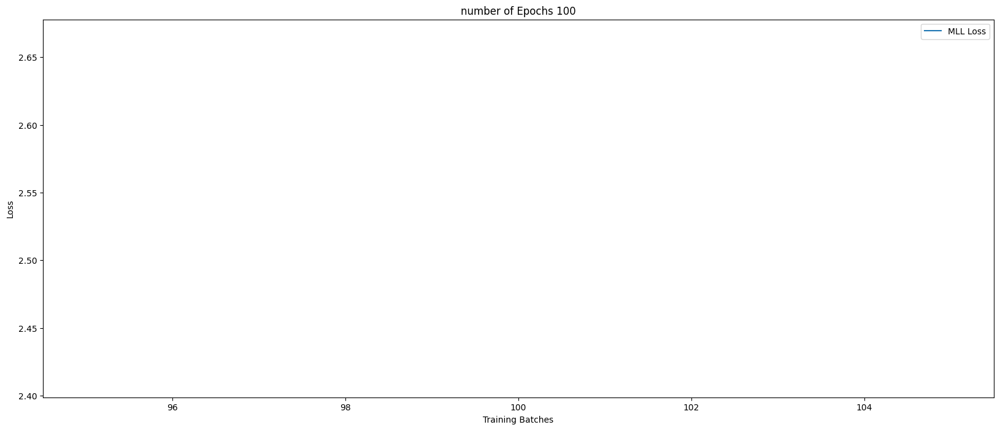

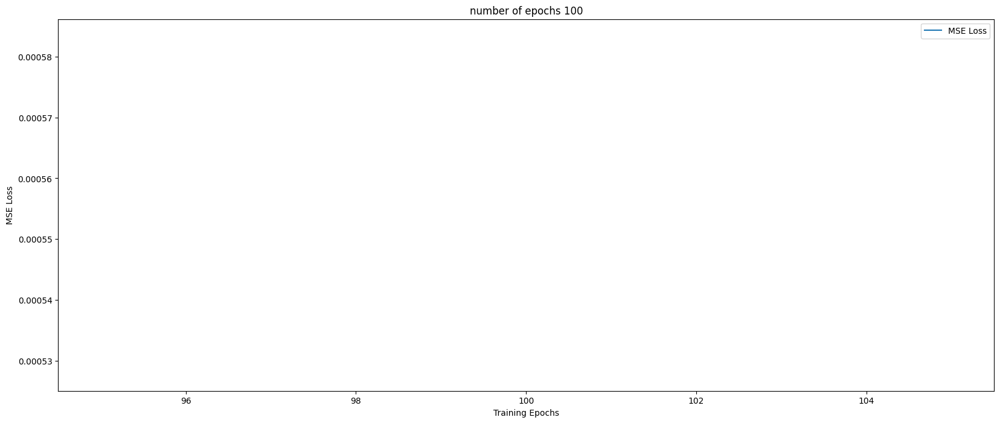

Prediction after training with new task 2 
plot DKL


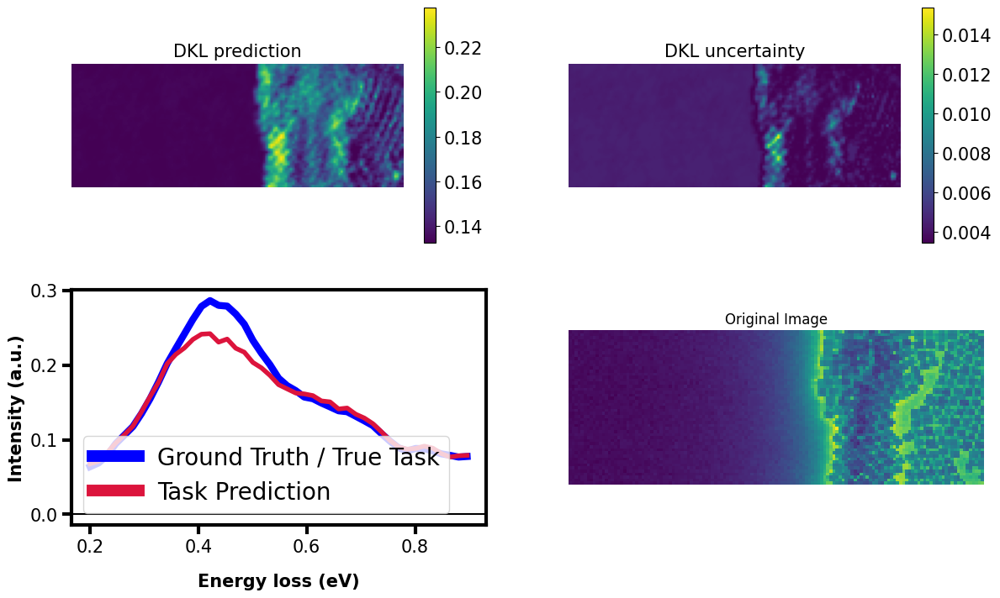

In [38]:
k1,k2 = 0,-1
torch.set_default_device('cuda')
torch.manual_seed(42)
with torch.no_grad():
    new_X2,new_y2,e_reduced2,new_full_img2,new_specim2,new_ind2=task_t(2,data_augmentation=False)
    
model,mll_loss,train_loss = perform_k_training_steps_train_and_test(deepcopy(dklgp_reptile),new_X2,new_y2,e_reduced2,nth_task=2,k_shots=1,training_cycle=100,batch_size=32)
print("Prediction after training with new task 2 ")
clear_cache()
dkl_pred_aft2, dkl_unc_aft2, pred_spec_aft2, meas_spec_aft2, mean_aft2, var_aft2 = plot_DKL_prediction_preacquired_notactive(model_name=deepcopy(model),
                                                                                                                       structural_img=new_full_img2,
                                                                                                                       spectral_img=new_specim2, 
                                                                                                                       X_var=new_X2,y_var=new_y2,e_red=e_reduced2,
                                                                                                                       figsize = (14,8),
                                                                                                                       energy_range = [k1,k2],indices_=new_ind2)


Plotting Inference

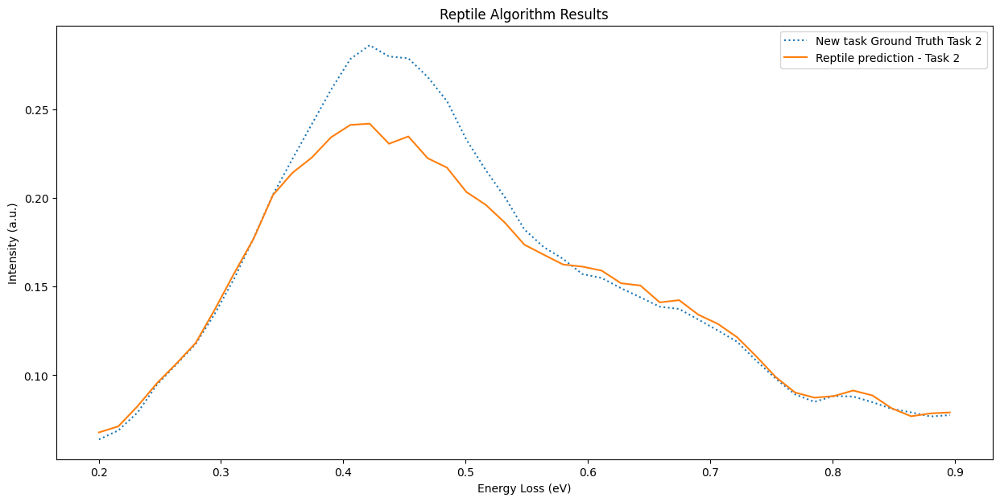

In [39]:

plt.figure(figsize=(15,7))

plt.title('Reptile Algorithm Results')
plt.xlabel('Energy Loss (eV)')
plt.ylabel('Intensity (a.u.)')

plt.plot(e_reduced2[k1:k2].detach().cpu().numpy(),meas_spec_aft2.detach().cpu().numpy(),linestyle='dotted',label='New task Ground Truth Task 2')
plt.plot(e_reduced2[k1:k2].detach().cpu().numpy(),pred_spec_aft2,label='Reptile prediction - Task 2')

plt.legend(loc='best')


In [40]:
clear_cache()

### Regular Model

Unseen Task 2

dtype : torch.float64
specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


Date-Time : 2023-10-31 01:04:11,003 : Line No. : 3 - Training the model with new task dataset of size torch.Size([6987, 256]), with Training Cycle 100 | Batch size 32
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 01:04:11,254 : Line No. : 17 - Train Size : 5589 and Test Size : 1398


Train Size : 5589 and Test Size : 1398
 Number of batches: 174.65625


Date-Time : 2023-10-31 01:04:11,255 : Line No. : 20 -  Number of batches: 174.65625


Epoch 1/100 ... Training loss: 37.097
Epoch 10/100 ... Training loss: 36.8639
Epoch 20/100 ... Training loss: 36.8623
Epoch 30/100 ... Training loss: 37.1975
Epoch 40/100 ... Training loss: 37.3229
Epoch 50/100 ... Training loss: 37.2157
Epoch 60/100 ... Training loss: 37.1549
Epoch 70/100 ... Training loss: 37.1861
Epoch 80/100 ... Training loss: 37.2009
Epoch 90/100 ... Training loss: 37.213
Epoch 100/100 ... Training loss: 37.2437


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.3118
Epoch 10/100 ... Training loss: 37.1339
Epoch 20/100 ... Training loss: 37.2868
Epoch 30/100 ... Training loss: 37.1552
Epoch 40/100 ... Training loss: 37.3537
Epoch 50/100 ... Training loss: 36.8977
Epoch 60/100 ... Training loss: 37.1714
Epoch 70/100 ... Training loss: 37.3581
Epoch 80/100 ... Training loss: 37.2354
Epoch 90/100 ... Training loss: 37.104
Epoch 100/100 ... Training loss: 36.9799


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.2576
Epoch 10/100 ... Training loss: 37.2332
Epoch 20/100 ... Training loss: 37.2213
Epoch 30/100 ... Training loss: 37.1435
Epoch 40/100 ... Training loss: 37.2453
Epoch 50/100 ... Training loss: 37.0821
Epoch 60/100 ... Training loss: 37.1605
Epoch 70/100 ... Training loss: 37.1531
Epoch 80/100 ... Training loss: 37.1143
Epoch 90/100 ... Training loss: 36.9954
Epoch 100/100 ... Training loss: 37.0246


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.0445
Epoch 10/100 ... Training loss: 37.1036
Epoch 20/100 ... Training loss: 37.1372
Epoch 30/100 ... Training loss: 37.063
Epoch 40/100 ... Training loss: 37.0675
Epoch 50/100 ... Training loss: 37.0568
Epoch 60/100 ... Training loss: 37.0981
Epoch 70/100 ... Training loss: 37.0928
Epoch 80/100 ... Training loss: 36.7646
Epoch 90/100 ... Training loss: 36.8327
Epoch 100/100 ... Training loss: 36.6342


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.9369
Epoch 10/100 ... Training loss: 36.5245
Epoch 20/100 ... Training loss: 36.851
Epoch 30/100 ... Training loss: 36.9207
Epoch 40/100 ... Training loss: 36.4777
Epoch 50/100 ... Training loss: 36.8412
Epoch 60/100 ... Training loss: 36.6013
Epoch 70/100 ... Training loss: 36.6413
Epoch 80/100 ... Training loss: 36.811
Epoch 90/100 ... Training loss: 36.7105
Epoch 100/100 ... Training loss: 36.7196


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.4713
Epoch 10/100 ... Training loss: 36.715
Epoch 20/100 ... Training loss: 36.636
Epoch 30/100 ... Training loss: 36.5822
Epoch 40/100 ... Training loss: 36.6185
Epoch 50/100 ... Training loss: 36.8279
Epoch 60/100 ... Training loss: 36.5504
Epoch 70/100 ... Training loss: 36.6889
Epoch 80/100 ... Training loss: 36.5596
Epoch 90/100 ... Training loss: 36.6085
Epoch 100/100 ... Training loss: 36.4927


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.6704
Epoch 10/100 ... Training loss: 36.4695
Epoch 20/100 ... Training loss: 36.6524
Epoch 30/100 ... Training loss: 36.6573
Epoch 40/100 ... Training loss: 36.4531
Epoch 50/100 ... Training loss: 36.5871
Epoch 60/100 ... Training loss: 36.6096
Epoch 70/100 ... Training loss: 36.4465
Epoch 80/100 ... Training loss: 36.3345
Epoch 90/100 ... Training loss: 36.2857
Epoch 100/100 ... Training loss: 36.4761


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.4568
Epoch 10/100 ... Training loss: 36.3804
Epoch 20/100 ... Training loss: 36.3318
Epoch 30/100 ... Training loss: 36.0314
Epoch 40/100 ... Training loss: 36.1513
Epoch 50/100 ... Training loss: 36.1688
Epoch 60/100 ... Training loss: 36.3789
Epoch 70/100 ... Training loss: 36.2122
Epoch 80/100 ... Training loss: 36.1418
Epoch 90/100 ... Training loss: 36.0966
Epoch 100/100 ... Training loss: 36.3207


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.3189
Epoch 10/100 ... Training loss: 36.3189
Epoch 20/100 ... Training loss: 36.2235
Epoch 30/100 ... Training loss: 36.2215
Epoch 40/100 ... Training loss: 36.2634
Epoch 50/100 ... Training loss: 36.2853
Epoch 60/100 ... Training loss: 36.2876
Epoch 70/100 ... Training loss: 35.8374
Epoch 80/100 ... Training loss: 35.8527
Epoch 90/100 ... Training loss: 35.8245
Epoch 100/100 ... Training loss: 36.1628


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.1547
Epoch 10/100 ... Training loss: 36.1707
Epoch 20/100 ... Training loss: 36.1299
Epoch 30/100 ... Training loss: 36.1516
Epoch 40/100 ... Training loss: 36.0435
Epoch 50/100 ... Training loss: 35.9517
Epoch 60/100 ... Training loss: 35.9408
Epoch 70/100 ... Training loss: 36.0418
Epoch 80/100 ... Training loss: 35.8985
Epoch 90/100 ... Training loss: 36.0226
Epoch 100/100 ... Training loss: 35.6446


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.7164
Epoch 10/100 ... Training loss: 35.7485
Epoch 20/100 ... Training loss: 35.8453
Epoch 30/100 ... Training loss: 35.8297
Epoch 40/100 ... Training loss: 35.804
Epoch 50/100 ... Training loss: 35.8577
Epoch 60/100 ... Training loss: 35.8917
Epoch 70/100 ... Training loss: 35.6823
Epoch 80/100 ... Training loss: 35.7502
Epoch 90/100 ... Training loss: 35.7564
Epoch 100/100 ... Training loss: 35.7654


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.7993
Epoch 10/100 ... Training loss: 35.7302
Epoch 20/100 ... Training loss: 35.7539
Epoch 30/100 ... Training loss: 35.3186
Epoch 40/100 ... Training loss: 35.6842
Epoch 50/100 ... Training loss: 35.6945
Epoch 60/100 ... Training loss: 35.3066
Epoch 70/100 ... Training loss: 35.3989
Epoch 80/100 ... Training loss: 35.304
Epoch 90/100 ... Training loss: 35.5798
Epoch 100/100 ... Training loss: 35.6364


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.542
Epoch 10/100 ... Training loss: 35.4383
Epoch 20/100 ... Training loss: 35.3492
Epoch 30/100 ... Training loss: 35.4791
Epoch 40/100 ... Training loss: 35.4335
Epoch 50/100 ... Training loss: 35.4589
Epoch 60/100 ... Training loss: 35.4432
Epoch 70/100 ... Training loss: 35.4516
Epoch 80/100 ... Training loss: 35.372
Epoch 90/100 ... Training loss: 35.526
Epoch 100/100 ... Training loss: 35.427


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.4517
Epoch 10/100 ... Training loss: 35.3439
Epoch 20/100 ... Training loss: 35.2196
Epoch 30/100 ... Training loss: 35.315
Epoch 40/100 ... Training loss: 35.2687
Epoch 50/100 ... Training loss: 35.1718
Epoch 60/100 ... Training loss: 35.2778
Epoch 70/100 ... Training loss: 35.2731
Epoch 80/100 ... Training loss: 35.2987
Epoch 90/100 ... Training loss: 35.0333
Epoch 100/100 ... Training loss: 35.2142


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.2121
Epoch 10/100 ... Training loss: 35.1944
Epoch 20/100 ... Training loss: 35.2088
Epoch 30/100 ... Training loss: 34.7377
Epoch 40/100 ... Training loss: 35.1334
Epoch 50/100 ... Training loss: 35.1636
Epoch 60/100 ... Training loss: 34.9543
Epoch 70/100 ... Training loss: 35.0119
Epoch 80/100 ... Training loss: 34.804
Epoch 90/100 ... Training loss: 35.0482
Epoch 100/100 ... Training loss: 35.041


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.0392
Epoch 10/100 ... Training loss: 35.0155
Epoch 20/100 ... Training loss: 34.7953
Epoch 30/100 ... Training loss: 34.9776
Epoch 40/100 ... Training loss: 34.8754
Epoch 50/100 ... Training loss: 34.9223
Epoch 60/100 ... Training loss: 34.8713
Epoch 70/100 ... Training loss: 34.7846
Epoch 80/100 ... Training loss: 34.7079
Epoch 90/100 ... Training loss: 34.8505
Epoch 100/100 ... Training loss: 34.8321


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.8309
Epoch 10/100 ... Training loss: 34.8682
Epoch 20/100 ... Training loss: 34.8078
Epoch 30/100 ... Training loss: 34.7778
Epoch 40/100 ... Training loss: 34.792
Epoch 50/100 ... Training loss: 34.7428
Epoch 60/100 ... Training loss: 34.6872
Epoch 70/100 ... Training loss: 34.6492
Epoch 80/100 ... Training loss: 34.6321
Epoch 90/100 ... Training loss: 34.6666
Epoch 100/100 ... Training loss: 34.6286


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.6229
Epoch 10/100 ... Training loss: 34.6196
Epoch 20/100 ... Training loss: 34.5735
Epoch 30/100 ... Training loss: 34.5513
Epoch 40/100 ... Training loss: 34.4839
Epoch 50/100 ... Training loss: 34.5233
Epoch 60/100 ... Training loss: 34.5022
Epoch 70/100 ... Training loss: 34.4942
Epoch 80/100 ... Training loss: 34.4529
Epoch 90/100 ... Training loss: 34.4676
Epoch 100/100 ... Training loss: 34.4133


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.4134
Epoch 10/100 ... Training loss: 34.38
Epoch 20/100 ... Training loss: 34.3869
Epoch 30/100 ... Training loss: 34.4534
Epoch 40/100 ... Training loss: 34.4125
Epoch 50/100 ... Training loss: 34.3501
Epoch 60/100 ... Training loss: 34.3212
Epoch 70/100 ... Training loss: 34.323
Epoch 80/100 ... Training loss: 34.306
Epoch 90/100 ... Training loss: 34.2963
Epoch 100/100 ... Training loss: 34.3136


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.3214
Epoch 10/100 ... Training loss: 33.9825
Epoch 20/100 ... Training loss: 34.0904
Epoch 30/100 ... Training loss: 33.8913
Epoch 40/100 ... Training loss: 34.1101
Epoch 50/100 ... Training loss: 34.2339
Epoch 60/100 ... Training loss: 33.953
Epoch 70/100 ... Training loss: 33.8938
Epoch 80/100 ... Training loss: 34.114
Epoch 90/100 ... Training loss: 34.1186
Epoch 100/100 ... Training loss: 33.9716


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.9666
Epoch 10/100 ... Training loss: 34.1099
Epoch 20/100 ... Training loss: 34.0215
Epoch 30/100 ... Training loss: 33.9932
Epoch 40/100 ... Training loss: 33.9748
Epoch 50/100 ... Training loss: 33.9601
Epoch 60/100 ... Training loss: 33.9573
Epoch 70/100 ... Training loss: 33.7522
Epoch 80/100 ... Training loss: 33.7511
Epoch 90/100 ... Training loss: 33.8325
Epoch 100/100 ... Training loss: 33.8403


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.8178
Epoch 10/100 ... Training loss: 34.0061
Epoch 20/100 ... Training loss: 33.7882
Epoch 30/100 ... Training loss: 33.7477
Epoch 40/100 ... Training loss: 33.626
Epoch 50/100 ... Training loss: 33.3605
Epoch 60/100 ... Training loss: 33.7286
Epoch 70/100 ... Training loss: 33.7681
Epoch 80/100 ... Training loss: 33.6656
Epoch 90/100 ... Training loss: 33.7219
Epoch 100/100 ... Training loss: 33.7088


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.7079
Epoch 10/100 ... Training loss: 33.7198
Epoch 20/100 ... Training loss: 33.5451
Epoch 30/100 ... Training loss: 33.6047
Epoch 40/100 ... Training loss: 33.5722
Epoch 50/100 ... Training loss: 33.481
Epoch 60/100 ... Training loss: 33.6506
Epoch 70/100 ... Training loss: 33.4081
Epoch 80/100 ... Training loss: 33.5199
Epoch 90/100 ... Training loss: 33.3117
Epoch 100/100 ... Training loss: 33.4913


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.4894
Epoch 10/100 ... Training loss: 33.4732
Epoch 20/100 ... Training loss: 33.4575
Epoch 30/100 ... Training loss: 33.4462
Epoch 40/100 ... Training loss: 33.4913
Epoch 50/100 ... Training loss: 33.3939
Epoch 60/100 ... Training loss: 33.4381
Epoch 70/100 ... Training loss: 33.2707
Epoch 80/100 ... Training loss: 33.4367
Epoch 90/100 ... Training loss: 33.167
Epoch 100/100 ... Training loss: 33.2992


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.2949
Epoch 10/100 ... Training loss: 33.2792
Epoch 20/100 ... Training loss: 33.2588
Epoch 30/100 ... Training loss: 33.2376
Epoch 40/100 ... Training loss: 33.2103
Epoch 50/100 ... Training loss: 33.1891
Epoch 60/100 ... Training loss: 33.1653
Epoch 70/100 ... Training loss: 33.2402
Epoch 80/100 ... Training loss: 33.1162
Epoch 90/100 ... Training loss: 33.1233
Epoch 100/100 ... Training loss: 33.1009


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.1
Epoch 10/100 ... Training loss: 33.0762
Epoch 20/100 ... Training loss: 32.9658
Epoch 30/100 ... Training loss: 33.159
Epoch 40/100 ... Training loss: 32.9583
Epoch 50/100 ... Training loss: 33.054
Epoch 60/100 ... Training loss: 32.9222
Epoch 70/100 ... Training loss: 33.0862
Epoch 80/100 ... Training loss: 32.907
Epoch 90/100 ... Training loss: 32.8766
Epoch 100/100 ... Training loss: 32.8575


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.6852
Epoch 10/100 ... Training loss: 32.6962
Epoch 20/100 ... Training loss: 32.4714
Epoch 30/100 ... Training loss: 32.9827
Epoch 40/100 ... Training loss: 32.7459
Epoch 50/100 ... Training loss: 32.7182
Epoch 60/100 ... Training loss: 32.8863
Epoch 70/100 ... Training loss: 32.6509
Epoch 80/100 ... Training loss: 32.7207
Epoch 90/100 ... Training loss: 32.6974
Epoch 100/100 ... Training loss: 32.7269


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.7261
Epoch 10/100 ... Training loss: 32.6717
Epoch 20/100 ... Training loss: 32.6549
Epoch 30/100 ... Training loss: 32.6348
Epoch 40/100 ... Training loss: 32.61
Epoch 50/100 ... Training loss: 32.6035
Epoch 60/100 ... Training loss: 32.5328
Epoch 70/100 ... Training loss: 32.5339
Epoch 80/100 ... Training loss: 32.3176
Epoch 90/100 ... Training loss: 32.3099
Epoch 100/100 ... Training loss: 32.4066


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.1708
Epoch 10/100 ... Training loss: 32.4815
Epoch 20/100 ... Training loss: 32.393
Epoch 30/100 ... Training loss: 32.4594
Epoch 40/100 ... Training loss: 32.2812
Epoch 50/100 ... Training loss: 32.5352
Epoch 60/100 ... Training loss: 32.4025
Epoch 70/100 ... Training loss: 32.4473
Epoch 80/100 ... Training loss: 32.3406
Epoch 90/100 ... Training loss: 32.2738
Epoch 100/100 ... Training loss: 32.1574


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.1669
Epoch 10/100 ... Training loss: 32.3581
Epoch 20/100 ... Training loss: 32.0003
Epoch 30/100 ... Training loss: 32.2734
Epoch 40/100 ... Training loss: 32.272
Epoch 50/100 ... Training loss: 32.1582
Epoch 60/100 ... Training loss: 32.2792
Epoch 70/100 ... Training loss: 32.1747
Epoch 80/100 ... Training loss: 32.1533
Epoch 90/100 ... Training loss: 32.2701
Epoch 100/100 ... Training loss: 32.165


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.1701
Epoch 10/100 ... Training loss: 32.1093
Epoch 20/100 ... Training loss: 32.0777
Epoch 30/100 ... Training loss: 32.1072
Epoch 40/100 ... Training loss: 32.0436
Epoch 50/100 ... Training loss: 32.0187
Epoch 60/100 ... Training loss: 32.1932
Epoch 70/100 ... Training loss: 31.9315
Epoch 80/100 ... Training loss: 31.9292
Epoch 90/100 ... Training loss: 31.9067
Epoch 100/100 ... Training loss: 31.9002


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.8906
Epoch 10/100 ... Training loss: 32.0852
Epoch 20/100 ... Training loss: 31.8563
Epoch 30/100 ... Training loss: 31.9444
Epoch 40/100 ... Training loss: 31.9357
Epoch 50/100 ... Training loss: 31.9312
Epoch 60/100 ... Training loss: 31.9309
Epoch 70/100 ... Training loss: 31.8756
Epoch 80/100 ... Training loss: 31.7657
Epoch 90/100 ... Training loss: 31.6298
Epoch 100/100 ... Training loss: 31.926


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.8384
Epoch 10/100 ... Training loss: 31.6215
Epoch 20/100 ... Training loss: 31.7985
Epoch 30/100 ... Training loss: 31.7164
Epoch 40/100 ... Training loss: 31.6931
Epoch 50/100 ... Training loss: 31.6516
Epoch 60/100 ... Training loss: 31.6476
Epoch 70/100 ... Training loss: 31.6297
Epoch 80/100 ... Training loss: 31.6144
Epoch 90/100 ... Training loss: 31.5731
Epoch 100/100 ... Training loss: 31.5546


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.5538
Epoch 10/100 ... Training loss: 31.5039
Epoch 20/100 ... Training loss: 31.513
Epoch 30/100 ... Training loss: 31.4623
Epoch 40/100 ... Training loss: 31.4485
Epoch 50/100 ... Training loss: 31.4212
Epoch 60/100 ... Training loss: 31.2107
Epoch 70/100 ... Training loss: 31.4242
Epoch 80/100 ... Training loss: 31.3653
Epoch 90/100 ... Training loss: 31.3649
Epoch 100/100 ... Training loss: 31.3611


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.3788
Epoch 10/100 ... Training loss: 31.3291
Epoch 20/100 ... Training loss: 31.309
Epoch 30/100 ... Training loss: 31.3426
Epoch 40/100 ... Training loss: 31.2612
Epoch 50/100 ... Training loss: 31.3106
Epoch 60/100 ... Training loss: 31.1761
Epoch 70/100 ... Training loss: 31.1745
Epoch 80/100 ... Training loss: 31.1196
Epoch 90/100 ... Training loss: 31.3879
Epoch 100/100 ... Training loss: 31.3459


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.8435
Epoch 10/100 ... Training loss: 31.1396
Epoch 20/100 ... Training loss: 31.1251
Epoch 30/100 ... Training loss: 31.1141
Epoch 40/100 ... Training loss: 31.1049
Epoch 50/100 ... Training loss: 30.9088
Epoch 60/100 ... Training loss: 30.8864
Epoch 70/100 ... Training loss: 31.0041
Epoch 80/100 ... Training loss: 30.9891
Epoch 90/100 ... Training loss: 31.0224
Epoch 100/100 ... Training loss: 30.9336


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.9315
Epoch 10/100 ... Training loss: 30.912
Epoch 20/100 ... Training loss: 30.889
Epoch 30/100 ... Training loss: 30.8867
Epoch 40/100 ... Training loss: 30.8497
Epoch 50/100 ... Training loss: 30.8281
Epoch 60/100 ... Training loss: 30.8068
Epoch 70/100 ... Training loss: 30.7861
Epoch 80/100 ... Training loss: 30.7647
Epoch 90/100 ... Training loss: 30.7506
Epoch 100/100 ... Training loss: 30.7315


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.7097
Epoch 10/100 ... Training loss: 30.7016
Epoch 20/100 ... Training loss: 30.692
Epoch 30/100 ... Training loss: 30.6913
Epoch 40/100 ... Training loss: 30.6147
Epoch 50/100 ... Training loss: 30.5586
Epoch 60/100 ... Training loss: 30.5385
Epoch 70/100 ... Training loss: 30.563
Epoch 80/100 ... Training loss: 30.5391
Epoch 90/100 ... Training loss: 30.5331
Epoch 100/100 ... Training loss: 30.5131


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.5129
Epoch 10/100 ... Training loss: 30.4649
Epoch 20/100 ... Training loss: 30.2477
Epoch 30/100 ... Training loss: 30.344
Epoch 40/100 ... Training loss: 30.3529
Epoch 50/100 ... Training loss: 30.5807
Epoch 60/100 ... Training loss: 30.2654
Epoch 70/100 ... Training loss: 30.3337
Epoch 80/100 ... Training loss: 30.3036
Epoch 90/100 ... Training loss: 30.2651
Epoch 100/100 ... Training loss: 30.1904


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.1743
Epoch 10/100 ... Training loss: 30.5955
Epoch 20/100 ... Training loss: 30.246
Epoch 30/100 ... Training loss: 30.1183
Epoch 40/100 ... Training loss: 30.4575
Epoch 50/100 ... Training loss: 30.2039
Epoch 60/100 ... Training loss: 30.2366
Epoch 70/100 ... Training loss: 29.9611
Epoch 80/100 ... Training loss: 30.2704
Epoch 90/100 ... Training loss: 30.0653
Epoch 100/100 ... Training loss: 29.9134


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.1262
Epoch 10/100 ... Training loss: 29.9806
Epoch 20/100 ... Training loss: 29.997
Epoch 30/100 ... Training loss: 29.9884
Epoch 40/100 ... Training loss: 29.9523
Epoch 50/100 ... Training loss: 29.8733
Epoch 60/100 ... Training loss: 29.7555
Epoch 70/100 ... Training loss: 29.9863
Epoch 80/100 ... Training loss: 29.9147
Epoch 90/100 ... Training loss: 29.7362
Epoch 100/100 ... Training loss: 29.7219


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.7939
Epoch 10/100 ... Training loss: 29.8183
Epoch 20/100 ... Training loss: 29.7716
Epoch 30/100 ... Training loss: 29.9448
Epoch 40/100 ... Training loss: 29.934
Epoch 50/100 ... Training loss: 29.9542
Epoch 60/100 ... Training loss: 29.7888
Epoch 70/100 ... Training loss: 29.5314
Epoch 80/100 ... Training loss: 29.4366
Epoch 90/100 ... Training loss: 29.6782
Epoch 100/100 ... Training loss: 29.6207


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.6142
Epoch 10/100 ... Training loss: 29.4284
Epoch 20/100 ... Training loss: 29.477
Epoch 30/100 ... Training loss: 29.4709
Epoch 40/100 ... Training loss: 29.6621
Epoch 50/100 ... Training loss: 29.5306
Epoch 60/100 ... Training loss: 29.7054
Epoch 70/100 ... Training loss: 29.3098
Epoch 80/100 ... Training loss: 29.6301
Epoch 90/100 ... Training loss: 29.5368
Epoch 100/100 ... Training loss: 29.2649


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.7675
Epoch 10/100 ... Training loss: 29.6258
Epoch 20/100 ... Training loss: 29.41
Epoch 30/100 ... Training loss: 29.3759
Epoch 40/100 ... Training loss: 29.327
Epoch 50/100 ... Training loss: 29.1172
Epoch 60/100 ... Training loss: 29.2997
Epoch 70/100 ... Training loss: 29.2691
Epoch 80/100 ... Training loss: 29.607
Epoch 90/100 ... Training loss: 29.0612
Epoch 100/100 ... Training loss: 29.0286


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.9574
Epoch 10/100 ... Training loss: 29.3346
Epoch 20/100 ... Training loss: 29.016
Epoch 30/100 ... Training loss: 28.9109
Epoch 40/100 ... Training loss: 28.8799
Epoch 50/100 ... Training loss: 28.9267
Epoch 60/100 ... Training loss: 28.8439
Epoch 70/100 ... Training loss: 28.819
Epoch 80/100 ... Training loss: 28.8023
Epoch 90/100 ... Training loss: 28.784
Epoch 100/100 ... Training loss: 28.771


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.7636
Epoch 10/100 ... Training loss: 28.7986
Epoch 20/100 ... Training loss: 28.7289
Epoch 30/100 ... Training loss: 28.7085
Epoch 40/100 ... Training loss: 28.6965
Epoch 50/100 ... Training loss: 29.0318
Epoch 60/100 ... Training loss: 28.7799
Epoch 70/100 ... Training loss: 28.8649
Epoch 80/100 ... Training loss: 28.9156
Epoch 90/100 ... Training loss: 28.8902
Epoch 100/100 ... Training loss: 28.8612


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.8582
Epoch 10/100 ... Training loss: 28.8304
Epoch 20/100 ... Training loss: 28.798
Epoch 30/100 ... Training loss: 28.7619
Epoch 40/100 ... Training loss: 28.7143
Epoch 50/100 ... Training loss: 28.5416
Epoch 60/100 ... Training loss: 28.7032
Epoch 70/100 ... Training loss: 28.6829
Epoch 80/100 ... Training loss: 28.6496
Epoch 90/100 ... Training loss: 28.6859
Epoch 100/100 ... Training loss: 28.6035


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.5979
Epoch 10/100 ... Training loss: 28.5778
Epoch 20/100 ... Training loss: 28.661
Epoch 30/100 ... Training loss: 28.6312
Epoch 40/100 ... Training loss: 28.4864
Epoch 50/100 ... Training loss: 28.6756
Epoch 60/100 ... Training loss: 28.408
Epoch 70/100 ... Training loss: 28.32
Epoch 80/100 ... Training loss: 28.736
Epoch 90/100 ... Training loss: 28.2926
Epoch 100/100 ... Training loss: 28.3273


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.3051
Epoch 10/100 ... Training loss: 28.4375
Epoch 20/100 ... Training loss: 28.519
Epoch 30/100 ... Training loss: 28.3359
Epoch 40/100 ... Training loss: 28.3152
Epoch 50/100 ... Training loss: 28.2985
Epoch 60/100 ... Training loss: 28.2443
Epoch 70/100 ... Training loss: 28.2001
Epoch 80/100 ... Training loss: 28.2547
Epoch 90/100 ... Training loss: 28.1764
Epoch 100/100 ... Training loss: 28.0532


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.2577
Epoch 10/100 ... Training loss: 28.1903
Epoch 20/100 ... Training loss: 28.0312
Epoch 30/100 ... Training loss: 28.1244
Epoch 40/100 ... Training loss: 28.0981
Epoch 50/100 ... Training loss: 28.2022
Epoch 60/100 ... Training loss: 28.084
Epoch 70/100 ... Training loss: 28.2214
Epoch 80/100 ... Training loss: 27.8788
Epoch 90/100 ... Training loss: 28.0144
Epoch 100/100 ... Training loss: 28.0151


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.0173
Epoch 10/100 ... Training loss: 27.8538
Epoch 20/100 ... Training loss: 27.9032
Epoch 30/100 ... Training loss: 27.8854
Epoch 40/100 ... Training loss: 27.8321
Epoch 50/100 ... Training loss: 27.8531
Epoch 60/100 ... Training loss: 27.8301
Epoch 70/100 ... Training loss: 27.7938
Epoch 80/100 ... Training loss: 27.7109
Epoch 90/100 ... Training loss: 27.8397
Epoch 100/100 ... Training loss: 27.9126


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.8979
Epoch 10/100 ... Training loss: 28.0316
Epoch 20/100 ... Training loss: 27.721
Epoch 30/100 ... Training loss: 27.8384
Epoch 40/100 ... Training loss: 27.6026
Epoch 50/100 ... Training loss: 27.927
Epoch 60/100 ... Training loss: 27.6014
Epoch 70/100 ... Training loss: 27.565
Epoch 80/100 ... Training loss: 27.6476
Epoch 90/100 ... Training loss: 27.624
Epoch 100/100 ... Training loss: 27.53


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.5186
Epoch 10/100 ... Training loss: 27.4706
Epoch 20/100 ... Training loss: 27.5451
Epoch 30/100 ... Training loss: 27.4052
Epoch 40/100 ... Training loss: 27.522
Epoch 50/100 ... Training loss: 27.4022
Epoch 60/100 ... Training loss: 27.3583
Epoch 70/100 ... Training loss: 27.4794
Epoch 80/100 ... Training loss: 27.3883
Epoch 90/100 ... Training loss: 27.3973
Epoch 100/100 ... Training loss: 27.3278


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.3557
Epoch 10/100 ... Training loss: 27.3452
Epoch 20/100 ... Training loss: 27.57
Epoch 30/100 ... Training loss: 27.2138
Epoch 40/100 ... Training loss: 27.2375
Epoch 50/100 ... Training loss: 27.2038
Epoch 60/100 ... Training loss: 27.6133
Epoch 70/100 ... Training loss: 27.2666
Epoch 80/100 ... Training loss: 27.2494
Epoch 90/100 ... Training loss: 27.2751
Epoch 100/100 ... Training loss: 27.631


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.5138
Epoch 10/100 ... Training loss: 27.061
Epoch 20/100 ... Training loss: 27.0742
Epoch 30/100 ... Training loss: 27.197
Epoch 40/100 ... Training loss: 27.071
Epoch 50/100 ... Training loss: 26.9838
Epoch 60/100 ... Training loss: 27.1998
Epoch 70/100 ... Training loss: 27.0077
Epoch 80/100 ... Training loss: 27.2322
Epoch 90/100 ... Training loss: 27.1656
Epoch 100/100 ... Training loss: 27.2023


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.9805
Epoch 10/100 ... Training loss: 26.8893
Epoch 20/100 ... Training loss: 26.9566
Epoch 30/100 ... Training loss: 26.9304
Epoch 40/100 ... Training loss: 26.8887
Epoch 50/100 ... Training loss: 26.8636
Epoch 60/100 ... Training loss: 26.8718
Epoch 70/100 ... Training loss: 26.814
Epoch 80/100 ... Training loss: 26.8258
Epoch 90/100 ... Training loss: 26.7355
Epoch 100/100 ... Training loss: 26.7148


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.735
Epoch 10/100 ... Training loss: 26.7094
Epoch 20/100 ... Training loss: 26.7825
Epoch 30/100 ... Training loss: 26.6634
Epoch 40/100 ... Training loss: 26.6786
Epoch 50/100 ... Training loss: 26.6565
Epoch 60/100 ... Training loss: 26.6274
Epoch 70/100 ... Training loss: 26.5979
Epoch 80/100 ... Training loss: 26.5694
Epoch 90/100 ... Training loss: 26.5393
Epoch 100/100 ... Training loss: 26.5012


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.4969
Epoch 10/100 ... Training loss: 26.8328
Epoch 20/100 ... Training loss: 26.6299
Epoch 30/100 ... Training loss: 26.4757
Epoch 40/100 ... Training loss: 26.5228
Epoch 50/100 ... Training loss: 26.4009
Epoch 60/100 ... Training loss: 26.4119
Epoch 70/100 ... Training loss: 26.3862
Epoch 80/100 ... Training loss: 26.3535
Epoch 90/100 ... Training loss: 26.3278
Epoch 100/100 ... Training loss: 26.7956


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.8189
Epoch 10/100 ... Training loss: 26.3124
Epoch 20/100 ... Training loss: 26.3196
Epoch 30/100 ... Training loss: 26.2767
Epoch 40/100 ... Training loss: 26.2432
Epoch 50/100 ... Training loss: 26.2199
Epoch 60/100 ... Training loss: 26.1945
Epoch 70/100 ... Training loss: 26.1673
Epoch 80/100 ... Training loss: 26.2574
Epoch 90/100 ... Training loss: 26.3708
Epoch 100/100 ... Training loss: 26.1338


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.136
Epoch 10/100 ... Training loss: 26.1248
Epoch 20/100 ... Training loss: 26.1054
Epoch 30/100 ... Training loss: 26.0697
Epoch 40/100 ... Training loss: 26.0693
Epoch 50/100 ... Training loss: 26.0238
Epoch 60/100 ... Training loss: 26.0041
Epoch 70/100 ... Training loss: 25.9838
Epoch 80/100 ... Training loss: 25.9644
Epoch 90/100 ... Training loss: 25.9464
Epoch 100/100 ... Training loss: 25.9428


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.9473
Epoch 10/100 ... Training loss: 26.097
Epoch 20/100 ... Training loss: 25.9756
Epoch 30/100 ... Training loss: 26.0082
Epoch 40/100 ... Training loss: 25.8658
Epoch 50/100 ... Training loss: 25.9895
Epoch 60/100 ... Training loss: 25.8219
Epoch 70/100 ... Training loss: 25.8444
Epoch 80/100 ... Training loss: 25.7891
Epoch 90/100 ... Training loss: 25.7673
Epoch 100/100 ... Training loss: 25.7382


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.7453
Epoch 10/100 ... Training loss: 26.1717
Epoch 20/100 ... Training loss: 25.7736
Epoch 30/100 ... Training loss: 25.6953
Epoch 40/100 ... Training loss: 25.659
Epoch 50/100 ... Training loss: 25.6486
Epoch 60/100 ... Training loss: 25.9727
Epoch 70/100 ... Training loss: 26.0046
Epoch 80/100 ... Training loss: 25.5873
Epoch 90/100 ... Training loss: 25.566
Epoch 100/100 ... Training loss: 25.5464


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.545
Epoch 10/100 ... Training loss: 25.5509
Epoch 20/100 ... Training loss: 25.8212
Epoch 30/100 ... Training loss: 25.495
Epoch 40/100 ... Training loss: 25.4841
Epoch 50/100 ... Training loss: 25.4586
Epoch 60/100 ... Training loss: 25.4313
Epoch 70/100 ... Training loss: 25.4192
Epoch 80/100 ... Training loss: 25.3886
Epoch 90/100 ... Training loss: 25.3666
Epoch 100/100 ... Training loss: 25.8401


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.6276
Epoch 10/100 ... Training loss: 25.7567
Epoch 20/100 ... Training loss: 25.3306
Epoch 30/100 ... Training loss: 25.2973
Epoch 40/100 ... Training loss: 25.2792
Epoch 50/100 ... Training loss: 25.2557
Epoch 60/100 ... Training loss: 25.2333
Epoch 70/100 ... Training loss: 25.287
Epoch 80/100 ... Training loss: 25.2128
Epoch 90/100 ... Training loss: 25.2397
Epoch 100/100 ... Training loss: 25.1795


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 25.1772
Epoch 10/100 ... Training loss: 25.1556
Epoch 20/100 ... Training loss: 25.1317
Epoch 30/100 ... Training loss: 25.1087
Epoch 40/100 ... Training loss: 25.0876
Epoch 50/100 ... Training loss: 25.0702
Epoch 60/100 ... Training loss: 25.1105
Epoch 70/100 ... Training loss: 25.1561
Epoch 80/100 ... Training loss: 25.013
Epoch 90/100 ... Training loss: 24.9914
Epoch 100/100 ... Training loss: 24.9855


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.9989
Epoch 10/100 ... Training loss: 24.949
Epoch 20/100 ... Training loss: 24.9245
Epoch 30/100 ... Training loss: 24.9101
Epoch 40/100 ... Training loss: 24.8857
Epoch 50/100 ... Training loss: 24.8657
Epoch 60/100 ... Training loss: 24.8466
Epoch 70/100 ... Training loss: 24.8301
Epoch 80/100 ... Training loss: 24.8216
Epoch 90/100 ... Training loss: 25.1159
Epoch 100/100 ... Training loss: 24.9152


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.8079
Epoch 10/100 ... Training loss: 24.7653
Epoch 20/100 ... Training loss: 24.7457
Epoch 30/100 ... Training loss: 24.7211
Epoch 40/100 ... Training loss: 24.697
Epoch 50/100 ... Training loss: 24.6905
Epoch 60/100 ... Training loss: 24.6572
Epoch 70/100 ... Training loss: 24.6368
Epoch 80/100 ... Training loss: 24.779
Epoch 90/100 ... Training loss: 24.6986
Epoch 100/100 ... Training loss: 24.6679


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.7707
Epoch 10/100 ... Training loss: 24.6032
Epoch 20/100 ... Training loss: 24.6087
Epoch 30/100 ... Training loss: 24.5198
Epoch 40/100 ... Training loss: 24.5011
Epoch 50/100 ... Training loss: 24.4808
Epoch 60/100 ... Training loss: 24.461
Epoch 70/100 ... Training loss: 24.4408
Epoch 80/100 ... Training loss: 24.4207
Epoch 90/100 ... Training loss: 24.4012
Epoch 100/100 ... Training loss: 24.3822


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.3803
Epoch 10/100 ... Training loss: 24.3634
Epoch 20/100 ... Training loss: 24.3443
Epoch 30/100 ... Training loss: 24.3241
Epoch 40/100 ... Training loss: 24.3056
Epoch 50/100 ... Training loss: 24.3043
Epoch 60/100 ... Training loss: 24.2784
Epoch 70/100 ... Training loss: 24.2991
Epoch 80/100 ... Training loss: 24.2872
Epoch 90/100 ... Training loss: 24.2453
Epoch 100/100 ... Training loss: 24.2074


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.2076
Epoch 10/100 ... Training loss: 24.1716
Epoch 20/100 ... Training loss: 24.2508
Epoch 30/100 ... Training loss: 24.1959
Epoch 40/100 ... Training loss: 24.1723
Epoch 50/100 ... Training loss: 24.1898
Epoch 60/100 ... Training loss: 24.1496
Epoch 70/100 ... Training loss: 24.1324
Epoch 80/100 ... Training loss: 24.0567
Epoch 90/100 ... Training loss: 24.0227
Epoch 100/100 ... Training loss: 24.008


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 24.017
Epoch 10/100 ... Training loss: 23.9781
Epoch 20/100 ... Training loss: 23.9792
Epoch 30/100 ... Training loss: 23.9696
Epoch 40/100 ... Training loss: 23.9524
Epoch 50/100 ... Training loss: 23.9394
Epoch 60/100 ... Training loss: 23.8895
Epoch 70/100 ... Training loss: 24.0582
Epoch 80/100 ... Training loss: 23.8517
Epoch 90/100 ... Training loss: 23.8221
Epoch 100/100 ... Training loss: 23.811


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.8156
Epoch 10/100 ... Training loss: 23.7895
Epoch 20/100 ... Training loss: 23.7805
Epoch 30/100 ... Training loss: 23.8334
Epoch 40/100 ... Training loss: 23.813
Epoch 50/100 ... Training loss: 23.7633
Epoch 60/100 ... Training loss: 23.6925
Epoch 70/100 ... Training loss: 23.6711
Epoch 80/100 ... Training loss: 23.6505
Epoch 90/100 ... Training loss: 23.6317
Epoch 100/100 ... Training loss: 23.6182


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.6176
Epoch 10/100 ... Training loss: 23.6359
Epoch 20/100 ... Training loss: 23.636
Epoch 30/100 ... Training loss: 23.5518
Epoch 40/100 ... Training loss: 23.5348
Epoch 50/100 ... Training loss: 23.5615
Epoch 60/100 ... Training loss: 23.5027
Epoch 70/100 ... Training loss: 23.4837
Epoch 80/100 ... Training loss: 23.4607
Epoch 90/100 ... Training loss: 23.4371
Epoch 100/100 ... Training loss: 23.414


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.413
Epoch 10/100 ... Training loss: 23.672
Epoch 20/100 ... Training loss: 23.3884
Epoch 30/100 ... Training loss: 23.3674
Epoch 40/100 ... Training loss: 23.3418
Epoch 50/100 ... Training loss: 23.3183
Epoch 60/100 ... Training loss: 23.5947
Epoch 70/100 ... Training loss: 23.2817
Epoch 80/100 ... Training loss: 23.2668
Epoch 90/100 ... Training loss: 23.2501
Epoch 100/100 ... Training loss: 23.2282


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.2258
Epoch 10/100 ... Training loss: 23.2043
Epoch 20/100 ... Training loss: 23.1811
Epoch 30/100 ... Training loss: 23.1985
Epoch 40/100 ... Training loss: 23.1503
Epoch 50/100 ... Training loss: 23.1501
Epoch 60/100 ... Training loss: 23.4494
Epoch 70/100 ... Training loss: 23.085
Epoch 80/100 ... Training loss: 23.0639
Epoch 90/100 ... Training loss: 23.0456
Epoch 100/100 ... Training loss: 23.0241


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 23.0221
Epoch 10/100 ... Training loss: 23.0055
Epoch 20/100 ... Training loss: 22.99
Epoch 30/100 ... Training loss: 22.9921
Epoch 40/100 ... Training loss: 22.975
Epoch 50/100 ... Training loss: 22.9462
Epoch 60/100 ... Training loss: 22.9166
Epoch 70/100 ... Training loss: 22.8979
Epoch 80/100 ... Training loss: 22.8756
Epoch 90/100 ... Training loss: 22.8523
Epoch 100/100 ... Training loss: 22.8308


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.8289
Epoch 10/100 ... Training loss: 22.8198
Epoch 20/100 ... Training loss: 23.1123
Epoch 30/100 ... Training loss: 22.7851
Epoch 40/100 ... Training loss: 22.8713
Epoch 50/100 ... Training loss: 22.7425
Epoch 60/100 ... Training loss: 22.7318
Epoch 70/100 ... Training loss: 22.7068
Epoch 80/100 ... Training loss: 22.7262
Epoch 90/100 ... Training loss: 22.9061
Epoch 100/100 ... Training loss: 22.6435


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.6437
Epoch 10/100 ... Training loss: 22.6289
Epoch 20/100 ... Training loss: 22.6067
Epoch 30/100 ... Training loss: 22.5837
Epoch 40/100 ... Training loss: 22.5611
Epoch 50/100 ... Training loss: 22.5392
Epoch 60/100 ... Training loss: 22.5179
Epoch 70/100 ... Training loss: 22.4972
Epoch 80/100 ... Training loss: 22.4767
Epoch 90/100 ... Training loss: 22.4568
Epoch 100/100 ... Training loss: 22.5728


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.4491
Epoch 10/100 ... Training loss: 22.4211
Epoch 20/100 ... Training loss: 22.4018
Epoch 30/100 ... Training loss: 22.3825
Epoch 40/100 ... Training loss: 22.3629
Epoch 50/100 ... Training loss: 22.3872
Epoch 60/100 ... Training loss: 22.3286
Epoch 70/100 ... Training loss: 22.3112
Epoch 80/100 ... Training loss: 22.2909
Epoch 90/100 ... Training loss: 22.2921
Epoch 100/100 ... Training loss: 22.2456


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.2436
Epoch 10/100 ... Training loss: 22.2252
Epoch 20/100 ... Training loss: 22.2053
Epoch 30/100 ... Training loss: 22.1926
Epoch 40/100 ... Training loss: 22.1703
Epoch 50/100 ... Training loss: 22.1571
Epoch 60/100 ... Training loss: 22.1524
Epoch 70/100 ... Training loss: 22.1144
Epoch 80/100 ... Training loss: 22.1735
Epoch 90/100 ... Training loss: 22.0665
Epoch 100/100 ... Training loss: 22.0474


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 22.0454
Epoch 10/100 ... Training loss: 22.0271
Epoch 20/100 ... Training loss: 22.0064
Epoch 30/100 ... Training loss: 21.9866
Epoch 40/100 ... Training loss: 21.9695
Epoch 50/100 ... Training loss: 21.9558
Epoch 60/100 ... Training loss: 22.0187
Epoch 70/100 ... Training loss: 21.9092
Epoch 80/100 ... Training loss: 21.8919
Epoch 90/100 ... Training loss: 21.8747
Epoch 100/100 ... Training loss: 21.8609


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.8598
Epoch 10/100 ... Training loss: 22.0145
Epoch 20/100 ... Training loss: 21.8771
Epoch 30/100 ... Training loss: 21.7977
Epoch 40/100 ... Training loss: 21.7763
Epoch 50/100 ... Training loss: 21.759
Epoch 60/100 ... Training loss: 21.7572
Epoch 70/100 ... Training loss: 21.7148
Epoch 80/100 ... Training loss: 21.6952
Epoch 90/100 ... Training loss: 21.6759
Epoch 100/100 ... Training loss: 21.6564


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.6542
Epoch 10/100 ... Training loss: 21.6373
Epoch 20/100 ... Training loss: 21.619
Epoch 30/100 ... Training loss: 21.686
Epoch 40/100 ... Training loss: 21.601
Epoch 50/100 ... Training loss: 21.598
Epoch 60/100 ... Training loss: 21.5849
Epoch 70/100 ... Training loss: 21.5178
Epoch 80/100 ... Training loss: 21.4976
Epoch 90/100 ... Training loss: 21.4779
Epoch 100/100 ... Training loss: 21.5939


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.5516
Epoch 10/100 ... Training loss: 21.4415
Epoch 20/100 ... Training loss: 21.4309
Epoch 30/100 ... Training loss: 21.4234
Epoch 40/100 ... Training loss: 21.3872
Epoch 50/100 ... Training loss: 21.4121
Epoch 60/100 ... Training loss: 21.3418
Epoch 70/100 ... Training loss: 21.3292
Epoch 80/100 ... Training loss: 21.3001
Epoch 90/100 ... Training loss: 21.2799
Epoch 100/100 ... Training loss: 21.2597


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.2577
Epoch 10/100 ... Training loss: 21.2394
Epoch 20/100 ... Training loss: 21.2244
Epoch 30/100 ... Training loss: 21.2036
Epoch 40/100 ... Training loss: 21.1945
Epoch 50/100 ... Training loss: 21.1628
Epoch 60/100 ... Training loss: 21.1423
Epoch 70/100 ... Training loss: 21.1224
Epoch 80/100 ... Training loss: 21.1027
Epoch 90/100 ... Training loss: 21.0854
Epoch 100/100 ... Training loss: 21.0641


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 21.0616
Epoch 10/100 ... Training loss: 21.0456
Epoch 20/100 ... Training loss: 21.0274
Epoch 30/100 ... Training loss: 21.0123
Epoch 40/100 ... Training loss: 21.0994
Epoch 50/100 ... Training loss: 20.9601
Epoch 60/100 ... Training loss: 20.9494
Epoch 70/100 ... Training loss: 20.9591
Epoch 80/100 ... Training loss: 20.914
Epoch 90/100 ... Training loss: 20.8931
Epoch 100/100 ... Training loss: 20.8666


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.8721
Epoch 10/100 ... Training loss: 20.8475
Epoch 20/100 ... Training loss: 20.8284
Epoch 30/100 ... Training loss: 20.8087
Epoch 40/100 ... Training loss: 20.7886
Epoch 50/100 ... Training loss: 20.7691
Epoch 60/100 ... Training loss: 20.805
Epoch 70/100 ... Training loss: 20.7315
Epoch 80/100 ... Training loss: 20.7113
Epoch 90/100 ... Training loss: 20.6918
Epoch 100/100 ... Training loss: 20.6891


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.7165
Epoch 10/100 ... Training loss: 20.652
Epoch 20/100 ... Training loss: 20.6335
Epoch 30/100 ... Training loss: 20.6266
Epoch 40/100 ... Training loss: 20.603
Epoch 50/100 ... Training loss: 20.8498
Epoch 60/100 ... Training loss: 20.5515
Epoch 70/100 ... Training loss: 20.5304
Epoch 80/100 ... Training loss: 20.5102
Epoch 90/100 ... Training loss: 20.4928
Epoch 100/100 ... Training loss: 20.4704


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.4683
Epoch 10/100 ... Training loss: 20.4501
Epoch 20/100 ... Training loss: 20.43
Epoch 30/100 ... Training loss: 20.4097
Epoch 40/100 ... Training loss: 20.3892
Epoch 50/100 ... Training loss: 20.3686
Epoch 60/100 ... Training loss: 20.372
Epoch 70/100 ... Training loss: 20.3335
Epoch 80/100 ... Training loss: 20.3117
Epoch 90/100 ... Training loss: 20.2906
Epoch 100/100 ... Training loss: 20.4192


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.2755
Epoch 10/100 ... Training loss: 20.2542
Epoch 20/100 ... Training loss: 20.2335
Epoch 30/100 ... Training loss: 20.2132
Epoch 40/100 ... Training loss: 20.193
Epoch 50/100 ... Training loss: 20.1802
Epoch 60/100 ... Training loss: 20.1528
Epoch 70/100 ... Training loss: 20.142
Epoch 80/100 ... Training loss: 20.1144
Epoch 90/100 ... Training loss: 20.0929
Epoch 100/100 ... Training loss: 20.0846


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.067
Epoch 10/100 ... Training loss: 20.0527
Epoch 20/100 ... Training loss: 20.033
Epoch 30/100 ... Training loss: 20.013
Epoch 40/100 ... Training loss: 19.9926
Epoch 50/100 ... Training loss: 19.9721
Epoch 60/100 ... Training loss: 19.9515
Epoch 70/100 ... Training loss: 19.9307
Epoch 80/100 ... Training loss: 19.9095
Epoch 90/100 ... Training loss: 19.888
Epoch 100/100 ... Training loss: 19.9526


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 20.1017
Epoch 10/100 ... Training loss: 19.8659
Epoch 20/100 ... Training loss: 19.8335
Epoch 30/100 ... Training loss: 19.8089
Epoch 40/100 ... Training loss: 19.804
Epoch 50/100 ... Training loss: 19.7806
Epoch 60/100 ... Training loss: 19.7594
Epoch 70/100 ... Training loss: 19.7401
Epoch 80/100 ... Training loss: 19.7172
Epoch 90/100 ... Training loss: 19.6966
Epoch 100/100 ... Training loss: 19.6788


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.6765
Epoch 10/100 ... Training loss: 19.6571
Epoch 20/100 ... Training loss: 19.6363
Epoch 30/100 ... Training loss: 19.615
Epoch 40/100 ... Training loss: 19.6009
Epoch 50/100 ... Training loss: 19.5768
Epoch 60/100 ... Training loss: 19.5559
Epoch 70/100 ... Training loss: 19.5347
Epoch 80/100 ... Training loss: 19.5118
Epoch 90/100 ... Training loss: 19.5028
Epoch 100/100 ... Training loss: 19.4801


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.4779
Epoch 10/100 ... Training loss: 19.4585
Epoch 20/100 ... Training loss: 19.4373
Epoch 30/100 ... Training loss: 19.417
Epoch 40/100 ... Training loss: 19.3967
Epoch 50/100 ... Training loss: 19.3765
Epoch 60/100 ... Training loss: 19.3564
Epoch 70/100 ... Training loss: 19.3362
Epoch 80/100 ... Training loss: 19.3159
Epoch 90/100 ... Training loss: 19.2957
Epoch 100/100 ... Training loss: 19.2755


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.2735
Epoch 10/100 ... Training loss: 19.2552
Epoch 20/100 ... Training loss: 19.2349
Epoch 30/100 ... Training loss: 19.2146
Epoch 40/100 ... Training loss: 19.1943
Epoch 50/100 ... Training loss: 19.1739
Epoch 60/100 ... Training loss: 19.1535
Epoch 70/100 ... Training loss: 19.133
Epoch 80/100 ... Training loss: 19.1124
Epoch 90/100 ... Training loss: 19.0916
Epoch 100/100 ... Training loss: 19.0705


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 19.0684
Epoch 10/100 ... Training loss: 19.049
Epoch 20/100 ... Training loss: 19.0263
Epoch 30/100 ... Training loss: 19.0326
Epoch 40/100 ... Training loss: 19.0715
Epoch 50/100 ... Training loss: 18.9864
Epoch 60/100 ... Training loss: 18.9923
Epoch 70/100 ... Training loss: 18.9224
Epoch 80/100 ... Training loss: 18.9306
Epoch 90/100 ... Training loss: 18.9172
Epoch 100/100 ... Training loss: 18.8809


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.879
Epoch 10/100 ... Training loss: 18.867
Epoch 20/100 ... Training loss: 18.8319
Epoch 30/100 ... Training loss: 18.8164
Epoch 40/100 ... Training loss: 18.8026
Epoch 50/100 ... Training loss: 18.7786
Epoch 60/100 ... Training loss: 18.7579
Epoch 70/100 ... Training loss: 18.7358
Epoch 80/100 ... Training loss: 18.7103
Epoch 90/100 ... Training loss: 18.6855
Epoch 100/100 ... Training loss: 18.683


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.6808
Epoch 10/100 ... Training loss: 18.6627
Epoch 20/100 ... Training loss: 18.6446
Epoch 30/100 ... Training loss: 18.6038
Epoch 40/100 ... Training loss: 18.6033
Epoch 50/100 ... Training loss: 18.5769
Epoch 60/100 ... Training loss: 18.556
Epoch 70/100 ... Training loss: 18.5352
Epoch 80/100 ... Training loss: 18.5126
Epoch 90/100 ... Training loss: 18.4918
Epoch 100/100 ... Training loss: 18.471


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.4689
Epoch 10/100 ... Training loss: 18.45
Epoch 20/100 ... Training loss: 18.4285
Epoch 30/100 ... Training loss: 18.4061
Epoch 40/100 ... Training loss: 18.3955
Epoch 50/100 ... Training loss: 18.3607
Epoch 60/100 ... Training loss: 18.3426
Epoch 70/100 ... Training loss: 18.3541
Epoch 80/100 ... Training loss: 18.3158
Epoch 90/100 ... Training loss: 18.2935
Epoch 100/100 ... Training loss: 18.2729


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.2711
Epoch 10/100 ... Training loss: 18.2485
Epoch 20/100 ... Training loss: 18.2257
Epoch 30/100 ... Training loss: 18.2023
Epoch 40/100 ... Training loss: 18.4593
Epoch 50/100 ... Training loss: 18.1602
Epoch 60/100 ... Training loss: 18.135
Epoch 70/100 ... Training loss: 18.1108
Epoch 80/100 ... Training loss: 18.0846
Epoch 90/100 ... Training loss: 18.053
Epoch 100/100 ... Training loss: 18.0581


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 18.0458
Epoch 10/100 ... Training loss: 18.0209
Epoch 20/100 ... Training loss: 18.0524
Epoch 30/100 ... Training loss: 18.061
Epoch 40/100 ... Training loss: 18.007
Epoch 50/100 ... Training loss: 17.9842
Epoch 60/100 ... Training loss: 17.958
Epoch 70/100 ... Training loss: 17.9393
Epoch 80/100 ... Training loss: 17.927
Epoch 90/100 ... Training loss: 17.8917
Epoch 100/100 ... Training loss: 17.8637


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.861
Epoch 10/100 ... Training loss: 17.8358
Epoch 20/100 ... Training loss: 17.7813
Epoch 30/100 ... Training loss: 17.8292
Epoch 40/100 ... Training loss: 17.7915
Epoch 50/100 ... Training loss: 17.766
Epoch 60/100 ... Training loss: 17.7429
Epoch 70/100 ... Training loss: 17.7351
Epoch 80/100 ... Training loss: 17.6663
Epoch 90/100 ... Training loss: 17.7104
Epoch 100/100 ... Training loss: 17.671


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.6687
Epoch 10/100 ... Training loss: 17.6486
Epoch 20/100 ... Training loss: 17.6265
Epoch 30/100 ... Training loss: 17.6045
Epoch 40/100 ... Training loss: 17.5823
Epoch 50/100 ... Training loss: 17.5598
Epoch 60/100 ... Training loss: 17.5361
Epoch 70/100 ... Training loss: 17.5088
Epoch 80/100 ... Training loss: 17.4597
Epoch 90/100 ... Training loss: 17.4594
Epoch 100/100 ... Training loss: 17.4051


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.3955
Epoch 10/100 ... Training loss: 17.3923
Epoch 20/100 ... Training loss: 17.4136
Epoch 30/100 ... Training loss: 17.3849
Epoch 40/100 ... Training loss: 17.4035
Epoch 50/100 ... Training loss: 17.3847
Epoch 60/100 ... Training loss: 17.3327
Epoch 70/100 ... Training loss: 17.3093
Epoch 80/100 ... Training loss: 17.2734
Epoch 90/100 ... Training loss: 17.25
Epoch 100/100 ... Training loss: 17.2334


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.2233
Epoch 10/100 ... Training loss: 17.2636
Epoch 20/100 ... Training loss: 17.2182
Epoch 30/100 ... Training loss: 17.1971
Epoch 40/100 ... Training loss: 17.1758
Epoch 50/100 ... Training loss: 17.1541
Epoch 60/100 ... Training loss: 17.1318
Epoch 70/100 ... Training loss: 17.1079
Epoch 80/100 ... Training loss: 17.0654
Epoch 90/100 ... Training loss: 17.0545
Epoch 100/100 ... Training loss: 17.0442


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 17.0418
Epoch 10/100 ... Training loss: 17.0137
Epoch 20/100 ... Training loss: 16.9785
Epoch 30/100 ... Training loss: 16.9419
Epoch 40/100 ... Training loss: 16.9819
Epoch 50/100 ... Training loss: 16.9538
Epoch 60/100 ... Training loss: 16.9366
Epoch 70/100 ... Training loss: 16.9151
Epoch 80/100 ... Training loss: 16.8925
Epoch 90/100 ... Training loss: 16.8721
Epoch 100/100 ... Training loss: 16.8875


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.882
Epoch 10/100 ... Training loss: 16.8448
Epoch 20/100 ... Training loss: 16.7971
Epoch 30/100 ... Training loss: 16.7922
Epoch 40/100 ... Training loss: 16.7658
Epoch 50/100 ... Training loss: 16.7419
Epoch 60/100 ... Training loss: 16.7187
Epoch 70/100 ... Training loss: 16.6956
Epoch 80/100 ... Training loss: 16.6718
Epoch 90/100 ... Training loss: 16.6452
Epoch 100/100 ... Training loss: 16.65


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.5832
Epoch 10/100 ... Training loss: 16.6537
Epoch 20/100 ... Training loss: 16.5972
Epoch 30/100 ... Training loss: 16.5566
Epoch 40/100 ... Training loss: 16.597
Epoch 50/100 ... Training loss: 16.5768
Epoch 60/100 ... Training loss: 16.4965
Epoch 70/100 ... Training loss: 16.4759
Epoch 80/100 ... Training loss: 16.4414
Epoch 90/100 ... Training loss: 16.4593
Epoch 100/100 ... Training loss: 16.3808


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.4788
Epoch 10/100 ... Training loss: 16.4189
Epoch 20/100 ... Training loss: 16.3857
Epoch 30/100 ... Training loss: 16.3689
Epoch 40/100 ... Training loss: 16.3413
Epoch 50/100 ... Training loss: 16.3129
Epoch 60/100 ... Training loss: 16.2828
Epoch 70/100 ... Training loss: 16.2477
Epoch 80/100 ... Training loss: 16.1756
Epoch 90/100 ... Training loss: 16.1423
Epoch 100/100 ... Training loss: 16.2669


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.2531
Epoch 10/100 ... Training loss: 16.1989
Epoch 20/100 ... Training loss: 16.1773
Epoch 30/100 ... Training loss: 16.1552
Epoch 40/100 ... Training loss: 16.1333
Epoch 50/100 ... Training loss: 16.1114
Epoch 60/100 ... Training loss: 16.0896
Epoch 70/100 ... Training loss: 16.0678
Epoch 80/100 ... Training loss: 16.0461
Epoch 90/100 ... Training loss: 16.0243
Epoch 100/100 ... Training loss: 16.0025


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 16.0003
Epoch 10/100 ... Training loss: 15.9806
Epoch 20/100 ... Training loss: 15.9587
Epoch 30/100 ... Training loss: 15.9368
Epoch 40/100 ... Training loss: 15.915
Epoch 50/100 ... Training loss: 15.8931
Epoch 60/100 ... Training loss: 15.8711
Epoch 70/100 ... Training loss: 15.849
Epoch 80/100 ... Training loss: 15.8268
Epoch 90/100 ... Training loss: 15.8045
Epoch 100/100 ... Training loss: 15.7822


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.78
Epoch 10/100 ... Training loss: 15.7599
Epoch 20/100 ... Training loss: 15.7375
Epoch 30/100 ... Training loss: 15.7148
Epoch 40/100 ... Training loss: 15.692
Epoch 50/100 ... Training loss: 15.6692
Epoch 60/100 ... Training loss: 15.646
Epoch 70/100 ... Training loss: 15.6228
Epoch 80/100 ... Training loss: 15.5995
Epoch 90/100 ... Training loss: 15.576
Epoch 100/100 ... Training loss: 15.5522


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.5497
Epoch 10/100 ... Training loss: 15.5272
Epoch 20/100 ... Training loss: 15.5011
Epoch 30/100 ... Training loss: 15.4744
Epoch 40/100 ... Training loss: 15.4204
Epoch 50/100 ... Training loss: 15.3908
Epoch 60/100 ... Training loss: 15.3686
Epoch 70/100 ... Training loss: 15.3461
Epoch 80/100 ... Training loss: 15.3282
Epoch 90/100 ... Training loss: 15.3058
Epoch 100/100 ... Training loss: 15.2784


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.2985
Epoch 10/100 ... Training loss: 15.2862
Epoch 20/100 ... Training loss: 15.2394
Epoch 30/100 ... Training loss: 15.2229
Epoch 40/100 ... Training loss: 15.1895
Epoch 50/100 ... Training loss: 15.1853
Epoch 60/100 ... Training loss: 15.2096
Epoch 70/100 ... Training loss: 15.1743
Epoch 80/100 ... Training loss: 15.11
Epoch 90/100 ... Training loss: 15.0891
Epoch 100/100 ... Training loss: 15.0667


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 15.0637
Epoch 10/100 ... Training loss: 15.0432
Epoch 20/100 ... Training loss: 15.0213
Epoch 30/100 ... Training loss: 15.0001
Epoch 40/100 ... Training loss: 14.9793
Epoch 50/100 ... Training loss: 14.9597
Epoch 60/100 ... Training loss: 15.0179
Epoch 70/100 ... Training loss: 14.984
Epoch 80/100 ... Training loss: 14.9157
Epoch 90/100 ... Training loss: 14.8841
Epoch 100/100 ... Training loss: 14.8619


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.8596
Epoch 10/100 ... Training loss: 14.8399
Epoch 20/100 ... Training loss: 14.8183
Epoch 30/100 ... Training loss: 14.797
Epoch 40/100 ... Training loss: 14.7758
Epoch 50/100 ... Training loss: 14.7548
Epoch 60/100 ... Training loss: 14.7339
Epoch 70/100 ... Training loss: 14.713
Epoch 80/100 ... Training loss: 14.6922
Epoch 90/100 ... Training loss: 14.6714
Epoch 100/100 ... Training loss: 14.6507


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.6486
Epoch 10/100 ... Training loss: 14.6299
Epoch 20/100 ... Training loss: 14.6093
Epoch 30/100 ... Training loss: 14.5886
Epoch 40/100 ... Training loss: 14.568
Epoch 50/100 ... Training loss: 14.5474
Epoch 60/100 ... Training loss: 14.5268
Epoch 70/100 ... Training loss: 14.5063
Epoch 80/100 ... Training loss: 14.4859
Epoch 90/100 ... Training loss: 14.4655
Epoch 100/100 ... Training loss: 14.4451


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.443
Epoch 10/100 ... Training loss: 14.4247
Epoch 20/100 ... Training loss: 14.4044
Epoch 30/100 ... Training loss: 14.3841
Epoch 40/100 ... Training loss: 14.3637
Epoch 50/100 ... Training loss: 14.3433
Epoch 60/100 ... Training loss: 14.323
Epoch 70/100 ... Training loss: 14.3026
Epoch 80/100 ... Training loss: 14.2823
Epoch 90/100 ... Training loss: 14.262
Epoch 100/100 ... Training loss: 14.2417


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.2397
Epoch 10/100 ... Training loss: 14.2214
Epoch 20/100 ... Training loss: 14.2012
Epoch 30/100 ... Training loss: 14.181
Epoch 40/100 ... Training loss: 14.1609
Epoch 50/100 ... Training loss: 14.1409
Epoch 60/100 ... Training loss: 14.1228
Epoch 70/100 ... Training loss: 14.1031
Epoch 80/100 ... Training loss: 14.0841
Epoch 90/100 ... Training loss: 14.0655
Epoch 100/100 ... Training loss: 14.0465


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 14.0446
Epoch 10/100 ... Training loss: 14.0274
Epoch 20/100 ... Training loss: 14.0081
Epoch 30/100 ... Training loss: 13.9888
Epoch 40/100 ... Training loss: 13.9695
Epoch 50/100 ... Training loss: 13.9506
Epoch 60/100 ... Training loss: 13.9321
Epoch 70/100 ... Training loss: 13.9137
Epoch 80/100 ... Training loss: 13.8952
Epoch 90/100 ... Training loss: 13.8767
Epoch 100/100 ... Training loss: 13.8581


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.8561
Epoch 10/100 ... Training loss: 13.8388
Epoch 20/100 ... Training loss: 13.8201
Epoch 30/100 ... Training loss: 13.8011
Epoch 40/100 ... Training loss: 13.782
Epoch 50/100 ... Training loss: 13.7629
Epoch 60/100 ... Training loss: 13.744
Epoch 70/100 ... Training loss: 13.7241
Epoch 80/100 ... Training loss: 13.7043
Epoch 90/100 ... Training loss: 13.6845
Epoch 100/100 ... Training loss: 13.6649


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.663
Epoch 10/100 ... Training loss: 13.6455
Epoch 20/100 ... Training loss: 13.6264
Epoch 30/100 ... Training loss: 13.6073
Epoch 40/100 ... Training loss: 13.5884
Epoch 50/100 ... Training loss: 13.5694
Epoch 60/100 ... Training loss: 13.5506
Epoch 70/100 ... Training loss: 13.5317
Epoch 80/100 ... Training loss: 13.5123
Epoch 90/100 ... Training loss: 13.4914
Epoch 100/100 ... Training loss: 13.4682


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.4657
Epoch 10/100 ... Training loss: 13.4435
Epoch 20/100 ... Training loss: 13.4188
Epoch 30/100 ... Training loss: 13.3946
Epoch 40/100 ... Training loss: 13.371
Epoch 50/100 ... Training loss: 13.348
Epoch 60/100 ... Training loss: 13.3255
Epoch 70/100 ... Training loss: 13.3033
Epoch 80/100 ... Training loss: 13.2812
Epoch 90/100 ... Training loss: 13.2594
Epoch 100/100 ... Training loss: 13.2377


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.2355
Epoch 10/100 ... Training loss: 13.2161
Epoch 20/100 ... Training loss: 13.1946
Epoch 30/100 ... Training loss: 13.1732
Epoch 40/100 ... Training loss: 13.1518
Epoch 50/100 ... Training loss: 13.1305
Epoch 60/100 ... Training loss: 13.1093
Epoch 70/100 ... Training loss: 13.0881
Epoch 80/100 ... Training loss: 13.0669
Epoch 90/100 ... Training loss: 13.0458
Epoch 100/100 ... Training loss: 13.0246


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 13.0225
Epoch 10/100 ... Training loss: 13.0035
Epoch 20/100 ... Training loss: 12.9825
Epoch 30/100 ... Training loss: 12.9615
Epoch 40/100 ... Training loss: 12.9405
Epoch 50/100 ... Training loss: 12.9195
Epoch 60/100 ... Training loss: 12.8985
Epoch 70/100 ... Training loss: 12.8774
Epoch 80/100 ... Training loss: 12.8564
Epoch 90/100 ... Training loss: 12.8354
Epoch 100/100 ... Training loss: 12.8144


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.8123
Epoch 10/100 ... Training loss: 12.7934
Epoch 20/100 ... Training loss: 12.7724
Epoch 30/100 ... Training loss: 12.7513
Epoch 40/100 ... Training loss: 12.7303
Epoch 50/100 ... Training loss: 12.7093
Epoch 60/100 ... Training loss: 12.6883
Epoch 70/100 ... Training loss: 12.6673
Epoch 80/100 ... Training loss: 12.6463
Epoch 90/100 ... Training loss: 12.6252
Epoch 100/100 ... Training loss: 12.6042


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.6021
Epoch 10/100 ... Training loss: 12.5832
Epoch 20/100 ... Training loss: 12.5622
Epoch 30/100 ... Training loss: 12.5412
Epoch 40/100 ... Training loss: 12.5202
Epoch 50/100 ... Training loss: 12.4991
Epoch 60/100 ... Training loss: 12.4781
Epoch 70/100 ... Training loss: 12.4571
Epoch 80/100 ... Training loss: 12.4361
Epoch 90/100 ... Training loss: 12.415
Epoch 100/100 ... Training loss: 12.394


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.3919
Epoch 10/100 ... Training loss: 12.373
Epoch 20/100 ... Training loss: 12.3519
Epoch 30/100 ... Training loss: 12.3308
Epoch 40/100 ... Training loss: 12.3098
Epoch 50/100 ... Training loss: 12.2887
Epoch 60/100 ... Training loss: 12.2676
Epoch 70/100 ... Training loss: 12.2466
Epoch 80/100 ... Training loss: 12.2255
Epoch 90/100 ... Training loss: 12.2044
Epoch 100/100 ... Training loss: 12.1834


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 12.1812
Epoch 10/100 ... Training loss: 12.1623
Epoch 20/100 ... Training loss: 12.1413
Epoch 30/100 ... Training loss: 12.1202
Epoch 40/100 ... Training loss: 12.0992
Epoch 50/100 ... Training loss: 12.0782
Epoch 60/100 ... Training loss: 12.0572
Epoch 70/100 ... Training loss: 12.0362
Epoch 80/100 ... Training loss: 12.0153
Epoch 90/100 ... Training loss: 11.9944
Epoch 100/100 ... Training loss: 11.9734


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.9713
Epoch 10/100 ... Training loss: 11.9525
Epoch 20/100 ... Training loss: 11.9316
Epoch 30/100 ... Training loss: 11.9107
Epoch 40/100 ... Training loss: 11.8899
Epoch 50/100 ... Training loss: 11.869
Epoch 60/100 ... Training loss: 11.8482
Epoch 70/100 ... Training loss: 11.8273
Epoch 80/100 ... Training loss: 11.8065
Epoch 90/100 ... Training loss: 11.7857
Epoch 100/100 ... Training loss: 11.7649


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.7628
Epoch 10/100 ... Training loss: 11.7441
Epoch 20/100 ... Training loss: 11.7233
Epoch 30/100 ... Training loss: 11.7025
Epoch 40/100 ... Training loss: 11.6817
Epoch 50/100 ... Training loss: 11.6609
Epoch 60/100 ... Training loss: 11.6401
Epoch 70/100 ... Training loss: 11.6193
Epoch 80/100 ... Training loss: 11.5986
Epoch 90/100 ... Training loss: 11.5778
Epoch 100/100 ... Training loss: 11.557


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.5549
Epoch 10/100 ... Training loss: 11.5362
Epoch 20/100 ... Training loss: 11.5154
Epoch 30/100 ... Training loss: 11.4946
Epoch 40/100 ... Training loss: 11.4738
Epoch 50/100 ... Training loss: 11.453
Epoch 60/100 ... Training loss: 11.4322
Epoch 70/100 ... Training loss: 11.4114
Epoch 80/100 ... Training loss: 11.3906
Epoch 90/100 ... Training loss: 11.3698
Epoch 100/100 ... Training loss: 11.3489


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.3468
Epoch 10/100 ... Training loss: 11.328
Epoch 20/100 ... Training loss: 11.3071
Epoch 30/100 ... Training loss: 11.2862
Epoch 40/100 ... Training loss: 11.2653
Epoch 50/100 ... Training loss: 11.2444
Epoch 60/100 ... Training loss: 11.2235
Epoch 70/100 ... Training loss: 11.2025
Epoch 80/100 ... Training loss: 11.1815
Epoch 90/100 ... Training loss: 11.1605
Epoch 100/100 ... Training loss: 11.1395


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 11.1374
Epoch 10/100 ... Training loss: 11.1184
Epoch 20/100 ... Training loss: 11.0974
Epoch 30/100 ... Training loss: 11.0763
Epoch 40/100 ... Training loss: 11.0552
Epoch 50/100 ... Training loss: 11.0342
Epoch 60/100 ... Training loss: 11.0132
Epoch 70/100 ... Training loss: 10.9923
Epoch 80/100 ... Training loss: 10.9713
Epoch 90/100 ... Training loss: 10.9503
Epoch 100/100 ... Training loss: 10.9292


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.9271
Epoch 10/100 ... Training loss: 10.9081
Epoch 20/100 ... Training loss: 10.887
Epoch 30/100 ... Training loss: 10.866
Epoch 40/100 ... Training loss: 10.8449
Epoch 50/100 ... Training loss: 10.8238
Epoch 60/100 ... Training loss: 10.8027
Epoch 70/100 ... Training loss: 10.7816
Epoch 80/100 ... Training loss: 10.7605
Epoch 90/100 ... Training loss: 10.7394
Epoch 100/100 ... Training loss: 10.7183


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.7162
Epoch 10/100 ... Training loss: 10.6972
Epoch 20/100 ... Training loss: 10.6761
Epoch 30/100 ... Training loss: 10.655
Epoch 40/100 ... Training loss: 10.6339
Epoch 50/100 ... Training loss: 10.6128
Epoch 60/100 ... Training loss: 10.5916
Epoch 70/100 ... Training loss: 10.5705
Epoch 80/100 ... Training loss: 10.5494
Epoch 90/100 ... Training loss: 10.5283
Epoch 100/100 ... Training loss: 10.5071


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.505
Epoch 10/100 ... Training loss: 10.486
Epoch 20/100 ... Training loss: 10.4648
Epoch 30/100 ... Training loss: 10.4437
Epoch 40/100 ... Training loss: 10.4225
Epoch 50/100 ... Training loss: 10.4014
Epoch 60/100 ... Training loss: 10.3802
Epoch 70/100 ... Training loss: 10.359
Epoch 80/100 ... Training loss: 10.3379
Epoch 90/100 ... Training loss: 10.3167
Epoch 100/100 ... Training loss: 10.2955


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.2934
Epoch 10/100 ... Training loss: 10.2744
Epoch 20/100 ... Training loss: 10.2532
Epoch 30/100 ... Training loss: 10.232
Epoch 40/100 ... Training loss: 10.2108
Epoch 50/100 ... Training loss: 10.1896
Epoch 60/100 ... Training loss: 10.1684
Epoch 70/100 ... Training loss: 10.1472
Epoch 80/100 ... Training loss: 10.1261
Epoch 90/100 ... Training loss: 10.1049
Epoch 100/100 ... Training loss: 10.0837


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 10.0816
Epoch 10/100 ... Training loss: 10.0626
Epoch 20/100 ... Training loss: 10.0414
Epoch 30/100 ... Training loss: 10.0203
Epoch 40/100 ... Training loss: 9.9992
Epoch 50/100 ... Training loss: 9.978
Epoch 60/100 ... Training loss: 9.9569
Epoch 70/100 ... Training loss: 9.9358
Epoch 80/100 ... Training loss: 9.9147
Epoch 90/100 ... Training loss: 9.8937
Epoch 100/100 ... Training loss: 9.8726


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.8705
Epoch 10/100 ... Training loss: 9.8515
Epoch 20/100 ... Training loss: 9.8305
Epoch 30/100 ... Training loss: 9.8094
Epoch 40/100 ... Training loss: 9.7884
Epoch 50/100 ... Training loss: 9.7674
Epoch 60/100 ... Training loss: 9.7463
Epoch 70/100 ... Training loss: 9.7253
Epoch 80/100 ... Training loss: 9.7043
Epoch 90/100 ... Training loss: 9.6834
Epoch 100/100 ... Training loss: 9.6624


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.6603
Epoch 10/100 ... Training loss: 9.6415
Epoch 20/100 ... Training loss: 9.6205
Epoch 30/100 ... Training loss: 9.5996
Epoch 40/100 ... Training loss: 9.5787
Epoch 50/100 ... Training loss: 9.5578
Epoch 60/100 ... Training loss: 9.5369
Epoch 70/100 ... Training loss: 9.5159
Epoch 80/100 ... Training loss: 9.4949
Epoch 90/100 ... Training loss: 9.4739
Epoch 100/100 ... Training loss: 9.4529


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.4508
Epoch 10/100 ... Training loss: 9.4319
Epoch 20/100 ... Training loss: 9.4109
Epoch 30/100 ... Training loss: 9.3899
Epoch 40/100 ... Training loss: 9.3689
Epoch 50/100 ... Training loss: 9.3479
Epoch 60/100 ... Training loss: 9.3269
Epoch 70/100 ... Training loss: 9.3059
Epoch 80/100 ... Training loss: 9.2849
Epoch 90/100 ... Training loss: 9.2639
Epoch 100/100 ... Training loss: 9.2429


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.2408
Epoch 10/100 ... Training loss: 9.2219
Epoch 20/100 ... Training loss: 9.2009
Epoch 30/100 ... Training loss: 9.1799
Epoch 40/100 ... Training loss: 9.1589
Epoch 50/100 ... Training loss: 9.1379
Epoch 60/100 ... Training loss: 9.1169
Epoch 70/100 ... Training loss: 9.0959
Epoch 80/100 ... Training loss: 9.075
Epoch 90/100 ... Training loss: 9.054
Epoch 100/100 ... Training loss: 9.033


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 9.0309
Epoch 10/100 ... Training loss: 9.012
Epoch 20/100 ... Training loss: 8.991
Epoch 30/100 ... Training loss: 8.97
Epoch 40/100 ... Training loss: 8.949
Epoch 50/100 ... Training loss: 8.928
Epoch 60/100 ... Training loss: 8.907
Epoch 70/100 ... Training loss: 8.886
Epoch 80/100 ... Training loss: 8.865
Epoch 90/100 ... Training loss: 8.844
Epoch 100/100 ... Training loss: 8.823


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.8209
Epoch 10/100 ... Training loss: 8.802
Epoch 20/100 ... Training loss: 8.781
Epoch 30/100 ... Training loss: 8.76
Epoch 40/100 ... Training loss: 8.739
Epoch 50/100 ... Training loss: 8.7181
Epoch 60/100 ... Training loss: 8.6971
Epoch 70/100 ... Training loss: 8.6761
Epoch 80/100 ... Training loss: 8.6551
Epoch 90/100 ... Training loss: 8.6341
Epoch 100/100 ... Training loss: 8.6131


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.611
Epoch 10/100 ... Training loss: 8.5921
Epoch 20/100 ... Training loss: 8.5711
Epoch 30/100 ... Training loss: 8.5501
Epoch 40/100 ... Training loss: 8.5291
Epoch 50/100 ... Training loss: 8.5082
Epoch 60/100 ... Training loss: 8.4872
Epoch 70/100 ... Training loss: 8.4662
Epoch 80/100 ... Training loss: 8.4452
Epoch 90/100 ... Training loss: 8.4242
Epoch 100/100 ... Training loss: 8.4032


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.4011
Epoch 10/100 ... Training loss: 8.3822
Epoch 20/100 ... Training loss: 8.3612
Epoch 30/100 ... Training loss: 8.3402
Epoch 40/100 ... Training loss: 8.3192
Epoch 50/100 ... Training loss: 8.2982
Epoch 60/100 ... Training loss: 8.2772
Epoch 70/100 ... Training loss: 8.2563
Epoch 80/100 ... Training loss: 8.2353
Epoch 90/100 ... Training loss: 8.2143
Epoch 100/100 ... Training loss: 8.1933


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 8.1912
Epoch 10/100 ... Training loss: 8.1722
Epoch 20/100 ... Training loss: 8.1512
Epoch 30/100 ... Training loss: 8.1302
Epoch 40/100 ... Training loss: 8.1092
Epoch 50/100 ... Training loss: 8.0882
Epoch 60/100 ... Training loss: 8.0672
Epoch 70/100 ... Training loss: 8.0462
Epoch 80/100 ... Training loss: 8.0252
Epoch 90/100 ... Training loss: 8.0041
Epoch 100/100 ... Training loss: 7.9831


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.981
Epoch 10/100 ... Training loss: 7.9621
Epoch 20/100 ... Training loss: 7.9411
Epoch 30/100 ... Training loss: 7.92
Epoch 40/100 ... Training loss: 7.899
Epoch 50/100 ... Training loss: 7.878
Epoch 60/100 ... Training loss: 7.8569
Epoch 70/100 ... Training loss: 7.8359
Epoch 80/100 ... Training loss: 7.8149
Epoch 90/100 ... Training loss: 7.7938
Epoch 100/100 ... Training loss: 7.7728


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.7707
Epoch 10/100 ... Training loss: 7.7517
Epoch 20/100 ... Training loss: 7.7307
Epoch 30/100 ... Training loss: 7.7097
Epoch 40/100 ... Training loss: 7.6886
Epoch 50/100 ... Training loss: 7.6676
Epoch 60/100 ... Training loss: 7.6466
Epoch 70/100 ... Training loss: 7.6256
Epoch 80/100 ... Training loss: 7.6045
Epoch 90/100 ... Training loss: 7.5835
Epoch 100/100 ... Training loss: 7.5625


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.5604
Epoch 10/100 ... Training loss: 7.5415
Epoch 20/100 ... Training loss: 7.5205
Epoch 30/100 ... Training loss: 7.4996
Epoch 40/100 ... Training loss: 7.4786
Epoch 50/100 ... Training loss: 7.4576
Epoch 60/100 ... Training loss: 7.4367
Epoch 70/100 ... Training loss: 7.4157
Epoch 80/100 ... Training loss: 7.3948
Epoch 90/100 ... Training loss: 7.3738
Epoch 100/100 ... Training loss: 7.3528


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.3507
Epoch 10/100 ... Training loss: 7.3318
Epoch 20/100 ... Training loss: 7.3108
Epoch 30/100 ... Training loss: 7.2899
Epoch 40/100 ... Training loss: 7.269
Epoch 50/100 ... Training loss: 7.248
Epoch 60/100 ... Training loss: 7.227
Epoch 70/100 ... Training loss: 7.2059
Epoch 80/100 ... Training loss: 7.1848
Epoch 90/100 ... Training loss: 7.1637
Epoch 100/100 ... Training loss: 7.1426


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 7.1405
Epoch 10/100 ... Training loss: 7.1215
Epoch 20/100 ... Training loss: 7.1003
Epoch 30/100 ... Training loss: 7.0792
Epoch 40/100 ... Training loss: 7.0582
Epoch 50/100 ... Training loss: 7.0373
Epoch 60/100 ... Training loss: 7.0164
Epoch 70/100 ... Training loss: 6.9955
Epoch 80/100 ... Training loss: 6.9744
Epoch 90/100 ... Training loss: 6.9533
Epoch 100/100 ... Training loss: 6.9322


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.9301
Epoch 10/100 ... Training loss: 6.9111
Epoch 20/100 ... Training loss: 6.89
Epoch 30/100 ... Training loss: 6.8689
Epoch 40/100 ... Training loss: 6.8479
Epoch 50/100 ... Training loss: 6.8268
Epoch 60/100 ... Training loss: 6.8057
Epoch 70/100 ... Training loss: 6.7847
Epoch 80/100 ... Training loss: 6.7636
Epoch 90/100 ... Training loss: 6.7425
Epoch 100/100 ... Training loss: 6.7215


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.7194
Epoch 10/100 ... Training loss: 6.7004
Epoch 20/100 ... Training loss: 6.6793
Epoch 30/100 ... Training loss: 6.6583
Epoch 40/100 ... Training loss: 6.6372
Epoch 50/100 ... Training loss: 6.6161
Epoch 60/100 ... Training loss: 6.595
Epoch 70/100 ... Training loss: 6.574
Epoch 80/100 ... Training loss: 6.5529
Epoch 90/100 ... Training loss: 6.5319
Epoch 100/100 ... Training loss: 6.5108


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.5087
Epoch 10/100 ... Training loss: 6.4897
Epoch 20/100 ... Training loss: 6.4687
Epoch 30/100 ... Training loss: 6.4476
Epoch 40/100 ... Training loss: 6.4266
Epoch 50/100 ... Training loss: 6.4055
Epoch 60/100 ... Training loss: 6.3845
Epoch 70/100 ... Training loss: 6.3634
Epoch 80/100 ... Training loss: 6.3424
Epoch 90/100 ... Training loss: 6.3213
Epoch 100/100 ... Training loss: 6.3002


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.2981
Epoch 10/100 ... Training loss: 6.2792
Epoch 20/100 ... Training loss: 6.2581
Epoch 30/100 ... Training loss: 6.2371
Epoch 40/100 ... Training loss: 6.2161
Epoch 50/100 ... Training loss: 6.195
Epoch 60/100 ... Training loss: 6.1739
Epoch 70/100 ... Training loss: 6.1529
Epoch 80/100 ... Training loss: 6.1319
Epoch 90/100 ... Training loss: 6.1108
Epoch 100/100 ... Training loss: 6.0898


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 6.0877
Epoch 10/100 ... Training loss: 6.0688
Epoch 20/100 ... Training loss: 6.0477
Epoch 30/100 ... Training loss: 6.0267
Epoch 40/100 ... Training loss: 6.0057
Epoch 50/100 ... Training loss: 5.9847
Epoch 60/100 ... Training loss: 5.9636
Epoch 70/100 ... Training loss: 5.9426
Epoch 80/100 ... Training loss: 5.9216
Epoch 90/100 ... Training loss: 5.9005
Epoch 100/100 ... Training loss: 5.8795


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.8774
Epoch 10/100 ... Training loss: 5.8585
Epoch 20/100 ... Training loss: 5.8376
Epoch 30/100 ... Training loss: 5.8163
Epoch 40/100 ... Training loss: 5.7952
Epoch 50/100 ... Training loss: 5.7741
Epoch 60/100 ... Training loss: 5.753
Epoch 70/100 ... Training loss: 5.7318
Epoch 80/100 ... Training loss: 5.7107
Epoch 90/100 ... Training loss: 5.6896
Epoch 100/100 ... Training loss: 5.6684


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.6663
Epoch 10/100 ... Training loss: 5.6473
Epoch 20/100 ... Training loss: 5.6261
Epoch 30/100 ... Training loss: 5.605
Epoch 40/100 ... Training loss: 5.5838
Epoch 50/100 ... Training loss: 5.5627
Epoch 60/100 ... Training loss: 5.5416
Epoch 70/100 ... Training loss: 5.5203
Epoch 80/100 ... Training loss: 5.4992
Epoch 90/100 ... Training loss: 5.478
Epoch 100/100 ... Training loss: 5.4568


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.4547
Epoch 10/100 ... Training loss: 5.4357
Epoch 20/100 ... Training loss: 5.4145
Epoch 30/100 ... Training loss: 5.3934
Epoch 40/100 ... Training loss: 5.3722
Epoch 50/100 ... Training loss: 5.3511
Epoch 60/100 ... Training loss: 5.3299
Epoch 70/100 ... Training loss: 5.3088
Epoch 80/100 ... Training loss: 5.2877
Epoch 90/100 ... Training loss: 5.2666
Epoch 100/100 ... Training loss: 5.2455


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.2433
Epoch 10/100 ... Training loss: 5.2244
Epoch 20/100 ... Training loss: 5.2033
Epoch 30/100 ... Training loss: 5.1822
Epoch 40/100 ... Training loss: 5.1612
Epoch 50/100 ... Training loss: 5.1402
Epoch 60/100 ... Training loss: 5.1192
Epoch 70/100 ... Training loss: 5.0982
Epoch 80/100 ... Training loss: 5.0772
Epoch 90/100 ... Training loss: 5.0563
Epoch 100/100 ... Training loss: 5.0354


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 5.0333
Epoch 10/100 ... Training loss: 5.0145
Epoch 20/100 ... Training loss: 4.9937
Epoch 30/100 ... Training loss: 4.9728
Epoch 40/100 ... Training loss: 4.9519
Epoch 50/100 ... Training loss: 4.9311
Epoch 60/100 ... Training loss: 4.9103
Epoch 70/100 ... Training loss: 4.8894
Epoch 80/100 ... Training loss: 4.8684
Epoch 90/100 ... Training loss: 4.8474
Epoch 100/100 ... Training loss: 4.8263


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.8242
Epoch 10/100 ... Training loss: 4.8053
Epoch 20/100 ... Training loss: 4.7842
Epoch 30/100 ... Training loss: 4.7632
Epoch 40/100 ... Training loss: 4.7421
Epoch 50/100 ... Training loss: 4.721
Epoch 60/100 ... Training loss: 4.6999
Epoch 70/100 ... Training loss: 4.6788
Epoch 80/100 ... Training loss: 4.6577
Epoch 90/100 ... Training loss: 4.6366
Epoch 100/100 ... Training loss: 4.6155


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.6134
Epoch 10/100 ... Training loss: 4.5944
Epoch 20/100 ... Training loss: 4.5733
Epoch 30/100 ... Training loss: 4.5522
Epoch 40/100 ... Training loss: 4.5311
Epoch 50/100 ... Training loss: 4.5099
Epoch 60/100 ... Training loss: 4.4888
Epoch 70/100 ... Training loss: 4.4677
Epoch 80/100 ... Training loss: 4.4466
Epoch 90/100 ... Training loss: 4.4255
Epoch 100/100 ... Training loss: 4.4043


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.4022
Epoch 10/100 ... Training loss: 4.3832
Epoch 20/100 ... Training loss: 4.3621
Epoch 30/100 ... Training loss: 4.341
Epoch 40/100 ... Training loss: 4.3199
Epoch 50/100 ... Training loss: 4.2987
Epoch 60/100 ... Training loss: 4.2776
Epoch 70/100 ... Training loss: 4.2565
Epoch 80/100 ... Training loss: 4.2354
Epoch 90/100 ... Training loss: 4.2142
Epoch 100/100 ... Training loss: 4.1931


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 4.191
Epoch 10/100 ... Training loss: 4.172
Epoch 20/100 ... Training loss: 4.1509
Epoch 30/100 ... Training loss: 4.1297
Epoch 40/100 ... Training loss: 4.1086
Epoch 50/100 ... Training loss: 4.0875
Epoch 60/100 ... Training loss: 4.0663
Epoch 70/100 ... Training loss: 4.0452
Epoch 80/100 ... Training loss: 4.0241
Epoch 90/100 ... Training loss: 4.003
Epoch 100/100 ... Training loss: 3.9818


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.9797
Epoch 10/100 ... Training loss: 3.9607
Epoch 20/100 ... Training loss: 3.9396
Epoch 30/100 ... Training loss: 3.9184
Epoch 40/100 ... Training loss: 3.8973
Epoch 50/100 ... Training loss: 3.8762
Epoch 60/100 ... Training loss: 3.8551
Epoch 70/100 ... Training loss: 3.8339
Epoch 80/100 ... Training loss: 3.8128
Epoch 90/100 ... Training loss: 3.7917
Epoch 100/100 ... Training loss: 3.7706


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.7684
Epoch 10/100 ... Training loss: 3.7494
Epoch 20/100 ... Training loss: 3.7283
Epoch 30/100 ... Training loss: 3.7072
Epoch 40/100 ... Training loss: 3.6861
Epoch 50/100 ... Training loss: 3.6649
Epoch 60/100 ... Training loss: 3.6438
Epoch 70/100 ... Training loss: 3.6227
Epoch 80/100 ... Training loss: 3.6016
Epoch 90/100 ... Training loss: 3.5805
Epoch 100/100 ... Training loss: 3.5595


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.5574
Epoch 10/100 ... Training loss: 3.5383
Epoch 20/100 ... Training loss: 3.5172
Epoch 30/100 ... Training loss: 3.496
Epoch 40/100 ... Training loss: 3.4751
Epoch 50/100 ... Training loss: 3.454
Epoch 60/100 ... Training loss: 3.4327
Epoch 70/100 ... Training loss: 3.4116
Epoch 80/100 ... Training loss: 3.3904
Epoch 90/100 ... Training loss: 3.3695
Epoch 100/100 ... Training loss: 3.3482


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.3461
Epoch 10/100 ... Training loss: 3.327
Epoch 20/100 ... Training loss: 3.3059
Epoch 30/100 ... Training loss: 3.2847
Epoch 40/100 ... Training loss: 3.2636
Epoch 50/100 ... Training loss: 3.2424
Epoch 60/100 ... Training loss: 3.2213
Epoch 70/100 ... Training loss: 3.2001
Epoch 80/100 ... Training loss: 3.179
Epoch 90/100 ... Training loss: 3.1578
Epoch 100/100 ... Training loss: 3.1367


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 3.1346
Epoch 10/100 ... Training loss: 3.1156
Epoch 20/100 ... Training loss: 3.0944
Epoch 30/100 ... Training loss: 3.0733
Epoch 40/100 ... Training loss: 3.0521
Epoch 50/100 ... Training loss: 3.031
Epoch 60/100 ... Training loss: 3.0099
Epoch 70/100 ... Training loss: 2.9887
Epoch 80/100 ... Training loss: 2.9676
Epoch 90/100 ... Training loss: 2.9465
Epoch 100/100 ... Training loss: 2.9253


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 2.9232
Epoch 10/100 ... Training loss: 2.9042
Epoch 20/100 ... Training loss: 2.8831
Epoch 30/100 ... Training loss: 2.862
Epoch 40/100 ... Training loss: 2.8408
Epoch 50/100 ... Training loss: 2.8197
Epoch 60/100 ... Training loss: 2.7986
Epoch 70/100 ... Training loss: 2.7774
Epoch 80/100 ... Training loss: 2.7563
Epoch 90/100 ... Training loss: 2.7352
Epoch 100/100 ... Training loss: 2.714


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 2.7119
Epoch 10/100 ... Training loss: 2.6929
Epoch 20/100 ... Training loss: 2.6718
Epoch 30/100 ... Training loss: 2.6506
Epoch 40/100 ... Training loss: 2.6295
Epoch 50/100 ... Training loss: 2.6084
Epoch 60/100 ... Training loss: 2.5872
Epoch 70/100 ... Training loss: 2.5661
Epoch 80/100 ... Training loss: 2.545
Epoch 90/100 ... Training loss: 2.5238
Epoch 100/100 ... Training loss: 2.5027


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


[2.5027162538535537]
 Training MSE loss : 174 | Training MLL Loss : 1 Training Epochs : 17400


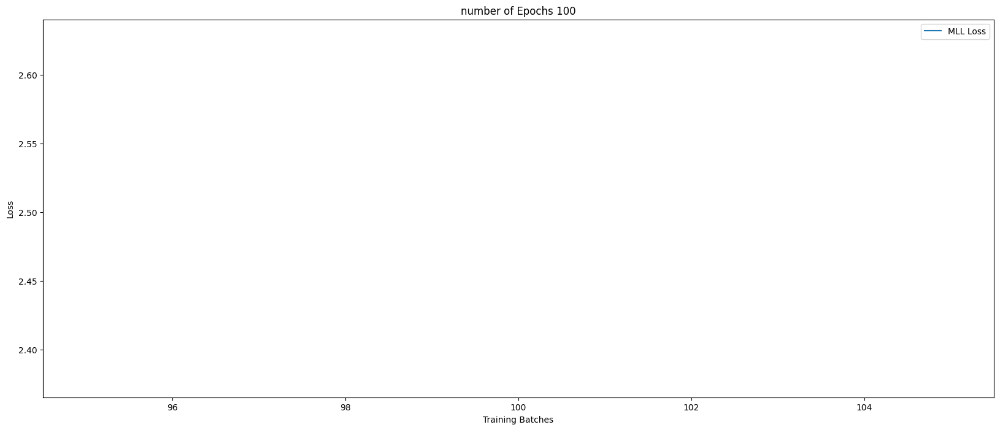

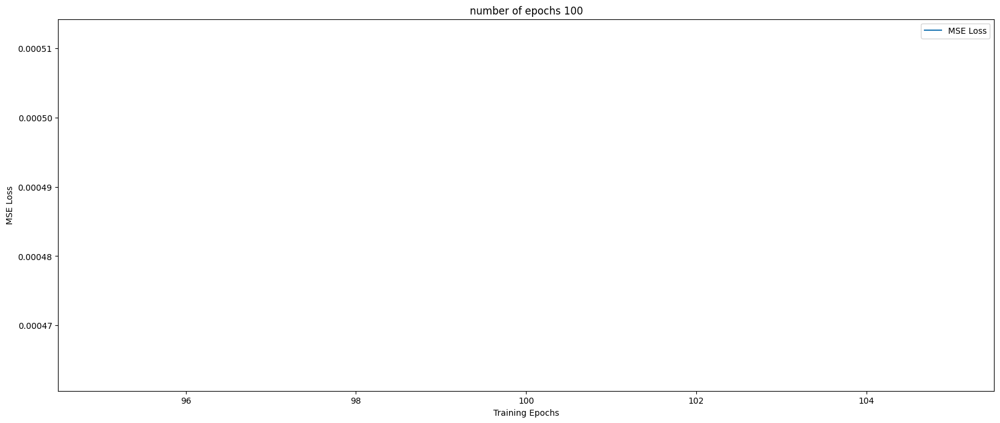

Prediction before New Task
plot DKL


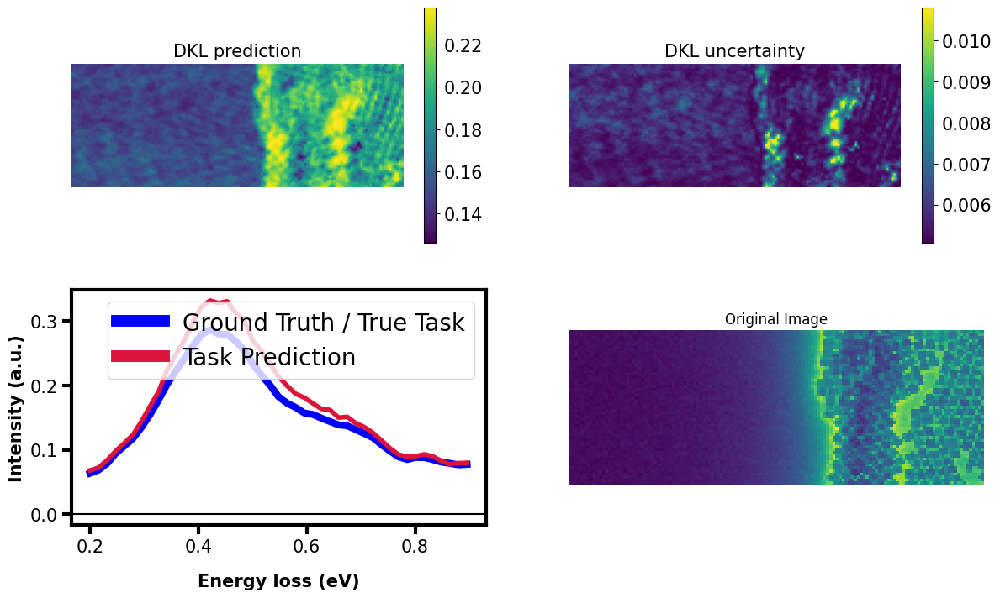

In [41]:
#### datadim=256
global dklgp
from atomai.nets import fcFeatureExtractor
torch.manual_seed(42)
torch.set_default_device("cuda")
for itr in range(2,3):
    dklgp = dklgpreg.dklGPR(datadim, embedim=2,feature_exact = deepcopy(fcFeatureExtractor(256,2)))
    X,y,e_reduced,full_img,full_spectrum,index = task_t(itr,data_augmentation=False)
    model,mll_loss,train_loss = perform_k_training_steps_train_and_test(dklgp,X,y,e_reduced,nth_task=itr,k_shots=1,batch_size=32,training_cycle=100)
    k1,k2 = 0,-1
    clear_cache()
    with torch.no_grad():
        #X,y,e_reduced,full_img,specim[1],indices=task_t(itr)
        print('Prediction before New Task')
        dkl_pred_full, dkl_unc_full, pred_spec_full, meas_spec_full, mean_full, var_full = plot_DKL_prediction_preacquired_notactive(model_name=deepcopy(model),
                                                                                                                                structural_img=full_img,
                                                                                                                                spectral_img=full_spectrum, X_var=X,y_var=y,e_red=e_reduced,
                                                                                                                                figsize = (14,8),
                                                                                                                                energy_range = [k1,k2],indices_=index)

Plotting Inference

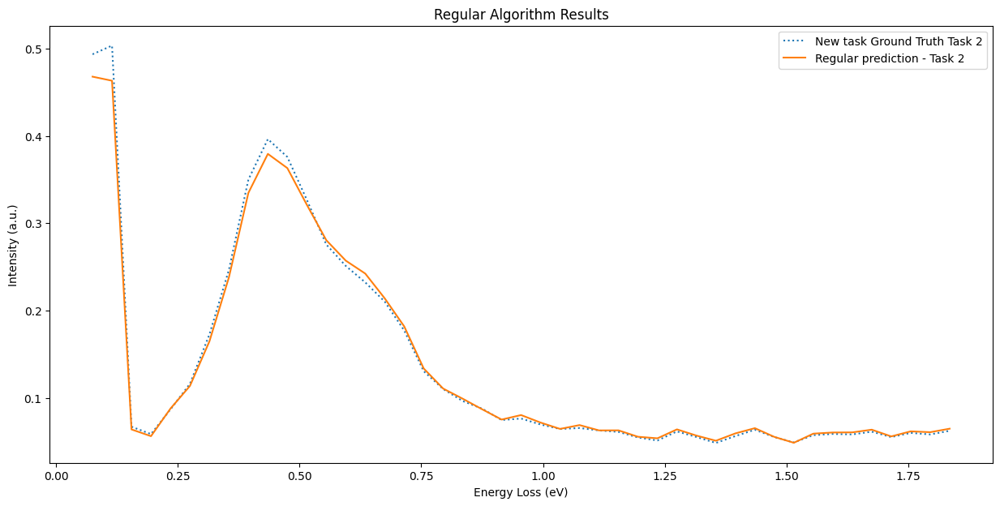

In [49]:

plt.figure(figsize=(15,7))

plt.title('Regular Algorithm Results')
plt.xlabel('Energy Loss (eV)')
plt.ylabel('Intensity (a.u.)')

plt.plot(e_reduced[k1:k2].detach().cpu().numpy(),meas_spec_full.detach().cpu().numpy(),linestyle='dotted',label='New task Ground Truth Task 2')
plt.plot(e_reduced[k1:k2].detach().cpu().numpy(),pred_spec_full,label='Regular prediction - Task 2')

plt.legend(loc='best')


Task 3

dtype : torch.float64
specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>


Date-Time : 2023-10-31 01:14:50,718 : Line No. : 3 - Training the model with new task dataset of size torch.Size([2200, 256]), with Training Cycle 100 | Batch size 32
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
Date-Time : 2023-10-31 01:14:50,798 : Line No. : 17 - Train Size : 1760 and Test Size : 440


Train Size : 1760 and Test Size : 440
 Number of batches: 55.0


Date-Time : 2023-10-31 01:14:50,799 : Line No. : 20 -  Number of batches: 55.0


Epoch 1/100 ... Training loss: 36.953
Epoch 10/100 ... Training loss: 36.8905
Epoch 20/100 ... Training loss: 36.9334
Epoch 30/100 ... Training loss: 37.0858
Epoch 40/100 ... Training loss: 37.0618
Epoch 50/100 ... Training loss: 37.0921
Epoch 60/100 ... Training loss: 37.17
Epoch 70/100 ... Training loss: 36.9931
Epoch 80/100 ... Training loss: 37.1393
Epoch 90/100 ... Training loss: 37.0705
Epoch 100/100 ... Training loss: 37.0757


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.0353
Epoch 10/100 ... Training loss: 37.0571
Epoch 20/100 ... Training loss: 37.2121
Epoch 30/100 ... Training loss: 37.0298
Epoch 40/100 ... Training loss: 36.9751
Epoch 50/100 ... Training loss: 37.1192
Epoch 60/100 ... Training loss: 37.196
Epoch 70/100 ... Training loss: 37.0249
Epoch 80/100 ... Training loss: 37.1638
Epoch 90/100 ... Training loss: 36.7196
Epoch 100/100 ... Training loss: 37.072


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.9454
Epoch 10/100 ... Training loss: 36.9368
Epoch 20/100 ... Training loss: 36.9975
Epoch 30/100 ... Training loss: 37.1325
Epoch 40/100 ... Training loss: 37.1424
Epoch 50/100 ... Training loss: 37.0
Epoch 60/100 ... Training loss: 37.1195
Epoch 70/100 ... Training loss: 36.9259
Epoch 80/100 ... Training loss: 37.0904
Epoch 90/100 ... Training loss: 36.9849
Epoch 100/100 ... Training loss: 36.9821


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 37.0033
Epoch 10/100 ... Training loss: 37.0039
Epoch 20/100 ... Training loss: 36.9307
Epoch 30/100 ... Training loss: 36.9056
Epoch 40/100 ... Training loss: 36.9653
Epoch 50/100 ... Training loss: 36.7683
Epoch 60/100 ... Training loss: 36.6322
Epoch 70/100 ... Training loss: 36.8097
Epoch 80/100 ... Training loss: 37.0305
Epoch 90/100 ... Training loss: 36.6782
Epoch 100/100 ... Training loss: 36.5993


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.5132
Epoch 10/100 ... Training loss: 36.8412
Epoch 20/100 ... Training loss: 36.9578
Epoch 30/100 ... Training loss: 36.9072
Epoch 40/100 ... Training loss: 36.7486
Epoch 50/100 ... Training loss: 36.9086
Epoch 60/100 ... Training loss: 36.9205
Epoch 70/100 ... Training loss: 36.8484
Epoch 80/100 ... Training loss: 36.4988
Epoch 90/100 ... Training loss: 36.5658
Epoch 100/100 ... Training loss: 36.389


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.5985
Epoch 10/100 ... Training loss: 36.4778
Epoch 20/100 ... Training loss: 36.7618
Epoch 30/100 ... Training loss: 36.4468
Epoch 40/100 ... Training loss: 36.5336
Epoch 50/100 ... Training loss: 36.5195
Epoch 60/100 ... Training loss: 36.1729
Epoch 70/100 ... Training loss: 36.5842
Epoch 80/100 ... Training loss: 36.5299
Epoch 90/100 ... Training loss: 36.5937
Epoch 100/100 ... Training loss: 36.4658


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.4121
Epoch 10/100 ... Training loss: 36.465
Epoch 20/100 ... Training loss: 36.5777
Epoch 30/100 ... Training loss: 36.401
Epoch 40/100 ... Training loss: 36.5468
Epoch 50/100 ... Training loss: 36.5057
Epoch 60/100 ... Training loss: 36.4443
Epoch 70/100 ... Training loss: 36.3269
Epoch 80/100 ... Training loss: 36.2368
Epoch 90/100 ... Training loss: 36.3209
Epoch 100/100 ... Training loss: 36.267


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.2632
Epoch 10/100 ... Training loss: 36.328
Epoch 20/100 ... Training loss: 36.2475
Epoch 30/100 ... Training loss: 36.3324
Epoch 40/100 ... Training loss: 36.372
Epoch 50/100 ... Training loss: 36.1762
Epoch 60/100 ... Training loss: 36.1642
Epoch 70/100 ... Training loss: 36.1729
Epoch 80/100 ... Training loss: 36.1293
Epoch 90/100 ... Training loss: 36.267
Epoch 100/100 ... Training loss: 36.1988


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 36.0732
Epoch 10/100 ... Training loss: 36.1738
Epoch 20/100 ... Training loss: 35.986
Epoch 30/100 ... Training loss: 36.2153
Epoch 40/100 ... Training loss: 36.0879
Epoch 50/100 ... Training loss: 36.0224
Epoch 60/100 ... Training loss: 35.9959
Epoch 70/100 ... Training loss: 36.0375
Epoch 80/100 ... Training loss: 35.7036
Epoch 90/100 ... Training loss: 35.8647
Epoch 100/100 ... Training loss: 35.8139


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.8546
Epoch 10/100 ... Training loss: 35.9267
Epoch 20/100 ... Training loss: 35.8451
Epoch 30/100 ... Training loss: 36.0196
Epoch 40/100 ... Training loss: 35.5806
Epoch 50/100 ... Training loss: 35.8135
Epoch 60/100 ... Training loss: 35.9342
Epoch 70/100 ... Training loss: 35.967
Epoch 80/100 ... Training loss: 35.9429
Epoch 90/100 ... Training loss: 35.7975
Epoch 100/100 ... Training loss: 35.6606


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.5831
Epoch 10/100 ... Training loss: 35.6682
Epoch 20/100 ... Training loss: 35.5768
Epoch 30/100 ... Training loss: 35.721
Epoch 40/100 ... Training loss: 35.6724
Epoch 50/100 ... Training loss: 35.583
Epoch 60/100 ... Training loss: 35.6628
Epoch 70/100 ... Training loss: 35.592
Epoch 80/100 ... Training loss: 35.6576
Epoch 90/100 ... Training loss: 35.5404
Epoch 100/100 ... Training loss: 35.5625


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.5414
Epoch 10/100 ... Training loss: 35.4868
Epoch 20/100 ... Training loss: 35.5138
Epoch 30/100 ... Training loss: 35.2871
Epoch 40/100 ... Training loss: 35.4273
Epoch 50/100 ... Training loss: 35.6147
Epoch 60/100 ... Training loss: 35.5606
Epoch 70/100 ... Training loss: 35.47
Epoch 80/100 ... Training loss: 35.2773
Epoch 90/100 ... Training loss: 35.2278
Epoch 100/100 ... Training loss: 35.366


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.3722
Epoch 10/100 ... Training loss: 35.3084
Epoch 20/100 ... Training loss: 35.3389
Epoch 30/100 ... Training loss: 35.3955
Epoch 40/100 ... Training loss: 35.474
Epoch 50/100 ... Training loss: 35.3388
Epoch 60/100 ... Training loss: 35.2237
Epoch 70/100 ... Training loss: 35.198
Epoch 80/100 ... Training loss: 35.2847
Epoch 90/100 ... Training loss: 35.2824
Epoch 100/100 ... Training loss: 35.1183


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.1193
Epoch 10/100 ... Training loss: 35.0804
Epoch 20/100 ... Training loss: 35.3045
Epoch 30/100 ... Training loss: 35.0969
Epoch 40/100 ... Training loss: 35.0767
Epoch 50/100 ... Training loss: 35.0952
Epoch 60/100 ... Training loss: 34.9969
Epoch 70/100 ... Training loss: 34.9721
Epoch 80/100 ... Training loss: 35.0551
Epoch 90/100 ... Training loss: 34.9089
Epoch 100/100 ... Training loss: 34.9482


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 35.1885
Epoch 10/100 ... Training loss: 34.9178
Epoch 20/100 ... Training loss: 34.9026
Epoch 30/100 ... Training loss: 34.8707
Epoch 40/100 ... Training loss: 34.8592
Epoch 50/100 ... Training loss: 34.8303
Epoch 60/100 ... Training loss: 34.8035
Epoch 70/100 ... Training loss: 34.7829
Epoch 80/100 ... Training loss: 34.764
Epoch 90/100 ... Training loss: 34.7521
Epoch 100/100 ... Training loss: 34.7561


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.7538
Epoch 10/100 ... Training loss: 34.6435
Epoch 20/100 ... Training loss: 34.988
Epoch 30/100 ... Training loss: 34.964
Epoch 40/100 ... Training loss: 34.8427
Epoch 50/100 ... Training loss: 34.8101
Epoch 60/100 ... Training loss: 34.7241
Epoch 70/100 ... Training loss: 34.6524
Epoch 80/100 ... Training loss: 34.6362
Epoch 90/100 ... Training loss: 34.7145
Epoch 100/100 ... Training loss: 34.5278


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.5454
Epoch 10/100 ... Training loss: 34.5746
Epoch 20/100 ... Training loss: 34.6685
Epoch 30/100 ... Training loss: 34.4758
Epoch 40/100 ... Training loss: 34.4722
Epoch 50/100 ... Training loss: 34.4688
Epoch 60/100 ... Training loss: 34.5574
Epoch 70/100 ... Training loss: 34.4736
Epoch 80/100 ... Training loss: 34.3975
Epoch 90/100 ... Training loss: 34.3666
Epoch 100/100 ... Training loss: 34.3324


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.3316
Epoch 10/100 ... Training loss: 34.3222
Epoch 20/100 ... Training loss: 34.3056
Epoch 30/100 ... Training loss: 34.2825
Epoch 40/100 ... Training loss: 34.2787
Epoch 50/100 ... Training loss: 34.1805
Epoch 60/100 ... Training loss: 34.2245
Epoch 70/100 ... Training loss: 34.1973
Epoch 80/100 ... Training loss: 34.1615
Epoch 90/100 ... Training loss: 34.2184
Epoch 100/100 ... Training loss: 34.2008


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 34.2283
Epoch 10/100 ... Training loss: 34.1198
Epoch 20/100 ... Training loss: 34.1377
Epoch 30/100 ... Training loss: 34.1111
Epoch 40/100 ... Training loss: 34.2483
Epoch 50/100 ... Training loss: 34.1206
Epoch 60/100 ... Training loss: 34.341
Epoch 70/100 ... Training loss: 34.3518
Epoch 80/100 ... Training loss: 34.0995
Epoch 90/100 ... Training loss: 34.0052
Epoch 100/100 ... Training loss: 34.0448


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.9707
Epoch 10/100 ... Training loss: 33.9019
Epoch 20/100 ... Training loss: 33.918
Epoch 30/100 ... Training loss: 33.8995
Epoch 40/100 ... Training loss: 33.9325
Epoch 50/100 ... Training loss: 33.8954
Epoch 60/100 ... Training loss: 33.83
Epoch 70/100 ... Training loss: 33.8587
Epoch 80/100 ... Training loss: 33.7945
Epoch 90/100 ... Training loss: 33.7748
Epoch 100/100 ... Training loss: 33.755


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.7532
Epoch 10/100 ... Training loss: 33.7398
Epoch 20/100 ... Training loss: 33.7127
Epoch 30/100 ... Training loss: 33.6065
Epoch 40/100 ... Training loss: 33.6742
Epoch 50/100 ... Training loss: 33.734
Epoch 60/100 ... Training loss: 33.6671
Epoch 70/100 ... Training loss: 33.6808
Epoch 80/100 ... Training loss: 33.5942
Epoch 90/100 ... Training loss: 33.7927
Epoch 100/100 ... Training loss: 33.7323


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.6461
Epoch 10/100 ... Training loss: 33.4873
Epoch 20/100 ... Training loss: 33.6524
Epoch 30/100 ... Training loss: 33.5424
Epoch 40/100 ... Training loss: 33.5478
Epoch 50/100 ... Training loss: 33.564
Epoch 60/100 ... Training loss: 33.628
Epoch 70/100 ... Training loss: 33.7661
Epoch 80/100 ... Training loss: 33.6188
Epoch 90/100 ... Training loss: 33.577
Epoch 100/100 ... Training loss: 33.602


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.6273
Epoch 10/100 ... Training loss: 33.3934
Epoch 20/100 ... Training loss: 33.4664
Epoch 30/100 ... Training loss: 33.3343
Epoch 40/100 ... Training loss: 33.5
Epoch 50/100 ... Training loss: 33.6149
Epoch 60/100 ... Training loss: 33.2593
Epoch 70/100 ... Training loss: 33.2389
Epoch 80/100 ... Training loss: 33.2178
Epoch 90/100 ... Training loss: 33.1965
Epoch 100/100 ... Training loss: 33.2437


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 33.3556
Epoch 10/100 ... Training loss: 33.1526
Epoch 20/100 ... Training loss: 33.149
Epoch 30/100 ... Training loss: 33.1879
Epoch 40/100 ... Training loss: 33.21
Epoch 50/100 ... Training loss: 33.2719
Epoch 60/100 ... Training loss: 33.1112
Epoch 70/100 ... Training loss: 33.2112
Epoch 80/100 ... Training loss: 33.1699
Epoch 90/100 ... Training loss: 32.9979
Epoch 100/100 ... Training loss: 32.9957


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.9957
Epoch 10/100 ... Training loss: 32.9693
Epoch 20/100 ... Training loss: 32.947
Epoch 30/100 ... Training loss: 32.9483
Epoch 40/100 ... Training loss: 32.9553
Epoch 50/100 ... Training loss: 32.9059
Epoch 60/100 ... Training loss: 32.8633
Epoch 70/100 ... Training loss: 32.8576
Epoch 80/100 ... Training loss: 32.8243
Epoch 90/100 ... Training loss: 32.8024
Epoch 100/100 ... Training loss: 32.7801


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.7778
Epoch 10/100 ... Training loss: 32.7565
Epoch 20/100 ... Training loss: 32.7296
Epoch 30/100 ... Training loss: 32.7097
Epoch 40/100 ... Training loss: 32.741
Epoch 50/100 ... Training loss: 32.6874
Epoch 60/100 ... Training loss: 32.6565
Epoch 70/100 ... Training loss: 32.6467
Epoch 80/100 ... Training loss: 32.6311
Epoch 90/100 ... Training loss: 32.6074
Epoch 100/100 ... Training loss: 32.586


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.5839
Epoch 10/100 ... Training loss: 32.5638
Epoch 20/100 ... Training loss: 32.5449
Epoch 30/100 ... Training loss: 32.5306
Epoch 40/100 ... Training loss: 32.5073
Epoch 50/100 ... Training loss: 32.4779
Epoch 60/100 ... Training loss: 32.4697
Epoch 70/100 ... Training loss: 32.4281
Epoch 80/100 ... Training loss: 32.4235
Epoch 90/100 ... Training loss: 32.4036
Epoch 100/100 ... Training loss: 32.3833


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.3812
Epoch 10/100 ... Training loss: 32.3622
Epoch 20/100 ... Training loss: 32.3412
Epoch 30/100 ... Training loss: 32.3202
Epoch 40/100 ... Training loss: 32.2991
Epoch 50/100 ... Training loss: 32.2777
Epoch 60/100 ... Training loss: 32.2561
Epoch 70/100 ... Training loss: 32.2334
Epoch 80/100 ... Training loss: 32.1961
Epoch 90/100 ... Training loss: 32.2022
Epoch 100/100 ... Training loss: 32.2325


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.2355
Epoch 10/100 ... Training loss: 32.0932
Epoch 20/100 ... Training loss: 32.1372
Epoch 30/100 ... Training loss: 32.1114
Epoch 40/100 ... Training loss: 32.0841
Epoch 50/100 ... Training loss: 32.2146
Epoch 60/100 ... Training loss: 32.0233
Epoch 70/100 ... Training loss: 32.0197
Epoch 80/100 ... Training loss: 32.0194
Epoch 90/100 ... Training loss: 32.3101
Epoch 100/100 ... Training loss: 32.1076


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 32.3037
Epoch 10/100 ... Training loss: 31.95
Epoch 20/100 ... Training loss: 31.9178
Epoch 30/100 ... Training loss: 31.8747
Epoch 40/100 ... Training loss: 31.8837
Epoch 50/100 ... Training loss: 32.0965
Epoch 60/100 ... Training loss: 31.8475
Epoch 70/100 ... Training loss: 31.8076
Epoch 80/100 ... Training loss: 31.8147
Epoch 90/100 ... Training loss: 31.8384
Epoch 100/100 ... Training loss: 31.7822


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.905
Epoch 10/100 ... Training loss: 31.7409
Epoch 20/100 ... Training loss: 31.7212
Epoch 30/100 ... Training loss: 31.6976
Epoch 40/100 ... Training loss: 31.6749
Epoch 50/100 ... Training loss: 31.6541
Epoch 60/100 ... Training loss: 31.6436
Epoch 70/100 ... Training loss: 31.7154
Epoch 80/100 ... Training loss: 31.8785
Epoch 90/100 ... Training loss: 31.7773
Epoch 100/100 ... Training loss: 31.5422


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.5837
Epoch 10/100 ... Training loss: 31.7241
Epoch 20/100 ... Training loss: 31.4954
Epoch 30/100 ... Training loss: 31.5077
Epoch 40/100 ... Training loss: 31.4827
Epoch 50/100 ... Training loss: 31.4799
Epoch 60/100 ... Training loss: 31.4635
Epoch 70/100 ... Training loss: 31.5846
Epoch 80/100 ... Training loss: 31.4138
Epoch 90/100 ... Training loss: 31.3938
Epoch 100/100 ... Training loss: 31.3754


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.3653
Epoch 10/100 ... Training loss: 31.3515
Epoch 20/100 ... Training loss: 31.3295
Epoch 30/100 ... Training loss: 31.3034
Epoch 40/100 ... Training loss: 31.2805
Epoch 50/100 ... Training loss: 31.256
Epoch 60/100 ... Training loss: 31.2345
Epoch 70/100 ... Training loss: 31.2135
Epoch 80/100 ... Training loss: 31.1925
Epoch 90/100 ... Training loss: 31.1701
Epoch 100/100 ... Training loss: 31.1262


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 31.3974
Epoch 10/100 ... Training loss: 31.1357
Epoch 20/100 ... Training loss: 31.0973
Epoch 30/100 ... Training loss: 31.3434
Epoch 40/100 ... Training loss: 31.1216
Epoch 50/100 ... Training loss: 31.0565
Epoch 60/100 ... Training loss: 31.1629
Epoch 70/100 ... Training loss: 31.0376
Epoch 80/100 ... Training loss: 30.9989
Epoch 90/100 ... Training loss: 30.9878
Epoch 100/100 ... Training loss: 30.9044


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.9011
Epoch 10/100 ... Training loss: 30.9317
Epoch 20/100 ... Training loss: 30.9106
Epoch 30/100 ... Training loss: 30.8655
Epoch 40/100 ... Training loss: 30.8024
Epoch 50/100 ... Training loss: 30.8316
Epoch 60/100 ... Training loss: 30.7697
Epoch 70/100 ... Training loss: 30.8186
Epoch 80/100 ... Training loss: 30.8139
Epoch 90/100 ... Training loss: 30.802
Epoch 100/100 ... Training loss: 30.8081


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.8079
Epoch 10/100 ... Training loss: 30.6946
Epoch 20/100 ... Training loss: 30.7342
Epoch 30/100 ... Training loss: 30.7569
Epoch 40/100 ... Training loss: 30.671
Epoch 50/100 ... Training loss: 30.6508
Epoch 60/100 ... Training loss: 30.631
Epoch 70/100 ... Training loss: 30.6111
Epoch 80/100 ... Training loss: 30.5899
Epoch 90/100 ... Training loss: 30.5681
Epoch 100/100 ... Training loss: 30.5459


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.5437
Epoch 10/100 ... Training loss: 30.5223
Epoch 20/100 ... Training loss: 30.5041
Epoch 30/100 ... Training loss: 30.4858
Epoch 40/100 ... Training loss: 30.4647
Epoch 50/100 ... Training loss: 30.4432
Epoch 60/100 ... Training loss: 30.4214
Epoch 70/100 ... Training loss: 30.3995
Epoch 80/100 ... Training loss: 30.3776
Epoch 90/100 ... Training loss: 30.3553
Epoch 100/100 ... Training loss: 30.3322


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.3298
Epoch 10/100 ... Training loss: 30.3101
Epoch 20/100 ... Training loss: 30.2869
Epoch 30/100 ... Training loss: 30.2632
Epoch 40/100 ... Training loss: 30.2388
Epoch 50/100 ... Training loss: 30.2095
Epoch 60/100 ... Training loss: 30.1572
Epoch 70/100 ... Training loss: 30.097
Epoch 80/100 ... Training loss: 30.2522
Epoch 90/100 ... Training loss: 30.4237
Epoch 100/100 ... Training loss: 30.1452


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 30.1484
Epoch 10/100 ... Training loss: 30.1301
Epoch 20/100 ... Training loss: 30.1184
Epoch 30/100 ... Training loss: 30.0787
Epoch 40/100 ... Training loss: 30.1137
Epoch 50/100 ... Training loss: 30.0845
Epoch 60/100 ... Training loss: 30.0349
Epoch 70/100 ... Training loss: 30.0039
Epoch 80/100 ... Training loss: 30.0079
Epoch 90/100 ... Training loss: 30.0027
Epoch 100/100 ... Training loss: 29.9157


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.9128
Epoch 10/100 ... Training loss: 30.0481
Epoch 20/100 ... Training loss: 29.9015
Epoch 30/100 ... Training loss: 30.2285
Epoch 40/100 ... Training loss: 29.8578
Epoch 50/100 ... Training loss: 29.8254
Epoch 60/100 ... Training loss: 30.0191
Epoch 70/100 ... Training loss: 29.9994
Epoch 80/100 ... Training loss: 29.8039
Epoch 90/100 ... Training loss: 30.0197
Epoch 100/100 ... Training loss: 30.0119


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.7255
Epoch 10/100 ... Training loss: 29.7278
Epoch 20/100 ... Training loss: 29.718
Epoch 30/100 ... Training loss: 29.7217
Epoch 40/100 ... Training loss: 29.8526
Epoch 50/100 ... Training loss: 29.6103
Epoch 60/100 ... Training loss: 29.5657
Epoch 70/100 ... Training loss: 29.6983
Epoch 80/100 ... Training loss: 29.5529
Epoch 90/100 ... Training loss: 29.5185
Epoch 100/100 ... Training loss: 29.4807


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.4776
Epoch 10/100 ... Training loss: 29.4567
Epoch 20/100 ... Training loss: 29.8028
Epoch 30/100 ... Training loss: 29.4901
Epoch 40/100 ... Training loss: 29.422
Epoch 50/100 ... Training loss: 29.3765
Epoch 60/100 ... Training loss: 29.7095
Epoch 70/100 ... Training loss: 29.3083
Epoch 80/100 ... Training loss: 29.3381
Epoch 90/100 ... Training loss: 29.6203
Epoch 100/100 ... Training loss: 29.35


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.3535
Epoch 10/100 ... Training loss: 29.2514
Epoch 20/100 ... Training loss: 29.2404
Epoch 30/100 ... Training loss: 29.2296
Epoch 40/100 ... Training loss: 29.4695
Epoch 50/100 ... Training loss: 29.2185
Epoch 60/100 ... Training loss: 29.1967
Epoch 70/100 ... Training loss: 29.1744
Epoch 80/100 ... Training loss: 29.1527
Epoch 90/100 ... Training loss: 29.1317
Epoch 100/100 ... Training loss: 29.1116


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 29.1097
Epoch 10/100 ... Training loss: 29.094
Epoch 20/100 ... Training loss: 29.1023
Epoch 30/100 ... Training loss: 29.0322
Epoch 40/100 ... Training loss: 28.9981
Epoch 50/100 ... Training loss: 28.9451
Epoch 60/100 ... Training loss: 28.8545
Epoch 70/100 ... Training loss: 29.187
Epoch 80/100 ... Training loss: 28.9206
Epoch 90/100 ... Training loss: 28.9176
Epoch 100/100 ... Training loss: 28.8819


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.8733
Epoch 10/100 ... Training loss: 28.9166
Epoch 20/100 ... Training loss: 28.8685
Epoch 30/100 ... Training loss: 28.826
Epoch 40/100 ... Training loss: 28.8077
Epoch 50/100 ... Training loss: 28.7821
Epoch 60/100 ... Training loss: 29.1819
Epoch 70/100 ... Training loss: 29.0982
Epoch 80/100 ... Training loss: 28.7132
Epoch 90/100 ... Training loss: 28.78
Epoch 100/100 ... Training loss: 28.6881


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.6859
Epoch 10/100 ... Training loss: 28.6649
Epoch 20/100 ... Training loss: 28.6241
Epoch 30/100 ... Training loss: 28.6542
Epoch 40/100 ... Training loss: 29.0235
Epoch 50/100 ... Training loss: 28.5698
Epoch 60/100 ... Training loss: 28.9539
Epoch 70/100 ... Training loss: 28.7069
Epoch 80/100 ... Training loss: 28.5159
Epoch 90/100 ... Training loss: 28.4933
Epoch 100/100 ... Training loss: 28.5623


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.5331
Epoch 10/100 ... Training loss: 28.4506
Epoch 20/100 ... Training loss: 28.4288
Epoch 30/100 ... Training loss: 28.4008
Epoch 40/100 ... Training loss: 28.5441
Epoch 50/100 ... Training loss: 28.6332
Epoch 60/100 ... Training loss: 28.6824
Epoch 70/100 ... Training loss: 28.3274
Epoch 80/100 ... Training loss: 28.3016
Epoch 90/100 ... Training loss: 28.3565
Epoch 100/100 ... Training loss: 28.2448


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.2399
Epoch 10/100 ... Training loss: 28.5114
Epoch 20/100 ... Training loss: 28.2034
Epoch 30/100 ... Training loss: 28.152
Epoch 40/100 ... Training loss: 28.1779
Epoch 50/100 ... Training loss: 28.1611
Epoch 60/100 ... Training loss: 28.1447
Epoch 70/100 ... Training loss: 28.2202
Epoch 80/100 ... Training loss: 28.0821
Epoch 90/100 ... Training loss: 28.0973
Epoch 100/100 ... Training loss: 28.2193


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 28.0623
Epoch 10/100 ... Training loss: 28.1425
Epoch 20/100 ... Training loss: 27.9732
Epoch 30/100 ... Training loss: 28.05
Epoch 40/100 ... Training loss: 28.3307
Epoch 50/100 ... Training loss: 28.2177
Epoch 60/100 ... Training loss: 28.3365
Epoch 70/100 ... Training loss: 28.0908
Epoch 80/100 ... Training loss: 27.8121
Epoch 90/100 ... Training loss: 27.8485
Epoch 100/100 ... Training loss: 27.8307


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.8285
Epoch 10/100 ... Training loss: 27.8076
Epoch 20/100 ... Training loss: 27.7953
Epoch 30/100 ... Training loss: 27.7602
Epoch 40/100 ... Training loss: 27.7358
Epoch 50/100 ... Training loss: 27.708
Epoch 60/100 ... Training loss: 27.7629
Epoch 70/100 ... Training loss: 27.6418
Epoch 80/100 ... Training loss: 27.6019
Epoch 90/100 ... Training loss: 27.5652
Epoch 100/100 ... Training loss: 28.1077


/home/saranath/.local/lib/python3.8/site-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-10.
  warnings.warn(
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.9808
Epoch 10/100 ... Training loss: 27.7437
Epoch 20/100 ... Training loss: 27.5943
Epoch 30/100 ... Training loss: 27.5559
Epoch 40/100 ... Training loss: 27.5407
Epoch 50/100 ... Training loss: 27.5029
Epoch 60/100 ... Training loss: 27.4848
Epoch 70/100 ... Training loss: 27.466
Epoch 80/100 ... Training loss: 27.4338
Epoch 90/100 ... Training loss: 27.4185
Epoch 100/100 ... Training loss: 27.3877


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.3855
Epoch 10/100 ... Training loss: 27.3651
Epoch 20/100 ... Training loss: 27.3405
Epoch 30/100 ... Training loss: 27.3139
Epoch 40/100 ... Training loss: 27.2849
Epoch 50/100 ... Training loss: 27.2453
Epoch 60/100 ... Training loss: 27.1757
Epoch 70/100 ... Training loss: 27.3781
Epoch 80/100 ... Training loss: 27.1861
Epoch 90/100 ... Training loss: 27.2075
Epoch 100/100 ... Training loss: 27.1788


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.179
Epoch 10/100 ... Training loss: 27.4684
Epoch 20/100 ... Training loss: 27.4029
Epoch 30/100 ... Training loss: 27.4566
Epoch 40/100 ... Training loss: 27.2375
Epoch 50/100 ... Training loss: 27.12
Epoch 60/100 ... Training loss: 27.2729
Epoch 70/100 ... Training loss: 27.2153
Epoch 80/100 ... Training loss: 27.1115
Epoch 90/100 ... Training loss: 27.2256
Epoch 100/100 ... Training loss: 27.0696


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 27.0326
Epoch 10/100 ... Training loss: 27.0423
Epoch 20/100 ... Training loss: 26.9585
Epoch 30/100 ... Training loss: 26.8938
Epoch 40/100 ... Training loss: 26.9502
Epoch 50/100 ... Training loss: 27.2138
Epoch 60/100 ... Training loss: 26.8291
Epoch 70/100 ... Training loss: 26.7964
Epoch 80/100 ... Training loss: 26.8104
Epoch 90/100 ... Training loss: 26.8279
Epoch 100/100 ... Training loss: 26.8315


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Epoch 1/100 ... Training loss: 26.8431
Epoch 10/100 ... Training loss: 26.7639
Epoch 20/100 ... Training loss: 26.7379
Epoch 30/100 ... Training loss: 26.7074
Epoch 40/100 ... Training loss: 26.6733
Epoch 50/100 ... Training loss: 26.6516
Epoch 60/100 ... Training loss: 26.9369
Epoch 70/100 ... Training loss: 26.5942
Epoch 80/100 ... Training loss: 26.773
Epoch 90/100 ... Training loss: 26.6597
Epoch 100/100 ... Training loss: 26.6424


/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


[26.642365265673856]
 Training MSE loss : 55 | Training MLL Loss : 1 Training Epochs : 5500


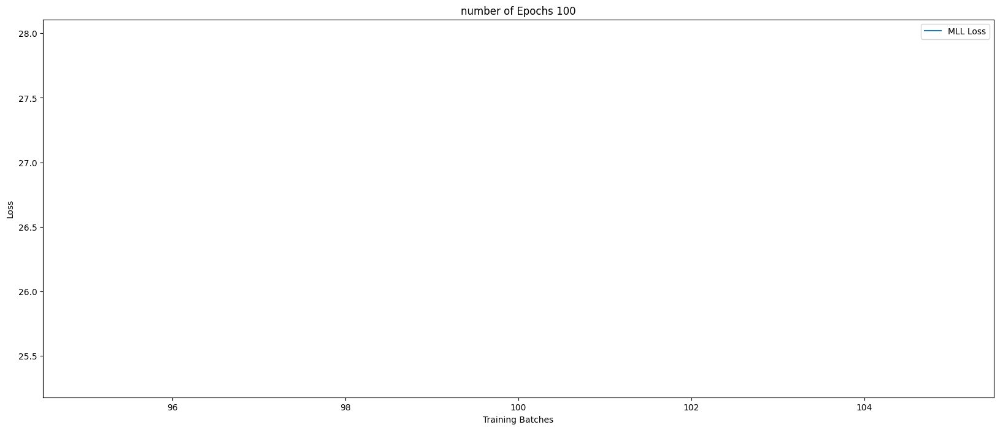

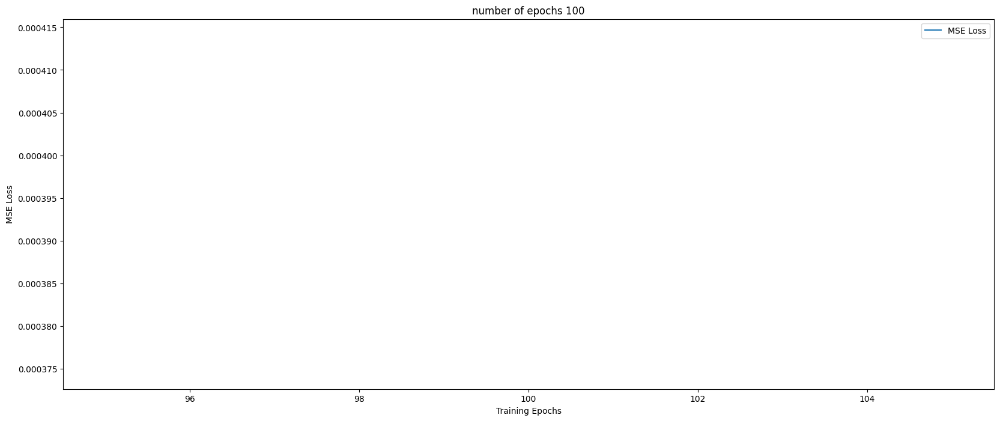

Prediction before New Task
plot DKL


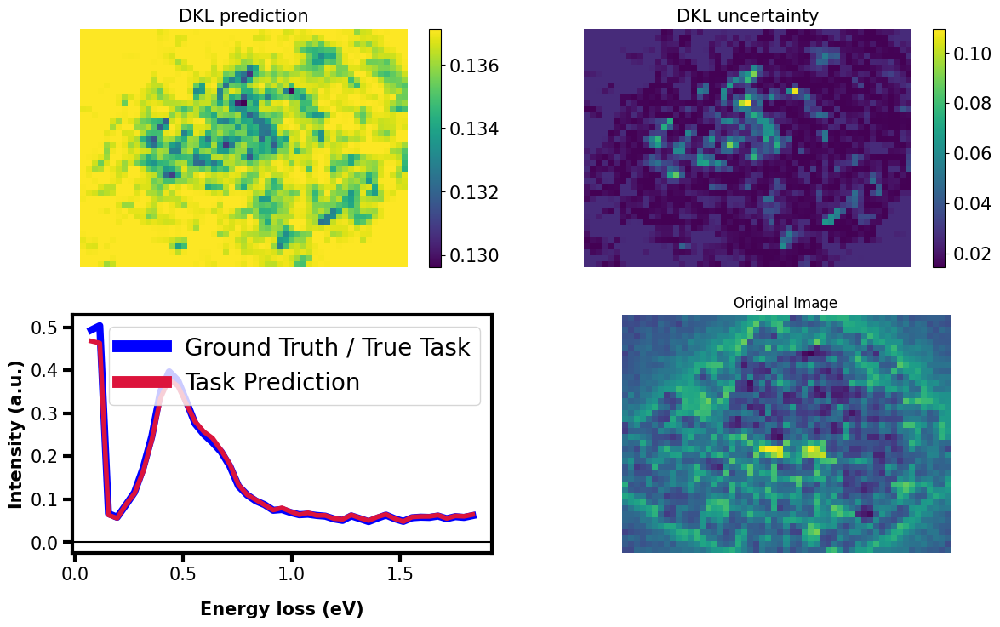

In [43]:
#### datadim=256
global dklgp
from atomai.nets import fcFeatureExtractor
torch.manual_seed(42)
torch.set_default_device("cuda")
for itr in range(3,4):
    dklgp = dklgpreg.dklGPR(datadim, embedim=2,feature_exact = deepcopy(fcFeatureExtractor(256,2)))
    X,y,e_reduced,full_img,full_spectrum,index = task_t(itr,data_augmentation=False)
    model,mll_loss,train_loss = perform_k_training_steps_train_and_test(dklgp,X,y,e_reduced,nth_task=itr,k_shots=1,batch_size=32,training_cycle=100)
    k1,k2 = 0,-1
    clear_cache()
    with torch.no_grad():
        #X,y,e_reduced,full_img,specim[1],indices=task_t(itr)
        print('Prediction before New Task')
        dkl_pred_full, dkl_unc_full, pred_spec_full, meas_spec_full, mean_full, var_full = plot_DKL_prediction_preacquired_notactive(model_name=deepcopy(model),
                                                                                                                                structural_img=full_img,
                                                                                                                                spectral_img=full_spectrum, X_var=X,y_var=y,e_red=e_reduced,
                                                                                                                                figsize = (14,8),
                                                                                                                                energy_range = [k1,k2],indices_=index)

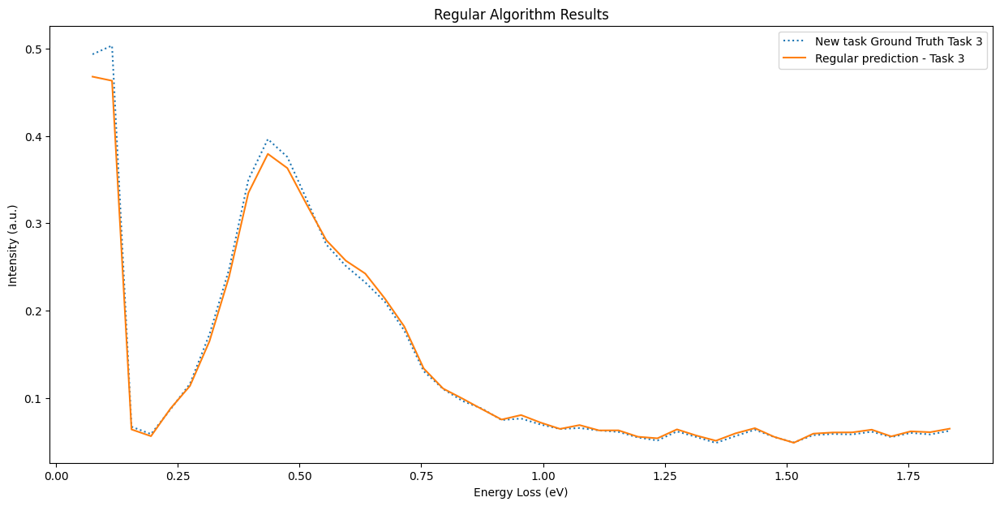

In [50]:

plt.figure(figsize=(15,7))

plt.title('Regular Algorithm Results')
plt.xlabel('Energy Loss (eV)')
plt.ylabel('Intensity (a.u.)')

plt.plot(e_reduced[k1:k2].detach().cpu().numpy(),meas_spec_full.detach().cpu().numpy(),linestyle='dotted',label='New task Ground Truth Task 3')
plt.plot(e_reduced[k1:k2].detach().cpu().numpy(),pred_spec_full,label='Regular prediction - Task 3')

plt.legend(loc='best')


## Active Learning

In [107]:
import numpy as np
def scalarize_acq(obj: np.ndarray) -> np.ndarray:
    """
    Scalarize acquisition function (n_samples x vector_size)
    by averaging over a selected energy band.
    """
    band = [0, -1]
    obj = obj[:, band[0]:band[1]].mean(-1)
    return obj

In [108]:
#@title Acquisition function definitions
from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: Union[float, torch.Tensor] = 0.01
       ) -> np.ndarray:
    """
    Expected Improvement
    """
    print('Expected Improvement')
    #torch.set_default_device('cpu')
    tt = torch.tensor
    tor = lambda a: tt(a) if isinstance(a, (np.ndarray, float)) else a  
    device='cuda'#torch.device
#     print("device",device)
    dtype = model.dtype
#     print('datatype',dtype)
    X, best_f, xi = tor(X), tor(best_f), tor(xi)
    posterior = model._compute_posterior(X.to(dtype).to(device))
    mean, sigma = posterior.mean, posterior.variance.sqrt()
    u = (mean - best_f.expand_as(mean) - xi.expand_as(mean)) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()

def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: Union[float, torch.Tensor] = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    print('Upper confidence bound')
    tt = torch.tensor
    tor = lambda a: tt(a) if isinstance(a, (np.ndarray, float)) else a  
    device = model.device
    dtype = model.dtype
    X, beta = tor(X), tor(beta)
    posterior = model._compute_posterior(X.to(dtype).to(device))
    mean, var = posterior.mean, posterior.variance
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()

def CE(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor]) -> np.ndarray:
    """Uncertainty-based exploration"""
    print('Uncertainity based exploration')
    device = model.device
    dtype = model.dtype
    X = torch.tensor(X) if isinstance(X, (np.ndarray, float)) else X
    posterior = model._compute_posterior(X.to(dtype).to(device))
    obj = posterior.variance
    print(obj)
    print(obj.detach().cpu().numpy())
    return obj.detach().cpu().numpy()

def Make_AF_movies_preacquired(acquisition_functions,
                               RGB = [2,1,8],
                               brightness = 0.75,
                               measured_points_in_AF = [0,0,0],
                               measured_points_in_HAADF = [1,0,0]):

  R,G,B = RGB
  # k1,k2 = 0, -1  ## Energy bands to average across

  sr1, sr2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1

  AF_all_color = np.zeros((len(acquisition_functions), sr1,sr2, 3))
  AF_all = np.zeros((len(acquisition_functions), sr1,sr2))
  AF_combined_all = []
  for frame in range(len(acquisition_functions)):
    # Generate IMAGE from points

    AF_frame = np.full((sr1,sr2), np.nan)
    AF_combined = np.concatenate((acquisition_functions[frame]['frames'], acquisition_functions[frame]['colors'].reshape(-1,1)), axis = 1)
    AF_combined_all.append(AF_combined)
    for p in AF_combined:
      c1,c2,c3 = int(p[0]-window_size/2), int(p[1]-window_size/2), p[2]
      AF_frame[c1,c2] = c3
    AF_frame = normalize_nan(AF_frame)
    AF_all[frame] = AF_frame

    # Make COLOR image from grayscale image <-- for movie later
    AF_frame_c = np.array([[[s*R*brightness,s*G*brightness,s*B*brightness] for s in r] for r in AF_frame])
    nan_coords = np.argwhere(np.isnan(AF_frame_c))[::3][:,:2]

    for coord in nan_coords:
      AF_frame_c[coord[0], coord[1]] = measured_points_in_AF
    AF_all_color[frame] = np.clip(AF_frame_c, 0, 1)
    AF_all = np.asarray(AF_all)
    # AF_combined_all = np.asarray(AF_combined_all)

  return AF_all, AF_all_color, AF_combined_all

def create_point_search_mov_preacquired(structural_img, AF_combined, size = (50,50), point_radius = 1, point_color = [1,0,0], offset = 0):

  window_size = 16
  sr1, sr2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
  ir1, ir2 = structural_img.shape[0], structural_img.shape[1]
  cr1, cr2 = [int((ir1 - sr1)/2), int((ir2 - sr2)/2)]
  img_crop = structural_img[cr1:int(sr1+cr1), cr2:int(sr2+cr2)]

  size = [sr1,sr2]
  # Initialize stack
  Mov = np.zeros((len(AF_combined), sr1, sr2, 3))
  
  # Get coordinates for measured points (which are NaN)
  for frame in range(len(Mov)):
    temp = np.full((size), np.nan)
    for p in AF_combined[frame]:
      c1,c2,c3 = int(p[0]-window_size/2), int(p[1]-window_size/2), p[2]
      temp[c1,c2] = c3
    nan_coords = np.argwhere(np.isnan(temp))[:,:2]

    # Convert to color, and draw the measured points on each frame
    img_c = color.gray2rgb(normalize(img_crop))
    for m in nan_coords:
      a,b = m[0] + offset, m[1] + offset
      rr,cc = circle(a,b,c_radius=point_radius,r_radius=point_radius)
      draw.set_color(img_c, (rr,cc), point_color)
    Mov[frame] = img_c

  return Mov

def normalize_nan(image):
  normed = (image - np.nanmin(image))/(np.nanmax(image) - np.nanmin(image))
  return normed

def plot_DKL_prediction_preacquired(model_files, step, embed = 2, precision = "double", figsize = (8,5), energy_range = [0,-1], colorscale = True):

  weights = model_files[step]
  num_cycles = 40
  dklgp_trained = aoi.models.dklGPR(data_dim, embedim=embed, precision=precision)
  dklgp_trained.compile_trainer(X, y, training_cycles = num_cycles)
  state_dict = torch.load(weights)
  dklgp_trained.gp_model.load_state_dict(state_dict)

  mean,var = dklgp_trained.predict(X, batch_size = len(X))

  s1, s2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
  s3 = y.shape[0]

  dkl_prediction = np.full((s1*s2,s3), np.nan)
  dkl_uncertainty = np.full((s1*s2,s3), np.nan)

  for ii in range(indices[:,0].shape[0]):
    dkl_prediction[ii] = mean.T[ii, :]
    dkl_uncertainty[ii] = var.T[ii, :]

  dkl_prediction = dkl_prediction.reshape((s1,s2,s3))
  dkl_uncertainty = dkl_uncertainty.reshape((s1,s2,s3))

  plt.figure(figsize=figsize)
  gs = gridspec.GridSpec(1,2)
  ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

  k1,k2 = energy_range[0], energy_range[1]
  im1 = ax1.imshow(np.mean(dkl_prediction[:,:,k1:k2],axis = 2), origin = 'lower')
  im2 = ax2.imshow(np.mean(dkl_uncertainty[:,:,k1:k2], axis = 2), origin = 'lower')
  ax1.set_title('DKL prediction: spectral average')
  ax2.set_title('DKL uncertainty: spectral average')

  plt.setp([ax1,ax2], xticks=[], yticks=[])

  if colorscale:
    cbar1 = plt.colorbar(im1, ax=ax1, fraction = 0.069,  aspect = 10)
    cbar2 = plt.colorbar(im2, ax=ax2, fraction = 0.069, aspect = 10)
    cbar1.ax.tick_params(labelsize = 15)
    cbar2.ax.tick_params(labelsize = 15)

  return dkl_prediction, dkl_uncertainty, mean, var

########################################
def DisplayAverageData(figsize = (15,5), scalebar = 15):

  fig,ax = plt.subplots(1,2,figsize=figsize)

  ax[0].imshow(img, cmap = 'gray')

  scalebar = 15

  yy,xx = img.shape[0], img.shape[1]
  xfrac, yfrac = 0.02, 0.85
  p1,p2 = xfrac*xx, yfrac*yy
  length = scalebar/imscale


  ax[0].add_patch(patches.Rectangle((p1,p2), length, length/7, color = 'r', ec = 'k', lw = 1))
  length

  ax[0].set_title("HAADF", fontsize = 22, weight = 'bold');

  avg_spec = np.mean(specim,axis=(0,1))
  # plt.hist(avg_spec)
  ax[1].plot(e_ax, avg_spec)
  #ax[1].axvline(0.2, c='r')

  ax[1].set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
  ax[1].set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
  ax[1].tick_params(labelsize = 20, length = 8, width = 3)


  for axis in ['top','bottom','left','right']:
    ax[1].spines[axis].set_linewidth(3)

  ax[1].axhline(0, c='k')

  plt.setp(ax[0],xticks=[], yticks=[])

In [109]:
def LoadADF(filename):
    ADF1    = np.load(filename)
    ADF1j = json.load(open(filename[:-3]+'json','r'))
    ADF1_scale = ADF1j['spatial_calibrations'][0]['scale']
    return ADF1, ADF1_scale

def LoadMovie(filename):
    mov    = np.load(filename)
    movj = json.load(open(filename[:-3]+'json','r'))
    mov_scale = movj['spatial_calibrations'][1]['scale']
    return mov, mov_scale

def normalize(image):
  return (image - np.min(image))/(np.ptp(image))


# Patch functions
def create_patches(image, winsize):
    grid = aoi.utils.get_coord_grid(image, step = 1)
    patches, coords, _ = aoi.utils.extract_subimages(image, grid, window_size=winsize)
    patches = patches[:,:,:,0]

    return patches

def prepare_data_testing(patches, winsize, Spectrum_image):
    # Array to store images

    p1,p2,p3 = patches.shape
    half_win = int(winsize/2)
    d1,d2,d3 = Spectrum_image.shape

    feature_arr = patches.reshape(int(np.sqrt(p1)), int(np.sqrt(p1)), int(p2*p3))
    # target_arr = np.zeros((feature_arr.shape[0], feature_arr.shape[1], d3))


    return X_train, X_test, y_train_, indices_train, indices_test

def plot_result(indices, obj, n=0):
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.scatter(indices[:, 1], indices[:, 0], s=50, c=obj, cmap='jet')
    ax.set_title("Exploration step {}".format(n))
    #fig.savefig("./acq/{}.png".format(n))
    next_point = indices_test[obj.argmax()]
    plt.scatter(next_point[1], next_point[0], marker='x', c='k')
    plt.title("Acquisition function values")
    plt.show()
    plt.savefig(f"Reptile_AEDKL_CMFlogs/acquisition_function_val_{n+1}exp.png")

def Plot_MLL(model,e,training_cycle):
    fig,ax = plt.subplots(figsize=(4,4))
    ax.plot(range(training_cycle),model.train_loss)
    ax.set_title(f"Exploration Steps {e} vs MLL Loss")
    plt.show()

def save_result(indices, obj):
    next_point = indices_test[obj.mean(0).argmax()]
    frames = indices
    colors = obj.mean(0)
    points = next_point

    saved_results = {}

    saved_results['frames'] = frames
    saved_results['colors'] = colors
    saved_results['points'] = points

    return saved_results

def plot_pred_at_patch(next_point,y,dkl_pred_full):
    i1,j1 = next_point[0],next_point[1]    
     

    plt.figure(figsize=(10,5))
    ax=plt.gca()

    dkl_meas_full = y.T.reshape(dkl_pred_full.shape) 

    ax.plot(e_reduced, dkl_meas_full[i1,j1], linewidth=7, c='darkorange', label="Ground truth 1", zorder=0)
    ax.plot(e_reduced, dkl_pred_full[i1,j1], linewidth=4, c='mediumseagreen', alpha=1, label="Prediction 1", zorder=1)


    ax.legend()
    leg=ax.legend(fontsize = 20)
    for line in leg.get_lines():
        line.set_linewidth(15)

    ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
    ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
    ax.tick_params(labelsize = 20, length = 8, width = 3)

    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(3)

        
        
def spectrum_recconstruction_plotting(model_name, structural_img, 
                                      spectral_img, X_var,y_var, 
                                      e_red ,indices_,mseloss,exploration_steps,figsize = (15,8), 
                                      energy_range = [0,-1]):
    #print('plot DKL')
    window_size = 16
    X_var = torch.tensor(X_var)
    y_var = torch.tensor(y_var)
    k1,k2 = energy_range[0], energy_range[1]

    mean,var = model_name.predict(X_var,batch_size=len(X_var))
    mean, var = mean.T, var.T

    s1, s2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
    s3 = y_var.shape[0]

    dkl_prediction = np.full((s1*s2,s3), np.nan)
    dkl_uncertainty = np.full((s1*s2,s3), np.nan)
    measurement_og = torch.full((s1*s2,s3), torch.nan)

    for ii in range(indices_[:,0].shape[0]):

        dkl_prediction[ii] = mean[ii, :]
        dkl_uncertainty[ii] = var[ii, :]
        measurement_og[ii] = y_var.T[ii, :]

    dkl_prediction = dkl_prediction.reshape((s1,s2,s3))
    dkl_uncertainty = dkl_uncertainty.reshape((s1,s2,s3))
    measurement_og = measurement_og.reshape((s1,s2,s3))
    
    predicted_spectrum = torch.mean(torch.tensor(mean[:,0:-1]), 0, True).reshape(-1,1)
    predicted_uncertainity = torch.mean(torch.tensor(var[:,0:-1]), 0, True).reshape(-1,1)
    measured_spectrum = torch.mean(torch.tensor(y_var.T[:,0:-1]), 0, True).reshape(-1,1)
    predicted_spectrum = torch.autograd.Variable(predicted_spectrum,requires_grad=False)
    measured_spectrum = torch.autograd.Variable(measured_spectrum,requires_grad=False)
    
    mse = torch.nn.MSELoss()
    
    mseloss.append(mse(measured_spectrum,predicted_spectrum).detach().cpu())
    
    plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(3,2)
    ax1,ax2 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
    ax3,ax4 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1])
    ax5 = plt.subplot(gs[2,0])

    im1 = ax1.imshow(np.mean(dkl_prediction[:,:,k1:k2],axis = 2), origin = 'lower')
    im2 = ax2.imshow(np.mean(dkl_uncertainty[:,:,k1:k2], axis = 2), origin = 'lower')
    ax1.set_title('DKL prediction', fontsize = 15)
    ax2.set_title('DKL uncertainty', fontsize = 15)
    
    cbar1 = plt.colorbar(im1, ax=ax1)
    cbar1.ax.tick_params(labelsize = 15)
    cbar2 = plt.colorbar(im2, ax=ax2)
    cbar2.ax.tick_params(labelsize = 15)

    ax3.plot(e_red[k1:k2].detach().cpu().numpy(),deepcopy(measured_spectrum).detach().cpu().numpy(), linewidth=6, c = 'blue', label="Ground Truth / True Task", zorder=0)
    ax3.plot(e_red[k1:k2].detach().cpu().numpy(),predicted_spectrum.detach().cpu().numpy(), linewidth=4, c='crimson', label="Task Prediction", zorder=1)

    ax4.imshow(torch.mean(measurement_og[:,:,k1:k2], axis = 2).detach().cpu().numpy(), origin = 'lower')
    ax4.set_title('Original Image')
    
    ax5.plot(range(1,exploration_steps+1),mseloss,label=f'MSE Loss at Exp 1-{exploration_steps}',linewidth=6,c='green')

    leg=ax3.legend(fontsize = 20)
    for line in leg.get_lines():
        line.set_linewidth(10)

    ax3.set_xlabel('Energy loss (eV)', fontsize = 15, labelpad = 15, weight = 'bold')
    ax3.set_ylabel('Intensity (a.u.)', fontsize = 15, weight = 'bold')
    ax3.tick_params(labelsize = 15, length = 8, width = 3)
    ax3.axhline(0, c='k')
    
    ax5.set_xlabel('Exploration Steps', fontsize = 15, labelpad = 15, weight = 'bold')
    ax5.set_ylabel('MSE loss', fontsize = 15, weight = 'bold')

    all_axes = [ax1,ax2,ax3,ax4]
    for ax in all_axes:
        for axis in ['top','bottom','left','right']:
            ax.spines[axis].set_linewidth(3)

    ax1.axis('off'), ax2.axis('off'), ax4.axis('off')
    
    return mseloss,dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var

    
# colors
Purple=130./255,53/255., 1.
Orange=1,120./255, 0
Blue=10./255,100/255., 1.
Red=200./255,20/255., 20/225.
Green=10./255,150./255, 80./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Gray=159/255., 176/255., 184/255

In [110]:
clear_cache()

In [111]:
from sklearn.model_selection import train_test_split

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Train X : (6, 256)
Train y : (46, 6)
Test X : (6981, 256)
Test y : (46, 6981)


⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace


256
1/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 40.9208
Epoch 10/60 ... Training loss: 41.991
Epoch 20/60 ... Training loss: 41.9711
Epoch 30/60 ... Training loss: 41.728
Epoch 40/60 ... Training loss: 41.5118
Epoch 50/60 ... Training loss: 41.2736
Epoch 60/60 ... Training loss: 41.2755
Uncertainity based exploration
tensor([[0.1527, 0.1060, 0.1071,  ..., 0.1099, 0.1061, 0.2595],
        [0.1527, 0.1060, 0.1071,  ..., 0.1099, 0.1061, 0.2595],
        [0.1527, 0.1060, 0.1071,  ..., 0.1099, 0.1061, 0.2595],
        ...,
        [0.1527, 0.1060, 0.1071,  ..., 0.1099, 0.1061, 0.2595],
        [0.1527, 0.1060, 0.1071,  ..., 0.1099, 0.1061, 0.2595],
        [0.1527, 0.1060, 0.1071,  ..., 0.1099, 0.1061, 0.2595]])
[[0.15268713 0.1059515  0.10707482 ... 0.10988668 0.10611846 0.25946982]
 [0.15268582 0.10595131 0.10707461 ... 0.10988639 0.10611826 0.25946836]
 [0.15268549 0.10595069 0.10707399 ... 0.10988579 0.10611764 0.25946541]
 ...
 [0.15268715 0.10595122 0.10707454 ... 0.109886

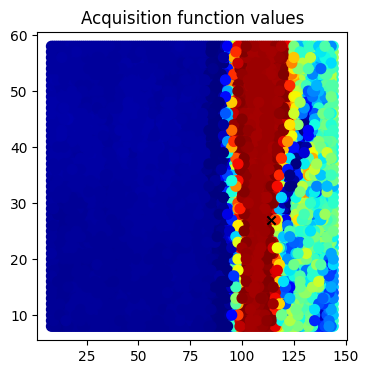

<Figure size 640x480 with 0 Axes>

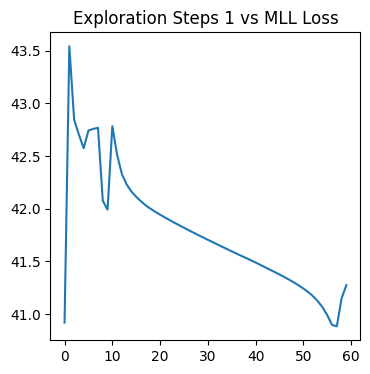

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


114,27


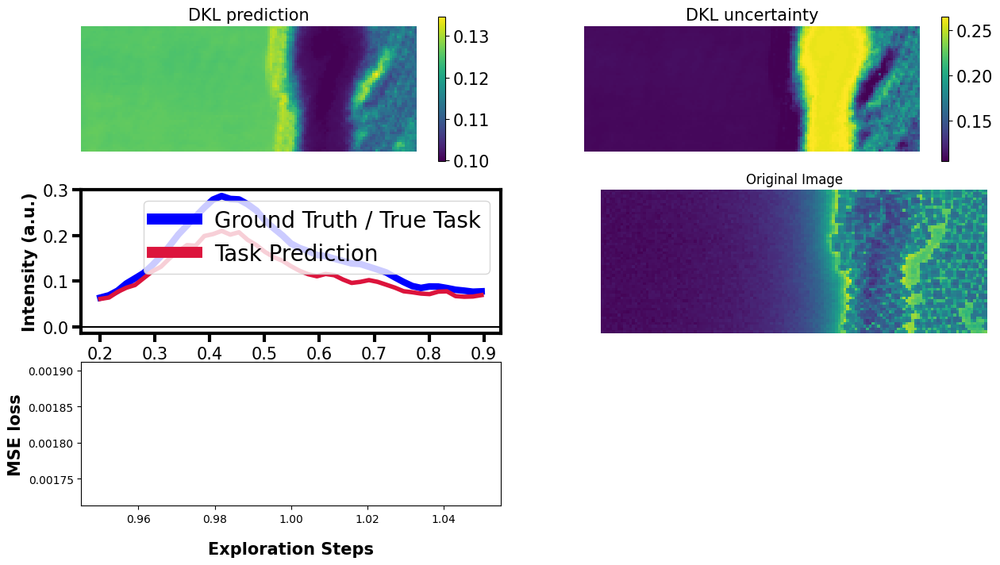

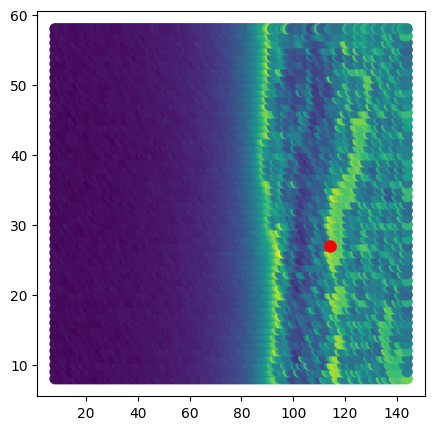

2/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 40.4305
Epoch 10/60 ... Training loss: 42.537
Epoch 20/60 ... Training loss: 41.7156
Epoch 30/60 ... Training loss: 41.5205
Epoch 40/60 ... Training loss: 41.3138
Epoch 50/60 ... Training loss: 40.8955
Epoch 60/60 ... Training loss: 40.8227
Uncertainity based exploration
tensor([[0.1806, 0.1002, 0.1336,  ..., 0.1125, 0.1152, 0.2452],
        [0.1806, 0.1002, 0.1336,  ..., 0.1125, 0.1152, 0.2452],
        [0.1806, 0.1002, 0.1336,  ..., 0.1125, 0.1152, 0.2452],
        ...,
        [0.1806, 0.1002, 0.1336,  ..., 0.1125, 0.1152, 0.2452],
        [0.1806, 0.1002, 0.1336,  ..., 0.1125, 0.1152, 0.2452],
        [0.1806, 0.1002, 0.1336,  ..., 0.1125, 0.1152, 0.2452]])
[[0.18062349 0.10024819 0.13356298 ... 0.11250308 0.11524715 0.24516727]
 [0.18062386 0.10024821 0.13356319 ... 0.11250303 0.11524728 0.24516707]
 [0.18062317 0.10024792 0.13356277 ... 0.11250251 0.11524697 0.24516503]
 ...
 [0.18062414 0.10024826 0.13356335 ... 0.11250303 

<Figure size 640x480 with 0 Axes>

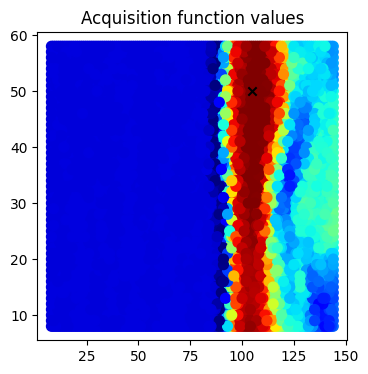

<Figure size 640x480 with 0 Axes>

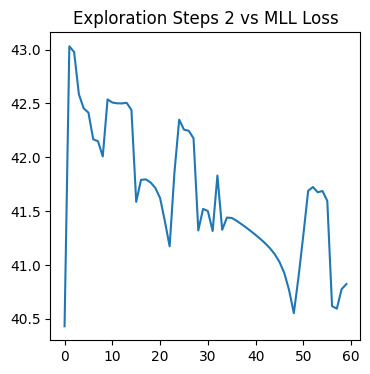

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


105,50


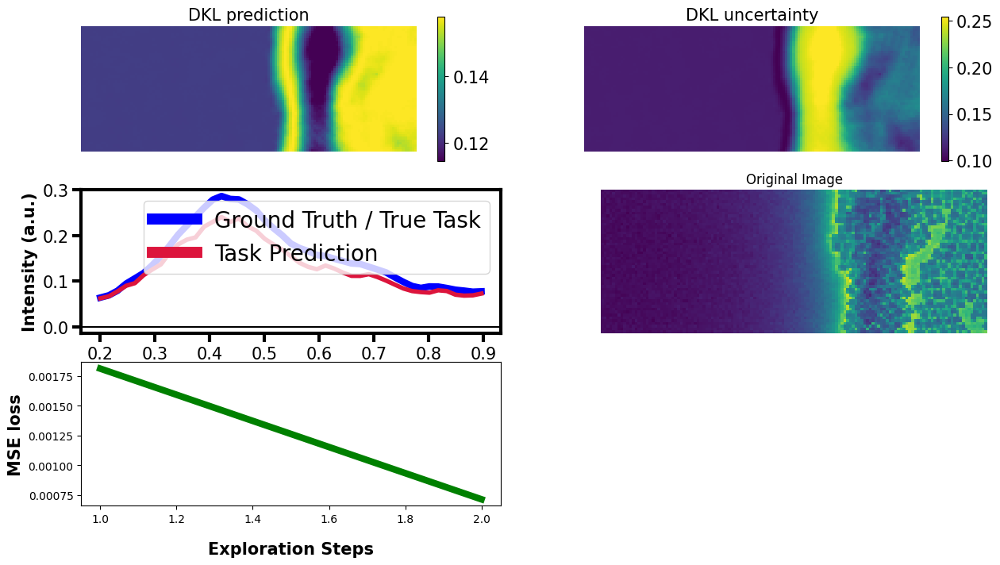

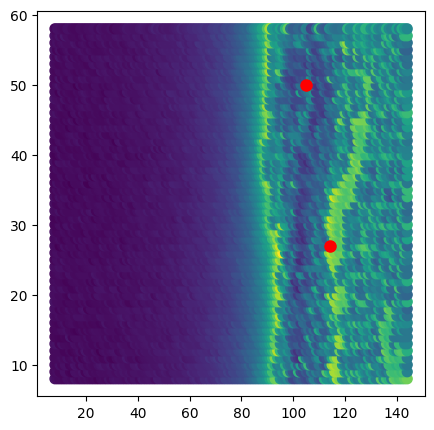

3/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 39.9548
Epoch 10/60 ... Training loss: 42.1691
Epoch 20/60 ... Training loss: 41.6589
Epoch 30/60 ... Training loss: 41.6232
Epoch 40/60 ... Training loss: 41.5539
Epoch 50/60 ... Training loss: 41.0735
Epoch 60/60 ... Training loss: 40.7566
Uncertainity based exploration
tensor([[0.2167, 0.1045, 0.1534,  ..., 0.1022, 0.1445, 0.2246],
        [0.2167, 0.1045, 0.1534,  ..., 0.1022, 0.1445, 0.2246],
        [0.2167, 0.1045, 0.1534,  ..., 0.1022, 0.1445, 0.2246],
        ...,
        [0.2167, 0.1045, 0.1534,  ..., 0.1022, 0.1445, 0.2246],
        [0.2167, 0.1045, 0.1534,  ..., 0.1022, 0.1445, 0.2246],
        [0.2167, 0.1045, 0.1534,  ..., 0.1022, 0.1445, 0.2246]])
[[0.21669059 0.10450218 0.15344879 ... 0.10218536 0.14446374 0.22455733]
 [0.2166914  0.10450225 0.15344919 ... 0.10218532 0.14446409 0.22455807]
 [0.21669065 0.10450187 0.15344866 ... 0.10218479 0.14446359 0.22455718]
 ...
 [0.21669078 0.10450203 0.1534488  ... 0.10218506

<Figure size 640x480 with 0 Axes>

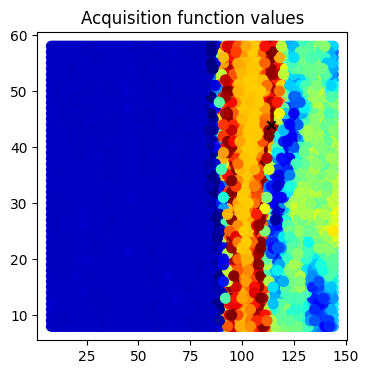

<Figure size 640x480 with 0 Axes>

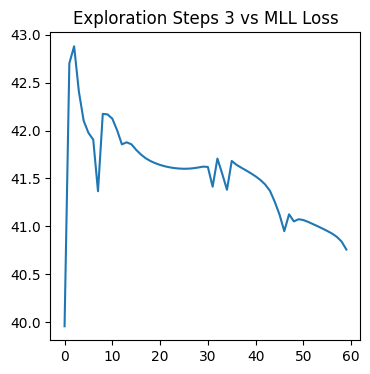

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


114,44


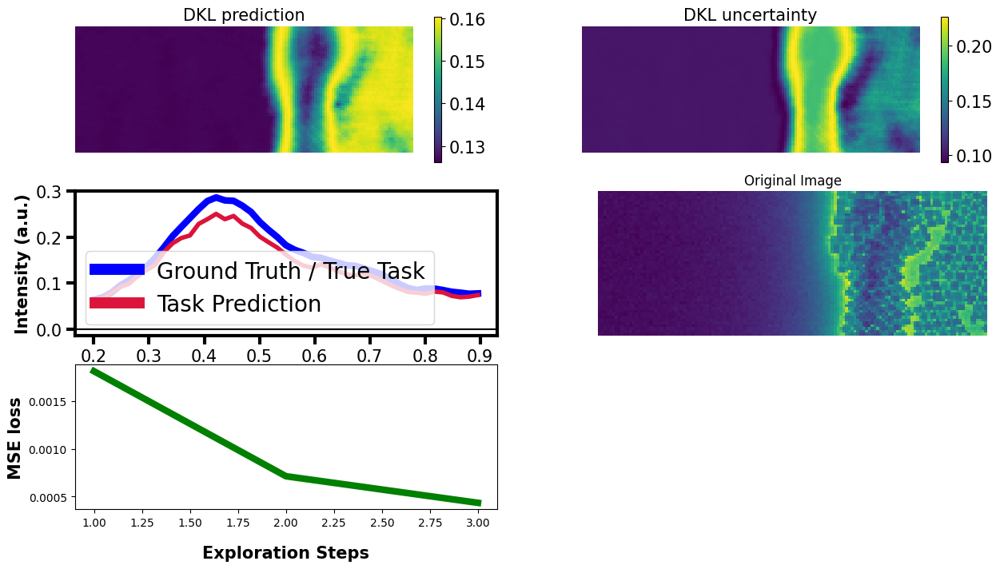

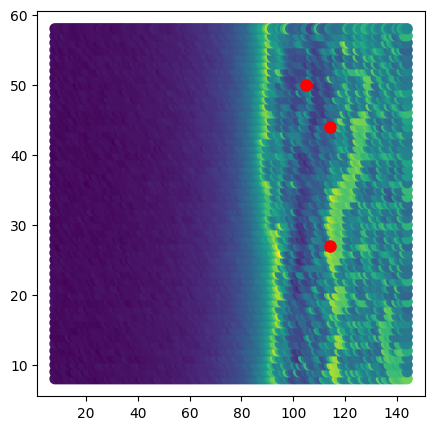

4/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 39.5665
Epoch 10/60 ... Training loss: 41.0969
Epoch 20/60 ... Training loss: 41.7837
Epoch 30/60 ... Training loss: 41.4614
Epoch 40/60 ... Training loss: 41.0554
Epoch 50/60 ... Training loss: 40.7059
Epoch 60/60 ... Training loss: 40.6294
Uncertainity based exploration
tensor([[0.1289, 0.1010, 0.1195,  ..., 0.1119, 0.1047, 0.1337],
        [0.1289, 0.1010, 0.1195,  ..., 0.1119, 0.1047, 0.1337],
        [0.1289, 0.1010, 0.1195,  ..., 0.1119, 0.1047, 0.1337],
        ...,
        [0.1289, 0.1010, 0.1195,  ..., 0.1119, 0.1047, 0.1337],
        [0.1289, 0.1010, 0.1195,  ..., 0.1119, 0.1047, 0.1337],
        [0.1289, 0.1010, 0.1195,  ..., 0.1119, 0.1047, 0.1337]])
[[0.12889888 0.10102268 0.11952174 ... 0.11192132 0.10470608 0.13367776]
 [0.12889938 0.10102269 0.11952213 ... 0.11192124 0.10470624 0.13367781]
 [0.12889925 0.1010224  0.11952199 ... 0.11192073 0.10470604 0.13367731]
 ...
 [0.12889935 0.10102244 0.11952207 ... 0.11192082

<Figure size 640x480 with 0 Axes>

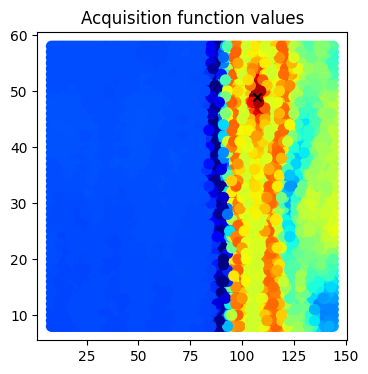

<Figure size 640x480 with 0 Axes>

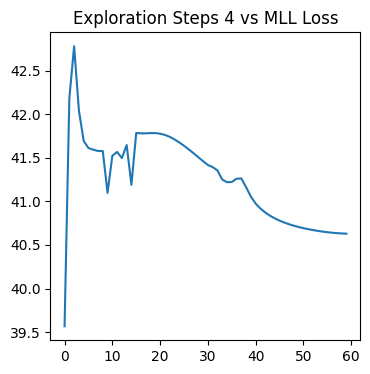

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


107,49


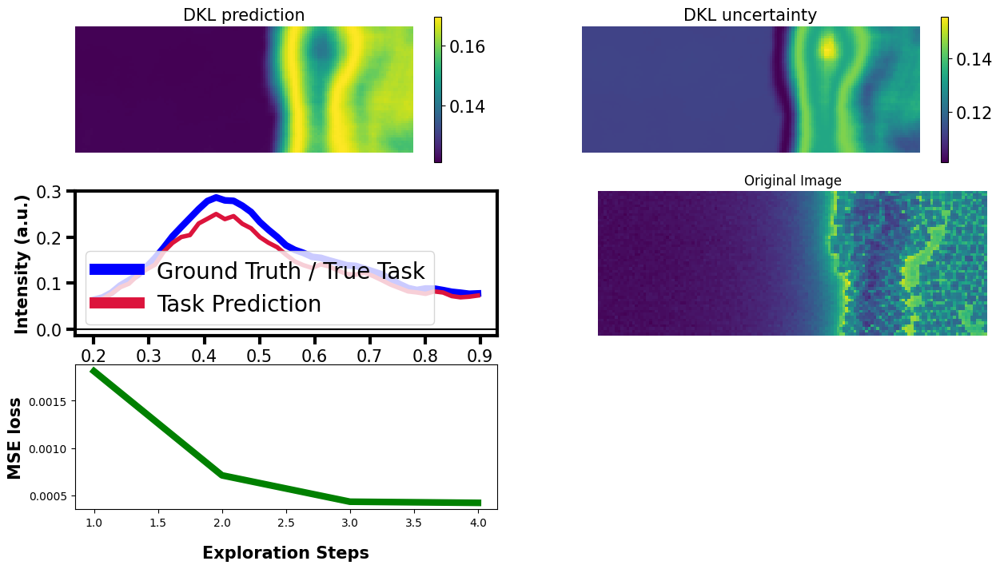

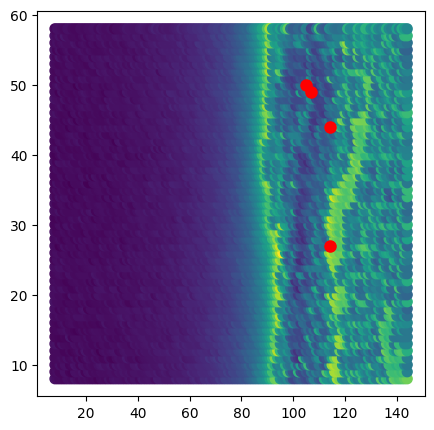

5/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 39.2646
Epoch 10/60 ... Training loss: 41.1766
Epoch 20/60 ... Training loss: 41.3105
Epoch 30/60 ... Training loss: 40.69
Epoch 40/60 ... Training loss: 40.9655
Epoch 50/60 ... Training loss: 40.6921
Epoch 60/60 ... Training loss: 40.4723
Uncertainity based exploration
tensor([[0.1461, 0.1061, 0.1399,  ..., 0.1126, 0.1115, 0.1138],
        [0.1461, 0.1061, 0.1399,  ..., 0.1126, 0.1115, 0.1138],
        [0.1461, 0.1061, 0.1399,  ..., 0.1126, 0.1115, 0.1138],
        ...,
        [0.1461, 0.1061, 0.1399,  ..., 0.1126, 0.1115, 0.1138],
        [0.1461, 0.1061, 0.1399,  ..., 0.1126, 0.1115, 0.1138],
        [0.1461, 0.1061, 0.1399,  ..., 0.1126, 0.1115, 0.1138]])
[[0.14605213 0.10612419 0.13993591 ... 0.11260206 0.11152939 0.11384895]
 [0.14605255 0.10612422 0.13993629 ... 0.11260205 0.11152951 0.11384901]
 [0.1460519  0.10612379 0.13993569 ... 0.11260148 0.11152908 0.11384853]
 ...
 [0.14605339 0.10612405 0.13993703 ... 0.1126017  0

<Figure size 640x480 with 0 Axes>

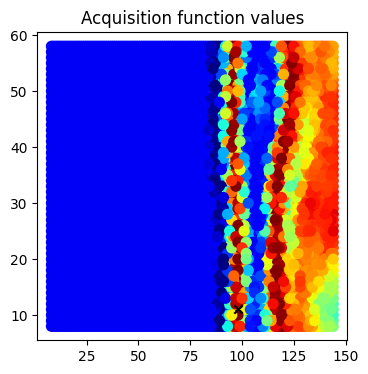

<Figure size 640x480 with 0 Axes>

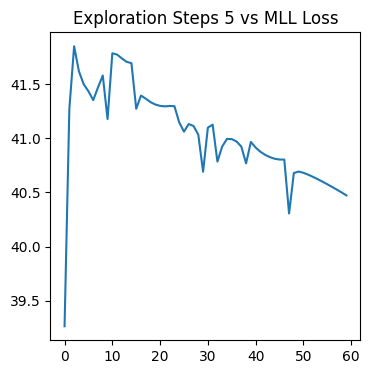

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


98,11


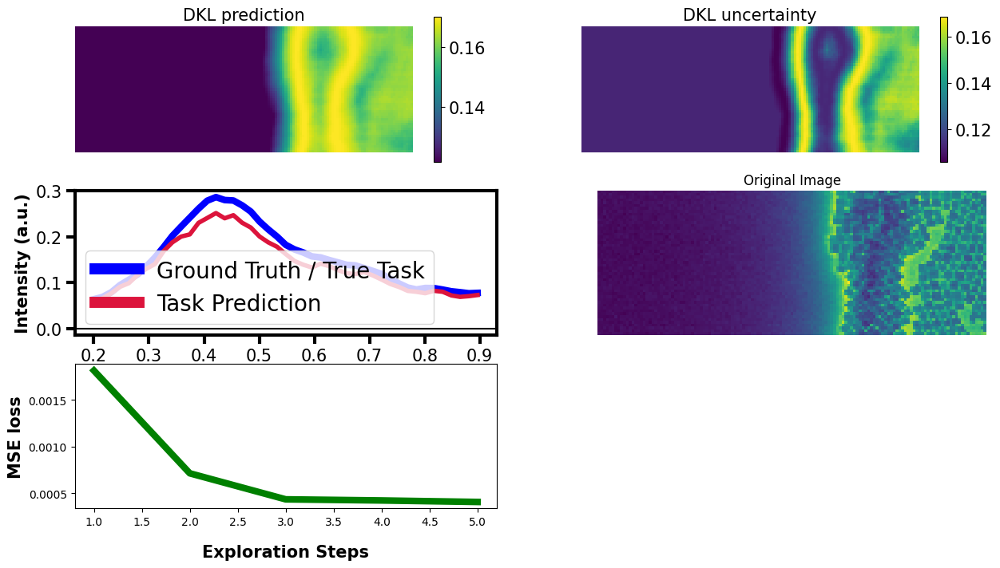

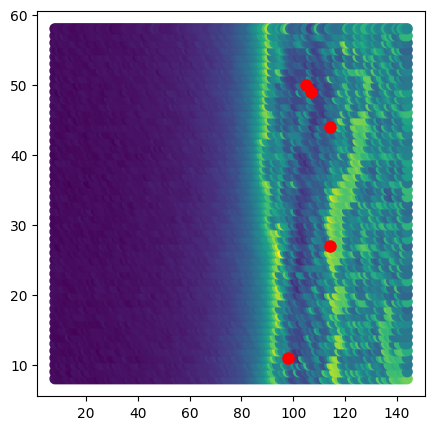

⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking

Total time taken 144.0685520172119


<Figure size 640x480 with 0 Axes>

In [112]:
X,y,e_reduced,full_img,full_spectrum,index = task_t(2,data_augmentation=False)

# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X.detach().cpu().numpy(), y.T.detach().cpu().numpy(), index, test_size=0.999, shuffle=True, random_state=20)

# The targets for the DKL-GPR must have vector_size x n_samples dimensions where vector_size is equal to spectral length
y_train = y_train.T
y_test = y_test.T

torch.set_default_device('cuda:4')

print("Train X :",X_train.shape) # n_samples x n_features
print("Train y :",y_train.shape) # vector_size x n_samples 

print("Test X :",X_test.shape) # n_samples x n_features
print("Test y :",y_test.shape) # vector_size x n_samples 

torch.save(X_train,"Reptile_AEDKL_CMFlogs/Task2_active_patch_1.pt")
torch.save(y_train,"Reptile_AEDKL_CMFlogs/Task2_active_spectra_1.pt")

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

exploration_steps =  6 # 200 is about 7% of the points --> ~10-15 minute execution time! Note, 100 steps only takes ~3 min

xi = 0.01                # balances exploration and exploitation for EI

################################################################################
import time  # NEW LINE
time_all = []  # NEW LINE
AF_results = []
ei = []
bestf = []
training_iter = 60
data_dim = X_train.shape[-1]
metawriter = cmf.create_context(pipeline_stage="Task 2 Active Learning Preprocessing")
metawriter = cmf.create_execution(execution_type="Task2ActiveLearningReptileProc",
                                  custom_properties={"exploration_steps":exploration_steps-1,
                                                    "training_iter":training_iter,
                                                    "exploration_exploitation":xi})

metawriter = cmf.log_dataset("Reptile_AEDKL_CMFlogs/Task2_active_patch_1.pt","output")
metawriter = cmf.log_dataset("Reptile_AEDKL_CMFlogs/Task2_active_spectra_1.pt","output")
metawriter = cmf.log_model("Reptile_AEDKL_CMFlogs/Reptile_training/base_model_3_reptile_itr.pt",event="input",
                           model_framework="PyTorch",
                           model_type="BaseModel",
                           model_name=f"Reptile_3metamodel")
metawriter = cmf.log_dataset("Reptile_AEDKL_CMFlogs/loadedfile.npy","input")

print(data_dim)
mseloss = []

original_mean_spectrum = [] 
predicted_mean_spectrum = []


start_time = time.time()
for e in range(1,exploration_steps):
    print("{}/{}".format(e, exploration_steps))
    
    
    training_iter = training_iter #if e < 100 else 40  # we do not want to "overfit" our model at the beginning

    # update GP posterior
    #Model
    dklgp_new = dklgpreg.dklGPR(indim = data_dim, embedim = 2, hidden_dim = hidden_dim, feature_extract=deepcopy(reptile_mlp))
    dklgp_new.fit(X_train, y_train, training_cycles=training_iter,lr=1e-3)

    # Compute the acquisition function
    best_f = deepcopy(dklgp_new).predict(X_train)[0].max()
    obj = CE(deepcopy(dklgp_new),X_test)#EI(deepcopy(dklgp_new), X_test, best_f, xi) if e < 60 else CE(dklgp, X_test)

    # SAVE current acquisition function
    AF = save_result(indices_test, obj)
    AF_results.append(AF)

    torch.save(dklgp_new,f"Reptile_AEDKL_CMFlogs/Task2_AL_dklgpr_exp{e+1}.pt")

    obj = obj.T # transpose to n_samples x vector_size  for consistency

    # Scalarize the acquisition function
    obj = scalarize_acq(obj)
    
    ei.append(np.max(obj))

    # Select the next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[:, next_point_idx]
    #print(f"y dim {y.T.shape}")
    #print(next_point)

    # Plot current result
    plot_result(indices_test, obj,e)


    # SAVE current MODEL WEIGHTS
#     state_dict = dklgp_new.gp_model.state_dict()
#     torch.save(state_dict, "AL_Checkpoints/ReptileModel_ActiveDKL {}.pt".format(e))
    Plot_MLL(dklgp_new,e,training_iter)

    idx2,idx1 = next_point
    idx1,idx2 = int(idx1),int(idx2)
    
    mseloss,dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var=spectrum_recconstruction_plotting(model_name = deepcopy(dklgp_new), structural_img=full_img, 
                                      spectral_img=full_spectrum, X_var=X,y_var=y, 
                                      e_red=e_reduced ,indices_=index,mseloss=mseloss,exploration_steps=e,figsize = (15,8), 
                                      energy_range = [0,-1])
    
    print(f"{idx1},{idx2}")
    
    dkl_meas_full = y.T.reshape(dkl_prediction.shape)
    
    
    original_mean_spectrum.append(np.median(measured_point))
    predicted_mean_spectrum.append(np.median(mean[next_point_idx]))
    # ax2.plot(range(e),original_mean_spectrum,label=f'Original Spectral Intensity at {e}')
    # ax2.plot(range(e),predicted_mean_spectrum,label=f'Predicted Spectral Intensity at {e}')
    # ax2.set_xlabel('Exploration Steps')
    # ax2.set_ylabel('Averate Spectral Intenity at Exploration Points')
    # plt.legend()
    
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point[:, None], 1)
    y_test = np.delete(y_test, next_point_idx, 1)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)
    time_all.append(time.time() - start_time)  # NEW LINE

    torch.save(X_train,f"Reptile_AEDKL_CMFlogs/Task2_active_patch_{e+1}.pt",)
    torch.save(y_train,f"Reptile_AEDKL_CMFlogs/Task2_active_spectra_{e+1}.pt")

    clear_cache()

    plt.figure(figsize=(5, 5))
    plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
    plt.scatter(indices_train[-e:, 1], indices_train[-e:, 0], s=64, c='r')
    plt.show(block=False)
    plt.savefig(f"Reptile_AEDKL_CMFlogs/Task2_Exploration_{e}step.png")

for e in range(1,exploration_steps):
    metawriter = cmf.create_context(pipeline_stage=f"Active Learning Exp {e}")
    metawriter = cmf.create_execution(execution_type=f"ActiveLearningTrainingExp{e}",custom_properties={"exploration_steps":exploration_steps})
    metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Task2_AL_dklgpr_exp{e+1}.pt",
                      event="output",model_framework="PyTorch",model_type="ReptileIntegratedGaussianProcessRegressor",
                      model_name=f"Active_DKLGPR{e+1}")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task2_active_patch_{e+1}.pt","output")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task2_active_spectra_{e+1}.pt","output")
    # metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/acquisition_function_val_{e+1}exp.png","output")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task2_Exploration_{e}step.png","output")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task2_active_patch_{e}.pt","input")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task2_active_spectra_{e}.pt","input")
    if e!=1:
        metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Task2_AL_dklgpr_exp{e}.pt",event="input")
    
print(f"Total time taken {time.time()-start_time}")

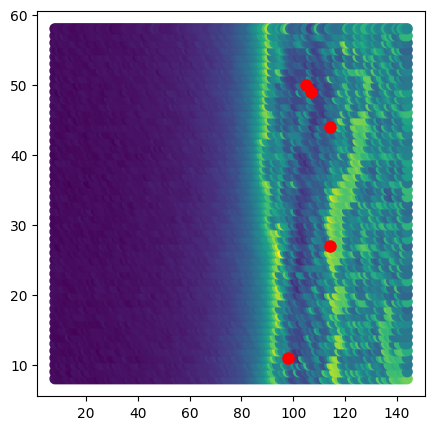

In [113]:
plt.figure(figsize=(5, 5))
plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
plt.scatter(indices_train[-5:, 1], indices_train[-5:, 0], s=64, c='r')

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Train x:  (6, 256)
Train y:  (46, 6)
Test x:  (6981, 256)
Test y:  (46, 6981)
1/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 42.1878
Epoch 10/60 ... Training loss: 42.8062
Epoch 20/60 ... Training loss: 42.5088
Epoch 30/60 ... Training loss: 42.4153
Epoch 40/60 ... Training loss: 41.7339
Epoch 50/60 ... Training loss: 41.2713
Epoch 60/60 ... Training loss: 40.8735
Uncertainity based exploration
tensor([[0.2134, 0.1042, 0.1569,  ..., 0.1048, 0.1149, 0.2807],
        [0.2134, 0.1042, 0.1569,  ..., 0.1048, 0.1149, 0.2807],
        [0.2134, 0.1042, 0.1569,  ..., 0.1048, 0.1149, 0.2807],
        ...,
        [0.2134, 0.1042, 0.1569,  ..., 0.1048, 0.1149, 0.2807],
        [0.2134, 0.1042, 0.1569,  ..., 0.1048, 0.1149, 0.2807],
        [0.2134, 0.1042, 0.1569,  ..., 0.1048, 0.1149, 0.2807]])
[[0.21340871 0.10420073 0.15694465 ... 0.1048011  0.11492716 0.28069408]
 [0.21340

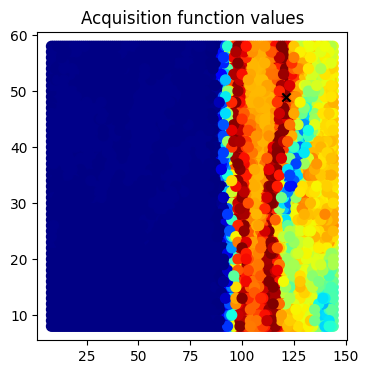

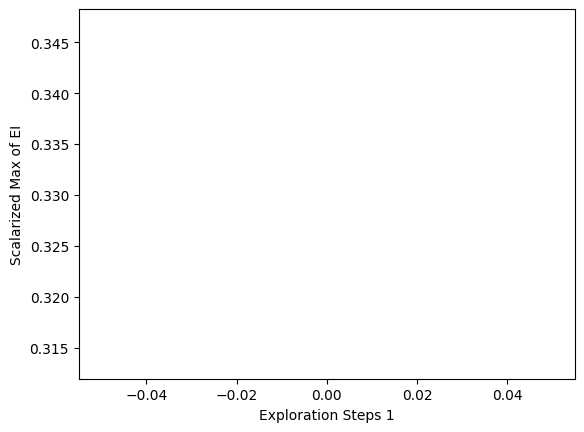

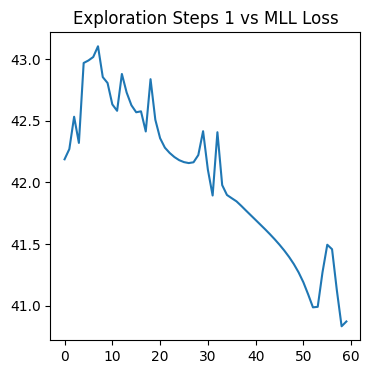

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([51, 137, 46]), dkl_prediction (51, 137, 46)


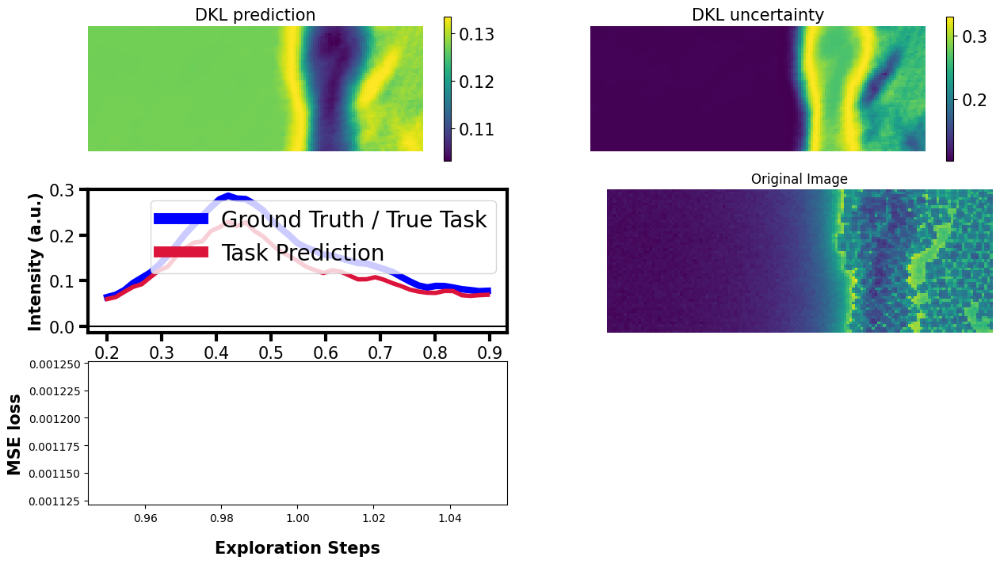

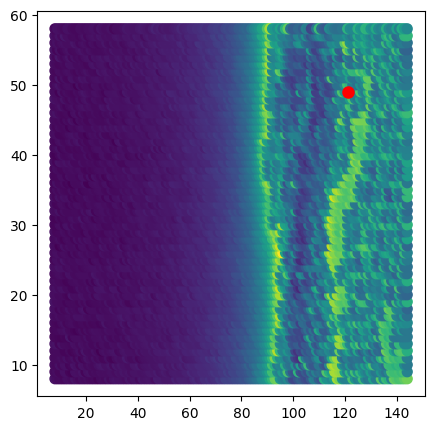

2/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 42.6216
Epoch 10/60 ... Training loss: 42.2539
Epoch 20/60 ... Training loss: 42.1058
Epoch 30/60 ... Training loss: 41.8815
Epoch 40/60 ... Training loss: 41.7088
Epoch 50/60 ... Training loss: 41.5602
Epoch 60/60 ... Training loss: 41.2435
Uncertainity based exploration
tensor([[0.1654, 0.1046, 0.1370,  ..., 0.1127, 0.1150, 0.2372],
        [0.1654, 0.1046, 0.1370,  ..., 0.1127, 0.1150, 0.2372],
        [0.1654, 0.1046, 0.1370,  ..., 0.1127, 0.1150, 0.2372],
        ...,
        [0.1654, 0.1046, 0.1370,  ..., 0.1127, 0.1150, 0.2372],
        [0.1654, 0.1046, 0.1370,  ..., 0.1127, 0.1150, 0.2372],
        [0.1654, 0.1046, 0.1370,  ..., 0.1127, 0.1150, 0.2372]])
[[0.16542848 0.10463616 0.13702684 ... 0.11272537 0.11501754 0.23719231]
 [0.16542821 0.10463616 0.13702662 ... 0.11272543 0.11501744 0.23719207]
 [0.16542777 0.10463579 0.13702647 ... 0.1127247  0.11501728 0.23719022]
 ...
 [0.16542847 0.10463613 0.13702691 ... 0.11272522

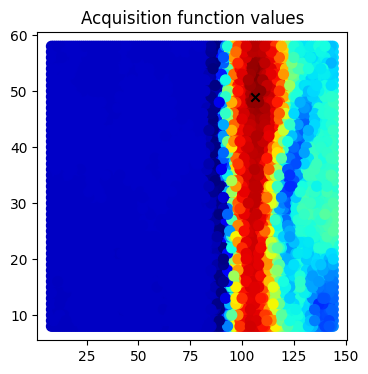

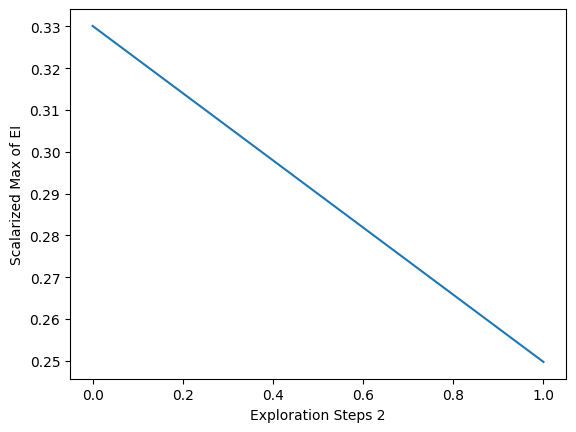

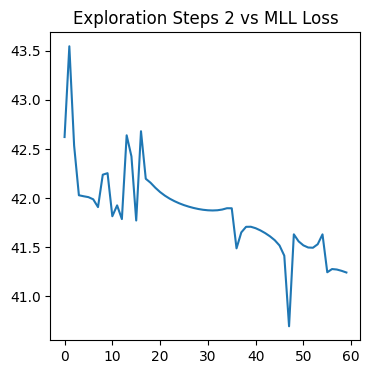

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([51, 137, 46]), dkl_prediction (51, 137, 46)


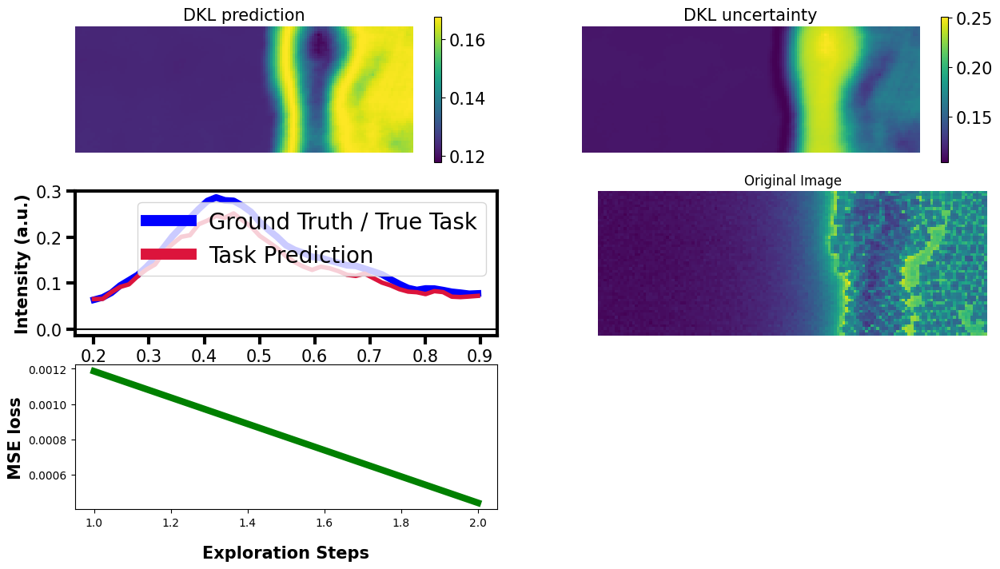

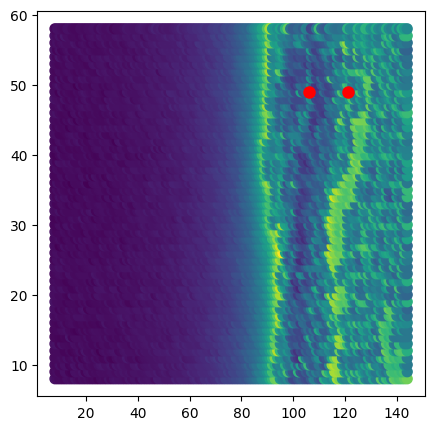

3/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 42.9094
Epoch 10/60 ... Training loss: 41.8924
Epoch 20/60 ... Training loss: 42.1992
Epoch 30/60 ... Training loss: 41.6227
Epoch 40/60 ... Training loss: 41.6789
Epoch 50/60 ... Training loss: 41.2185
Epoch 60/60 ... Training loss: 40.4419
Uncertainity based exploration
tensor([[0.0698, 0.0698, 0.0698,  ..., 0.0698, 0.0698, 0.0698],
        [0.0698, 0.0698, 0.0698,  ..., 0.0698, 0.0698, 0.0698],
        [0.0698, 0.0698, 0.0698,  ..., 0.0698, 0.0698, 0.0698],
        ...,
        [0.0698, 0.0698, 0.0698,  ..., 0.0698, 0.0698, 0.0698],
        [0.0698, 0.0698, 0.0698,  ..., 0.0698, 0.0698, 0.0698],
        [0.0698, 0.0698, 0.0698,  ..., 0.0698, 0.0698, 0.0698]])
[[0.06980396 0.06980396 0.06980396 ... 0.06980396 0.06980396 0.06980396]
 [0.06980403 0.06980403 0.06980403 ... 0.06980403 0.06980403 0.06980403]
 [0.06980365 0.06980365 0.06980365 ... 0.06980365 0.06980365 0.06980365]
 ...
 [0.06980383 0.06980383 0.06980383 ... 0.06980383

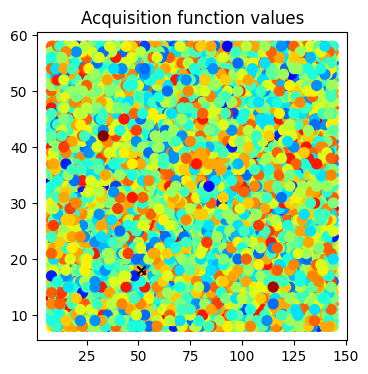

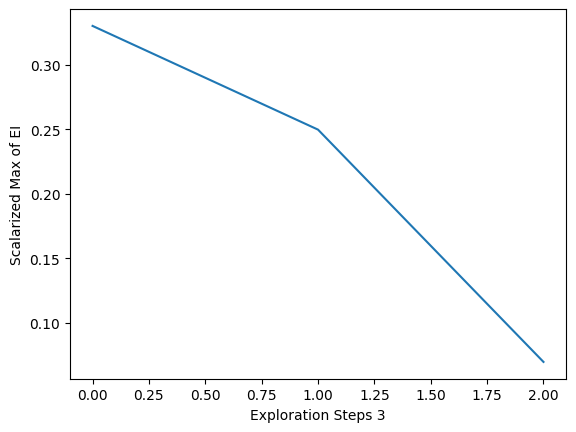

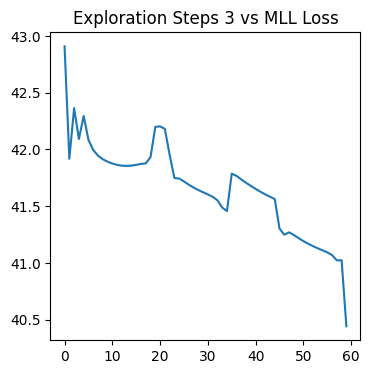

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([51, 137, 46]), dkl_prediction (51, 137, 46)


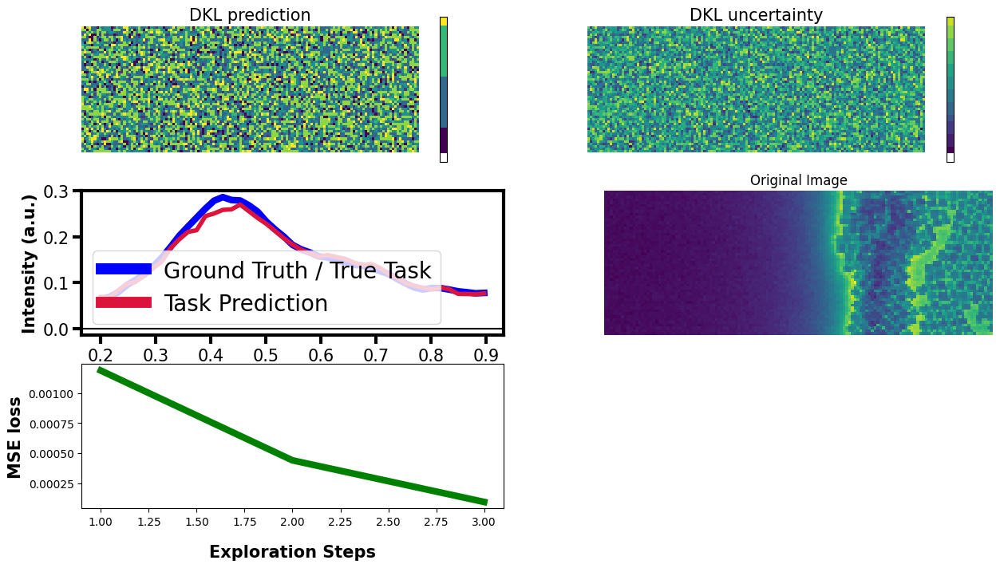

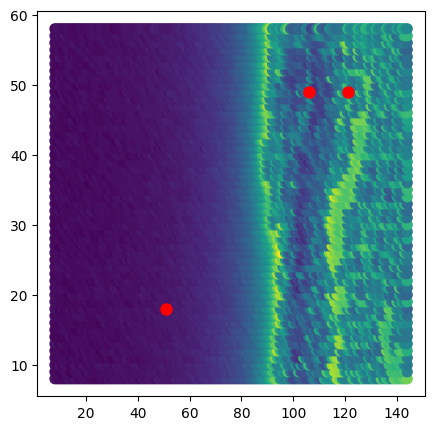

4/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 42.3318
Epoch 10/60 ... Training loss: 41.5039
Epoch 20/60 ... Training loss: 41.3654
Epoch 30/60 ... Training loss: 40.9218
Epoch 40/60 ... Training loss: 40.7596
Epoch 50/60 ... Training loss: 40.5433
Epoch 60/60 ... Training loss: 40.4634
Uncertainity based exploration
tensor([[0.1417, 0.0910, 0.1169,  ..., 0.0963, 0.1025, 0.1699],
        [0.1417, 0.0910, 0.1169,  ..., 0.0963, 0.1025, 0.1699],
        [0.1417, 0.0910, 0.1169,  ..., 0.0963, 0.1025, 0.1699],
        ...,
        [0.1417, 0.0910, 0.1169,  ..., 0.0963, 0.1025, 0.1699],
        [0.1417, 0.0910, 0.1169,  ..., 0.0963, 0.1025, 0.1699],
        [0.1417, 0.0910, 0.1169,  ..., 0.0963, 0.1025, 0.1699]])
[[0.14168153 0.0909681  0.11687015 ... 0.09632478 0.10249241 0.16985804]
 [0.1416809  0.09096807 0.11686973 ... 0.09632491 0.10249216 0.1698579 ]
 [0.14168202 0.09096808 0.1168705  ... 0.09632456 0.1024926  0.16985796]
 ...
 [0.141682   0.0909682  0.11687049 ... 0.0963248 

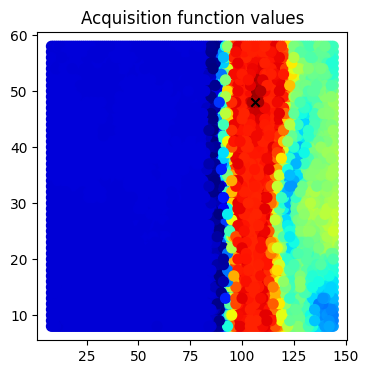

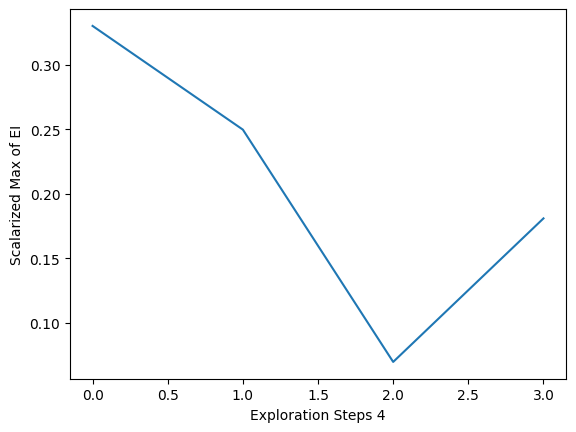

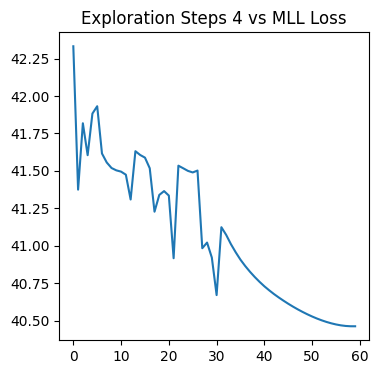

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([51, 137, 46]), dkl_prediction (51, 137, 46)


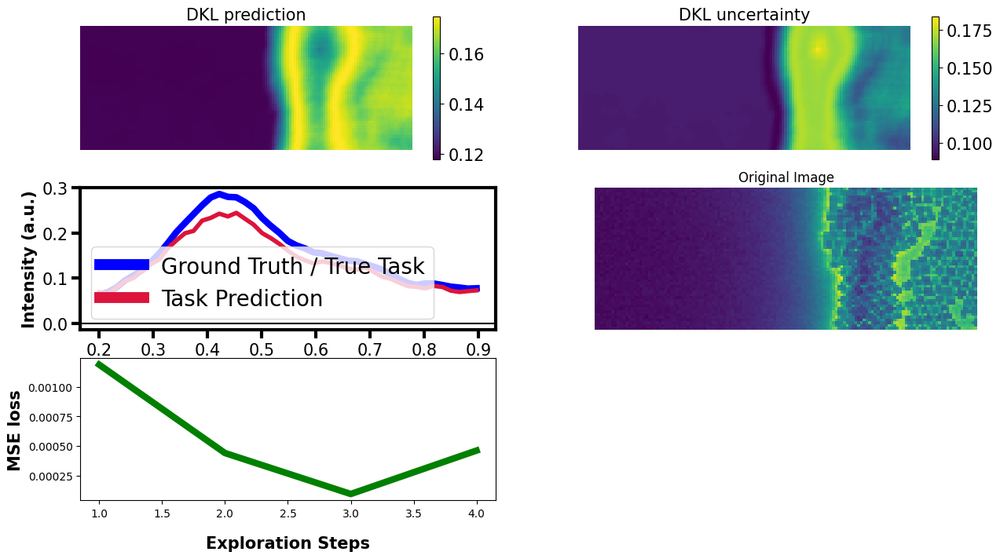

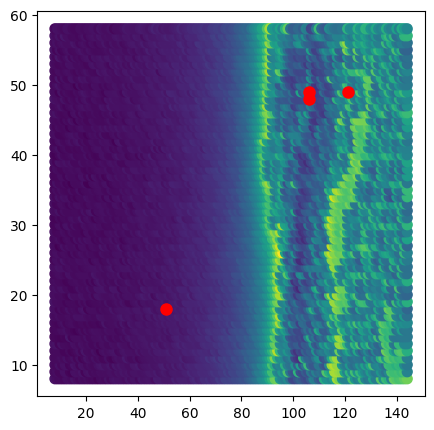

5/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 42.0528
Epoch 10/60 ... Training loss: 41.097
Epoch 20/60 ... Training loss: 41.0238
Epoch 30/60 ... Training loss: 41.1661
Epoch 40/60 ... Training loss: 40.7087
Epoch 50/60 ... Training loss: 40.5496
Epoch 60/60 ... Training loss: 40.4284
Uncertainity based exploration
tensor([[0.1502, 0.0933, 0.1389,  ..., 0.0970, 0.1044, 0.1395],
        [0.1502, 0.0933, 0.1389,  ..., 0.0970, 0.1044, 0.1395],
        [0.1502, 0.0933, 0.1389,  ..., 0.0970, 0.1044, 0.1395],
        ...,
        [0.1502, 0.0933, 0.1389,  ..., 0.0970, 0.1044, 0.1395],
        [0.1502, 0.0933, 0.1389,  ..., 0.0970, 0.1044, 0.1395],
        [0.1502, 0.0933, 0.1389,  ..., 0.0970, 0.1044, 0.1395]])
[[0.15015994 0.09332531 0.13892148 ... 0.09703434 0.10436136 0.13949999]
 [0.15015938 0.09332532 0.13892098 ... 0.09703444 0.10436118 0.13949991]
 [0.15015849 0.09332486 0.13892021 ... 0.09703384 0.10436069 0.139499  ]
 ...
 [0.15015845 0.09332502 0.13892016 ... 0.09703411 

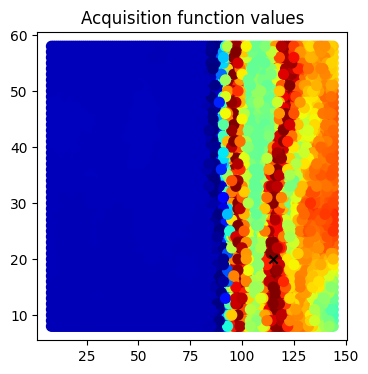

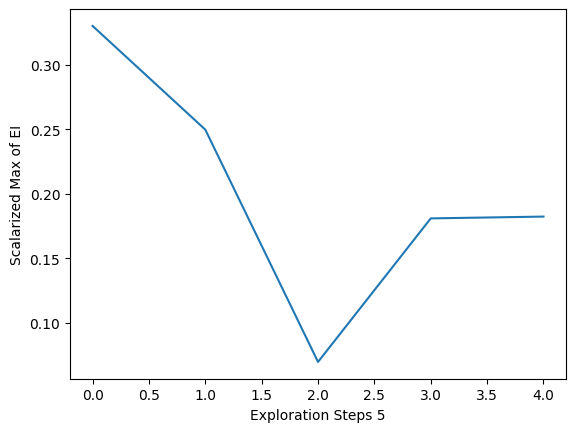

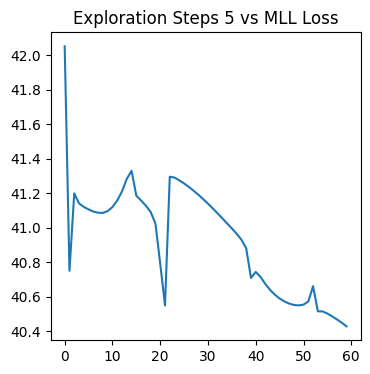

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([51, 137, 46]), dkl_prediction (51, 137, 46)


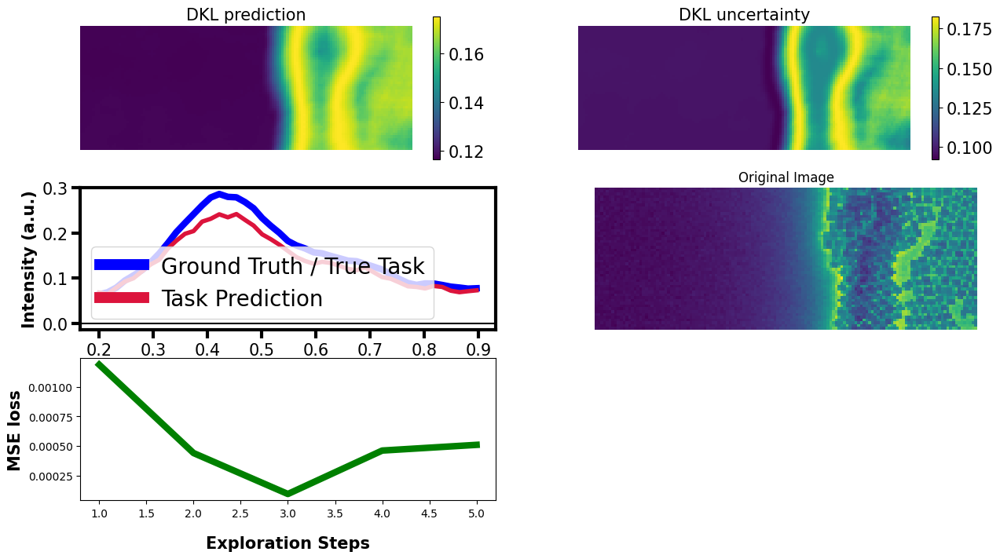

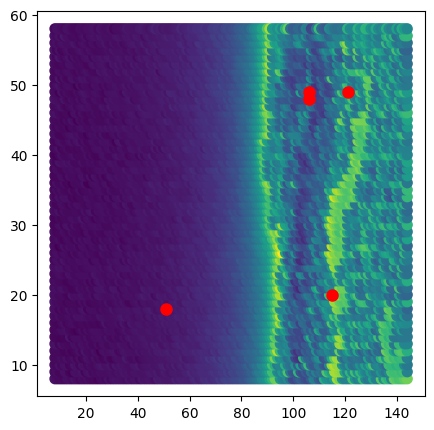

Time taken 156.25668215751648


In [114]:
### clear_cache()


from sklearn.model_selection import train_test_split
from atomai.nets import fcFeatureExtractor

X,y,e_reduced,full_img,full_spectrum,index = task_t(2,data_augmentation=False)

# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X.detach().cpu().numpy(), y.T.detach().cpu().numpy(), index, test_size=0.999, shuffle=True, random_state=20)

# The targets for the DKL-GPR must have vector_size x n_samples dimensions where vector_size is equal to spectral length
y_train = y_train.T
y_test = y_test.T

print("Train x: ",X_train.shape) # n_samples x n_features
print("Train y: ",y_train.shape) # vector_size x n_samples 

print("Test x: ",X_test.shape) # n_samples x n_features
print("Test y: ",y_test.shape) # vector_size x n_samples 

torch.set_default_device('cuda')
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed) 

exploration_steps = 6 # 200 is about 7% of the points --> ~10-15 minute execution time! Note, 100 steps only takes ~3 min

xi = 0.01                # balances exploration and exploitation for EI

################################################################################
import time  # NEW LINE
time_all = []  # NEW LINE

ei = []
AF_results = []

reg_mseloss = []
reg_original_mean_spectrum = []
reg_predicted_mean_spectrum = []

data_dim = X_train.shape[-1]


start_time = time.time()
for e in range(1,exploration_steps):
    print("{}/{}".format(e, exploration_steps))
    #start_time = time.time()  # NEW LINE
    training_iter = 60 if e < 100 else 40  # we do not want to "overfit" our model at the beginning

    # update GP posterior
    #Model
    dklgp_new = dklgpreg.dklGPR(indim = datadim, embedim = 2, hidden_dim=hidden_dim, feature_extract=deepcopy(fcFeatureExtractor(feat_dim=256,embedim=2)))
    dklgp_new.fit(X_train, y_train, training_cycles=training_iter,lr=1e-3)

    # Compute the acquisition function
    best_f = deepcopy(dklgp_new).predict(X_train)[0].max()
    obj = CE(deepcopy(dklgp_new),X_test)#EI(deepcopy(dklgp_new), X_test, best_f, xi)

    # SAVE current acquisition function
    AF = save_result(indices_test, obj)
    AF_results.append(AF)

    obj = obj.T # transpose to n_samples x vector_size  for consistency
  
    # Scalarize the acquisition function
    obj = scalarize_acq(obj)
    
    ei.append(np.max(obj))

    # Select the next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[:, next_point_idx]
    
    idx2,idx1 = next_point
    idx1,idx2 = int(idx1),int(idx2)
    
    print(idx1,idx2)
    

    # Plot current result
    plot_result(indices_test, obj, e)

    plt.plot(range(e), ei)
    plt.xlabel(f"Exploration Steps {e}")
    plt.ylabel('Scalarized Max of EI')

    # SAVE current MODEL WEIGHTS
#     state_dict = dklgp_new.gp_model.state_dict()
    #torch.save(state_dict, "Model_ActiveDKL {}.pt".format(e))
    
    Plot_MLL(dklgp_new,e,training_iter)
    
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point[:, None], 1)
    y_test = np.delete(y_test, next_point_idx, 1)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)
    time_all.append(time.time() - start_time)  # NEW LINE
    
    reg_mseloss, dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var = spectrum_recconstruction_plotting(model_name = deepcopy(dklgp_new), structural_img=full_img, 
                                      spectral_img=full_spectrum, X_var=X,y_var=y, 
                                      e_red=e_reduced ,indices_=index,mseloss=reg_mseloss,exploration_steps=e,figsize = (15,8), 
                                      energy_range = [0,-1])

    reg_original_mean_spectrum.append(np.median(measured_point))
    reg_predicted_mean_spectrum.append(np.median(mean[next_point_idx]))
    
    dkl_meas_full = y.T.reshape(dkl_prediction.shape)
    
    print(f"dkl means full {dkl_meas_full.shape}, dkl_prediction {dkl_prediction.shape}")
    plt.figure(figsize=(5, 5))
    plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
    plt.scatter(indices_train[-e:, 1], indices_train[-e:, 0], s=64, c='r')
    plt.show(block=False)

    dkl_meas_full = y.T.reshape(dkl_prediction.shape)   
    
    clear_cache()
    
    

print(f"Time taken {time.time()-start_time}")

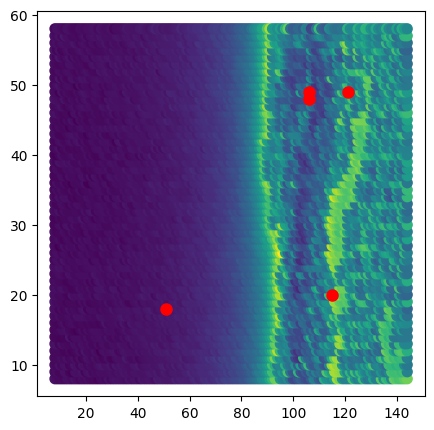

In [115]:
plt.figure(figsize=(5, 5))
plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
plt.scatter(indices_train[-5:, 1], indices_train[-5:, 0], s=64, c='r')

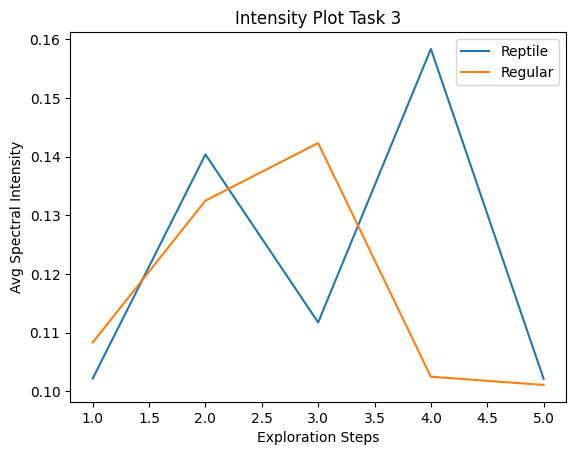

In [116]:
plt.plot(range(1,exploration_steps),predicted_mean_spectrum,label='Reptile')
plt.plot(range(1,exploration_steps),reg_predicted_mean_spectrum,label='Regular')
plt.title('Intensity Plot Task 3')
plt.ylabel('Avg Spectral Intensity')
plt.xlabel('Exploration Steps')
plt.legend()

Text(0, 0.5, 'MSE')

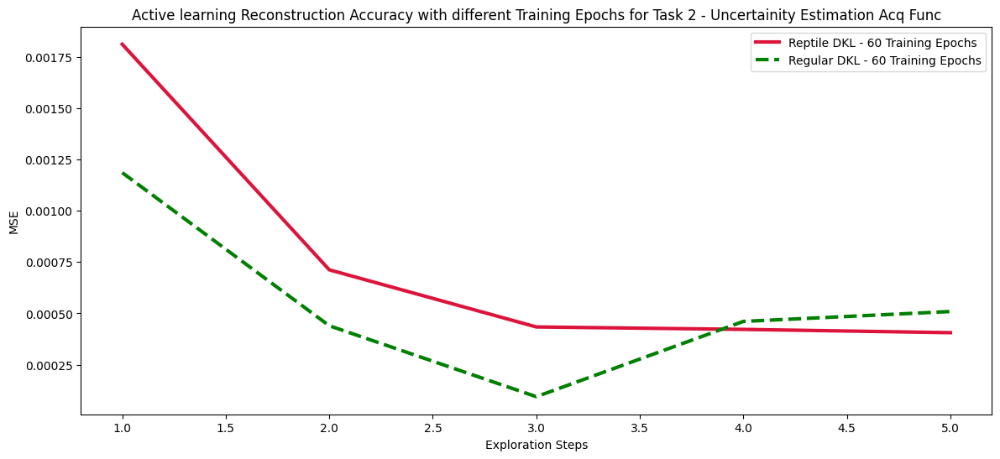

In [117]:
plt.figure(figsize=(14,6))
plt.title(f"Active learning Reconstruction Accuracy with different Training Epochs for Task 2 - Uncertainity Estimation Acq Func")
plt.plot(range(1,exploration_steps),mseloss,label=f"Reptile DKL - {training_iter} Training Epochs",c='crimson',linewidth=3)
plt.plot(range(1,exploration_steps),reg_mseloss,label=f"Regular DKL - {training_iter} Training Epochs",c='green',linewidth=3,linestyle='--')
plt.legend()
plt.xlabel('Exploration Steps')
plt.ylabel('MSE')

In [118]:
clear_cache()

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Train X : (2, 256)
Train y : (46, 2)
Test X : (2198, 256)
Test y : (46, 2198)
256


⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace


1/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 44.799
Epoch 10/60 ... Training loss: 46.748
Epoch 20/60 ... Training loss: 46.4768
Epoch 30/60 ... Training loss: 46.0796
Epoch 40/60 ... Training loss: 45.2971
Epoch 50/60 ... Training loss: 44.4129
Epoch 60/60 ... Training loss: 44.2884
Uncertainity based exploration
tensor([[0.2325, 0.2325, 0.2839,  ..., 0.2142, 0.2240, 0.3170],
        [0.2325, 0.2325, 0.2839,  ..., 0.2143, 0.2240, 0.3171],
        [0.2324, 0.2324, 0.2837,  ..., 0.2142, 0.2240, 0.3168],
        ...,
        [0.2325, 0.2325, 0.2838,  ..., 0.2143, 0.2240, 0.3169],
        [0.2325, 0.2325, 0.2838,  ..., 0.2143, 0.2240, 0.3169],
        [0.2325, 0.2325, 0.2838,  ..., 0.2143, 0.2240, 0.3169]])
[[0.23246568 0.23246568 0.2838728  ... 0.21422317 0.22396833 0.31703008]
 [0.23251102 0.23251102 0.28394897 ... 0.21425865 0.22400891 0.31712765]
 [0.23242194 0.23242194 0.28370399 ... 0.21422388 0.22395101 0.31677407]
 ...
 [0.23250693 0.23250693 0.28383727 ... 0.21430081 0

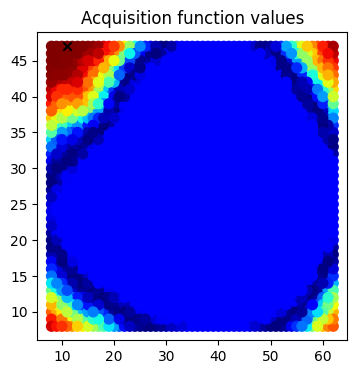

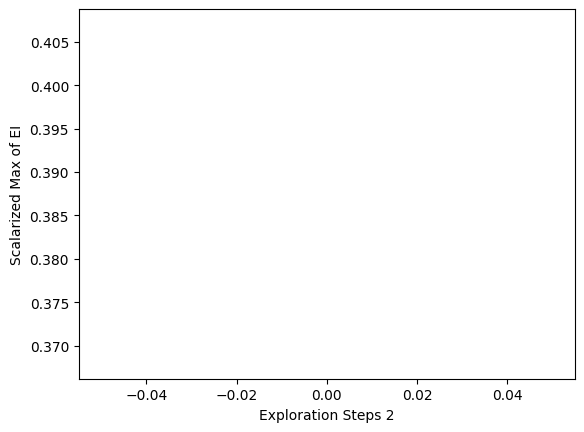

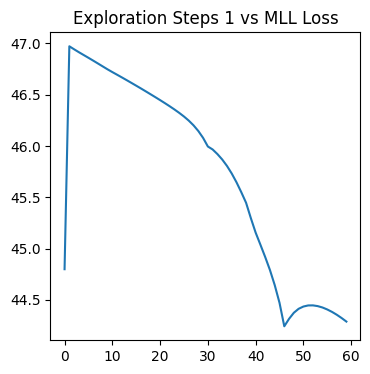

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


11,47


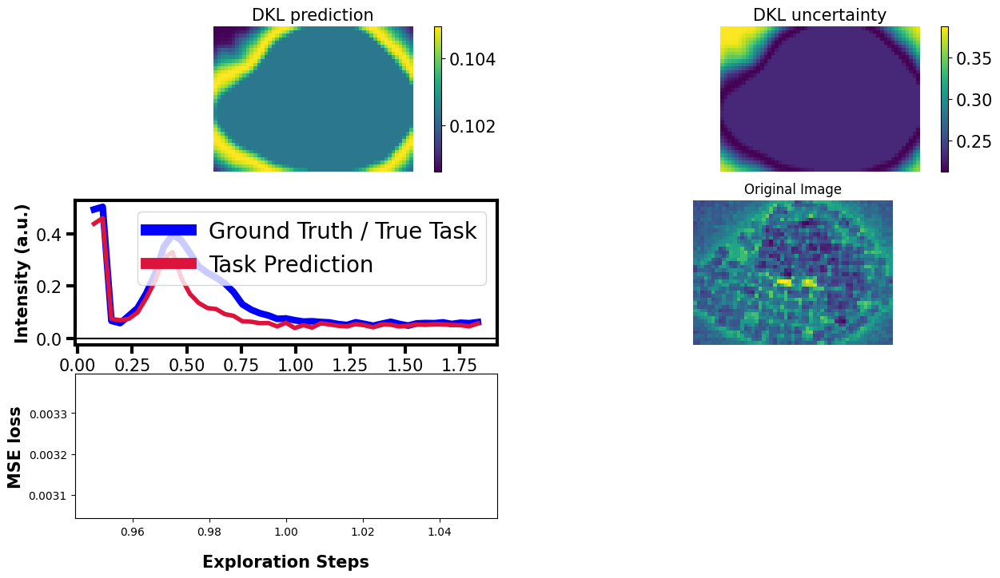

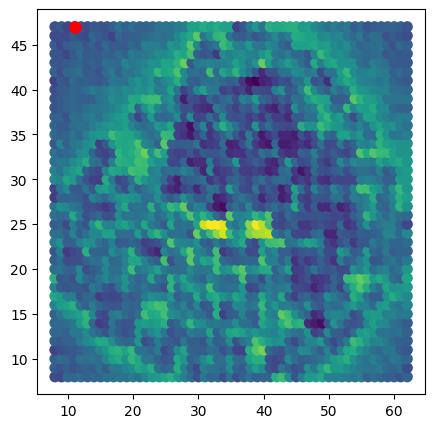

2/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 43.2803
Epoch 10/60 ... Training loss: 45.2375
Epoch 20/60 ... Training loss: 44.8611
Epoch 30/60 ... Training loss: 45.3326
Epoch 40/60 ... Training loss: 44.9294
Epoch 50/60 ... Training loss: 44.2014
Epoch 60/60 ... Training loss: 44.205
Uncertainity based exploration
tensor([[0.2551, 0.2551, 0.2110,  ..., 0.2503, 0.2551, 0.2065],
        [0.2551, 0.2551, 0.2110,  ..., 0.2502, 0.2551, 0.2065],
        [0.2554, 0.2554, 0.2114,  ..., 0.2509, 0.2554, 0.2068],
        ...,
        [0.2555, 0.2555, 0.2114,  ..., 0.2509, 0.2555, 0.2068],
        [0.2554, 0.2554, 0.2114,  ..., 0.2509, 0.2554, 0.2068],
        [0.2555, 0.2555, 0.2114,  ..., 0.2509, 0.2555, 0.2068]])
[[0.25512069 0.25512069 0.21101171 ... 0.25025237 0.25512069 0.20647819]
 [0.25510492 0.25510492 0.21099581 ... 0.25021249 0.25510492 0.20646744]
 [0.25544524 0.25544524 0.21141198 ... 0.2508763  0.25544524 0.20682666]
 ...
 [0.25545208 0.25545208 0.21141901 ... 0.25088693 

<Figure size 640x480 with 0 Axes>

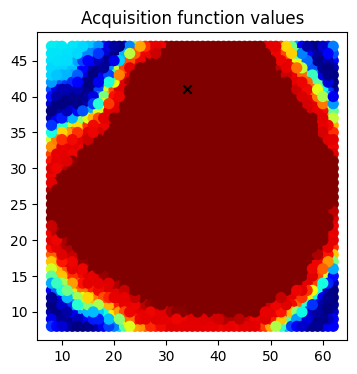

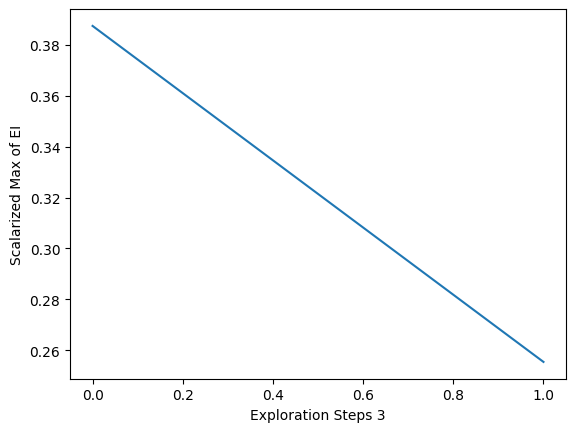

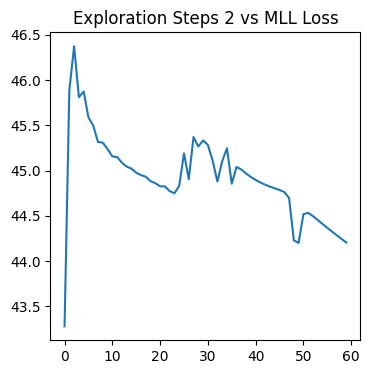

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


34,41


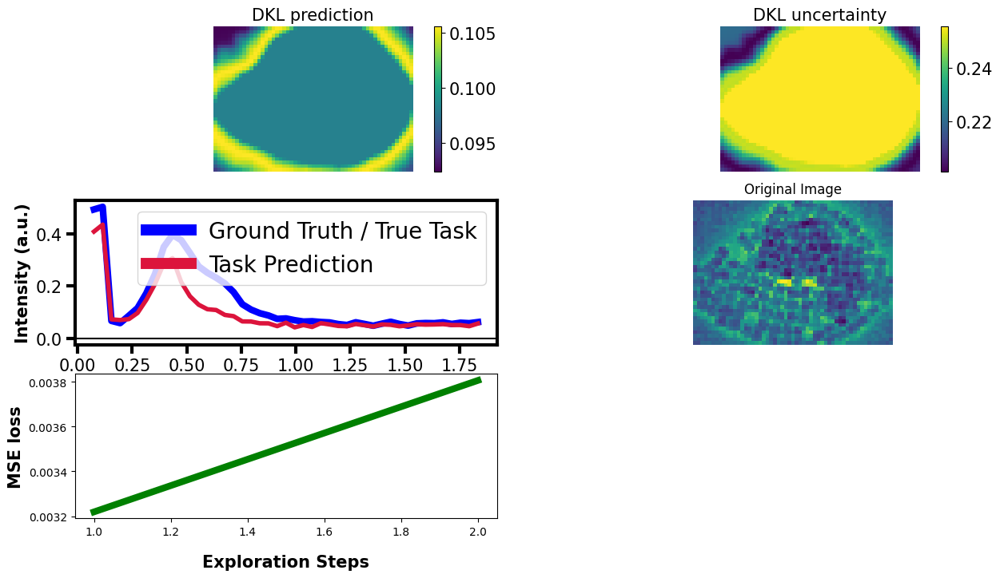

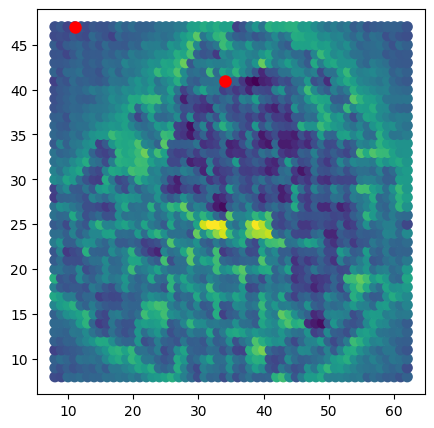

3/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 42.2081
Epoch 10/60 ... Training loss: 43.6172
Epoch 20/60 ... Training loss: 43.3877
Epoch 30/60 ... Training loss: 43.4072
Epoch 40/60 ... Training loss: 42.9505
Epoch 50/60 ... Training loss: 42.6853
Epoch 60/60 ... Training loss: 42.4637
Uncertainity based exploration
tensor([[0.2485, 0.1694, 0.2467,  ..., 0.2324, 0.2343, 0.1470],
        [0.2486, 0.1695, 0.2468,  ..., 0.2325, 0.2343, 0.1470],
        [0.2489, 0.1696, 0.2472,  ..., 0.2329, 0.2347, 0.1470],
        ...,
        [0.2490, 0.1696, 0.2472,  ..., 0.2329, 0.2347, 0.1470],
        [0.2490, 0.1696, 0.2472,  ..., 0.2329, 0.2347, 0.1470],
        [0.2490, 0.1696, 0.2472,  ..., 0.2329, 0.2347, 0.1470]])
[[0.24848522 0.16944884 0.24671946 ... 0.2324241  0.23425957 0.14697855]
 [0.24855767 0.16947809 0.24679227 ... 0.23249573 0.2343315  0.14698343]
 [0.24894685 0.16962133 0.24718866 ... 0.23287287 0.23472187 0.14701263]
 ...
 [0.24895868 0.16962653 0.2472005  ... 0.23288427

<Figure size 640x480 with 0 Axes>

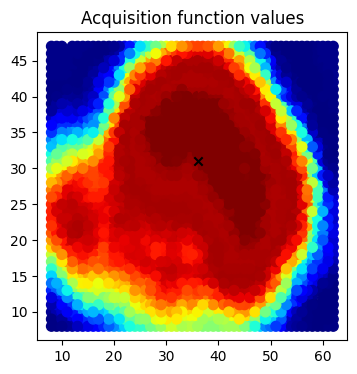

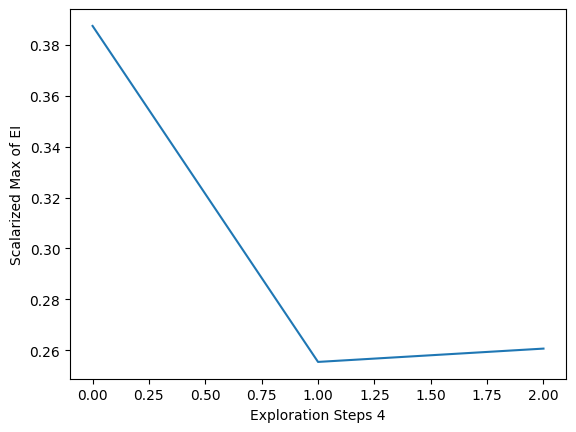

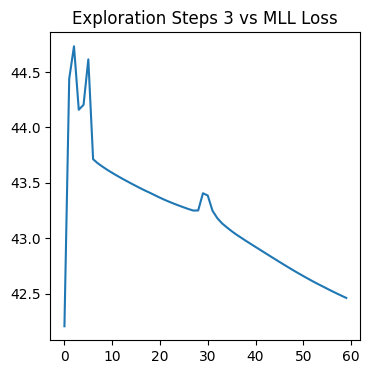

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


36,31


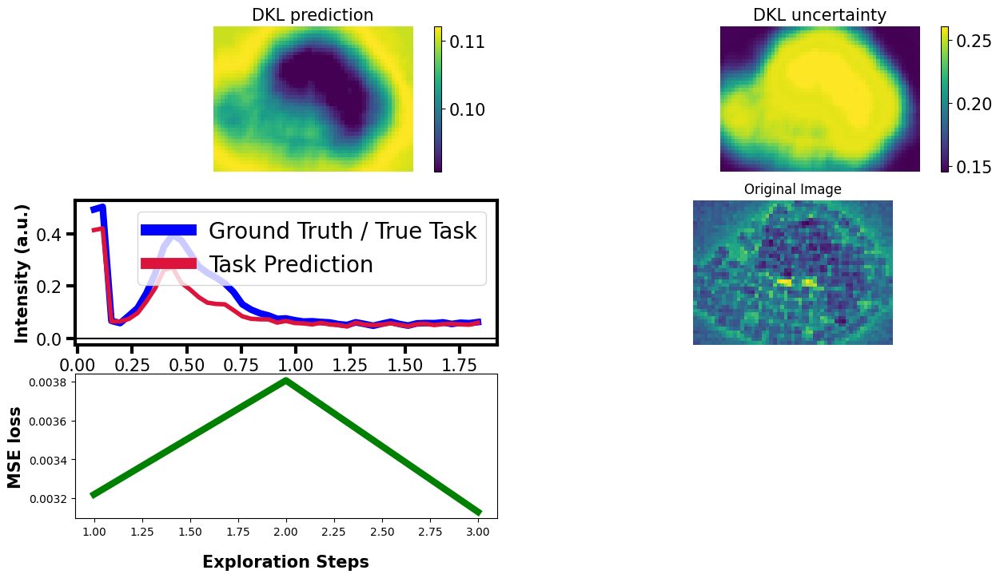

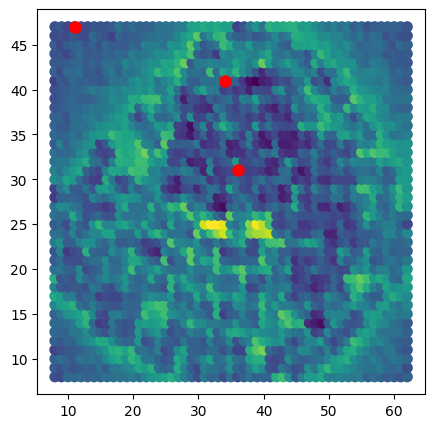

4/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 41.459
Epoch 10/60 ... Training loss: 43.5647
Epoch 20/60 ... Training loss: 43.2842
Epoch 30/60 ... Training loss: 43.0391
Epoch 40/60 ... Training loss: 42.7743
Epoch 50/60 ... Training loss: 42.5441
Epoch 60/60 ... Training loss: 42.3852
Uncertainity based exploration
tensor([[0.2421, 0.1534, 0.2395,  ..., 0.2009, 0.2350, 0.1531],
        [0.2422, 0.1534, 0.2396,  ..., 0.2009, 0.2350, 0.1531],
        [0.2420, 0.1534, 0.2393,  ..., 0.2008, 0.2348, 0.1531],
        ...,
        [0.2420, 0.1534, 0.2393,  ..., 0.2008, 0.2348, 0.1531],
        [0.2420, 0.1534, 0.2393,  ..., 0.2008, 0.2348, 0.1531],
        [0.2420, 0.1534, 0.2393,  ..., 0.2008, 0.2348, 0.1531]])
[[0.24214042 0.15336911 0.23949206 ... 0.20089229 0.23496273 0.15305998]
 [0.24220957 0.15337253 0.23956015 ... 0.20093249 0.23502789 0.15306129]
 [0.24195949 0.1533719  0.23931414 ... 0.20079226 0.23479294 0.15306815]
 ...
 [0.24195807 0.15337274 0.23931274 ... 0.20079181 

<Figure size 640x480 with 0 Axes>

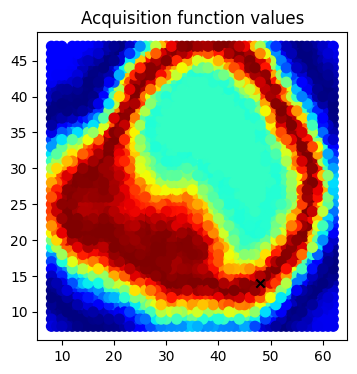

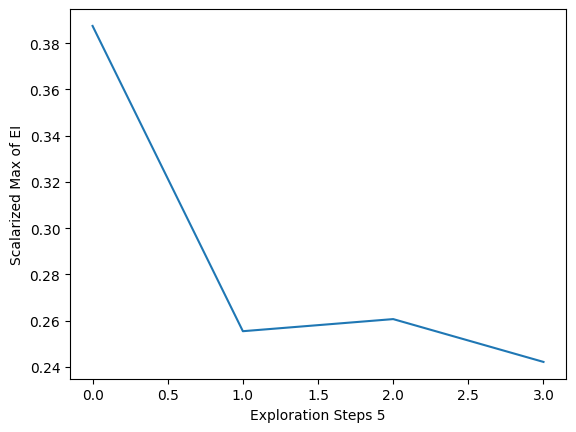

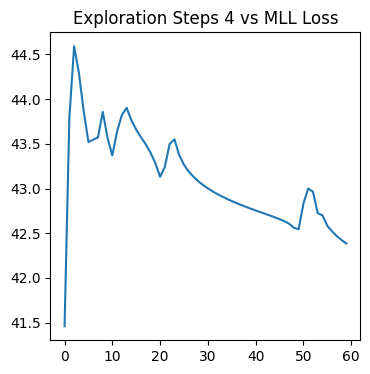

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


48,14


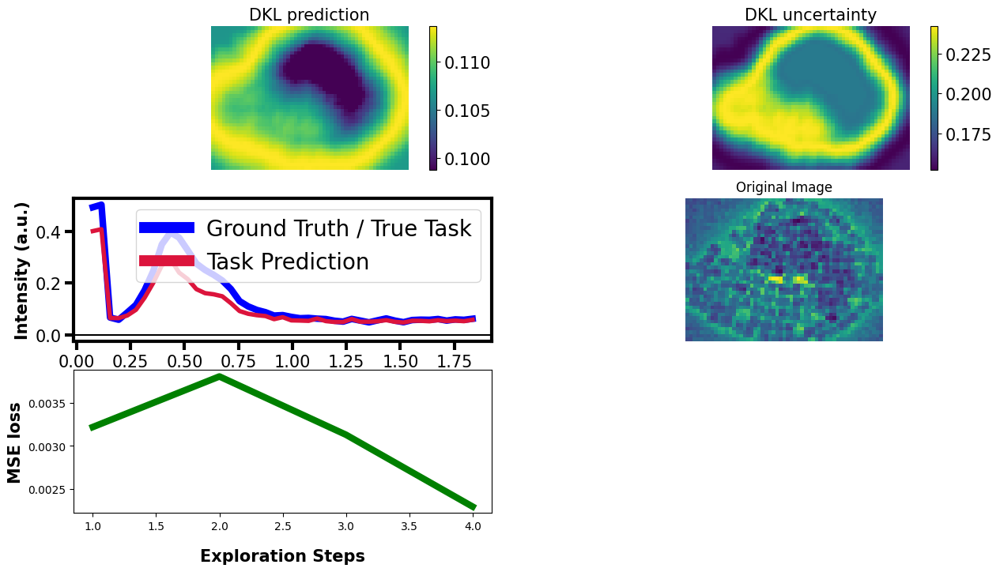

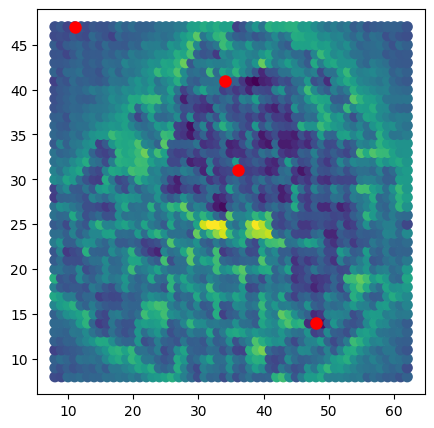

5/6
dtype : torch.float64
Epoch 1/60 ... Training loss: 40.864
Epoch 10/60 ... Training loss: 42.7484
Epoch 20/60 ... Training loss: 42.6219
Epoch 30/60 ... Training loss: 42.3433
Epoch 40/60 ... Training loss: 42.4257
Epoch 50/60 ... Training loss: 42.2232
Epoch 60/60 ... Training loss: 41.9535
Uncertainity based exploration
tensor([[0.1395, 0.1424, 0.1483,  ..., 0.1404, 0.1392, 0.1630],
        [0.1395, 0.1424, 0.1483,  ..., 0.1404, 0.1391, 0.1630],
        [0.1395, 0.1424, 0.1483,  ..., 0.1404, 0.1392, 0.1630],
        ...,
        [0.1395, 0.1424, 0.1483,  ..., 0.1404, 0.1392, 0.1630],
        [0.1395, 0.1424, 0.1483,  ..., 0.1404, 0.1392, 0.1630],
        [0.1395, 0.1424, 0.1483,  ..., 0.1404, 0.1392, 0.1630]])
[[0.13950287 0.14240603 0.14829968 ... 0.14037792 0.13916621 0.16300353]
 [0.13947738 0.14238968 0.1482681  ... 0.14035032 0.13914614 0.16298563]
 [0.13950663 0.1424263  0.14829786 ... 0.14037866 0.13917866 0.16303271]
 ...
 [0.13950699 0.14242691 0.14829821 ... 0.140379   

<Figure size 640x480 with 0 Axes>

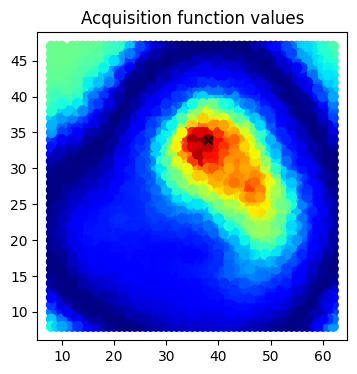

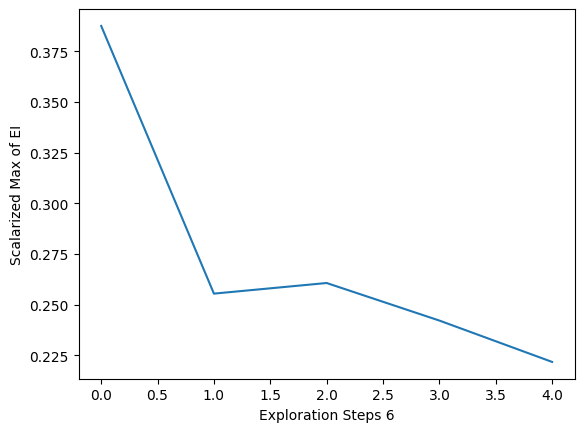

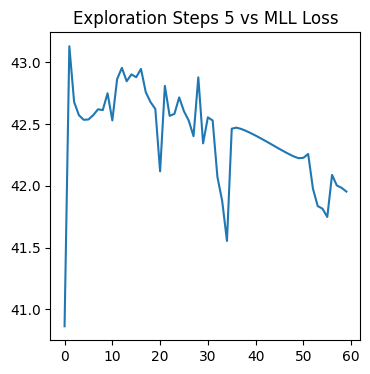

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


38,34


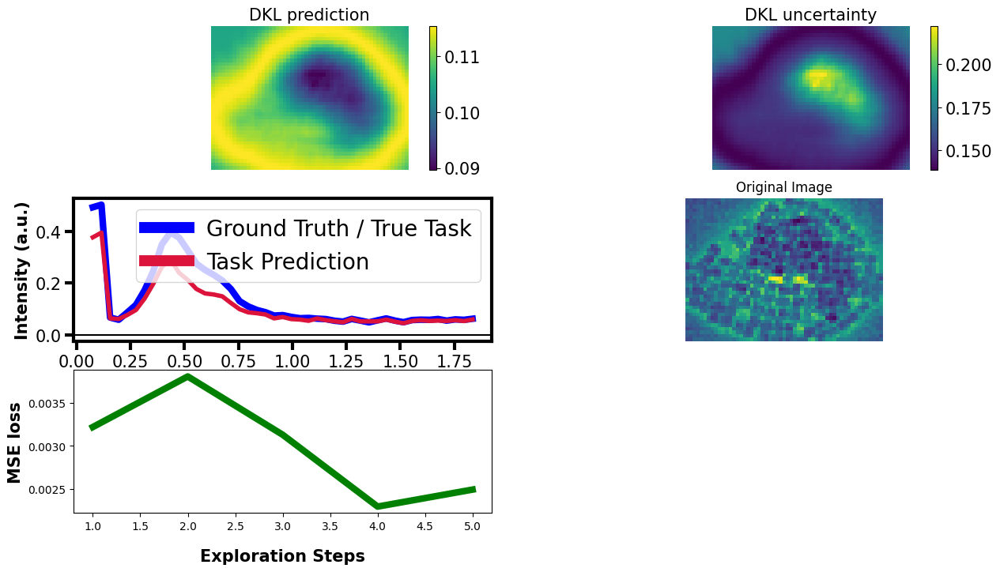

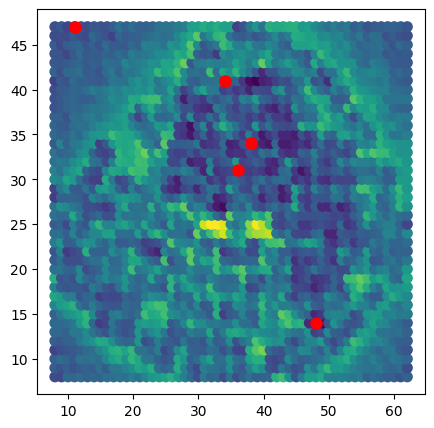

⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠴ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠸ Checking graphges from the workspacekspace
⠼ Checking

Total time taken 142.2963387966156


<Figure size 640x480 with 0 Axes>

In [119]:
X,y,e_reduced,full_img,full_spectrum,index = task_t(3,data_augmentation=False)

# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X.detach().cpu().numpy(), y.T.detach().cpu().numpy(), index, test_size=0.999, shuffle=True, random_state=20)

# The targets for the DKL-GPR must have vector_size x n_samples dimensions where vector_size is equal to spectral length
y_train = y_train.T
y_test = y_test.T

torch.set_default_device('cuda:4')

print("Train X :",X_train.shape) # n_samples x n_features
print("Train y :",y_train.shape) # vector_size x n_samples 

print("Test X :",X_test.shape) # n_samples x n_features
print("Test y :",y_test.shape) # vector_size x n_samples 

torch.save(X_train,"Reptile_AEDKL_CMFlogs/Task3_active_patch_1.pt")
torch.save(y_train,"Reptile_AEDKL_CMFlogs/Task3_active_spectra_1.pt")

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

exploration_steps =  6 # 200 is about 7% of the points --> ~10-15 minute execution time! Note, 100 steps only takes ~3 min

xi = 0.01                # balances exploration and exploitation for EI

################################################################################
import time  # NEW LINE
time_all = []  # NEW LINE
AF_results = []
ei = []
bestf = []
data_dim = X_train.shape[-1]
print(data_dim)

metawriter = cmf.create_context(pipeline_stage="Task 3 Active Learning Preprocessing")
metawriter = cmf.create_execution(execution_type="Task3ActiveLearningReptileProc",
                                  custom_properties={"exploration_steps":exploration_steps-1,
                                                    "training_iter":training_iter,
                                                    "exploration_exploitation":xi})

metawriter = cmf.log_dataset("Reptile_AEDKL_CMFlogs/Task3_active_patch_1.pt","output")
metawriter = cmf.log_dataset("Reptile_AEDKL_CMFlogs/Task3_active_spectra_1.pt","output")
metawriter = cmf.log_model("Reptile_AEDKL_CMFlogs/Reptile_training/base_model_3_reptile_itr.pt",event="input",
                           model_framework="PyTorch",
                           model_type="BaseModel",
                           model_name=f"Reptile_3metamodel")
metawriter = cmf.log_dataset("Reptile_AEDKL_CMFlogs/loadedfile.npy","input")

mseloss = []

original_mean_spectrum = [] 
predicted_mean_spectrum = []


start_time = time.time()
for e in range(1,exploration_steps):
    print("{}/{}".format(e, exploration_steps))
    
    
    training_iter = 60 #if e < 100 else 40  # we do not want to "overfit" our model at the beginning

    # update GP posterior
    #Model
    dklgp_new = dklgpreg.dklGPR(indim = data_dim, embedim = 2, hidden_dim = hidden_dim, feature_extract=deepcopy(reptile_mlp))
    dklgp_new.fit(X_train, y_train, training_cycles=training_iter,lr=1e-3)

    # Compute the acquisition function
    best_f = deepcopy(dklgp_new).predict(X_train)[0].max()
    obj = CE(deepcopy(dklgp_new),X_test)#EI(deepcopy(dklgp_new), X_test, best_f, xi) if e < 60 else CE(dklgp, X_test)

    # SAVE current acquisition function
    AF = save_result(indices_test, obj)
    AF_results.append(AF)

    torch.save(dklgp_new,f"Reptile_AEDKL_CMFlogs/Task3_AL_dklgpr_exp{e+1}.pt")
    
    obj = obj.T # transpose to n_samples x vector_size  for consistency

    # Scalarize the acquisition function
    obj = scalarize_acq(obj)
    
    ei.append(np.max(obj))

    # Select the next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[:, next_point_idx]
    #print(f"y dim {y.T.shape}")
    #print(next_point)

    # Plot current result
    plot_result(indices_test, obj)

    

    plt.plot(range(e), ei)
    plt.xlabel(f"Exploration Steps {e+1}")
    plt.ylabel('Scalarized Max of EI')

    # SAVE current MODEL WEIGHTS
#     state_dict = dklgp_new.gp_model.state_dict()
#     torch.save(state_dict, "AL_Checkpoints/ReptileModel_ActiveDKL {}.pt".format(e))
    Plot_MLL(dklgp_new,e,training_iter)

    idx2,idx1 = next_point
    idx1,idx2 = int(idx1),int(idx2)
    
    mseloss,dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var=spectrum_recconstruction_plotting(model_name = deepcopy(dklgp_new), structural_img=full_img, 
                                      spectral_img=full_spectrum, X_var=X,y_var=y, 
                                      e_red=e_reduced ,indices_=index,mseloss=mseloss,exploration_steps=e,figsize = (15,8), 
                                      energy_range = [0,-1])
    
    print(f"{idx1},{idx2}")
    
    dkl_meas_full = y.T.reshape(dkl_prediction.shape)
    
    # plt.figure(figsize=(10,4))
    # gs = gridspec.GridSpec(1,2)
    # ax1,ax2 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
    # ax1.plot(e_reduced.detach().cpu(),measured_point,label=f'Ground Truth at exp point {e}')
    # #plt.plot(e_reduced.detach().cpu(),dkl_prediction.T[:,idx1,idx2],label=f'Predicted Spectrum {e}')
    # ax1.plot(e_reduced.detach().cpu(),mean[next_point_idx],label=f'Predicted at exp point {e}')
    # plt.legend()
    # ax1.set_xlabel('Energy Loss')
    # ax1.set_ylabel('Spectral Intensity')
    
    original_mean_spectrum.append(np.median(measured_point))
    predicted_mean_spectrum.append(np.median(mean[next_point_idx]))
    # ax2.plot(range(e),original_mean_spectrum,label=f'Original Spectral Intensity at {e}')
    # ax2.plot(range(e),predicted_mean_spectrum,label=f'Predicted Spectral Intensity at {e}')
    # ax2.set_xlabel('Exploration Steps')
    # ax2.set_ylabel('Averate Spectral Intenity at Exploration Points')
    # plt.legend()
    
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point[:, None], 1)
    y_test = np.delete(y_test, next_point_idx, 1)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)
    time_all.append(time.time() - start_time)  # NEW LINE

    torch.save(X_train,f"Reptile_AEDKL_CMFlogs/Task3_active_patch_{e+1}.pt",)
    torch.save(y_train,f"Reptile_AEDKL_CMFlogs/Task3_active_spectra_{e+1}.pt")
    clear_cache()

    plt.figure(figsize=(5, 5))
    plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
    plt.scatter(indices_train[-e:, 1], indices_train[-e:, 0], s=64, c='r')
    plt.show(block=False)
    plt.savefig(f"Reptile_AEDKL_CMFlogs/Task3_Exploration_{e}step.png")

for e in range(1,exploration_steps):
    metawriter = cmf.create_context(pipeline_stage=f"Active Learning Exp {e}")
    metawriter = cmf.create_execution(execution_type=f"ActiveLearningTrainingExp{e}",custom_properties={"exploration_steps":exploration_steps})
    metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Task3_AL_dklgpr_exp{e+1}.pt",
                      event="output",model_framework="PyTorch",model_type="ReptileIntegratedGaussianProcessRegressor",
                      model_name=f"Active_DKLGPR{e+1}")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task3_active_patch_{e+1}.pt","output")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task3_active_spectra_{e+1}.pt","output")
    # metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/acquisition_function_val_{e+1}exp.png","output")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task3_Exploration_{e}step.png","output")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task3_active_patch_{e}.pt","input")
    metawriter = cmf.log_dataset(f"Reptile_AEDKL_CMFlogs/Task3_active_spectra_{e}.pt","input")
    if e!=1:
        metawriter = cmf.log_model(f"Reptile_AEDKL_CMFlogs/Task3_AL_dklgpr_exp{e}.pt",event="input")
    
    
print(f"Total time taken {time.time()-start_time}")

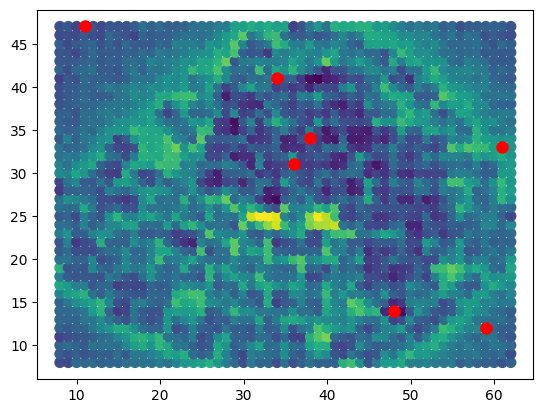

In [120]:
## plt.figure(figsize=(5, 5))
plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
plt.scatter(indices_train[:, 1], indices_train[:, 0], s=64, c='r')

In [ ]:
clear_cache()

specim[task] <class 'numpy.ndarray'>
img[task] <class 'numpy.ndarray'>
coordinates[task] <class 'numpy.ndarray'>
Train x:  (2, 256)
Train y:  (46, 2)
Test x:  (2198, 256)
Test y:  (46, 2198)
1/5
dtype : torch.float64
Epoch 1/55 ... Training loss: 45.097
Epoch 10/55 ... Training loss: 46.748
Epoch 20/55 ... Training loss: 46.4765
Epoch 30/55 ... Training loss: 46.2077
Epoch 40/55 ... Training loss: 45.9352
Epoch 50/55 ... Training loss: 45.6628
Epoch 55/55 ... Training loss: 45.53
Uncertainity based exploration
tensor([[0.4178, 0.3000, 0.2682,  ..., 0.2613, 0.2821, 0.3177],
        [0.4177, 0.3000, 0.2682,  ..., 0.2613, 0.2821, 0.3177],
        [0.4186, 0.3018, 0.2689,  ..., 0.2619, 0.2839, 0.3194],
        ...,
        [0.4186, 0.3019, 0.2690,  ..., 0.2619, 0.2839, 0.3195],
        [0.4186, 0.3018, 0.2690,  ..., 0.2619, 0.2839, 0.3195],
        [0.4186, 0.3019, 0.2690,  ..., 0.2619, 0.2839, 0.3195]])
[[0.41776394 0.2999938  0.26823794 ... 0.26134887 0.28214063 0.31768981]
 [0.41773793 

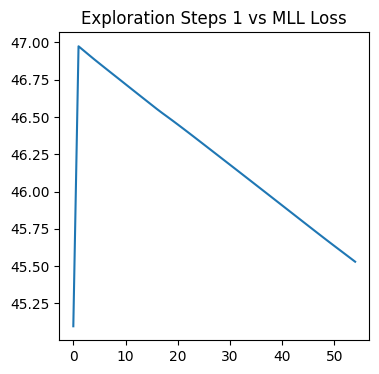

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([40, 55, 46]), dkl_prediction (40, 55, 46)


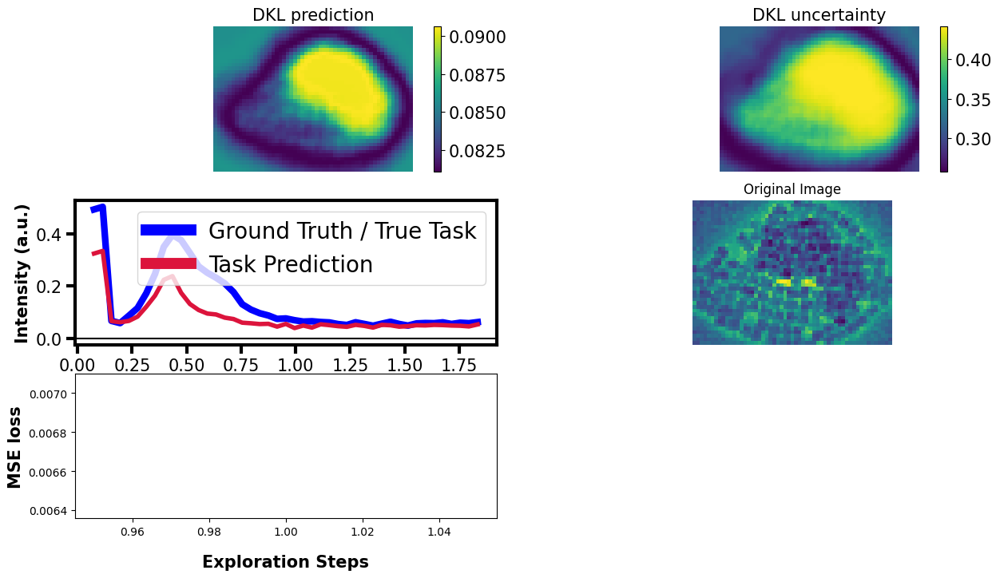

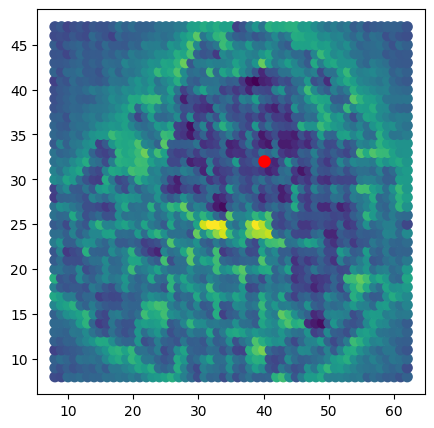

2/5
dtype : torch.float64
Epoch 1/55 ... Training loss: 45.2724
Epoch 10/55 ... Training loss: 45.1351
Epoch 20/55 ... Training loss: 44.7218
Epoch 30/55 ... Training loss: 44.691
Epoch 40/55 ... Training loss: 44.2885
Epoch 50/55 ... Training loss: 43.9927
Epoch 55/55 ... Training loss: 43.8598
Uncertainity based exploration
tensor([[0.3484, 0.2076, 0.1979,  ..., 0.1972, 0.1923, 0.2001],
        [0.3486, 0.2077, 0.1980,  ..., 0.1972, 0.1923, 0.2001],
        [0.3491, 0.2078, 0.1980,  ..., 0.1973, 0.1923, 0.2002],
        ...,
        [0.3491, 0.2078, 0.1980,  ..., 0.1973, 0.1923, 0.2002],
        [0.3491, 0.2078, 0.1980,  ..., 0.1973, 0.1923, 0.2002],
        [0.3491, 0.2078, 0.1980,  ..., 0.1973, 0.1923, 0.2002]])
[[0.34840985 0.20762449 0.19794491 ... 0.19718784 0.19226503 0.20008405]
 [0.34862199 0.20766075 0.19796168 ... 0.19720496 0.19227309 0.20010303]
 [0.34908796 0.20776808 0.19802339 ... 0.19727488 0.19232489 0.20016361]
 ...
 [0.34908792 0.20776933 0.19802478 ... 0.19727639 

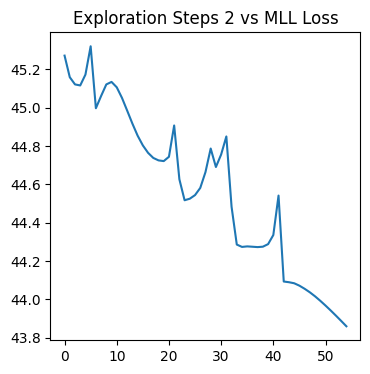

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([40, 55, 46]), dkl_prediction (40, 55, 46)


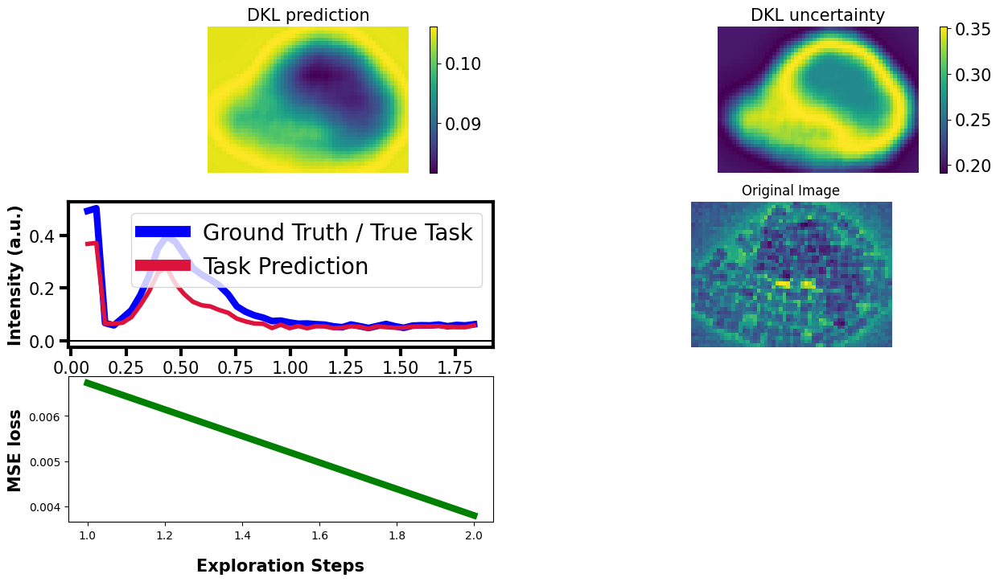

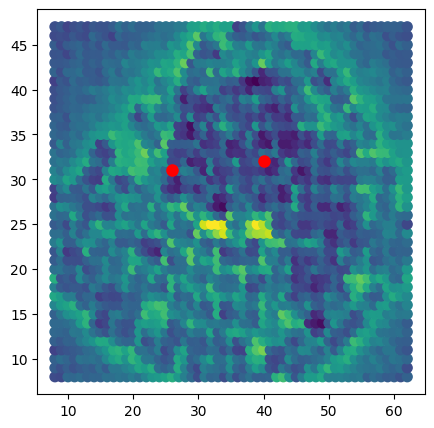

3/5
dtype : torch.float64
Epoch 1/55 ... Training loss: 44.8505
Epoch 10/55 ... Training loss: 43.6982
Epoch 20/55 ... Training loss: 43.9197
Epoch 30/55 ... Training loss: 43.8562
Epoch 40/55 ... Training loss: 43.316
Epoch 50/55 ... Training loss: 42.9675
Epoch 55/55 ... Training loss: 42.8341
Uncertainity based exploration
tensor([[0.1800, 0.1673, 0.2049,  ..., 0.1727, 0.1719, 0.2193],
        [0.1801, 0.1674, 0.2049,  ..., 0.1728, 0.1720, 0.2194],
        [0.1799, 0.1673, 0.2048,  ..., 0.1727, 0.1719, 0.2192],
        ...,
        [0.1799, 0.1673, 0.2048,  ..., 0.1727, 0.1719, 0.2192],
        [0.1799, 0.1673, 0.2048,  ..., 0.1727, 0.1719, 0.2192],
        [0.1799, 0.1673, 0.2048,  ..., 0.1727, 0.1719, 0.2192]])
[[0.18001222 0.16733177 0.20488841 ... 0.17273202 0.1719355  0.21934599]
 [0.18008324 0.16737282 0.20494044 ... 0.17276668 0.17197057 0.21941251]
 [0.17990484 0.16727687 0.20481206 ... 0.17268807 0.17189086 0.2192431 ]
 ...
 [0.17990434 0.16727705 0.20481275 ... 0.17268855 

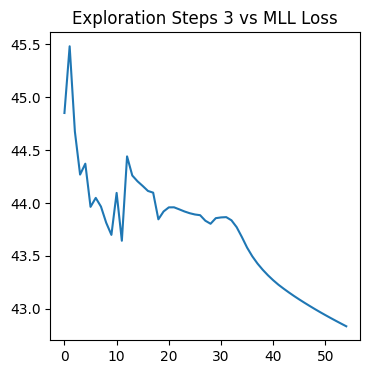

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([40, 55, 46]), dkl_prediction (40, 55, 46)


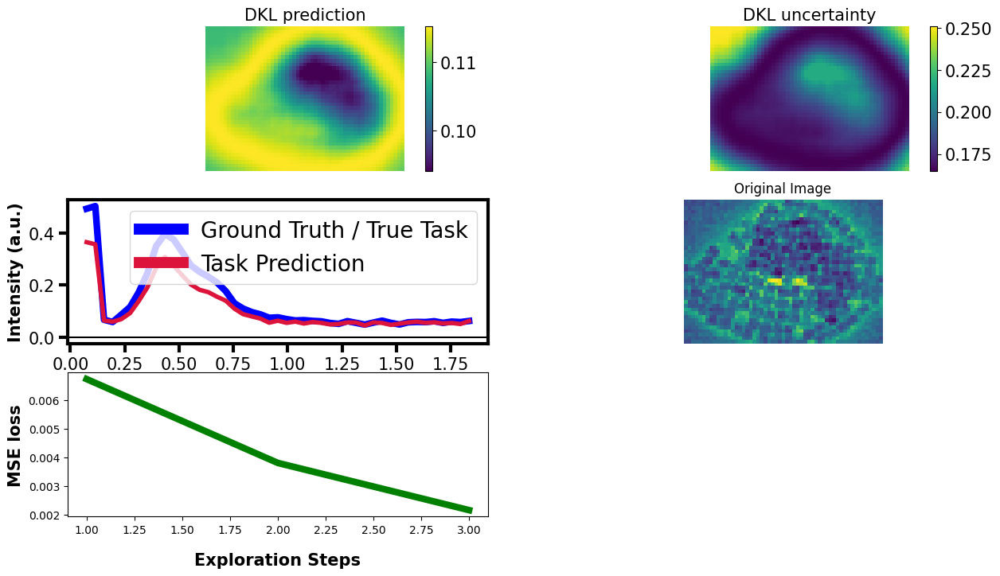

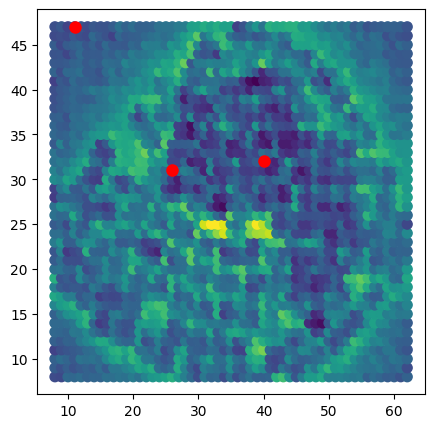

4/5
dtype : torch.float64
Epoch 1/55 ... Training loss: 44.298
Epoch 10/55 ... Training loss: 43.3785
Epoch 20/55 ... Training loss: 43.5679
Epoch 30/55 ... Training loss: 43.3914
Epoch 40/55 ... Training loss: 43.1533
Epoch 50/55 ... Training loss: 42.72
Epoch 55/55 ... Training loss: 42.5921
Uncertainity based exploration
tensor([[0.2044, 0.1929, 0.1495,  ..., 0.1826, 0.1726, 0.1564],
        [0.2044, 0.1929, 0.1495,  ..., 0.1826, 0.1726, 0.1564],
        [0.2044, 0.1928, 0.1495,  ..., 0.1826, 0.1725, 0.1564],
        ...,
        [0.2044, 0.1928, 0.1495,  ..., 0.1826, 0.1725, 0.1564],
        [0.2044, 0.1928, 0.1495,  ..., 0.1826, 0.1725, 0.1564],
        [0.2044, 0.1928, 0.1495,  ..., 0.1826, 0.1725, 0.1564]])
[[0.20437843 0.19288826 0.14952269 ... 0.18258184 0.17256755 0.15637396]
 [0.20440928 0.19294726 0.14952999 ... 0.1826307  0.17260555 0.15637874]
 [0.20438047 0.19284561 0.14954003 ... 0.18255024 0.17254817 0.15639853]
 ...
 [0.2043821  0.19284737 0.14954085 ... 0.1825518  0.

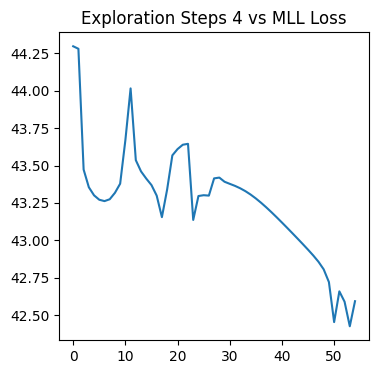

/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)
/home/saranath/.local/lib/python3.8/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


dkl means full torch.Size([40, 55, 46]), dkl_prediction (40, 55, 46)


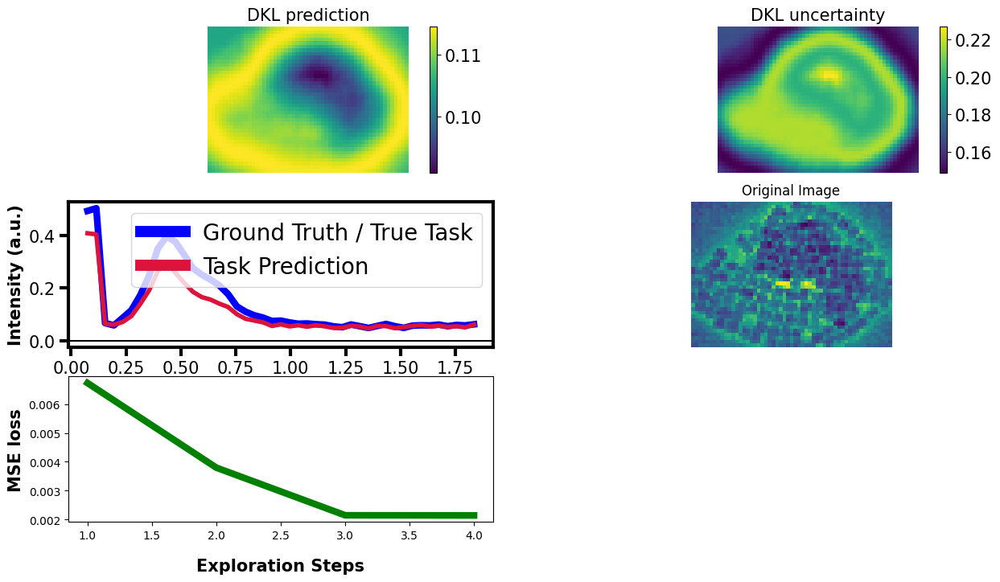

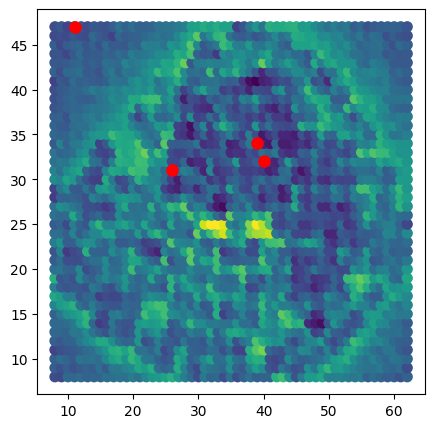

Time taken 11.186559677124023


In [122]:
### clear_cache()


from sklearn.model_selection import train_test_split
from atomai.nets import fcFeatureExtractor

X,y,e_reduced,full_img,full_spectrum,index = task_t(3,data_augmentation=False)

# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid
(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X.detach().cpu().numpy(), y.T.detach().cpu().numpy(), index, test_size=0.999, shuffle=True, random_state=20)

# The targets for the DKL-GPR must have vector_size x n_samples dimensions where vector_size is equal to spectral length
y_train = y_train.T
y_test = y_test.T

print("Train x: ",X_train.shape) # n_samples x n_features
print("Train y: ",y_train.shape) # vector_size x n_samples 

print("Test x: ",X_test.shape) # n_samples x n_features
print("Test y: ",y_test.shape) # vector_size x n_samples 

torch.set_default_device('cuda')
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed) 

exploration_steps = 5 # 200 is about 7% of the points --> ~10-15 minute execution time! Note, 100 steps only takes ~3 min

xi = 0.01                # balances exploration and exploitation for EI

################################################################################
import time  # NEW LINE
time_all = []  # NEW LINE

ei = []
AF_results = []

reg_mseloss = []
reg_original_mean_spectrum = []
reg_predicted_mean_spectrum = []

data_dim = X_train.shape[-1]


start_time = time.time()
for e in range(1,exploration_steps):
    print("{}/{}".format(e, exploration_steps))
    #start_time = time.time()  # NEW LINE
    training_iter = 55 if e < 100 else 40  # we do not want to "overfit" our model at the beginning

    # update GP posterior
    #Model
    dklgp_new = dklgpreg.dklGPR(indim = datadim, embedim = 2, hidden_dim=hidden_dim, feature_extract=deepcopy(fcFeatureExtractor(feat_dim=256,embedim=2)))
    dklgp_new.fit(X_train, y_train, training_cycles=training_iter,lr=1e-3)

    # Compute the acquisition function
    best_f = deepcopy(dklgp_new).predict(X_train)[0].max()
    obj = CE(deepcopy(dklgp_new),X_test)#EI(deepcopy(dklgp_new), X_test, best_f, xi)

    # SAVE current acquisition function
    AF = save_result(indices_test, obj)
    AF_results.append(AF)

    obj = obj.T # transpose to n_samples x vector_size  for consistency
  
    # Scalarize the acquisition function
    obj = scalarize_acq(obj)
    
    ei.append(np.max(obj))

    # Select the next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[:, next_point_idx]
    
    # idx2,idx1 = next_point
    # idx1,idx2 = int(idx1),int(idx2)
    
    # print(idx1,idx2)
    

    # # Plot current result
    # plot_result(indices_test, obj, e)

    # plt.plot(range(e), ei)
    # plt.xlabel(f"Exploration Steps {e}")
    # plt.ylabel('Scalarized Max of EI')

    # SAVE current MODEL WEIGHTS
#     state_dict = dklgp_new.gp_model.state_dict()
    #torch.save(state_dict, "Model_ActiveDKL {}.pt".format(e))
    
    Plot_MLL(dklgp_new,e,training_iter)
    
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point[:, None], 1)
    y_test = np.delete(y_test, next_point_idx, 1)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)
    time_all.append(time.time() - start_time)  # NEW LINE
    
    reg_mseloss, dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var = spectrum_recconstruction_plotting(model_name = deepcopy(dklgp_new), structural_img=full_img, 
                                      spectral_img=full_spectrum, X_var=X,y_var=y, 
                                      e_red=e_reduced ,indices_=index,mseloss=reg_mseloss,exploration_steps=e,figsize = (15,8), 
                                      energy_range = [0,-1])
    
    dkl_meas_full = y.T.reshape(dkl_prediction.shape)
    
    print(f"dkl means full {dkl_meas_full.shape}, dkl_prediction {dkl_prediction.shape}")
    
    dkl_meas_full = y.T.reshape(dkl_prediction.shape)
    
    # plt.figure(figsize=(10,4))
    # gs = gridspec.GridSpec(1,2)
    # ax1,ax2 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
    # ax1.plot(e_reduced.detach().cpu(),measured_point,label=f'Ground Truth at exp point {e}')
    # #plt.plot(e_reduced.detach().cpu(),dkl_prediction.T[:,idx1,idx2],label=f'Predicted Spectrum {e}')
    # ax1.plot(e_reduced.detach().cpu(),mean[next_point_idx],label=f'Predicted at exp point {e}')
    # ax1.legend()
    # ax1.set_xlabel('Energy Loss')
    # ax1.set_ylabel('Spectral Intensity')
    
    reg_original_mean_spectrum.append(np.median(measured_point))
    reg_predicted_mean_spectrum.append(np.median(mean[next_point_idx]))
    # ax2.plot(range(e),reg_original_mean_spectrum,label=f'Original Spectral Intensity at {e}')
    # ax2.plot(range(e),reg_predicted_mean_spectrum,label=f'Predicted Spectral Intensity at {e}')
    # ax2.set_xlabel('Exploration Steps')
    # ax2.set_ylabel('Averate Spectral Intenity at Exploration Points')
    # plt.legend()
    
    plt.figure(figsize=(5, 5))
    plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
    plt.scatter(indices_train[-e:, 1], indices_train[-e:, 0], s=64, c='r')
    plt.show(block=False)
    clear_cache()
    
    

print(f"Time taken {time.time()-start_time}")

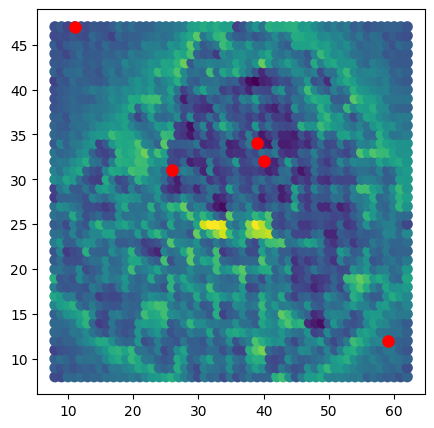

In [123]:
plt.figure(figsize=(5, 5))
plt.scatter(index[:, 1], index[:, 0], s=50, c=scalarize_acq(y.T.detach().cpu().numpy()))
plt.scatter(indices_train[-5:, 1], indices_train[-5:, 0], s=64, c='r')

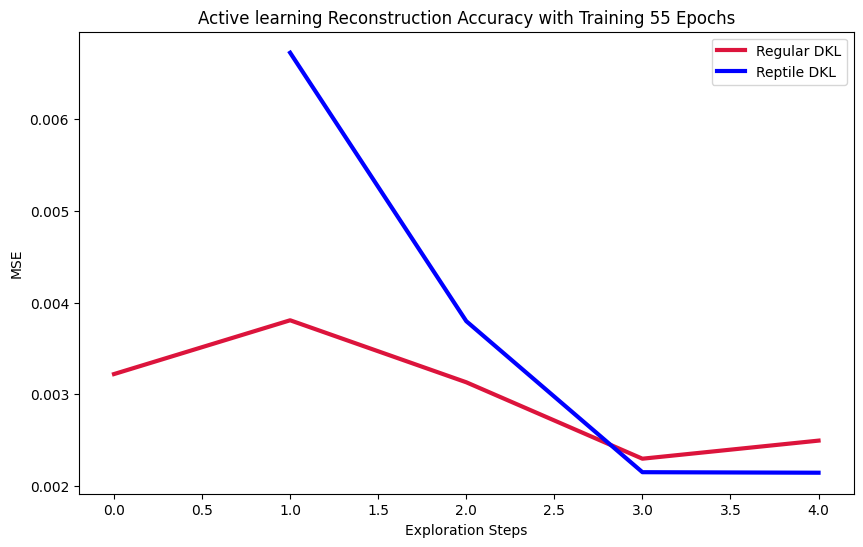

In [125]:
plt.figure(figsize=(10,6))
plt.title(f"Active learning Reconstruction Accuracy with Training {training_iter} Epochs")
plt.plot(range(exploration_steps),mseloss,label='Regular DKL',c='crimson',linewidth=3)
plt.plot(range(1,exploration_steps),reg_mseloss,label='Reptile DKL',c='blue',linewidth=3)
plt.xlabel('Exploration Steps')
plt.ylabel('MSE')
plt.legend()